# **Libraries**

In [ ]:
%%capture

!pip install shap
!pip install optuna
!pip install cmaes
!pip install scikit-learn==1.5.2

In [ ]:
seed = 7

# Basics
import pandas as pd
import numpy as np

# Graphs
import matplotlib.pyplot as plt

# Preprocessing
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import confusion_matrix

# Models
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

# Optuna
import optuna
from optuna.samplers import RandomSampler, TPESampler, CmaEsSampler
from optuna.visualization import plot_optimization_history

The 'functions_pred_cruzada' file contains the functions that will be used to select, preprocess, train and validate the machine learning models.

In [ ]:
!gdown 1uVoArwRTJmvbyFLyFniwFvWGHMfiNIWO --quiet

from functions_pred_cruzada import *

# **Data**

In [ ]:
# Downloading the file containing cancer types
!gdown 1l4ntkr4XJkxzNp7odnONu68ypwuJyZ8p --quiet  # Most common types

# Reading the dataset
df = pd.read_csv('incid.csv')  # Load the CSV file into a DataFrame
print(df.shape)  # Display the shape (number of rows and columns) of the dataset
df.head(3)  # Show the first three rows of the DataFrame

(521682, 32)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,TOPO,TOPOGRUP,EC,TRATHOSP,NENHUM,...,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec,obito_geral,sobrevida_ano1,sobrevida_ano3,sobrevida_ano5
0,79,1,3518701,9,1,C199,C19,IIIB,E,0,...,7,3518701,1,2.0,1,0,1,1,0,0
1,68,2,3518701,9,1,C180,C18,IIA,E,0,...,7,3518701,1,2.0,1,0,1,1,1,0
2,51,2,3518701,2,1,C180,C18,IIIA,E,0,...,7,3518701,1,3.0,1,0,1,0,0,0


In [ ]:
# Data Preparation

# Breast Cancer
df_mama = df[df.TOPOGRUP.isin(['C50'])]  # Filter for breast cancer cases
df_mama = df_mama[~((df_mama.obito_geral == 0) & (df_mama.sobrevida_ano3 == 0))].reset_index(drop=True)  # Remove cases with unknown survival status

# Skin Cancer
df_pele = df[df.TOPOGRUP.isin(['C44'])]  # Filter for skin cancer cases
df_pele = df_pele[~((df_pele.obito_geral == 0) & (df_pele.sobrevida_ano3 == 0))].reset_index(drop=True)  # Remove cases with unknown survival status

# Prostate Cancer
df_prost = df[df.TOPOGRUP.isin(['C61'])]  # Filter for prostate cancer cases
df_prost = df_prost[~((df_prost.obito_geral == 0) & (df_prost.sobrevida_ano3 == 0))].reset_index(drop=True)  # Remove cases with unknown survival status

# Colorectal Cancer
df_colo = df[df.TOPOGRUP.isin(['C18', 'C19', 'C20'])]  # Filter for colorectal cancer cases
df_colo = df_colo[~((df_colo.obito_geral == 0) & (df_colo.sobrevida_ano3 == 0))].reset_index(drop=True)  # Remove cases with unknown survival status

# Lung Cancer
df_pulm = df[df.TOPOGRUP.isin(['C34'])]  # Filter for lung cancer cases
df_pulm = df_pulm[~((df_pulm.obito_geral == 0) & (df_pulm.sobrevida_ano3 == 0))].reset_index(drop=True)  # Remove cases with unknown survival status

# Cervical Cancer
df_colo_utero = df[df.TOPOGRUP.isin(['C53'])]  # Filter for cervical cancer cases
df_colo_utero = df_colo_utero[~((df_colo_utero.obito_geral == 0) & (df_colo_utero.sobrevida_ano3 == 0))].reset_index(drop=True)  # Remove cases with unknown survival status

# Display the shape (number of rows and columns) for each dataset
df_mama.shape, df_pele.shape, df_prost.shape, df_colo.shape, df_pulm.shape, df_colo_utero.shape

((104532, 32),
 (100884, 32),
 (83445, 32),
 (56111, 32),
 (37005, 32),
 (21470, 32))

# **Breast**

In [ ]:
# Display the shape (number of rows and columns) of the breast cancer dataset
print(df_mama.shape)

# Show the first three rows of the dataset to inspect its structure and values
df_mama.head(3)

(104532, 32)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,TOPO,TOPOGRUP,EC,TRATHOSP,NENHUM,...,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec,obito_geral,sobrevida_ano1,sobrevida_ano3,sobrevida_ano5
0,41,2,3548500,9,1,C504,C50,IIIB,E,0,...,7,3518701,1,3.0,0,0,0,1,1,1
1,33,2,3518701,9,1,C509,C50,IV,E,0,...,7,3518701,1,4.0,1,0,1,0,0,0
2,79,2,3518701,9,1,C500,C50,IIA,I,0,...,7,3518701,1,2.0,1,0,1,1,1,1


In [ ]:
# Missing values
df_mama.isna().sum().sort_values(ascending=False).head(6)

,0
IDADE,0
SEXO,0
sobrevida_ano3,0
sobrevida_ano1,0
obito_geral,0
presenca_rec,0


In [ ]:
# Compute the correlation matrix for numerical features in the breast cancer dataset
corr_matrix = df_mama.corr(numeric_only=True)

# Get the absolute correlation values with the target variable 'sobrevida_ano3',
# sort them in descending order, and display the top 20 most correlated features
abs(corr_matrix['sobrevida_ano3']).sort_values(ascending=False).head(20)

,sobrevida_ano3
sobrevida_ano3,1.000000
sobrevida_ano5,0.567784
obito_geral,0.567519
sobrevida_ano1,0.521975
CIRURGIA,0.295235
HORMONIO,0.279860
TRATCONS,0.182480
DIAGTRAT,0.180507
NENHUM,0.178029
presenca_rec,0.145265


In [ ]:
# Count the number of patients in each class of the target variable 'sobrevida_ano3'
df_mama.sobrevida_ano3.value_counts()

,count
sobrevida_ano3,
1,83811
0,20721


## **Preprocessing**

In [ ]:
# Preprocessed data setup

# List of columns to drop from the dataset, including treatment-related, tumor location, and other survival indicators
list_drop = ['TRATHOSP', 'TOPO', 'TOPOGRUP', 'NENHUM', 'TRATCONS', 'obito_geral',
             'sobrevida_ano1', 'sobrevida_ano5']

# Target variable for classification
lb = 'sobrevida_ano3'

# Perform preprocessing, including feature selection, encoding, and normalization
# Returns training and test sets (features and labels), feature column names, encoder, and normalization method
X_train, X_test, y_train, y_test, feat_cols, enc, norm = preprocessing(df_mama,
                                                                       list_drop, lb,
                                                                       norm_name='StandardScaler',
                                                                       return_enc_norm=True,
                                                                       random_state=seed)

X_train = (78399, 23), X_test = (26133, 23)
y_train = (78399,), y_test = (26133,)


In [ ]:
# Training dataset for Breast Cancer

# Create a DataFrame for training data with selected features
mama_treino = pd.DataFrame(X_train, columns=feat_cols)

# Add the 'TOPOGRUP' column to indicate the cancer type (here, 'Mama' for Breast Cancer)
mama_treino['TOPOGRUP'] = 'Mama'

# Add the target variable (survival after 3 years) to the training dataset
mama_treino['sobrevida_3anos'] = y_train.values

# Testing dataset for Breast Cancer

# Create a DataFrame for testing data with selected features
mama_teste = pd.DataFrame(X_test, columns=feat_cols)

# Add the 'TOPOGRUP' column to indicate the cancer type (here, 'Mama' for Breast Cancer)
mama_teste['TOPOGRUP'] = 'Mama'

# Add the target variable (survival after 3 years) to the testing dataset
mama_teste['sobrevida_3anos'] = y_test.values

In [ ]:
# Feature columns
feat_cols

Index(['IDADE', 'SEXO', 'IBGE', 'CATEATEND', 'DIAGPREV', 'EC', 'CIRURGIA',
       'RADIO', 'QUIMIO', 'HORMONIO', 'TMO', 'IMUNO', 'OUTROS', 'CONSDIAG',
       'DIAGTRAT', 'ANODIAG', 'DRS', 'RRAS', 'IBGEATEN', 'HABILIT2',
       'ESCOLARI_preench', 'IBGE_idem_IBGEATEN', 'presenca_rec'],
      dtype='object')

## **Training and validation of machine learning models**

### **XGBoost**


#### **Base model**

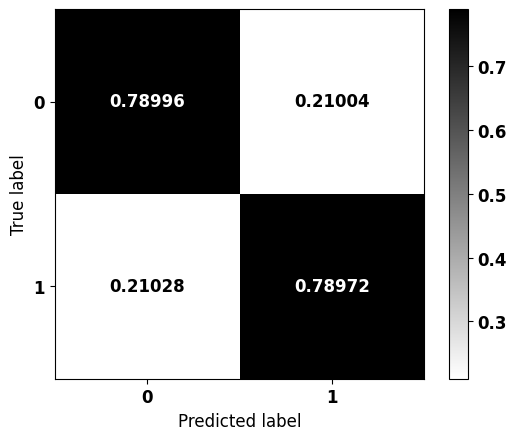


              precision    recall  f1-score   support

           0    0.48153   0.78996   0.59833      5180
           1    0.93830   0.78972   0.85762     20953

    accuracy                        0.78977     26133
   macro avg    0.70991   0.78984   0.72798     26133
weighted avg    0.84776   0.78977   0.80623     26133



In [ ]:
# Creating and training the XGBoost model
# Initialize an XGBoost classifier with specified parameters
xgb = XGBClassifier(max_depth=4,               # Set maximum tree depth to 4
                    scale_pos_weight=0.2197,   # Adjust class imbalance using scale_pos_weight
                    random_state=seed)         # Ensure reproducibility

# Train the model using the training dataset
xgb.fit(X_train, y_train)

# Confusion matrix
# Generate and display the confusion matrix for model evaluation
plot_confusion_matrix(xgb, X_test, y_test)

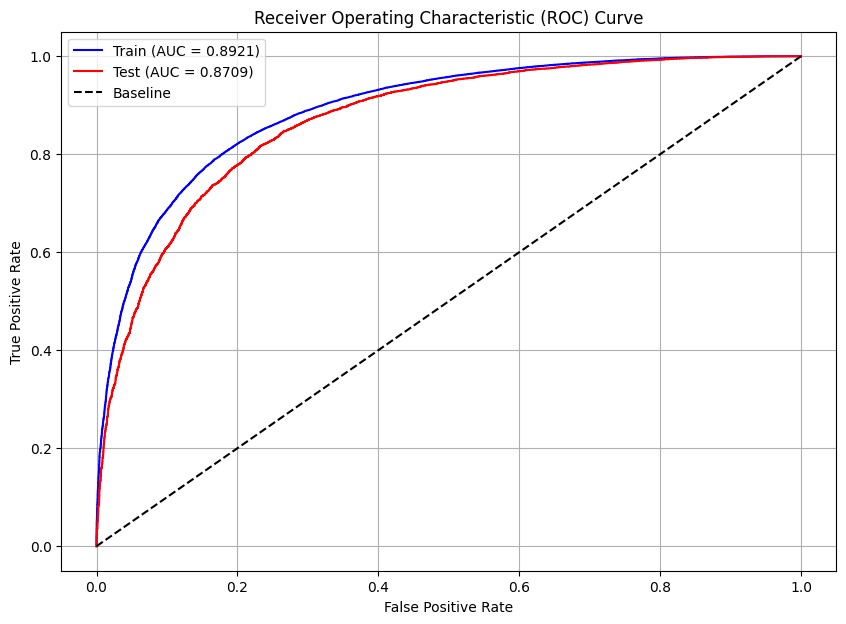

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb, X_train, X_test, y_train, y_test)

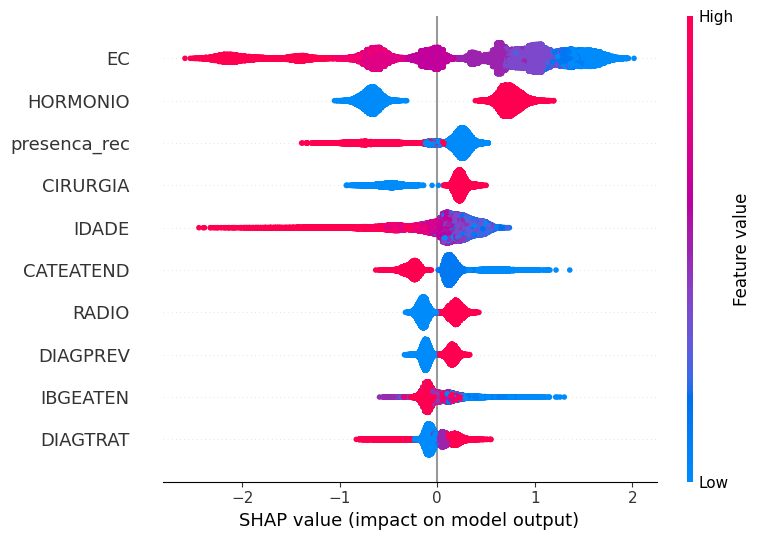

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(xgb, X_train, feat_cols)

#### **Optuna**

In [ ]:
# Creating stratified folds with the same class proportions
skf = StratifiedKFold(10, shuffle=True, random_state=seed)

# Function defining the model and its hyperparameters, which will be optimized
# to maximize the evaluation metric
def objective(trial):

    # Hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 50, 150)  # Number of trees
    max_depth = trial.suggest_int('max_depth', 3, 6)  # Maximum tree depth
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.2, step=0.05)  # Learning rate
    gamma = trial.suggest_float('gamma', 0.0, 0.3, step=0.1)  # Regularization term
    min_child_weight = trial.suggest_int('min_child_weight', 1, 7)  # Minimum sum of weights in a child node
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.3, 0.7, step=0.1)  # Fraction of features sampled per tree

    # XGBoost classifier with suggested hyperparameters
    cls = XGBClassifier(n_estimators=n_estimators,
                        max_depth=max_depth,
                        learning_rate=learning_rate,
                        gamma=gamma,
                        min_child_weight=min_child_weight,
                        colsample_bytree=colsample_bytree,
                        random_state=seed,
                        n_jobs=-1)

    # Performing cross-validation and returning the mean accuracy score
    return cross_val_score(cls, X_train, y_train,
                           cv=skf, scoring='accuracy').mean()

##### RandomSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=RandomSampler(seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 116,
 'max_depth': 5,
 'learning_rate': 0.2,
 'gamma': 0.0,
 'min_child_weight': 4,
 'colsample_bytree': 0.4}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(0.21, 0.24, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:
        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

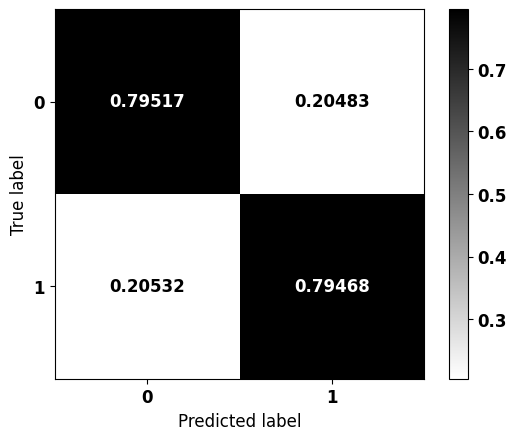


              precision    recall  f1-score   support

           0    0.48913   0.79517   0.60569      5180
           1    0.94010   0.79468   0.86130     20953

    accuracy                        0.79478     26133
   macro avg    0.71462   0.79493   0.73349     26133
weighted avg    0.85071   0.79478   0.81063     26133



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 0.2254  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_rand = XGBClassifier()
xgb_rand.set_params(**params)

# Training the optimized model on the training dataset
xgb_rand.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_rand, X_test, y_test)

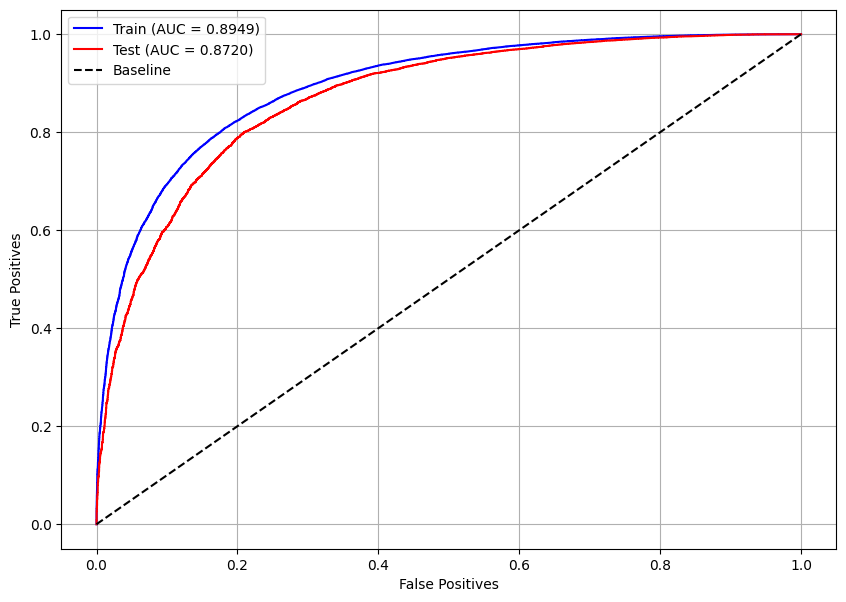

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_rand, X_train, X_test, y_train, y_test)

##### TPESampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=TPESampler(seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 149,
 'max_depth': 6,
 'learning_rate': 0.15000000000000002,
 'gamma': 0.0,
 'min_child_weight': 2,
 'colsample_bytree': 0.5}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(0.21, 0.24, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:
        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

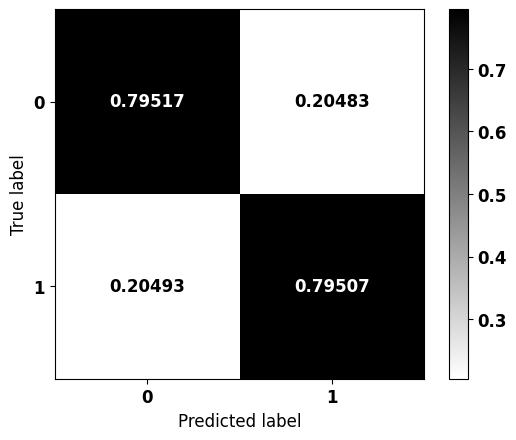


              precision    recall  f1-score   support

           0    0.48960   0.79517   0.60605      5180
           1    0.94012   0.79507   0.86153     20953

    accuracy                        0.79509     26133
   macro avg    0.71486   0.79512   0.73379     26133
weighted avg    0.85082   0.79509   0.81089     26133



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 0.2137  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_tpe = XGBClassifier()
xgb_tpe.set_params(**params)

# Training the optimized model on the training dataset
xgb_tpe.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_tpe, X_test, y_test)

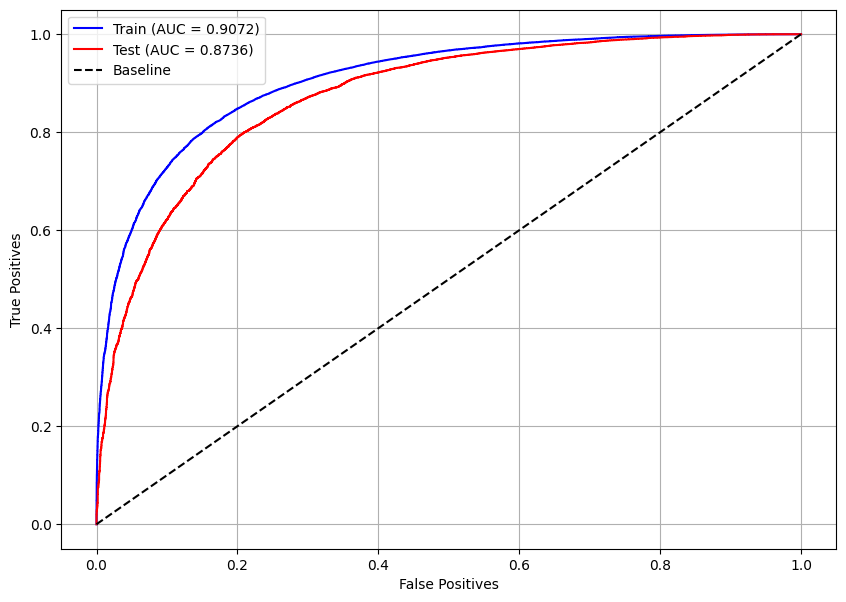

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_tpe, X_train, X_test, y_train, y_test)

##### CmaEsSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=CmaEsSampler(seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 114,
 'max_depth': 6,
 'learning_rate': 0.15000000000000002,
 'gamma': 0.1,
 'min_child_weight': 3,
 'colsample_bytree': 0.5}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(0.215, 0.23, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:
        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

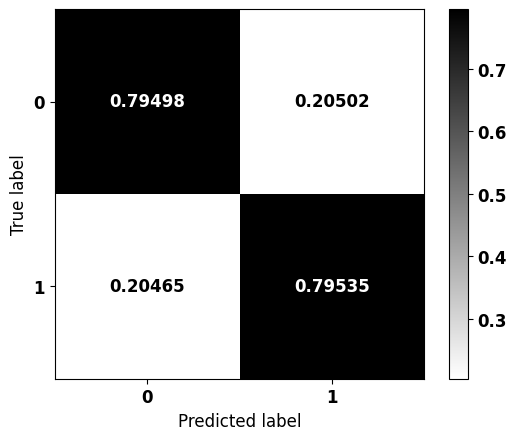


              precision    recall  f1-score   support

           0    0.48989   0.79498   0.60621      5180
           1    0.94009   0.79535   0.86169     20953

    accuracy                        0.79528     26133
   macro avg    0.71499   0.79517   0.73395     26133
weighted avg    0.85085   0.79528   0.81105     26133



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 0.2196  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_cma = XGBClassifier()
xgb_cma.set_params(**params)

# Training the optimized model on the training dataset
xgb_cma.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_cma, X_test, y_test)

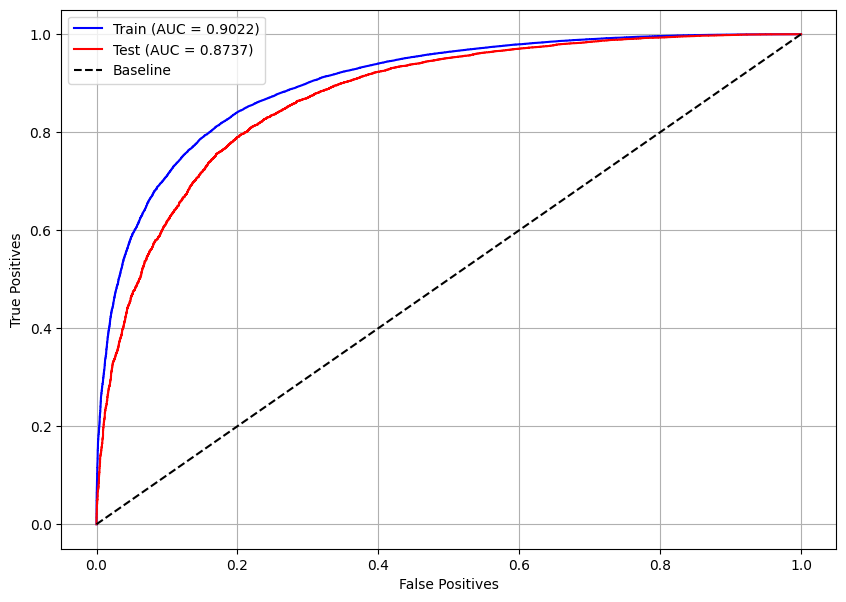

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_cma, X_train, X_test, y_train, y_test)

##### Optimized model

In [ ]:
# Selecting the best model based on performance
models = [xgb_rand, xgb_tpe, xgb_cma]  # List of trained models
best = models[0]  # Initialize the best model as the first in the list

# Iterate through the models to find the one with the highest accuracy score
for i, m in enumerate(models):
    if i == 0:
        continue  # Skip the first model since it's already assigned as 'best'

    best_score = best.score(X_test, y_test)  # Accuracy of the current best model
    score = m.score(X_test, y_test)  # Accuracy of the current model being evaluated

    if score > best_score:  # Update 'best' if the current model has a higher score
        best = m

# Print the best-performing model
print(best)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.5, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.15, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=3, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=114, n_jobs=None,
              num_parallel_tree=None, random_state=7, ...)


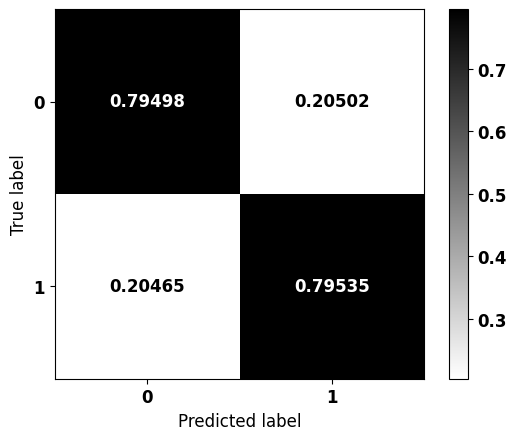


              precision    recall  f1-score   support

           0    0.48989   0.79498   0.60621      5180
           1    0.94009   0.79535   0.86169     20953

    accuracy                        0.79528     26133
   macro avg    0.71499   0.79517   0.73395     26133
weighted avg    0.85085   0.79528   0.81105     26133



In [ ]:
# Training the final XGBoost model using the best parameters
# Retrieve the best hyperparameters from the selected model
params = best.get_params()

# Initialize a new XGBoost classifier with the best parameters
xgb_optuna = XGBClassifier()
xgb_optuna.set_params(**params)

# Train the optimized model on the training data
xgb_optuna.fit(X_train, y_train)

# Plot the confusion matrix to evaluate the model's performance on the test set
plot_confusion_matrix(xgb_optuna, X_test, y_test)

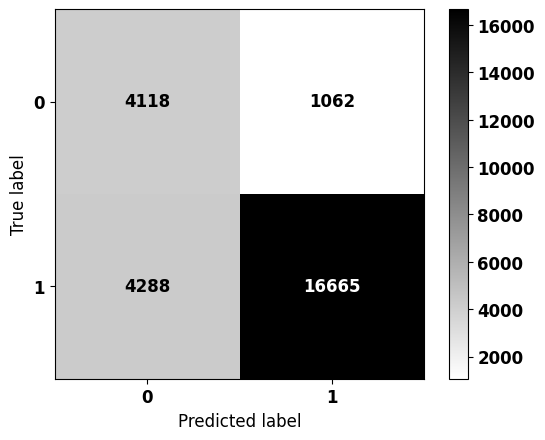


              precision    recall  f1-score   support

           0    0.48989   0.79498   0.60621      5180
           1    0.94009   0.79535   0.86169     20953

    accuracy                        0.79528     26133
   macro avg    0.71499   0.79517   0.73395     26133
weighted avg    0.85085   0.79528   0.81105     26133



In [ ]:
# Plot the confusion matrix for the optimized XGBoost model
# Set norm=False to display absolute values instead of normalized percentages
plot_confusion_matrix(xgb_optuna, X_test, y_test, norm=False)

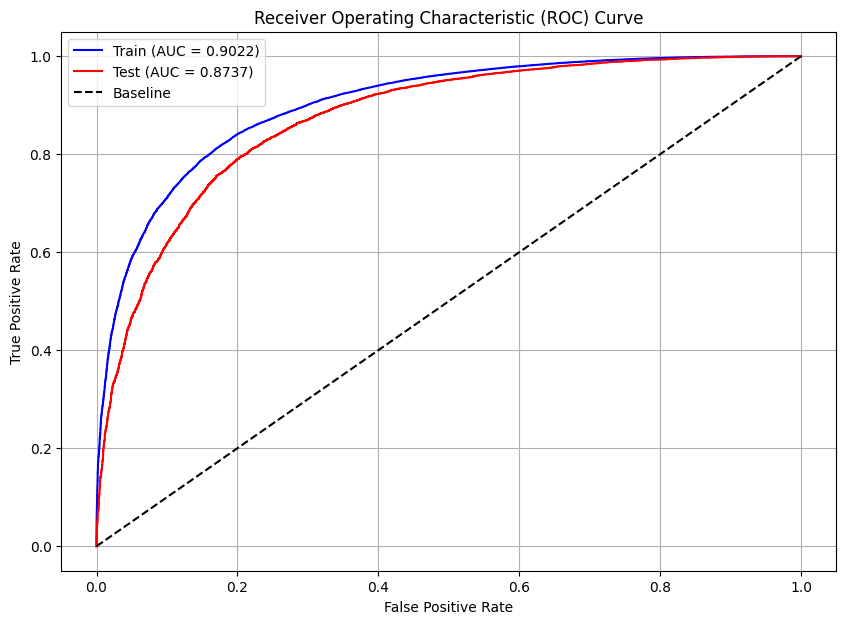

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_optuna, X_train, X_test, y_train, y_test)

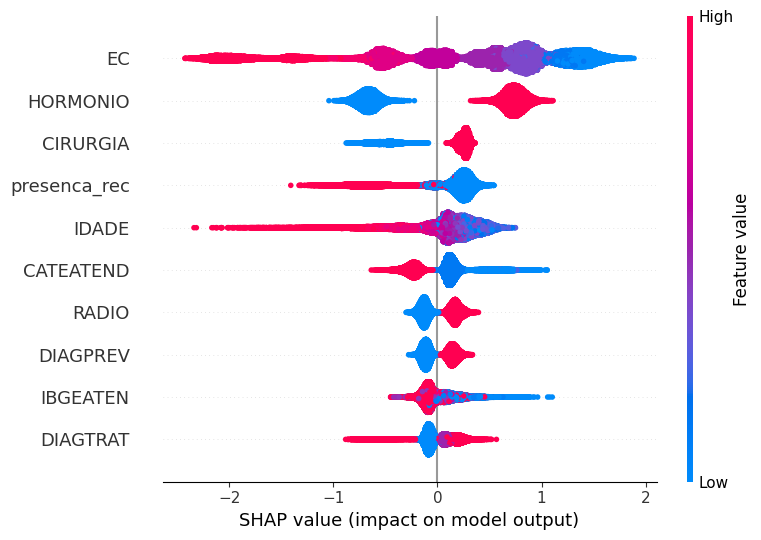

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(xgb_optuna, X_train, feat_cols)

### **LightGBM**


#### **Base model**

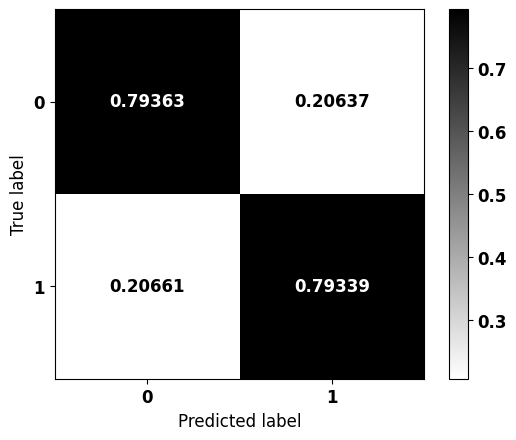


              precision    recall  f1-score   support

           0    0.48709   0.79363   0.60367      5180
           1    0.93958   0.79339   0.86032     20953

    accuracy                        0.79344     26133
   macro avg    0.71333   0.79351   0.73200     26133
weighted avg    0.84989   0.79344   0.80945     26133



In [ ]:
# Creating and training the LightGBM model
# Initialize an LightGBM classifier with specified parameters
lgbm = LGBMClassifier(max_depth=10,               # Set maximum tree depth to 10
                      class_weight={0:4.44, 1:1}, # Adjust class imbalance using class_weight
                      random_state=seed,          # Ensure reproducibility
                      verbose=-1)

# Train the model using the training dataset
lgbm.fit(X_train, y_train)

# Confusion matrix
# Generate and display the confusion matrix for model evaluation
plot_confusion_matrix(lgbm, X_test, y_test)

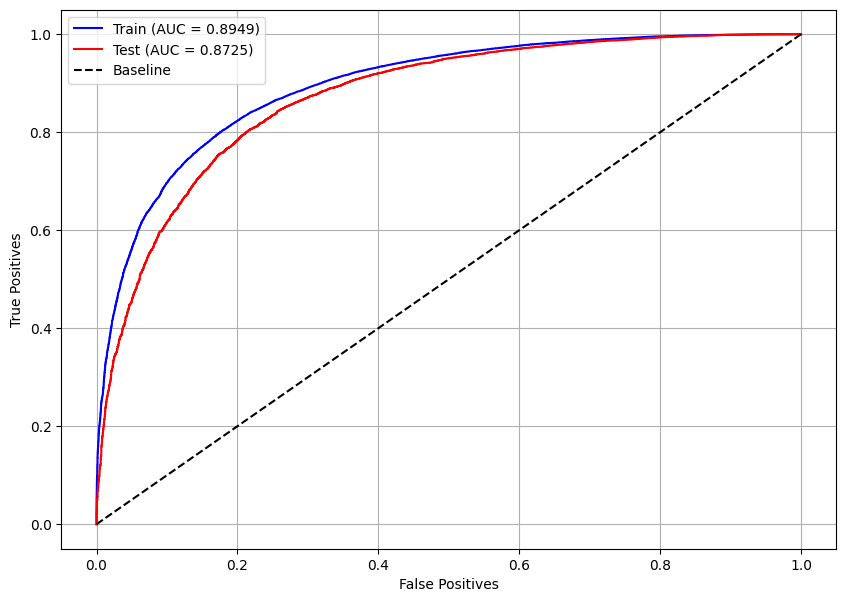

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm, X_train, X_test, y_train, y_test)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


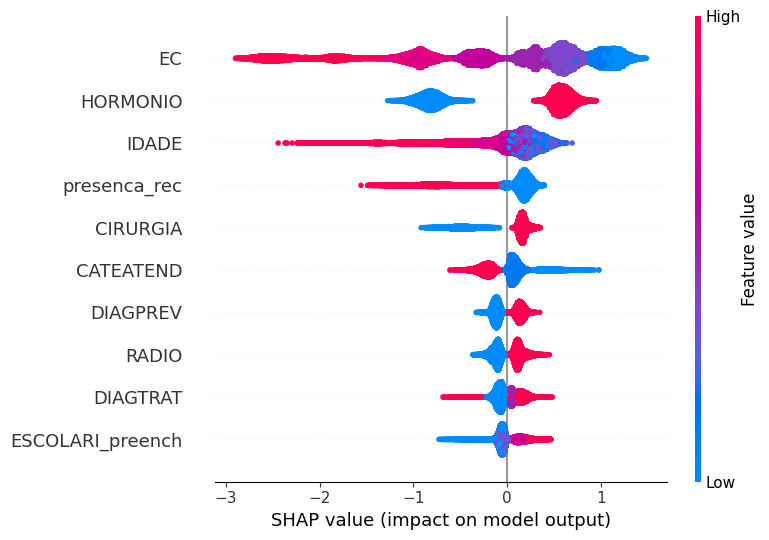

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(lgbm, X_train, feat_cols)

#### **Optuna**

In [ ]:
# Creating stratified folds with the same class proportions
skf = StratifiedKFold(10, shuffle=True, random_state=seed)

# Function defining the model and its hyperparameters, which will be optimized
# to maximize the evaluation metric
def objective(trial):

    # Hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 50, 150)  # Number of trees
    max_depth = trial.suggest_int('max_depth', 3, 10)  # Maximum tree depth
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.2, step=0.01)  # Learning rate
    min_child_weight = trial.suggest_int('min_child_weight', 1, 7)  # Minimum sum of weights in a child node
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.3, 0.7, step=0.1)  # Fraction of features sampled per tree

    # LightGBM classifier with suggested hyperparameters
    cls = LGBMClassifier(n_estimators=n_estimators,
                         max_depth=max_depth,
                         learning_rate=learning_rate,
                         min_child_weight=min_child_weight,
                         colsample_bytree=colsample_bytree,
                         random_state=seed,
                         verbose=-1,
                         n_jobs=-1)

    # Performing cross-validation and returning the mean accuracy score
    return cross_val_score(cls, X_train, y_train,
                           cv=skf, scoring='accuracy').mean()

##### RandomSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=RandomSampler(seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 149,
 'max_depth': 7,
 'learning_rate': 0.09,
 'min_child_weight': 6,
 'colsample_bytree': 0.5}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(4.4, 4.55, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined class_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:i, 1:1}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected class_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

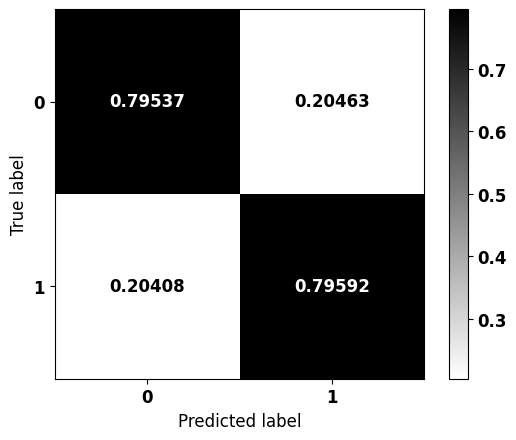


              precision    recall  f1-score   support

           0    0.49071   0.79537   0.60695      5180
           1    0.94024   0.79592   0.86208     20953

    accuracy                        0.79581     26133
   macro avg    0.71547   0.79565   0.73452     26133
weighted avg    0.85113   0.79581   0.81151     26133



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:4.41, 1:1}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_rand = LGBMClassifier(verbose=-1)
lgbm_rand.set_params(**params)

# Training the optimized model on the training dataset
lgbm_rand.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_rand, X_test, y_test)

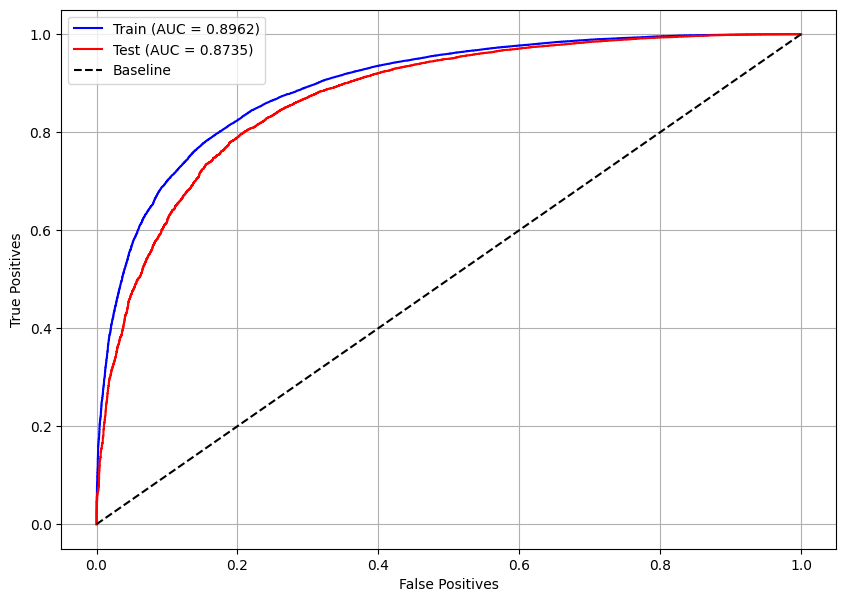

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_rand, X_train, X_test, y_train, y_test)

##### TPESampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=TPESampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 133,
 'max_depth': 7,
 'learning_rate': 0.14,
 'min_child_weight': 5,
 'colsample_bytree': 0.6000000000000001}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(4.45, 4.65, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined class_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:i, 1:1}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected class_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

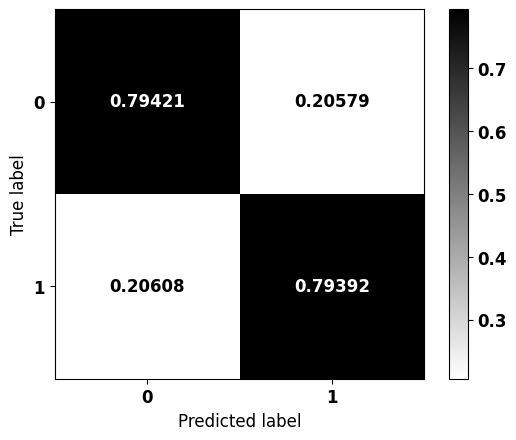


              precision    recall  f1-score   support

           0    0.48790   0.79421   0.60447      5180
           1    0.93978   0.79392   0.86071     20953

    accuracy                        0.79398     26133
   macro avg    0.71384   0.79406   0.73259     26133
weighted avg    0.85021   0.79398   0.80992     26133



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:4.485, 1:1}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_tpe = LGBMClassifier(verbose=-1)
lgbm_tpe.set_params(**params)

# Training the optimized model on the training dataset
lgbm_tpe.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_tpe, X_test, y_test)

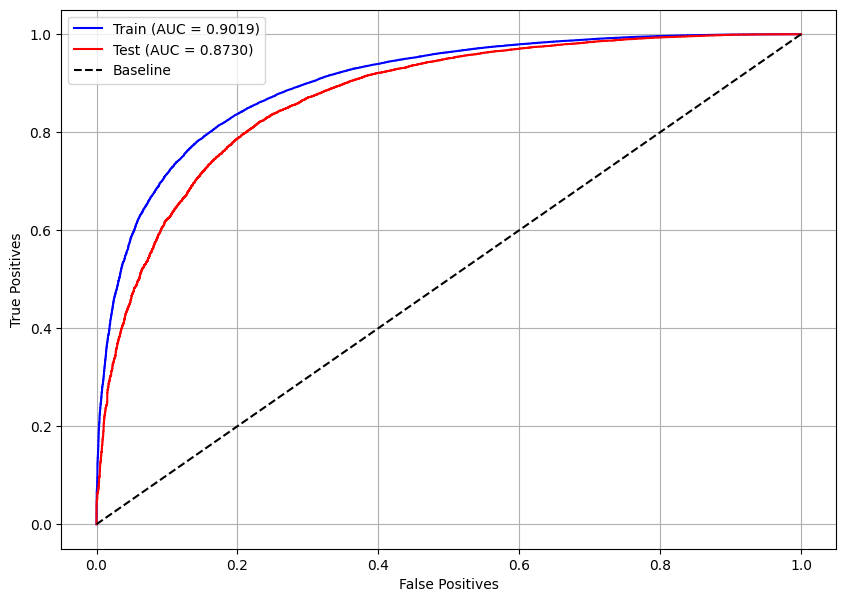

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_tpe, X_train, X_test, y_train, y_test)

##### CmaEsSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=CmaEsSampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 126,
 'max_depth': 8,
 'learning_rate': 0.16999999999999998,
 'min_child_weight': 6,
 'colsample_bytree': 0.4}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(4.4, 4.6, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined class_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:i, 1:1}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected class_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

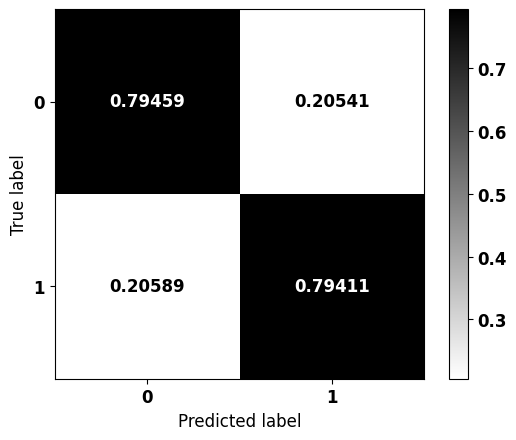


              precision    recall  f1-score   support

           0    0.48826   0.79459   0.60485      5180
           1    0.93990   0.79411   0.86088     20953

    accuracy                        0.79421     26133
   macro avg    0.71408   0.79435   0.73286     26133
weighted avg    0.85037   0.79421   0.81013     26133



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:4.532, 1:1}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_cma = LGBMClassifier(verbose=-1)
lgbm_cma.set_params(**params)

# Training the optimized model on the training dataset
lgbm_cma.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_cma, X_test, y_test)

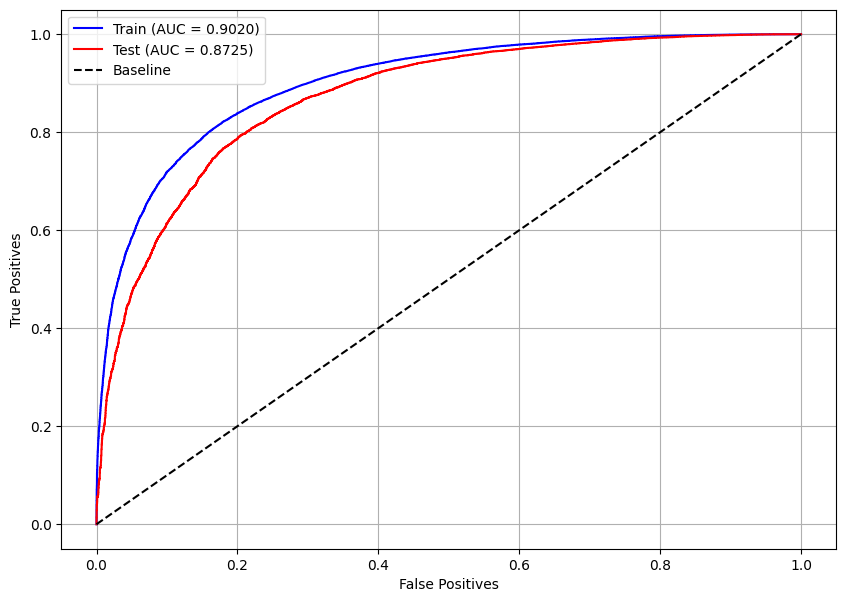

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_cma, X_train, X_test, y_train, y_test)

##### Optimized model

In [ ]:
# Selecting the best model based on performance
models = [lgbm_rand, lgbm_tpe, lgbm_cma]  # List of trained models
best = models[0]  # Initialize the best model as the first in the list

# Iterate through the models to find the one with the highest accuracy score
for i, m in enumerate(models):
    if i == 0:
        continue  # Skip the first model since it's already assigned as 'best'

    best_score = best.score(X_test, y_test)  # Accuracy of the current best model
    score = m.score(X_test, y_test)  # Accuracy of the current model being evaluated

    if score > best_score:  # Update 'best' if the current model has a higher score
        best = m

# Print the best-performing model
print(best)

LGBMClassifier(class_weight={0: 4.41, 1: 1}, colsample_bytree=0.5,
               learning_rate=0.09, max_depth=7, min_child_weight=6,
               n_estimators=149, random_state=7, verbose=-1)


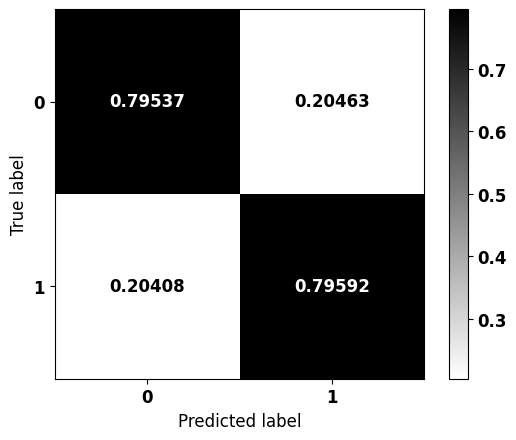


              precision    recall  f1-score   support

           0    0.49071   0.79537   0.60695      5180
           1    0.94024   0.79592   0.86208     20953

    accuracy                        0.79581     26133
   macro avg    0.71547   0.79565   0.73452     26133
weighted avg    0.85113   0.79581   0.81151     26133



In [ ]:
# Training the final XGBoost model using the best parameters
# Retrieve the best hyperparameters from the selected model
params = best.get_params()

# Initialize a new XGBoost classifier with the best parameters
lgbm_optuna = LGBMClassifier(verbose=-1)
lgbm_optuna.set_params(**params)

# Train the optimized model on the training data
lgbm_optuna.fit(X_train, y_train)

# Plot the confusion matrix to evaluate the model's performance on the test set
plot_confusion_matrix(lgbm_optuna, X_test, y_test)

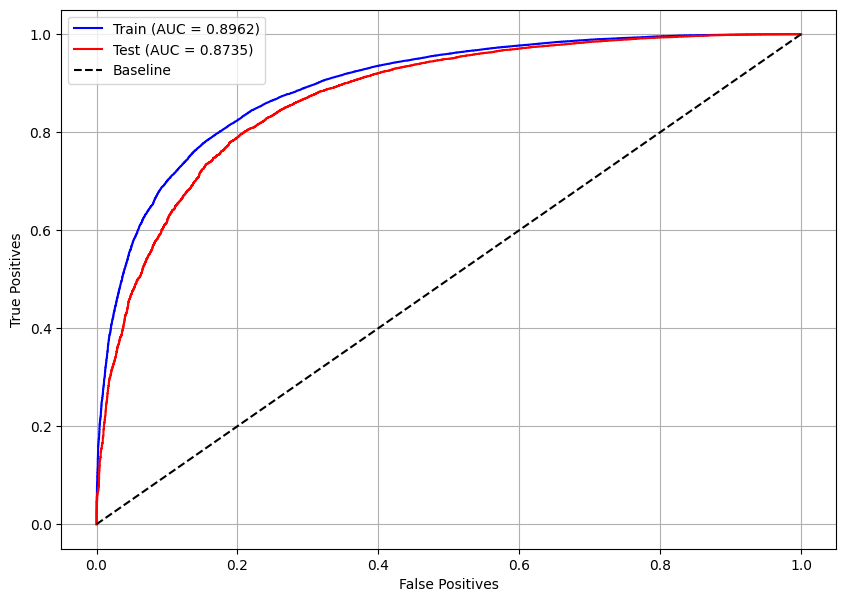

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_optuna, X_train, X_test, y_train, y_test)

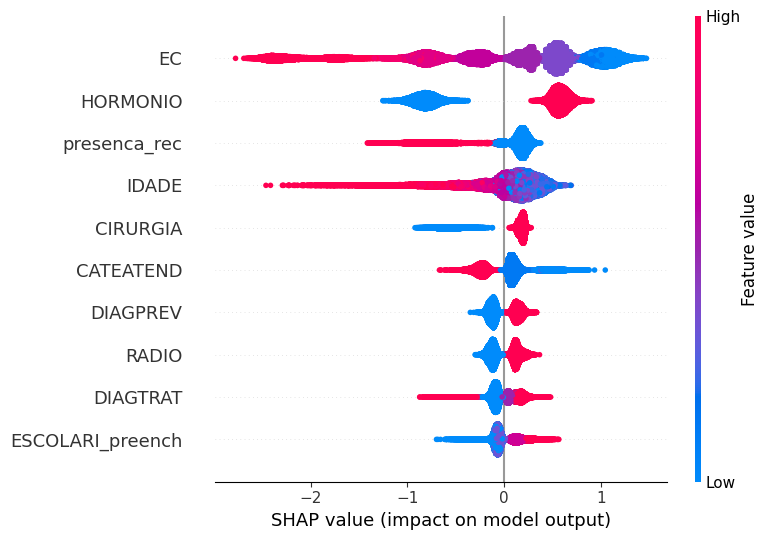

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(lgbm_optuna, X_train, feat_cols)

## **Voting Classifier**


In [ ]:
# Comparing the accuracy scores of the initial XGBoost model and the optimized Optuna model
xgb_score = xgb.score(X_test, y_test)
optuna_score = xgb_optuna.score(X_test, y_test)
print(f'Accuracy: XGB = {xgb_score:.4f}, Optuna = {optuna_score:.4f}\n')

# Determine which model performed better
if optuna_score >= xgb_score:
    params_xgb = xgb_optuna.get_params()  # Get the parameters of the optimized model
    print('Optimized model won')
else:
    params_xgb = xgb.get_params()  # Get the parameters of the initial model
    print('Initial model won')

Accuracy: XGB = 0.7898, Optuna = 0.7953

Otimizado venceu


In [ ]:
# Comparing the accuracy scores of the initial LightGBM model and the optimized Optuna model
lgbm_score = lgbm.score(X_test, y_test)
optuna_score = lgbm_optuna.score(X_test, y_test)
print(f'Accuracy: LGBM = {lgbm_score:.4f}, Optuna = {optuna_score:.4f}\n')

# Determine which model performed better
if optuna_score >= lgbm_score:
    params_lgbm = lgbm_optuna.get_params()  # Get the parameters of the optimized model
    print('Optimized model won')
else:
    params_lgbm = lgbm.get_params()  # Get the parameters of the initial model
    print('Initial model won')

Accuracy: LGBM = 0.7934, Optuna = 0.7958

Otimizado venceu


In [ ]:
# Creating the models with the best-performing hyperparameters
# XGBoost Model
best_xgb = XGBClassifier()  # Instantiate the XGBoost classifier
best_xgb.set_params(**params_xgb)  # Set the best hyperparameters for XGBoost

# LightGBM Model
best_lgbm = LGBMClassifier()  # Instantiate the LightGBM classifier
best_lgbm.set_params(**params_lgbm)  # Set the best hyperparameters for LightGBM

LGBMClassifier(class_weight={0: 4.41, 1: 1}, colsample_bytree=0.5,
               learning_rate=0.09, max_depth=7, min_child_weight=6,
               n_estimators=149, random_state=7, verbose=-1)

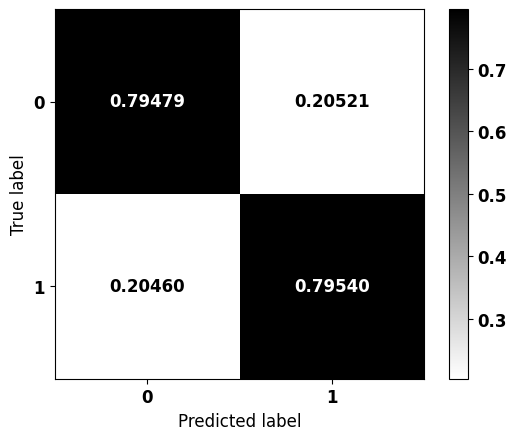


              precision    recall  f1-score   support

           0    0.48989   0.79479   0.60615      5180
           1    0.94004   0.79540   0.86169     20953

    accuracy                        0.79528     26133
   macro avg    0.71496   0.79509   0.73392     26133
weighted avg    0.85081   0.79528   0.81104     26133



In [ ]:
from sklearn.ensemble import VotingClassifier

# Creating and training the voting classifier model
clf = VotingClassifier(
    estimators=[('XGBoost', best_xgb),  # Adding the best XGBoost model
               ('LightGBM', best_lgbm)],  # Adding the best LightGBM model
    voting='soft'  # Using 'soft' voting, which predicts the class label based on predicted probabilities
)

clf.fit(X_train, y_train)  # Train the voting classifier on the training data

# Confusion Matrix
plot_confusion_matrix(clf, X_test, y_test)  # Plot the confusion matrix for the voting classifier on the test data

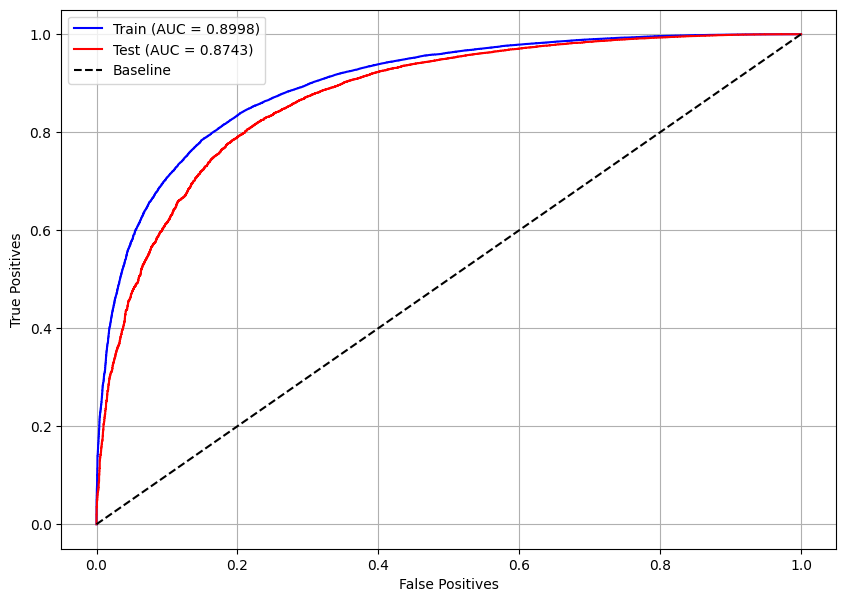

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(clf, X_train, X_test, y_train, y_test)

## **Tests with other cancer types**

In [ ]:
# Best Model Selection
models = [xgb, xgb_optuna, lgbm, lgbm_optuna]  # List of models to compare (XGBoost, optimized XGBoost, LightGBM, optimized LightGBM)

# Iterating through each model to find the best performing one
for i, m in enumerate(models):
    if i == 0:  # Initialize the best model as the first one
        best = m
    else:
        # Compare the performance of the current best model and the current model
        best_score = best.score(X_test, y_test)  # Get the accuracy of the current best model on the test set
        score = m.score(X_test, y_test)  # Get the accuracy of the current model on the test set
        if score > best_score:  # If the current model performs better, update the best model
            best = m

# Print the best performing model
print(best)

LGBMClassifier(class_weight={0: 4.41, 1: 1}, colsample_bytree=0.5,
               learning_rate=0.09, max_depth=7, min_child_weight=6,
               n_estimators=149, random_state=7, verbose=-1)


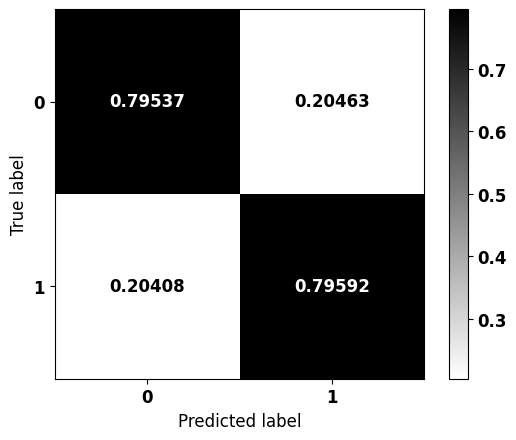


              precision    recall  f1-score   support

           0    0.49071   0.79537   0.60695      5180
           1    0.94024   0.79592   0.86208     20953

    accuracy                        0.79581     26133
   macro avg    0.71547   0.79565   0.73452     26133
weighted avg    0.85113   0.79581   0.81151     26133



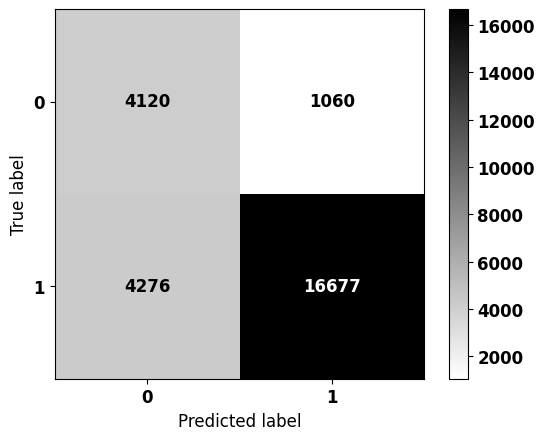


              precision    recall  f1-score   support

           0    0.49071   0.79537   0.60695      5180
           1    0.94024   0.79592   0.86208     20953

    accuracy                        0.79581     26133
   macro avg    0.71547   0.79565   0.73452     26133
weighted avg    0.85113   0.79581   0.81151     26133



In [ ]:
# Confusion Matrix for the Best Model
plot_confusion_matrix(best, X_test, y_test)  # Plot the normalized confusion matrix for the best model
plot_confusion_matrix(best, X_test, y_test, norm=False)  # Plot the unnormalized confusion matrix for the best model

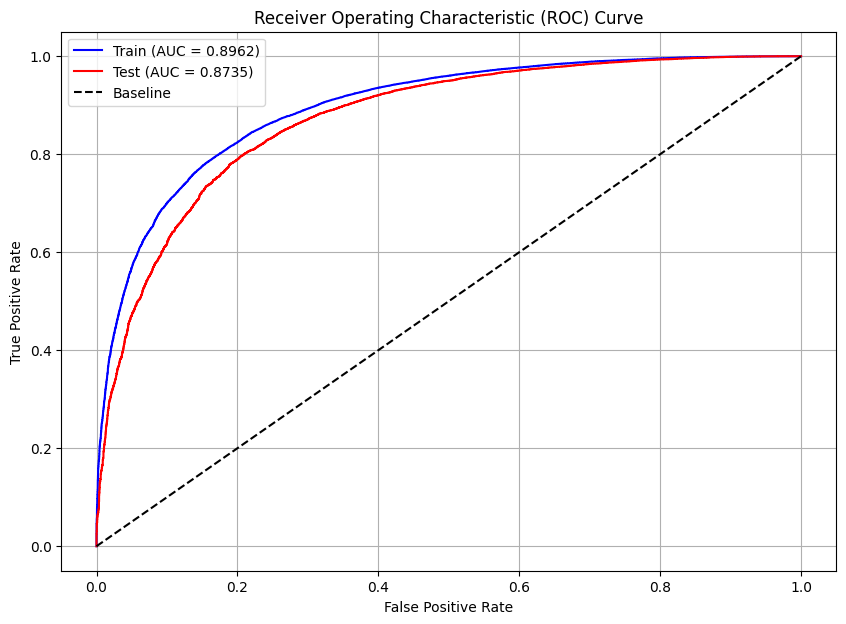

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(best, X_train, X_test, y_train, y_test)

/usr/local/lib/python3.11/dist-packages/shap/explainers/_tree.py:448: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn('LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray')


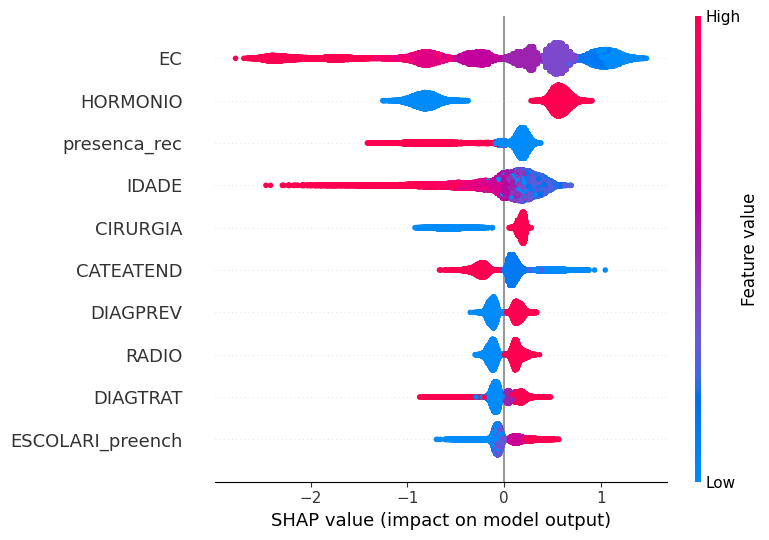

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(best, X_train, feat_cols)

In [ ]:
# Download test data
!gdown 194o9VVsCwcnt3Cp1oBbJdd0Sb_N2LOIF  # Download the test dataset - More incidents

# Load the dataset
df_teste = pd.read_csv('incid_teste.csv')

# Split the test data based on cancer types
mama_teste = df_teste[df_teste.TOPOGRUP.isin(['Mama'])]
pele_teste = df_teste[df_teste.TOPOGRUP.isin(['Pele'])]
prost_teste = df_teste[df_teste.TOPOGRUP.isin(['Próstata'])]
colo_teste = df_teste[df_teste.TOPOGRUP.isin(['Colorretal'])]
pulm_teste = df_teste[df_teste.TOPOGRUP.isin(['Pulmão'])]
colo_utero_teste = df_teste[df_teste.TOPOGRUP.isin(['Colo de Útero'])]

# Check the shapes of the resulting subsets
mama_teste.shape, pele_teste.shape, prost_teste.shape, colo_teste.shape, pulm_teste.shape, colo_utero_teste.shape

Downloading...
From: https://drive.google.com/uc?id=194o9VVsCwcnt3Cp1oBbJdd0Sb_N2LOIF
To: /content/incid_teste.csv
100% 46.4M/46.4M [00:00<00:00, 153MB/s]


((26133, 25), (25221, 25), (20862, 25), (14028, 25), (9252, 25), (5368, 25))

### **Skin**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'pele_teste' DataFrame
saida_pele = pele_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
pele_teste = pele_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'pele_teste' DataFrame
print(pele_teste.shape)
pele_teste.head(3)

(25221, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
4,0.324125,-0.916019,-0.841077,1.167751,-0.344597,-0.429061,0.315561,-0.242155,-0.156064,-0.03833,...,0.591376,-0.20941,-0.716428,1.436258,0.636483,-1.212419,0.393904,-1.404163,-0.776427,-0.218179
5,0.701083,-0.916019,0.447649,1.167751,-0.344597,-0.429061,0.315561,-0.242155,-0.156064,-0.03833,...,-0.689569,-0.20941,0.240058,-0.214815,-0.234417,-1.110069,-1.165675,1.588451,-0.776427,-0.218179
7,-0.052834,-0.916019,0.069663,-0.808623,-0.344597,-0.429061,0.315561,-0.242155,-0.156064,-0.03833,...,1.872320,-0.20941,0.813950,-0.398268,0.926783,-1.212419,0.393904,-0.406625,-0.776427,-0.218179


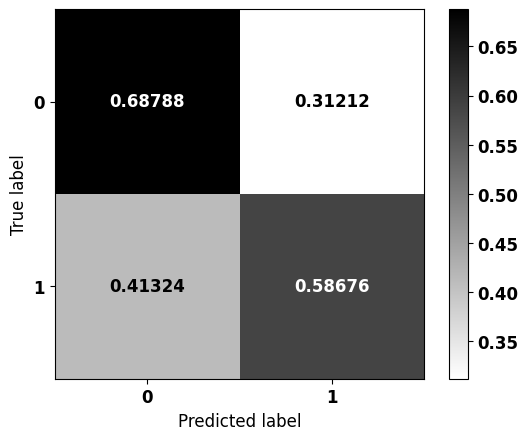


              precision    recall  f1-score   support

           0    0.33200   0.68788   0.44785      5799
           1    0.86294   0.58676   0.69854     19422

    accuracy                        0.61001     25221
   macro avg    0.59747   0.63732   0.57320     25221
weighted avg    0.74086   0.61001   0.64090     25221



In [ ]:
# Plot the confusion matrix for the best model on the 'pele_teste' dataset
plot_confusion_matrix(best, pele_teste, saida_pele)

### **Prostate**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'prost_teste' DataFrame
saida_prost = prost_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
prost_teste = prost_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'prost_teste' DataFrame
print(prost_teste.shape)
prost_teste.head(3)

(20862, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
3,0.149237,0.0,1.316000,-0.695899,0.723032,-0.63168,-0.879627,1.381841,-0.308078,1.085991,...,-0.418644,-0.208982,0.051988,0.032404,1.523967,-0.540997,-0.971798,-0.714113,-0.906043,-0.414926
12,-1.225865,0.0,0.958232,-0.695899,0.723032,0.27992,1.136845,-0.723672,-0.308078,-0.920818,...,-0.418644,-0.208982,0.841591,-1.029723,-0.860966,0.842650,0.451912,0.355595,1.103700,-0.414926
18,-0.423722,0.0,-0.370160,-0.695899,0.723032,-1.99908,-0.879627,1.381841,-0.308078,-0.920818,...,-0.418644,-0.208982,1.236393,0.032404,1.523967,-0.540997,-0.971798,1.425303,-0.906043,-0.414926


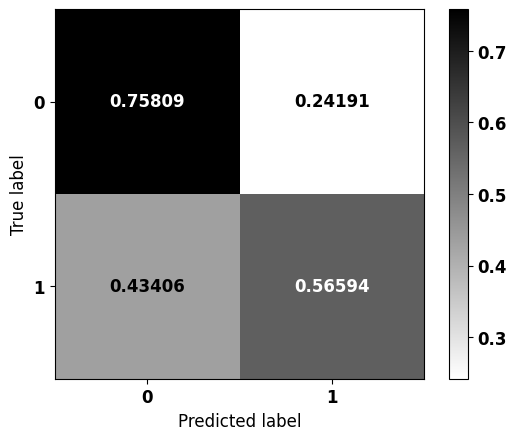


              precision    recall  f1-score   support

           0    0.25170   0.75809   0.37792      3369
           1    0.92394   0.56594   0.70193     17493

    accuracy                        0.59697     20862
   macro avg    0.58782   0.66201   0.53993     20862
weighted avg    0.81538   0.59697   0.64960     20862



In [ ]:
# Plot the confusion matrix for the best model on the 'prost_teste' dataset
plot_confusion_matrix(best, prost_teste, saida_prost)

### **Colorectal**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'colo_teste' DataFrame
saida_colo = colo_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
colo_teste = colo_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'colo_teste' DataFrame
print(colo_teste.shape)
colo_teste.head(3)

(14028, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
0,0.366829,-0.972134,1.141405,1.343451,0.958036,-0.047542,0.60093,-0.567847,0.737288,-0.07854,...,-0.325938,-0.193018,-1.734289,1.587885,0.660606,-1.716753,0.396181,1.180668,-1.03687,-0.475073
1,-0.166349,-0.972134,-0.649610,1.343451,0.958036,-0.873817,0.60093,1.761039,0.737288,-0.07854,...,-0.325938,-0.143566,-0.209650,1.767959,-0.282288,0.900562,-0.968850,0.154944,-1.03687,-0.475073
6,-0.318686,-0.972134,-1.770966,-0.714301,0.958036,1.329585,0.60093,-0.567847,0.737288,-0.07854,...,-0.325938,-0.193018,1.314989,-0.032782,-0.046564,-0.607175,0.396181,2.206391,-1.03687,-0.475073


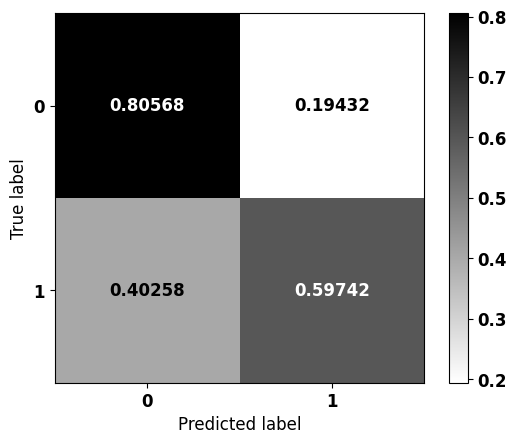


              precision    recall  f1-score   support

           0    0.61815   0.80568   0.69956      6273
           1    0.79170   0.59742   0.68097      7755

    accuracy                        0.69055     14028
   macro avg    0.70492   0.70155   0.69027     14028
weighted avg    0.71409   0.69055   0.68929     14028



In [ ]:
# Plot the confusion matrix for the best model on the 'colo_teste' dataset
plot_confusion_matrix(best, colo_teste, saida_colo)

### **Lung**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'pulm_teste' DataFrame
saida_pulm = pulm_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
pulm_teste = pulm_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'pulm_teste' DataFrame
print(pulm_teste.shape)
pulm_teste.head(3)

(9252, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
8,-0.805560,-0.778211,0.751797,-0.853227,1.364883,-0.536078,-0.468319,-0.748999,-1.335116,-0.070691,...,-0.403143,-0.432328,0.663596,-0.846783,-1.881064,0.667417,-1.225737,0.274789,0.973507,-0.407845
27,0.123762,1.284999,0.990635,-0.853227,1.364883,0.640728,-0.468319,-0.748999,0.748999,-0.070691,...,-0.403143,-0.459489,1.022562,-0.846783,-1.171009,0.755208,0.238090,0.274789,-1.027214,2.451912
33,0.960153,-0.778211,0.844979,1.133388,-0.732664,-2.889689,2.135297,-0.748999,-1.335116,-0.070691,...,1.394771,-0.459489,0.304629,-0.846783,-0.697638,0.755208,0.238090,-0.775222,0.973507,2.451912


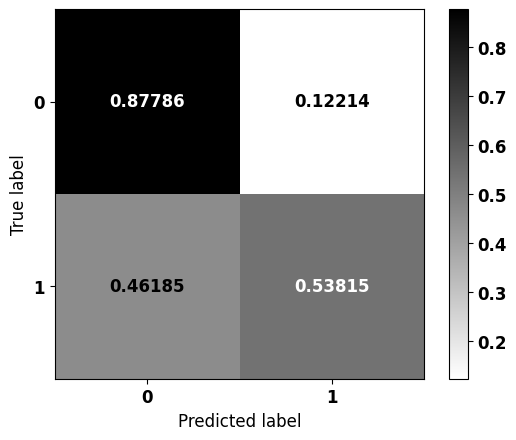


              precision    recall  f1-score   support

           0    0.92438   0.87786   0.90052      8007
           1    0.40655   0.53815   0.46319      1245

    accuracy                        0.83214      9252
   macro avg    0.66547   0.70800   0.68185      9252
weighted avg    0.85470   0.83214   0.84167      9252



In [ ]:
# Plot the confusion matrix for the best model on the 'pulm_teste' dataset
plot_confusion_matrix(best, pulm_teste, saida_pulm)

### **Cervical**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'colo_utero_teste' DataFrame
saida_colo_utero = colo_utero_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
colo_utero_teste = colo_utero_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'colo_utero_teste' DataFrame
print(colo_utero_teste.shape)
colo_utero_teste.head(3)

(5368, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
40,0.519132,0.0,0.929895,-0.892955,-1.099583,-2.175331,1.259960,-1.349244,-0.933285,-0.087376,...,4.004901,-0.269490,0.413337,-0.892417,-0.710476,0.814678,0.639879,-1.668349,1.088759,-0.459887
63,0.722950,0.0,0.009041,-0.892955,0.909436,0.794350,-0.793676,-1.349244,-0.933285,-0.087376,...,-0.292508,4.381396,0.936614,-0.892417,-0.936297,0.814678,0.639879,-0.614620,-0.918477,-0.459887
76,-0.092323,0.0,1.103217,-0.892955,0.909436,0.794350,1.259960,-1.349244,1.071484,-0.087376,...,-0.292508,-0.175532,0.936614,1.467974,1.321912,-1.416945,0.639879,-0.614620,-0.918477,2.174445


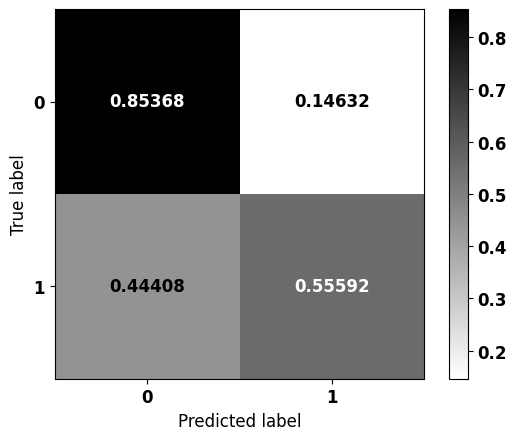


              precision    recall  f1-score   support

           0    0.59219   0.85368   0.69929      2310
           1    0.83415   0.55592   0.66719      3058

    accuracy                        0.68405      5368
   macro avg    0.71317   0.70480   0.68324      5368
weighted avg    0.73003   0.68405   0.68100      5368



In [ ]:
# Plot the confusion matrix for the best model on the 'colo_utero_teste' dataset
plot_confusion_matrix(best, colo_utero_teste, saida_colo_utero)

# **Skin**

In [ ]:
# Display the shape (number of rows and columns) of the skin cancer dataset
print(df_pele.shape)

# Show the first three rows of the dataset to inspect its structure and values
df_pele.head(3)

(100883, 32)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,TOPO,TOPOGRUP,EC,TRATHOSP,NENHUM,...,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec,obito_geral,sobrevida_ano1,sobrevida_ano3,sobrevida_ano5
0,42,1,3518701,9,2,C446,C44,IIIC,G,0,...,7,3518701,1,3.0,1,0,1,0,0,0
1,43,2,3548708,9,1,C449,C44,IIIC,C,0,...,1,3518701,1,4.0,0,0,1,1,0,0
2,31,2,3518701,2,2,C449,C44,IV,C,0,...,7,3518701,1,3.0,1,0,1,0,0,0


In [ ]:
# Missing values
df_pele.isna().sum().sort_values(ascending=False).head(6)

IDADE             0
SEXO              0
sobrevida_ano3    0
sobrevida_ano1    0
obito_geral       0
presenca_rec      0
dtype: int64

In [ ]:
# Drop NaN values
df_pele.dropna(inplace=True)
df_pele.shape

(100883, 32)

In [ ]:
# Compute the correlation matrix for numerical features in the skin cancer dataset
corr_matrix = df_pele.corr(numeric_only=True)

# Get the absolute correlation values with the target variable 'sobrevida_ano3',
# sort them in descending order, and display the top 20 most correlated features
abs(corr_matrix['sobrevida_ano3']).sort_values(ascending=False).head(20)

sobrevida_ano3      1.000000
sobrevida_ano5      0.568726
sobrevida_ano1      0.543767
obito_geral         0.503614
IDADE               0.238782
QUIMIO              0.128731
ANODIAG             0.103983
ESCOLARI_preench    0.102245
CIRURGIA            0.093976
DIAGTRAT            0.083850
TRATCONS            0.083574
NENHUM              0.083239
RADIO               0.069108
presenca_rec        0.050478
HABILIT2            0.042319
SEXO                0.030850
DIAGPREV            0.029932
DRS                 0.027130
RRAS                0.026648
IBGEATEN            0.021207
Name: sobrevida_ano3, dtype: float64

In [ ]:
# Count the number of patients in each class of the target variable 'sobrevida_ano3'
df_pele.sobrevida_ano3.value_counts()

sobrevida_ano3
1    77687
0    23196
Name: count, dtype: int64

## **Preprocessing**

In [ ]:
# Preprocessed data setup

# List of columns to drop from the dataset, including treatment-related, tumor location, and other survival indicators
list_drop = ['TRATHOSP', 'TOPO', 'TOPOGRUP', 'NENHUM', 'TRATCONS', 'obito_geral',
             'sobrevida_ano1', 'sobrevida_ano5']

# Target variable for classification
lb = 'sobrevida_ano3'

# Perform preprocessing, including feature selection, encoding, and normalization
# Returns training and test sets (features and labels), feature column names, encoder, and normalization method
X_train, X_test, y_train, y_test, feat_cols, enc, norm = preprocessing(df_pele,
                                                                       list_drop, lb,
                                                                       norm_name='StandardScaler',
                                                                       return_enc_norm=True,
                                                                       random_state=seed)

X_train = (75662, 23), X_test = (25221, 23)
y_train = (75662,), y_test = (25221,)


In [ ]:
# Training dataset for Skin Cancer

# Create a DataFrame for training data with selected features
pele_treino = pd.DataFrame(X_train, columns=feat_cols)

# Add the 'TOPOGRUP' column to indicate the cancer type (here, 'Pele' for Skin Cancer)
pele_treino['TOPOGRUP'] = 'Pele'

# Add the target variable (survival after 3 years) to the training dataset
pele_treino['sobrevida_3anos'] = y_train.values

# Testing dataset for Skin Cancer

# Create a DataFrame for testing data with selected features
pele_teste = pd.DataFrame(X_test, columns=feat_cols)

# Add the 'TOPOGRUP' column to indicate the cancer type (here, 'Pele' for Skin Cancer)
pele_teste['TOPOGRUP'] = 'Pele'

# Add the target variable (survival after 3 years) to the testing dataset
pele_teste['sobrevida_3anos'] = y_test.values

## **Training and validation of machine learning models**

### **XGBoost**


#### **Base model**

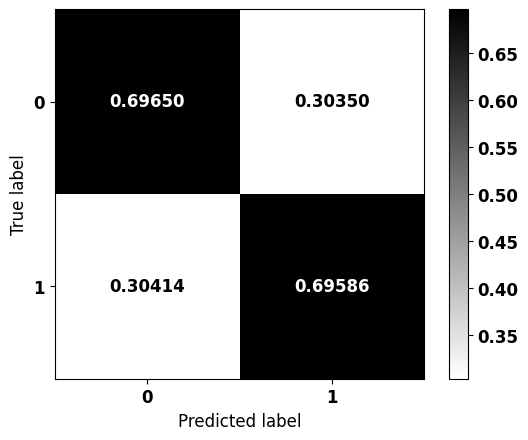


              precision    recall  f1-score   support

           0    0.40609   0.69650   0.51305      5799
           1    0.88478   0.69586   0.77903     19422

    accuracy                        0.69601     25221
   macro avg    0.64544   0.69618   0.64604     25221
weighted avg    0.77472   0.69601   0.71787     25221



In [ ]:
# Creating and training the XGBoost model
# Initialize an XGBoost classifier with specified parameters
xgb = XGBClassifier(max_depth=4,            # Set maximum tree depth to 4
                    scale_pos_weight=0.282, # Adjust class imbalance using scale_pos_weight
                    random_state=seed)      # Ensure reproducibility

# Train the model using the training dataset
xgb.fit(X_train, y_train)

# Confusion matrix
# Generate and display the confusion matrix for model evaluation
plot_confusion_matrix(xgb, X_test, y_test)

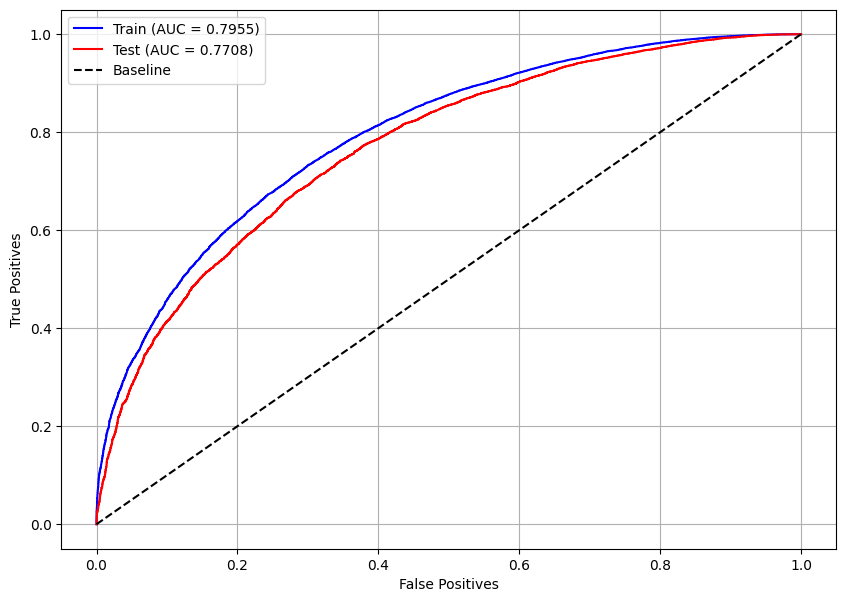

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb, X_train, X_test, y_train, y_test)

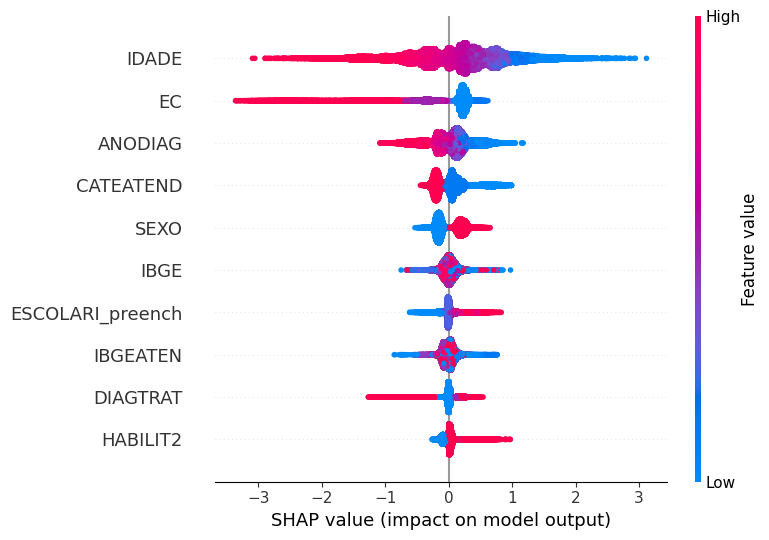

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(xgb, X_train, feat_cols)

#### **Optuna**

In [ ]:
# Creating stratified folds with the same class proportions
skf = StratifiedKFold(10, shuffle=True, random_state=seed)

# Function defining the model and its hyperparameters, which will be optimized
# to maximize the evaluation metric
def objective(trial):

    # Hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 50, 150)  # Number of trees
    max_depth = trial.suggest_int('max_depth', 3, 6)  # Maximum tree depth
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.2, step=0.05)  # Learning rate
    gamma = trial.suggest_float('gamma', 0.0, 0.3, step=0.1)  # Regularization term
    min_child_weight = trial.suggest_int('min_child_weight', 1, 7)  # Minimum sum of weights in a child node
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.3, 0.7, step=0.1)  # Fraction of features sampled per tree

    # XGBoost classifier with suggested hyperparameters
    cls = XGBClassifier(n_estimators=n_estimators,
                        max_depth=max_depth,
                        learning_rate=learning_rate,
                        gamma=gamma,
                        min_child_weight=min_child_weight,
                        colsample_bytree=colsample_bytree,
                        random_state=seed,
                        n_jobs=-1)

    # Performing cross-validation and returning the mean accuracy score
    return cross_val_score(cls, X_train, y_train,
                           cv=skf, scoring='accuracy').mean()

##### RandomSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=RandomSampler(seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 131,
 'max_depth': 6,
 'learning_rate': 0.2,
 'gamma': 0.0,
 'min_child_weight': 7,
 'colsample_bytree': 0.5}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(0.27, 0.3, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

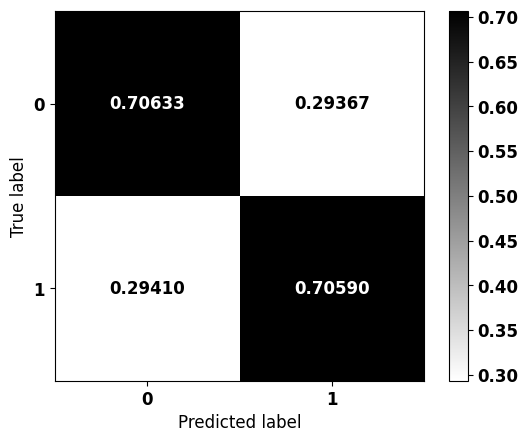


              precision    recall  f1-score   support

           0    0.41762   0.70633   0.52489      5799
           1    0.88951   0.70590   0.78714     19422

    accuracy                        0.70600     25221
   macro avg    0.65356   0.70611   0.65602     25221
weighted avg    0.78101   0.70600   0.72684     25221



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 0.2792  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_rand = XGBClassifier()
xgb_rand.set_params(**params)

# Training the optimized model on the training dataset
xgb_rand.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_rand, X_test, y_test)

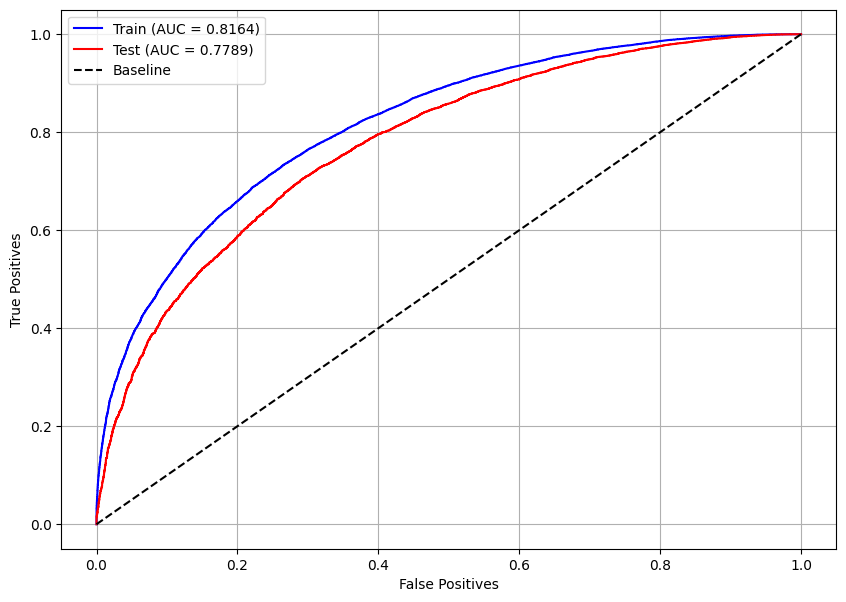

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_rand, X_train, X_test, y_train, y_test)

##### TPESampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=TPESampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 141,
 'max_depth': 6,
 'learning_rate': 0.2,
 'gamma': 0.0,
 'min_child_weight': 4,
 'colsample_bytree': 0.5}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(0.27, 0.29, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

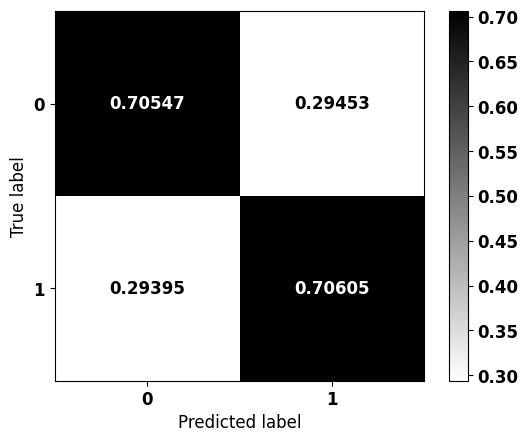


              precision    recall  f1-score   support

           0    0.41745   0.70547   0.52452      5799
           1    0.88924   0.70605   0.78713     19422

    accuracy                        0.70592     25221
   macro avg    0.65335   0.70576   0.65583     25221
weighted avg    0.78076   0.70592   0.72675     25221



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 0.2774  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_tpe = XGBClassifier()
xgb_tpe.set_params(**params)

# Training the optimized model on the training dataset
xgb_tpe.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_tpe, X_test, y_test)

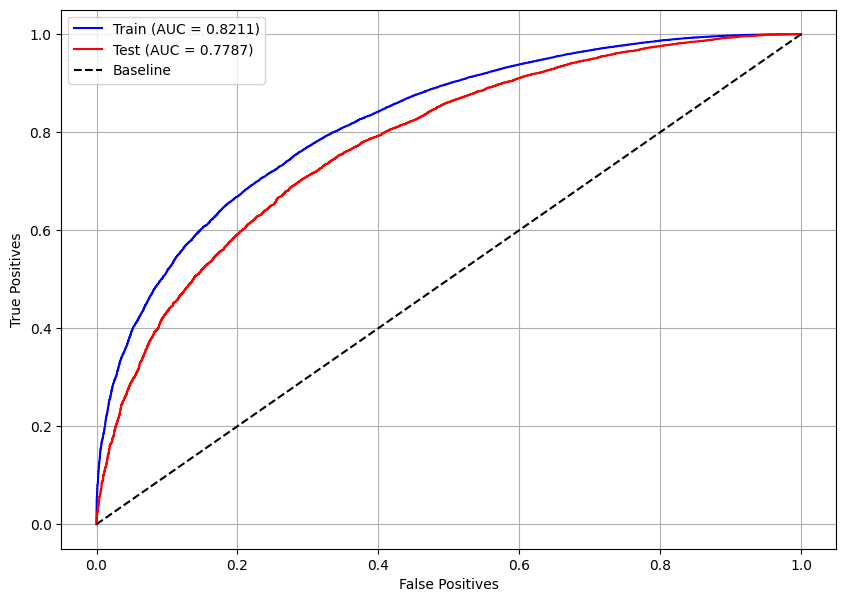

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_tpe, X_train, X_test, y_train, y_test)

##### CmaEsSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=CmaEsSampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 136,
 'max_depth': 6,
 'learning_rate': 0.2,
 'gamma': 0.1,
 'min_child_weight': 4,
 'colsample_bytree': 0.7}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(0.27, 0.29, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

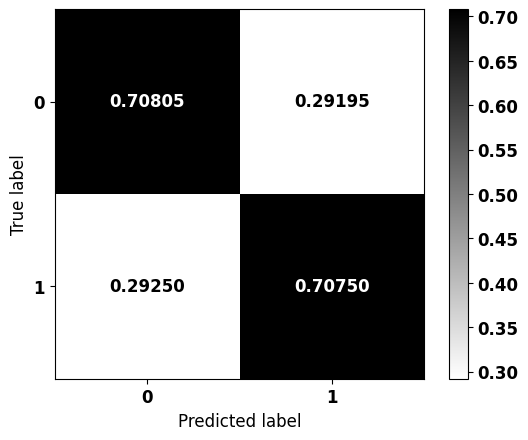


              precision    recall  f1-score   support

           0    0.41954   0.70805   0.52688      5799
           1    0.89031   0.70750   0.78844     19422

    accuracy                        0.70762     25221
   macro avg    0.65492   0.70777   0.65766     25221
weighted avg    0.78206   0.70762   0.72830     25221



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 0.2773  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_cma = XGBClassifier()
xgb_cma.set_params(**params)

# Training the optimized model on the training dataset
xgb_cma.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_cma, X_test, y_test)

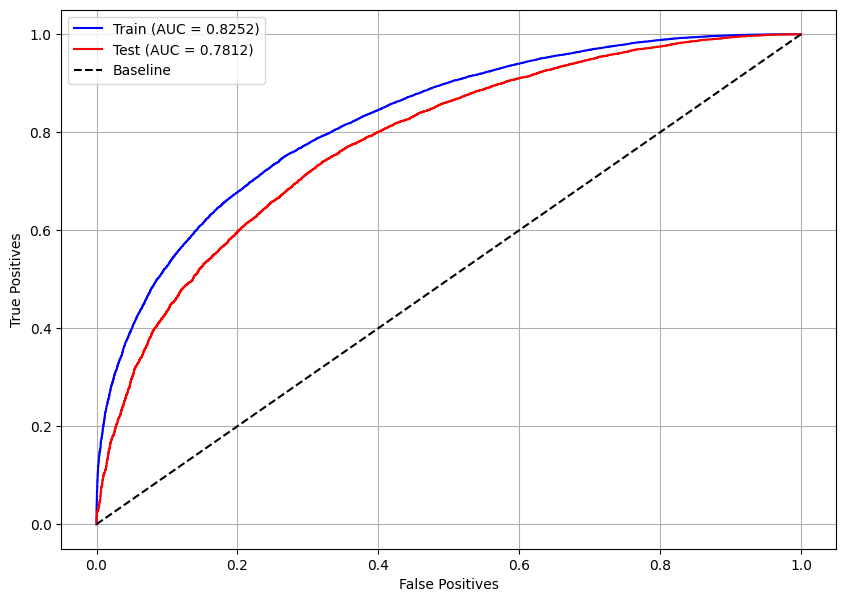

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_cma, X_train, X_test, y_train, y_test)

##### Optimized model

In [ ]:
# Selecting the best model based on performance
models = [xgb_rand, xgb_tpe, xgb_cma]  # List of trained models
best = models[0]  # Initialize the best model as the first in the list

# Iterate through the models to find the one with the highest accuracy score
for i, m in enumerate(models):
    if i == 0:
        continue  # Skip the first model since it's already assigned as 'best'

    best_score = best.score(X_test, y_test)  # Accuracy of the current best model
    score = m.score(X_test, y_test)  # Accuracy of the current model being evaluated

    if score > best_score:  # Update 'best' if the current model has a higher score
        best = m

# Print the best-performing model
print(best)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.7, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=4, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=136, n_jobs=None,
              num_parallel_tree=None, random_state=7, ...)


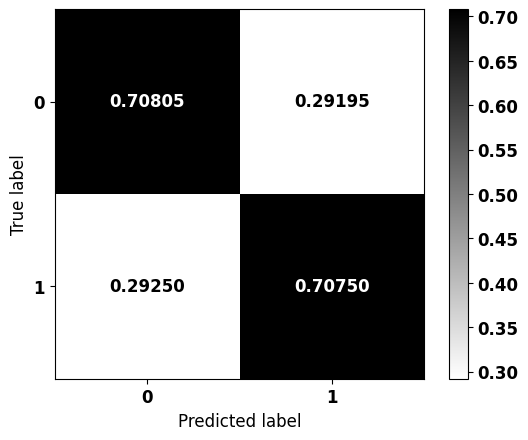


              precision    recall  f1-score   support

           0    0.41954   0.70805   0.52688      5799
           1    0.89031   0.70750   0.78844     19422

    accuracy                        0.70762     25221
   macro avg    0.65492   0.70777   0.65766     25221
weighted avg    0.78206   0.70762   0.72830     25221



In [ ]:
# Training the final XGBoost model using the best parameters
# Retrieve the best hyperparameters from the selected model
params = best.get_params()

# Initialize a new XGBoost classifier with the best parameters
xgb_optuna = XGBClassifier()
xgb_optuna.set_params(**params)

# Train the optimized model on the training data
xgb_optuna.fit(X_train, y_train)

# Plot the confusion matrix to evaluate the model's performance on the test set
plot_confusion_matrix(xgb_optuna, X_test, y_test)

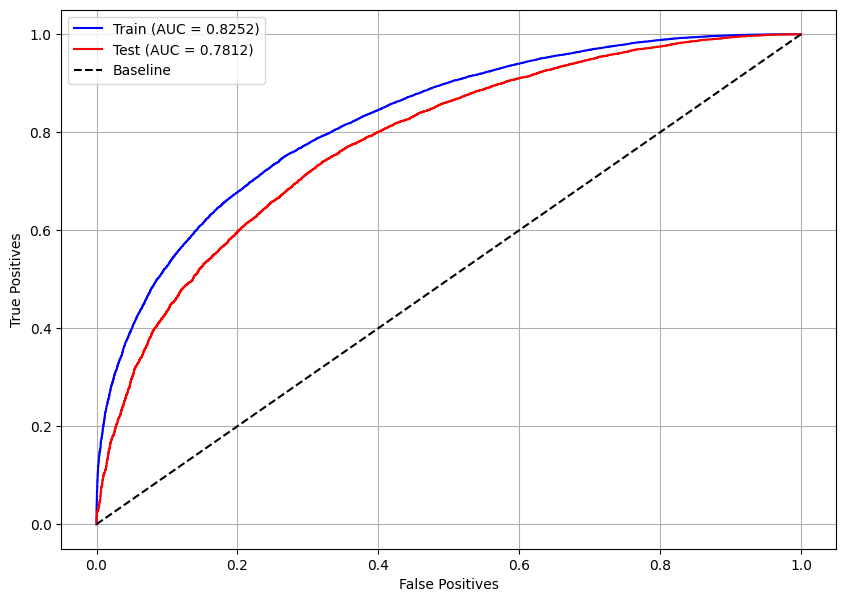

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_optuna, X_train, X_test, y_train, y_test)

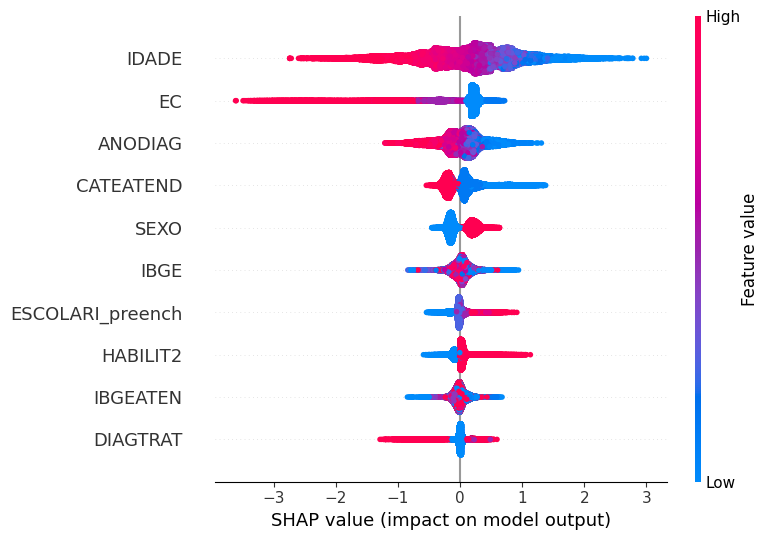

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(xgb_optuna, X_train, feat_cols)

### **LightGBM**


#### **Base model**

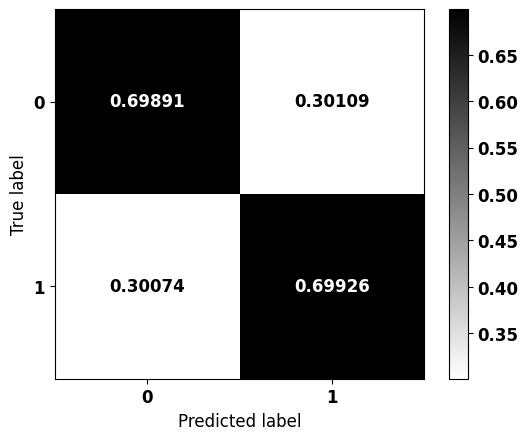


              precision    recall  f1-score   support

           0    0.40964   0.69891   0.51654      5799
           1    0.88608   0.69926   0.78166     19422

    accuracy                        0.69918     25221
   macro avg    0.64786   0.69909   0.64910     25221
weighted avg    0.77654   0.69918   0.72070     25221



In [ ]:
# Creating and training the LightGBM model
# Initialize an LightGBM classifier with specified parameters
lgbm = LGBMClassifier(max_depth=10,                 # Set maximum tree depth to 10
                      class_weight={0:3.47, 1:1},   # Adjust class imbalance using class_weight
                      random_state=seed,            # Ensure reproducibility
                      verbose=-1)

# Train the model using the training dataset
lgbm.fit(X_train, y_train)

# Confusion matrix
# Generate and display the confusion matrix for model evaluation
plot_confusion_matrix(lgbm, X_test, y_test)

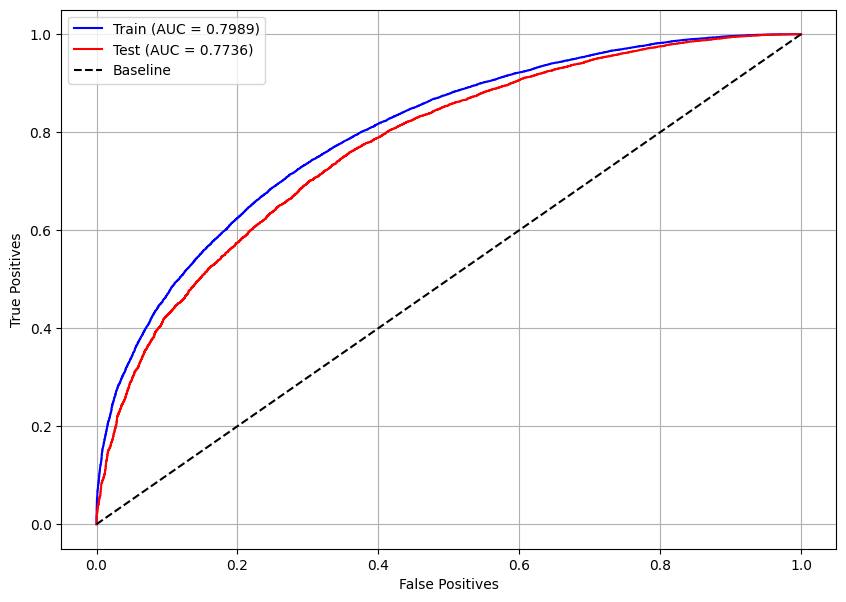

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm, X_train, X_test, y_train, y_test)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


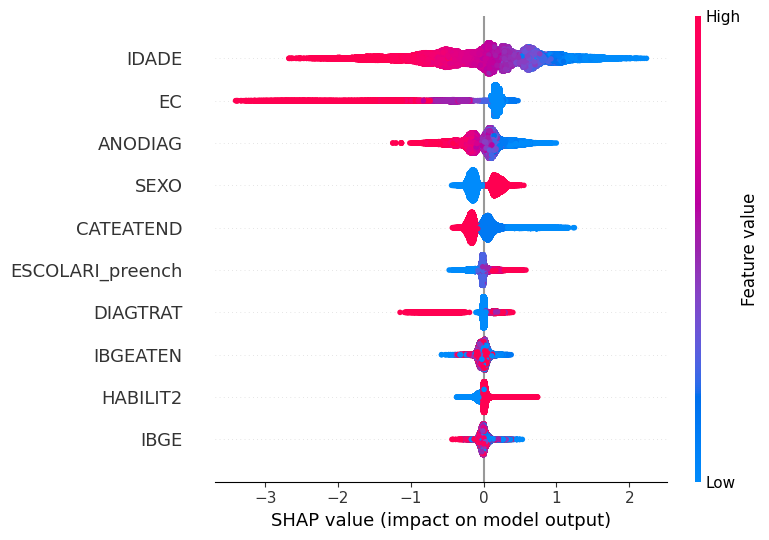

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(lgbm, X_train, feat_cols)

#### **Optuna**

In [ ]:
# Creating stratified folds with the same class proportions
skf = StratifiedKFold(10, shuffle=True, random_state=seed)

# Function defining the model and its hyperparameters, which will be optimized
# to maximize the evaluation metric
def objective(trial):

    # Hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 50, 150)  # Number of trees
    max_depth = trial.suggest_int('max_depth', 3, 10)  # Maximum tree depth
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.2, step=0.01)  # Learning rate
    min_child_weight = trial.suggest_int('min_child_weight', 1, 7)  # Minimum sum of weights in a child node
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.3, 0.7, step=0.1)  # Fraction of features sampled per tree

    # LightGBM classifier with suggested hyperparameters
    cls = LGBMClassifier(n_estimators=n_estimators,
                         max_depth=max_depth,
                         learning_rate=learning_rate,
                         min_child_weight=min_child_weight,
                         colsample_bytree=colsample_bytree,
                         random_state=seed,
                         verbose=-1,
                         n_jobs=-1)

    # Performing cross-validation and returning the mean accuracy score
    return cross_val_score(cls, X_train, y_train,
                           cv=skf, scoring='accuracy').mean()

##### RandomSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=RandomSampler(seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 138,
 'max_depth': 10,
 'learning_rate': 0.2,
 'min_child_weight': 7,
 'colsample_bytree': 0.5}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(3.51, 3.56, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:i, 1:1}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

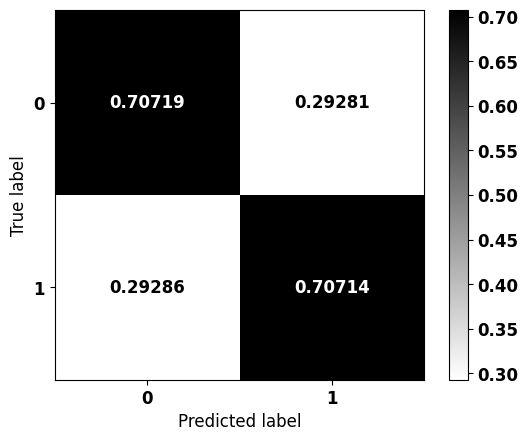


              precision    recall  f1-score   support

           0    0.41894   0.70719   0.52617      5799
           1    0.88997   0.70714   0.78809     19422

    accuracy                        0.70715     25221
   macro avg    0.65445   0.70716   0.65713     25221
weighted avg    0.78167   0.70715   0.72787     25221



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:3.5368, 1:1}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_rand = LGBMClassifier(verbose=-1)
lgbm_rand.set_params(**params)

# Training the optimized model on the training dataset
lgbm_rand.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_rand, X_test, y_test)

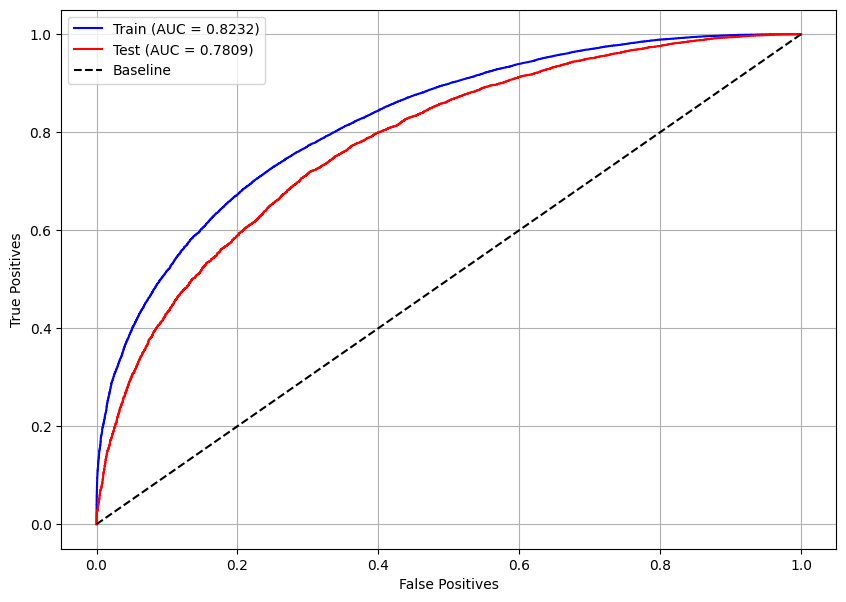

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_rand, X_train, X_test, y_train, y_test)

##### TPESampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=TPESampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 143,
 'max_depth': 9,
 'learning_rate': 0.2,
 'min_child_weight': 1,
 'colsample_bytree': 0.7}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(3.53, 3.56, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:i, 1:1}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

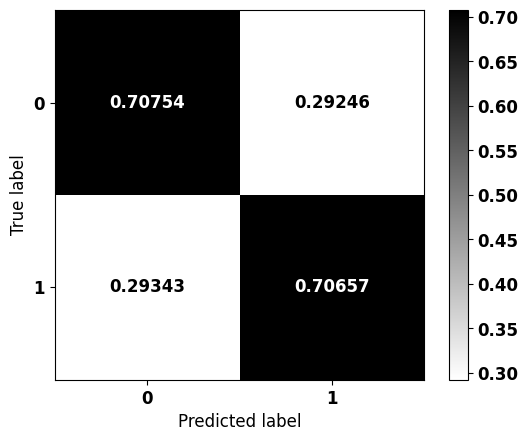


              precision    recall  f1-score   support

           0    0.41859   0.70754   0.52599      5799
           1    0.89001   0.70657   0.78775     19422

    accuracy                        0.70679     25221
   macro avg    0.65430   0.70705   0.65687     25221
weighted avg    0.78161   0.70679   0.72756     25221



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:3.5489, 1:1}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_tpe = LGBMClassifier(verbose=-1)
lgbm_tpe.set_params(**params)

# Training the optimized model on the training dataset
lgbm_tpe.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_tpe, X_test, y_test)

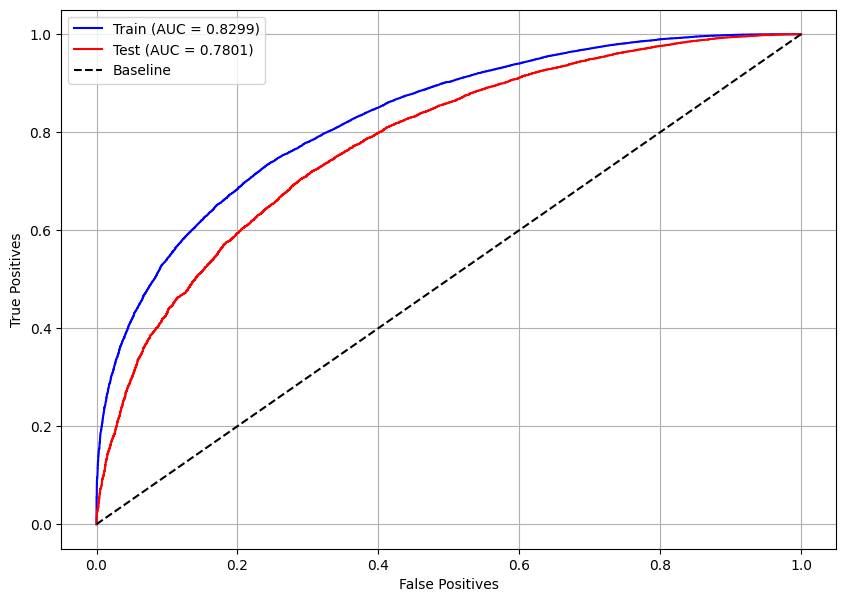

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_tpe, X_train, X_test, y_train, y_test)

##### CmaEsSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=CmaEsSampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 150,
 'max_depth': 10,
 'learning_rate': 0.16999999999999998,
 'min_child_weight': 5,
 'colsample_bytree': 0.5}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(3.49, 3.53, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:i, 1:1}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

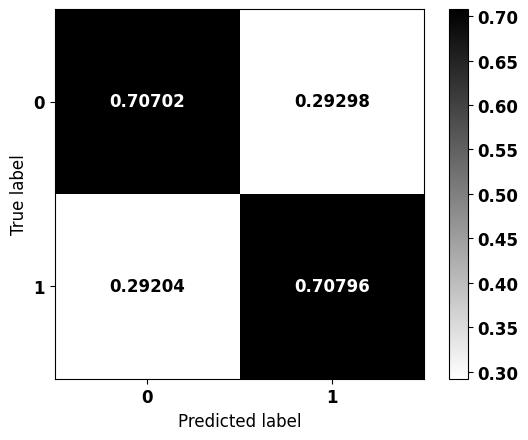


              precision    recall  f1-score   support

           0    0.41957   0.70702   0.52662      5799
           1    0.89003   0.70796   0.78862     19422

    accuracy                        0.70774     25221
   macro avg    0.65480   0.70749   0.65762     25221
weighted avg    0.78185   0.70774   0.72838     25221



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:3.5183, 1:1}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_cma = LGBMClassifier(verbose=-1)
lgbm_cma.set_params(**params)

# Training the optimized model on the training dataset
lgbm_cma.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_cma, X_test, y_test)

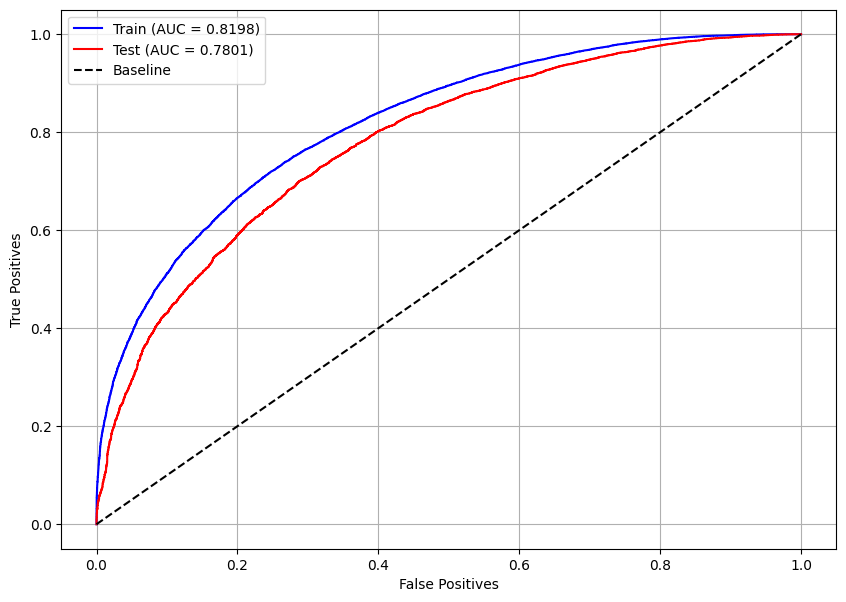

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_optuna, X_train, X_test, y_train, y_test)

##### Optimized model

In [ ]:
# Selecting the best model based on performance
models = [lgbm_rand, lgbm_tpe, lgbm_cma]  # List of trained models
best = models[0]  # Initialize the best model as the first in the list

# Iterate through the models to find the one with the highest accuracy score
for i, m in enumerate(models):
    if i == 0:
        continue  # Skip the first model since it's already assigned as 'best'

    best_score = best.score(X_test, y_test)  # Accuracy of the current best model
    score = m.score(X_test, y_test)  # Accuracy of the current model being evaluated

    if score > best_score:  # Update 'best' if the current model has a higher score
        best = m

# Print the best-performing model
print(best)

LGBMClassifier(class_weight={0: 3.5183, 1: 1}, colsample_bytree=0.5,
               learning_rate=0.17, max_depth=10, min_child_weight=5,
               n_estimators=150, random_state=7, verbose=-1)


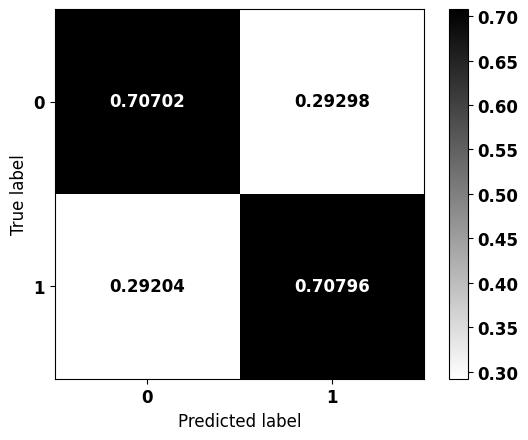


              precision    recall  f1-score   support

           0    0.41957   0.70702   0.52662      5799
           1    0.89003   0.70796   0.78862     19422

    accuracy                        0.70774     25221
   macro avg    0.65480   0.70749   0.65762     25221
weighted avg    0.78185   0.70774   0.72838     25221



In [ ]:
# Training the final XGBoost model using the best parameters
# Retrieve the best hyperparameters from the selected model
params = best.get_params()

# Initialize a new XGBoost classifier with the best parameters
lgbm_optuna = LGBMClassifier(verbose=-1)
lgbm_optuna.set_params(**params)

# Train the optimized model on the training data
lgbm_optuna.fit(X_train, y_train)

# Plot the confusion matrix to evaluate the model's performance on the test set
plot_confusion_matrix(lgbm_optuna, X_test, y_test)

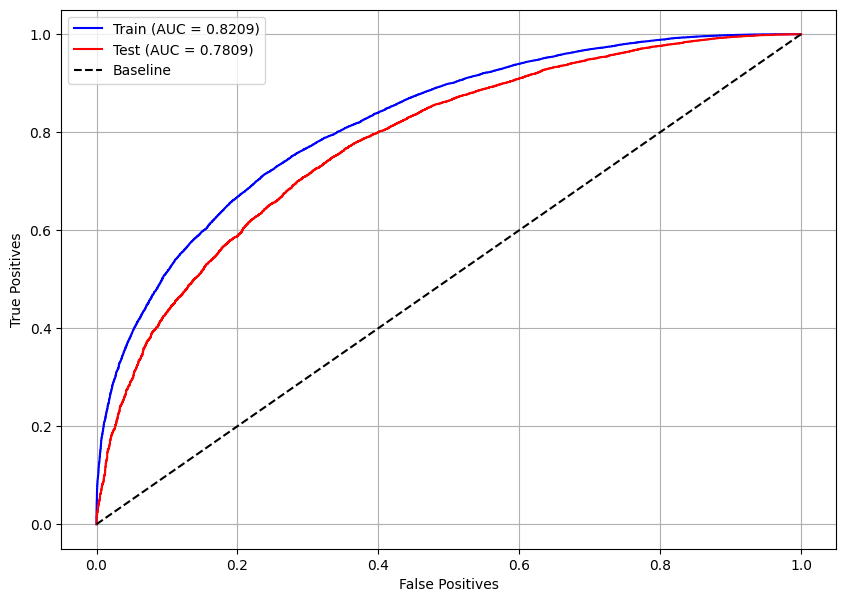

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_optuna, X_train, X_test, y_train, y_test)

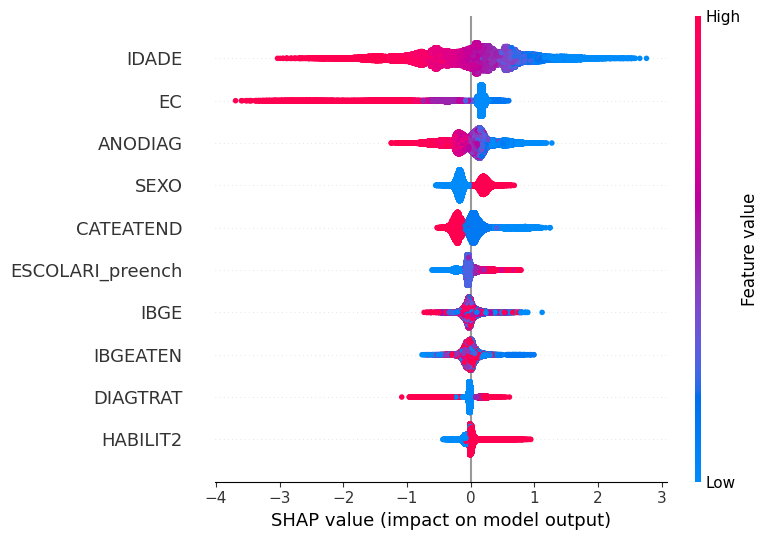

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(lgbm_optuna, X_train, feat_cols)

## **Voting Classifier**


In [ ]:
# Comparing the accuracy scores of the initial XGBoost model and the optimized Optuna model
xgb_score = xgb.score(X_test, y_test)
optuna_score = xgb_optuna.score(X_test, y_test)
print(f'Accuracy: XGB = {xgb_score:.4f}, Optuna = {optuna_score:.4f}\n')

# Determine which model performed better
if optuna_score >= xgb_score:
    params_xgb = xgb_optuna.get_params()  # Get the parameters of the optimized model
    print('Optimized model won')
else:
    params_xgb = xgb.get_params()  # Get the parameters of the initial model
    print('Initial model won')

Accuracy: XGB = 0.6960, Optuna = 0.7076

Otimizado venceu


In [ ]:
# Comparing the accuracy scores of the initial LightGBM model and the optimized Optuna model
lgbm_score = lgbm.score(X_test, y_test)
optuna_score = lgbm_optuna.score(X_test, y_test)
print(f'Accuracy: LGBM = {lgbm_score:.4f}, Optuna = {optuna_score:.4f}\n')

# Determine which model performed better
if optuna_score >= lgbm_score:
    params_lgbm = lgbm_optuna.get_params()  # Get the parameters of the optimized model
    print('Optimized model won')
else:
    params_lgbm = lgbm.get_params()  # Get the parameters of the initial model
    print('Initial model won')

Accuracy: LGBM = 0.6992, Optuna = 0.7077

Otimizado venceu


In [ ]:
# Creating the models with the best-performing hyperparameters
# XGBoost Model
best_xgb = XGBClassifier()  # Instantiate the XGBoost classifier
best_xgb.set_params(**params_xgb)  # Set the best hyperparameters for XGBoost

# LightGBM Model
best_lgbm = LGBMClassifier()  # Instantiate the LightGBM classifier
best_lgbm.set_params(**params_lgbm)  # Set the best hyperparameters for LightGBM

LGBMClassifier(class_weight={0: 3.5183, 1: 1}, colsample_bytree=0.5,
               learning_rate=0.17, max_depth=10, min_child_weight=5,
               n_estimators=150, random_state=7, verbose=-1)

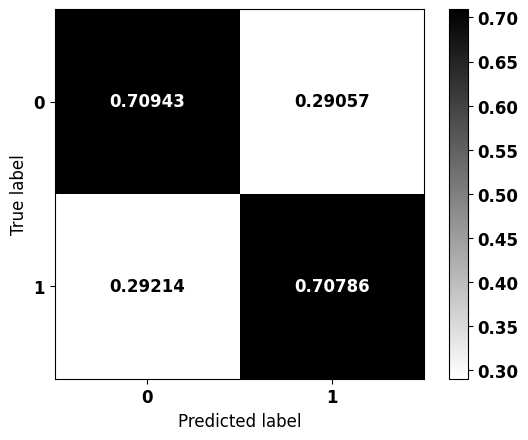


              precision    recall  f1-score   support

           0    0.42031   0.70943   0.52788      5799
           1    0.89082   0.70786   0.78887     19422

    accuracy                        0.70822     25221
   macro avg    0.65556   0.70864   0.65837     25221
weighted avg    0.78264   0.70822   0.72886     25221



In [ ]:
from sklearn.ensemble import VotingClassifier

# Creating and training the voting classifier model
clf = VotingClassifier(
    estimators=[('XGBoost', best_xgb),  # Adding the best XGBoost model
               ('LightGBM', best_lgbm)],  # Adding the best LightGBM model
    voting='soft'  # Using 'soft' voting, which predicts the class label based on predicted probabilities
)

clf.fit(X_train, y_train)  # Train the voting classifier on the training data

# Confusion Matrix
plot_confusion_matrix(clf, X_test, y_test)  # Plot the confusion matrix for the voting classifier on the test data

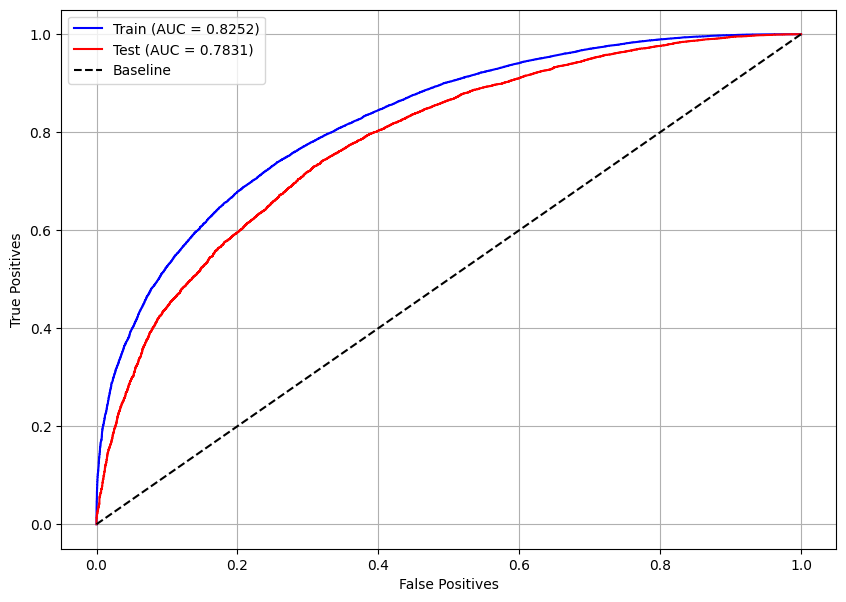

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(clf, X_train, X_test, y_train, y_test)

## **Tests with other cancer types**

In [ ]:
# Best Model Selection
models = [xgb, xgb_optuna, lgbm, lgbm_optuna]  # List of models to compare (XGBoost, optimized XGBoost, LightGBM, optimized LightGBM)

# Iterating through each model to find the best performing one
for i, m in enumerate(models):
    if i == 0:  # Initialize the best model as the first one
        best = m
    else:
        # Compare the performance of the current best model and the current model
        best_score = best.score(X_test, y_test)  # Get the accuracy of the current best model on the test set
        score = m.score(X_test, y_test)  # Get the accuracy of the current model on the test set
        if score > best_score:  # If the current model performs better, update the best model
            best = m

# Print the best performing model
print(best)

LGBMClassifier(class_weight={0: 3.5183, 1: 1}, colsample_bytree=0.5,
               learning_rate=0.17, max_depth=10, min_child_weight=5,
               n_estimators=150, random_state=7, verbose=-1)


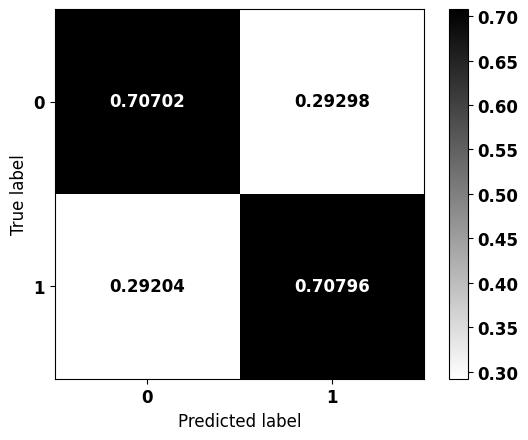


              precision    recall  f1-score   support

           0    0.41957   0.70702   0.52662      5799
           1    0.89003   0.70796   0.78862     19422

    accuracy                        0.70774     25221
   macro avg    0.65480   0.70749   0.65762     25221
weighted avg    0.78185   0.70774   0.72838     25221



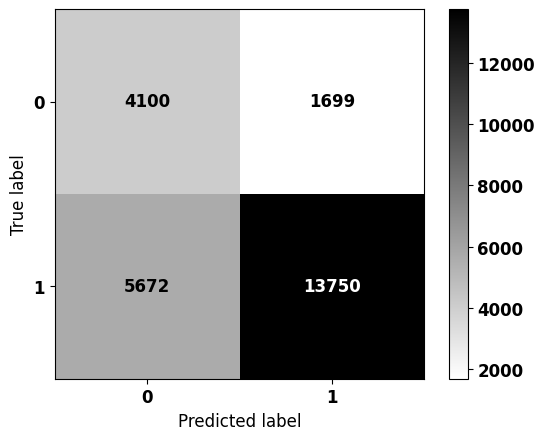


              precision    recall  f1-score   support

           0    0.41957   0.70702   0.52662      5799
           1    0.89003   0.70796   0.78862     19422

    accuracy                        0.70774     25221
   macro avg    0.65480   0.70749   0.65762     25221
weighted avg    0.78185   0.70774   0.72838     25221



In [ ]:
# Confusion Matrix for the Best Model
plot_confusion_matrix(best, X_test, y_test)  # Plot the normalized confusion matrix for the best model
plot_confusion_matrix(best, X_test, y_test, norm=False)  # Plot the unnormalized confusion matrix for the best model

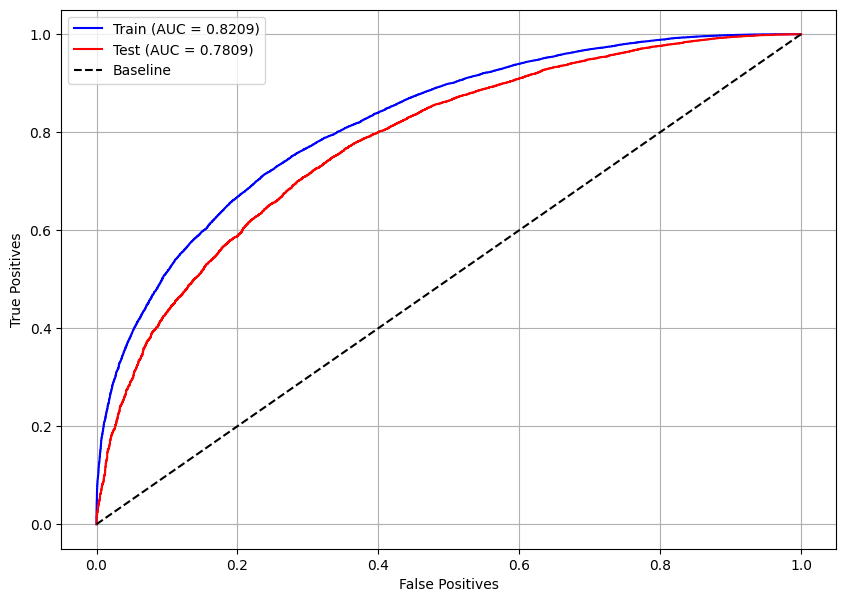

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(best, X_train, X_test, y_train, y_test)

/usr/local/lib/python3.10/dist-packages/shap/explainers/_tree.py:448: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn('LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray')


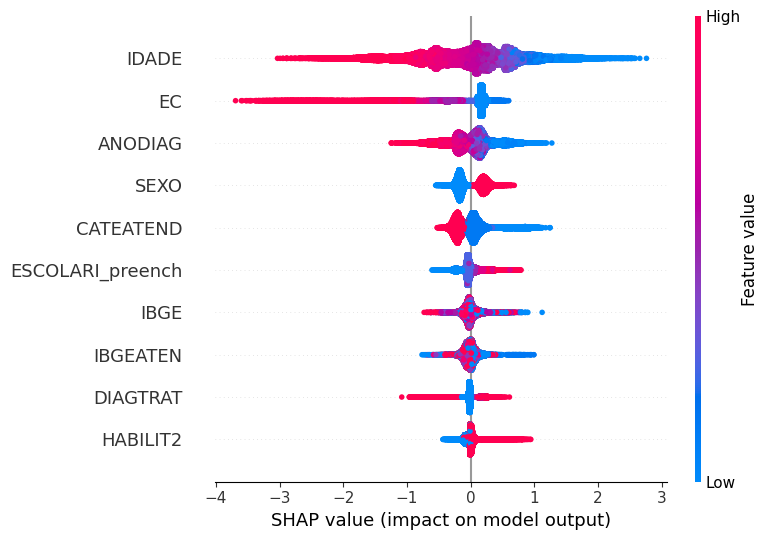

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(best, X_train, feat_cols)

In [ ]:
# Download test data
!gdown 194o9VVsCwcnt3Cp1oBbJdd0Sb_N2LOIF # Download the test dataset - More Frequent

# Load the dataset
df_teste = pd.read_csv('incid_teste.csv')

# Split the test data based on cancer types
mama_teste = df_teste[df_teste.TOPOGRUP.isin(['Mama'])]
pele_teste = df_teste[df_teste.TOPOGRUP.isin(['Pele'])]
prost_teste = df_teste[df_teste.TOPOGRUP.isin(['Próstata'])]
colo_teste = df_teste[df_teste.TOPOGRUP.isin(['Colorretal'])]
pulm_teste = df_teste[df_teste.TOPOGRUP.isin(['Pulmão'])]
colo_utero_teste = df_teste[df_teste.TOPOGRUP.isin(['Colo de Útero'])]

# Check the shapes of the resulting subsets
mama_teste.shape, pele_teste.shape, prost_teste.shape, colo_teste.shape, pulm_teste.shape, colo_utero_teste.shape

### **Breast**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'mama_teste' DataFrame
saida_mama = mama_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
mama_teste = mama_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'mama_teste' DataFrame
print(mama_teste.shape)
mama_teste.head(3)

(26133, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
2,-0.623264,0.078323,-0.758504,1.270371,-0.915765,-1.584428,0.5453,1.015205,-1.536653,0.848079,...,2.956862,-0.190274,-0.446767,-0.851058,-0.888302,0.743452,-0.803767,0.967430,-1.048322,-0.51497
10,-0.549923,0.078323,1.068808,-0.747659,-0.915765,-0.339226,0.5453,1.015205,0.650765,0.848079,...,2.956862,-0.190274,-1.367290,1.932872,-0.205138,-1.642306,-0.803767,-0.940442,-1.048322,-0.51497
11,0.110146,0.078323,0.854448,1.270371,-0.915765,-1.584428,0.5453,1.015205,0.650765,0.848079,...,1.273530,-0.190274,-1.735499,-0.851058,-0.660580,0.743452,0.599581,1.921366,0.953905,-0.51497


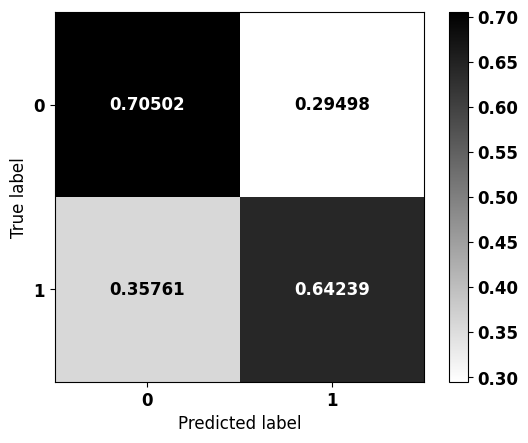


              precision    recall  f1-score   support

           0    0.32768   0.70502   0.44741      5180
           1    0.89805   0.64239   0.74901     20953

    accuracy                        0.65480     26133
   macro avg    0.61287   0.67370   0.59821     26133
weighted avg    0.78499   0.65480   0.68922     26133



In [ ]:
# Plot the confusion matrix for the best model on the 'mama_teste' dataset
plot_confusion_matrix(best, mama_teste, saida_mama)

### **Prostate**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'prost_teste' DataFrame
saida_prost = prost_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
prost_teste = prost_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'prost_teste' DataFrame
print(prost_teste.shape)
prost_teste.head(3)

(20862, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
3,0.149237,0.0,1.316000,-0.695899,0.723032,-0.63168,-0.879627,1.381841,-0.308078,1.085991,...,-0.418644,-0.208982,0.051988,0.032404,1.523967,-0.540997,-0.971798,-0.714113,-0.906043,-0.414926
12,-1.225865,0.0,0.958232,-0.695899,0.723032,0.27992,1.136845,-0.723672,-0.308078,-0.920818,...,-0.418644,-0.208982,0.841591,-1.029723,-0.860966,0.842650,0.451912,0.355595,1.103700,-0.414926
18,-0.423722,0.0,-0.370160,-0.695899,0.723032,-1.99908,-0.879627,1.381841,-0.308078,-0.920818,...,-0.418644,-0.208982,1.236393,0.032404,1.523967,-0.540997,-0.971798,1.425303,-0.906043,-0.414926


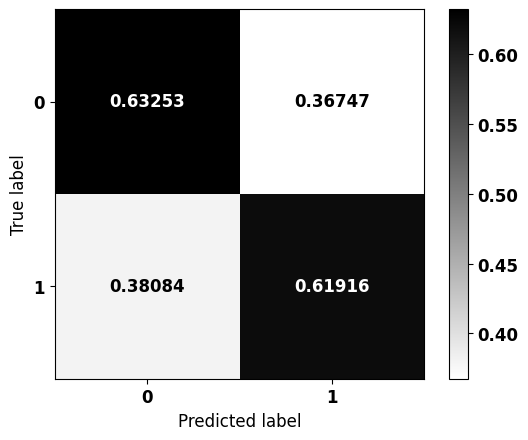


              precision    recall  f1-score   support

           0    0.24235   0.63253   0.35044      3369
           1    0.89742   0.61916   0.73277     17493

    accuracy                        0.62132     20862
   macro avg    0.56989   0.62585   0.54160     20862
weighted avg    0.79164   0.62132   0.67102     20862



In [ ]:
# Plot the confusion matrix for the best model on the 'prost_teste' dataset
plot_confusion_matrix(best, prost_teste, saida_prost)

### **Colorectal**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'colo_teste' DataFrame
saida_colo = colo_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
colo_teste = colo_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'colo_teste' DataFrame
print(colo_teste.shape)
colo_teste.head(3)

(14028, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
0,0.366829,-0.972134,1.141405,1.343451,0.958036,-0.047542,0.60093,-0.567847,0.737288,-0.07854,...,-0.325938,-0.193018,-1.734289,1.587885,0.660606,-1.716753,0.396181,1.180668,-1.03687,-0.475073
1,-0.166349,-0.972134,-0.649610,1.343451,0.958036,-0.873817,0.60093,1.761039,0.737288,-0.07854,...,-0.325938,-0.143566,-0.209650,1.767959,-0.282288,0.900562,-0.968850,0.154944,-1.03687,-0.475073
6,-0.318686,-0.972134,-1.770966,-0.714301,0.958036,1.329585,0.60093,-0.567847,0.737288,-0.07854,...,-0.325938,-0.193018,1.314989,-0.032782,-0.046564,-0.607175,0.396181,2.206391,-1.03687,-0.475073


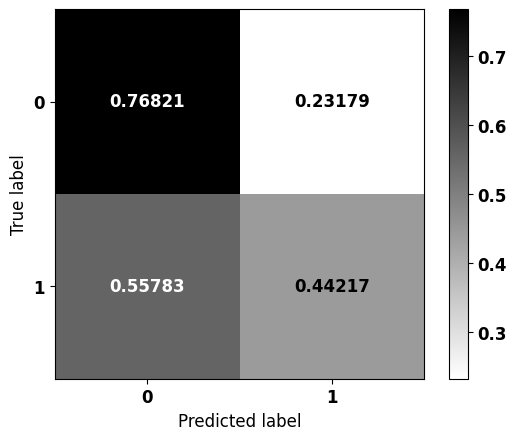


              precision    recall  f1-score   support

           0    0.52695   0.76821   0.62511      6273
           1    0.70223   0.44217   0.54265      7755

    accuracy                        0.58797     14028
   macro avg    0.61459   0.60519   0.58388     14028
weighted avg    0.62385   0.58797   0.57953     14028



In [ ]:
# Plot the confusion matrix for the best model on the 'colo_teste' dataset
plot_confusion_matrix(best, colo_teste, saida_colo)

### **Lung**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'pulm_teste' DataFrame
saida_pulm = pulm_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
pulm_teste = pulm_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'pulm_teste' DataFrame
print(pulm_teste.shape)
pulm_teste.head(3)

(9252, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
8,-0.805560,-0.778211,0.751797,-0.853227,1.364883,-0.536078,-0.468319,-0.748999,-1.335116,-0.070691,...,-0.403143,-0.432328,0.663596,-0.846783,-1.881064,0.667417,-1.225737,0.274789,0.973507,-0.407845
27,0.123762,1.284999,0.990635,-0.853227,1.364883,0.640728,-0.468319,-0.748999,0.748999,-0.070691,...,-0.403143,-0.459489,1.022562,-0.846783,-1.171009,0.755208,0.238090,0.274789,-1.027214,2.451912
33,0.960153,-0.778211,0.844979,1.133388,-0.732664,-2.889689,2.135297,-0.748999,-1.335116,-0.070691,...,1.394771,-0.459489,0.304629,-0.846783,-0.697638,0.755208,0.238090,-0.775222,0.973507,2.451912


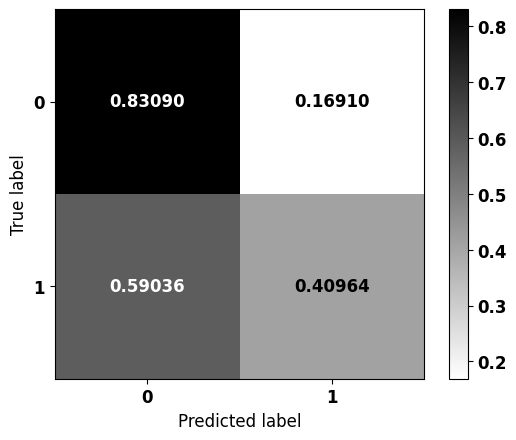


              precision    recall  f1-score   support

           0    0.90051   0.83090   0.86431      8007
           1    0.27361   0.40964   0.32808      1245

    accuracy                        0.77421      9252
   macro avg    0.58706   0.62027   0.59619      9252
weighted avg    0.81615   0.77421   0.79215      9252



In [ ]:
# Plot the confusion matrix for the best model on the 'pulm_teste' dataset
plot_confusion_matrix(best, pulm_teste, saida_pulm)

### **Cervical**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'colo_utero_teste' DataFrame
saida_colo_utero = colo_utero_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
colo_utero_teste = colo_utero_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'colo_utero_teste' DataFrame
print(colo_utero_teste.shape)
colo_utero_teste.head(3)

(5368, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
40,0.519132,0.0,0.929895,-0.892955,-1.099583,-2.175331,1.259960,-1.349244,-0.933285,-0.087376,...,4.004901,-0.269490,0.413337,-0.892417,-0.710476,0.814678,0.639879,-1.668349,1.088759,-0.459887
63,0.722950,0.0,0.009041,-0.892955,0.909436,0.794350,-0.793676,-1.349244,-0.933285,-0.087376,...,-0.292508,4.381396,0.936614,-0.892417,-0.936297,0.814678,0.639879,-0.614620,-0.918477,-0.459887
76,-0.092323,0.0,1.103217,-0.892955,0.909436,0.794350,1.259960,-1.349244,1.071484,-0.087376,...,-0.292508,-0.175532,0.936614,1.467974,1.321912,-1.416945,0.639879,-0.614620,-0.918477,2.174445


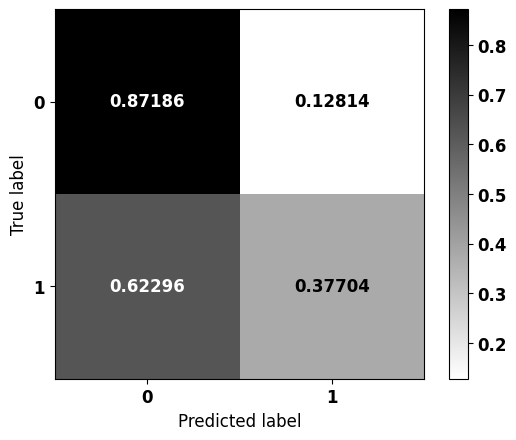


              precision    recall  f1-score   support

           0    0.51391   0.87186   0.64665      2310
           1    0.79572   0.37704   0.51165      3058

    accuracy                        0.58998      5368
   macro avg    0.65481   0.62445   0.57915      5368
weighted avg    0.67445   0.58998   0.56974      5368



In [ ]:
# Plot the confusion matrix for the best model on the 'colo_utero_teste' dataset
plot_confusion_matrix(best, colo_utero_teste, saida_colo_utero)

# **Prostate**

In [ ]:
# Display the shape (number of rows and columns) of the prostate cancer dataset
print(df_prost.shape)

# Show the first three rows of the dataset to inspect its structure and values
df_prost.head(3)

(83445, 32)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,TOPO,TOPOGRUP,EC,TRATHOSP,NENHUM,...,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec,obito_geral,sobrevida_ano1,sobrevida_ano3,sobrevida_ano5
0,74,1,3518701,9,1,C619,C61,II,I,0,...,7,3518701,1,2.0,1,0,1,1,1,1
1,78,1,3518701,9,1,C619,C61,II,I,0,...,7,3518701,1,3.0,1,0,0,1,1,1
2,60,1,3518701,9,2,C619,C61,II,I,0,...,7,3518701,1,3.0,1,0,0,1,1,1


In [ ]:
# Missing values
df_prost.isna().sum().sort_values(ascending=False).head(6)

IDADE             0
SEXO              0
sobrevida_ano3    0
sobrevida_ano1    0
obito_geral       0
presenca_rec      0
dtype: int64

In [ ]:
# Compute the correlation matrix for numerical features in the prostate cancer dataset
corr_matrix = df_prost.corr(numeric_only=True)

# Get the absolute correlation values with the target variable 'sobrevida_ano3',
# sort them in descending order, and display the top 20 most correlated features
abs(corr_matrix['sobrevida_ano3']).sort_values(ascending=False).head(20)

sobrevida_ano3        1.000000
sobrevida_ano5        0.560232
sobrevida_ano1        0.542615
obito_geral           0.495667
IDADE                 0.188485
CIRURGIA              0.131056
QUIMIO                0.125216
TRATCONS              0.098753
CATEATEND             0.097919
HORMONIO              0.096619
DIAGTRAT              0.096111
DIAGPREV              0.095582
ESCOLARI_preench      0.088228
NENHUM                0.085927
RADIO                 0.070873
ANODIAG               0.043506
presenca_rec          0.031445
IBGE_idem_IBGEATEN    0.027160
CONSDIAG              0.021789
RRAS                  0.020393
Name: sobrevida_ano3, dtype: float64

In [ ]:
# Count the number of patients in each class of the target variable 'sobrevida_ano3'
df_prost.sobrevida_ano3.value_counts()

sobrevida_ano3
1    69969
0    13476
Name: count, dtype: int64

## **Preprocessing**

In [ ]:
# Preprocessed data setup

# List of columns to drop from the dataset, including treatment-related, tumor location, and other survival indicators
list_drop = ['TRATHOSP', 'TOPO', 'TOPOGRUP', 'NENHUM', 'TRATCONS', 'obito_geral',
             'sobrevida_ano1', 'sobrevida_ano5']

# Target variable for classification
lb = 'sobrevida_ano3'

# Perform preprocessing, including feature selection, encoding, and normalization
# Returns training and test sets (features and labels), feature column names, encoder, and normalization method
X_train, X_test, y_train, y_test, feat_cols, enc, norm = preprocessing(df_prost,
                                                                       list_drop, lb,
                                                                       norm_name='StandardScaler',
                                                                       return_enc_norm=True,
                                                                       random_state=seed)

X_train = (62583, 23), X_test = (20862, 23)
y_train = (62583,), y_test = (20862,)


In [ ]:
# Training dataset for Prostate Cancer

# Create a DataFrame for training data with selected features
prost_treino = pd.DataFrame(X_train, columns=feat_cols)

# Add the 'TOPOGRUP' column to indicate the cancer type (here, 'Próstata' for Prostate Cancer)
prost_treino['TOPOGRUP'] = 'Próstata'

# Add the target variable (survival after 3 years) to the training dataset
prost_treino['sobrevida_3anos'] = y_train.values

# Testing dataset for Prostate Cancer

# Create a DataFrame for testing data with selected features
prost_teste = pd.DataFrame(X_test, columns=feat_cols)

# Add the 'TOPOGRUP' column to indicate the cancer type (here, 'Próstata' for Prostate Cancer)
prost_teste['TOPOGRUP'] = 'Próstata'

# Add the target variable (survival after 3 years) to the testing dataset
prost_teste['sobrevida_3anos'] = y_test.values

## **Training and validation of machine learning models**

### **XGBoost**


#### **Base model**

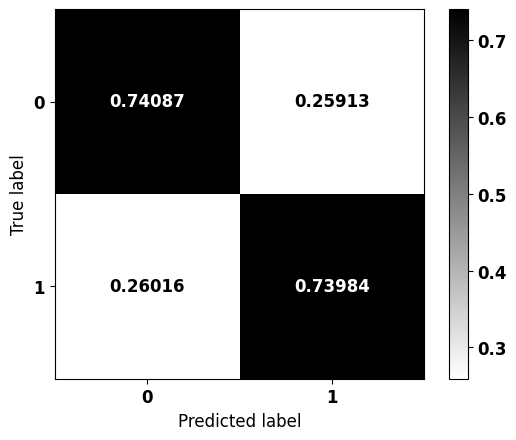


              precision    recall  f1-score   support

           0    0.35419   0.74087   0.47926      3369
           1    0.93681   0.73984   0.82675     17493

    accuracy                        0.74001     20862
   macro avg    0.64550   0.74036   0.65301     20862
weighted avg    0.84272   0.74001   0.77064     20862



In [ ]:
# Creating and training the XGBoost model
# Initialize an XGBoost classifier with specified parameters
xgb = XGBClassifier(max_depth=4,                # Set maximum tree depth to 4
                    scale_pos_weight=0.1675,    # Adjust class imbalance using scale_pos_weight
                    random_state=seed)          # Ensure reproducibility

# Train the model using the training dataset
xgb.fit(X_train, y_train)

# Confusion matrix
# Generate and display the confusion matrix for model evaluation
plot_confusion_matrix(xgb, X_test, y_test)

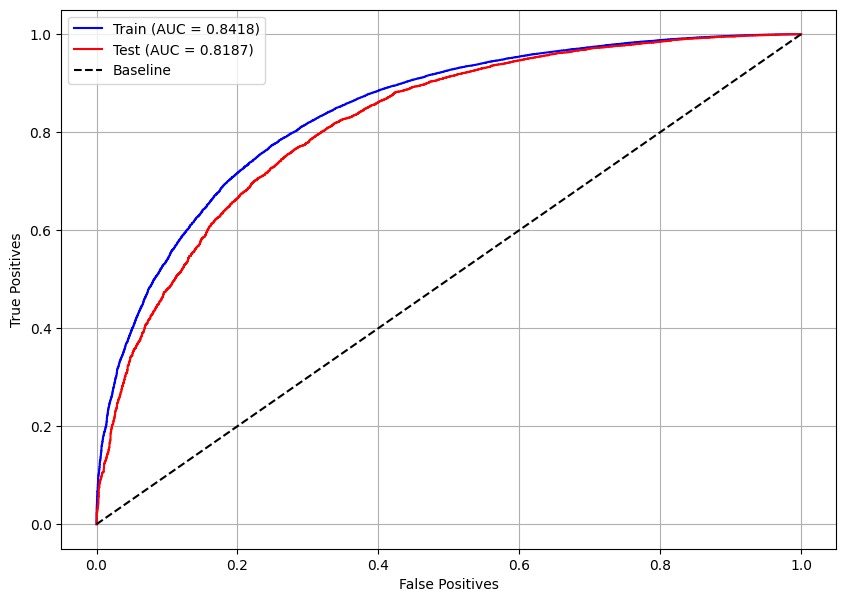

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb, X_train, X_test, y_train, y_test)

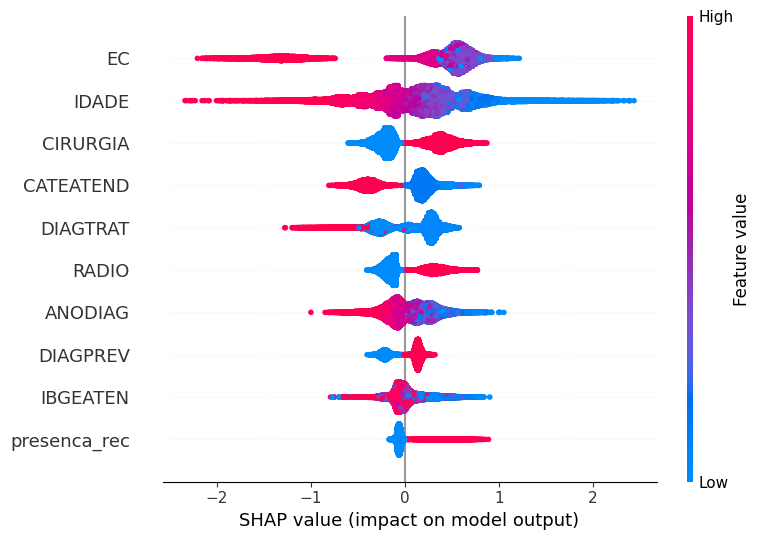

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(xgb, X_train, feat_cols)

#### **Optuna**

In [ ]:
# Creating stratified folds with the same class proportions
skf = StratifiedKFold(10, shuffle=True, random_state=seed)

# Function defining the model and its hyperparameters, which will be optimized
# to maximize the evaluation metric
def objective(trial):

    # Hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 50, 150)  # Number of trees
    max_depth = trial.suggest_int('max_depth', 3, 6)  # Maximum tree depth
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.2, step=0.05)  # Learning rate
    gamma = trial.suggest_float('gamma', 0.0, 0.3, step=0.1)  # Regularization term
    min_child_weight = trial.suggest_int('min_child_weight', 1, 7)  # Minimum sum of weights in a child node
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.3, 0.7, step=0.1)  # Fraction of features sampled per tree

    # XGBoost classifier with suggested hyperparameters
    cls = XGBClassifier(n_estimators=n_estimators,
                        max_depth=max_depth,
                        learning_rate=learning_rate,
                        gamma=gamma,
                        min_child_weight=min_child_weight,
                        colsample_bytree=colsample_bytree,
                        random_state=seed,
                        n_jobs=-1)

    # Performing cross-validation and returning the mean accuracy score
    return cross_val_score(cls, X_train, y_train,
                           cv=skf, scoring='accuracy').mean()

##### RandomSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=RandomSampler(seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 122,
 'max_depth': 6,
 'learning_rate': 0.2,
 'gamma': 0.1,
 'min_child_weight': 6,
 'colsample_bytree': 0.7}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(0.155, 0.18, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

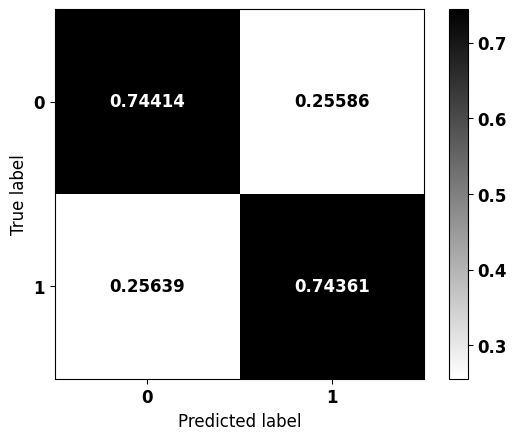


              precision    recall  f1-score   support

           0    0.35855   0.74414   0.48393      3369
           1    0.93785   0.74361   0.82951     17493

    accuracy                        0.74370     20862
   macro avg    0.64820   0.74387   0.65672     20862
weighted avg    0.84430   0.74370   0.77370     20862



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 0.161  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_rand = XGBClassifier()
xgb_rand.set_params(**params)

# Training the optimized model on the training dataset
xgb_rand.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_rand, X_test, y_test)

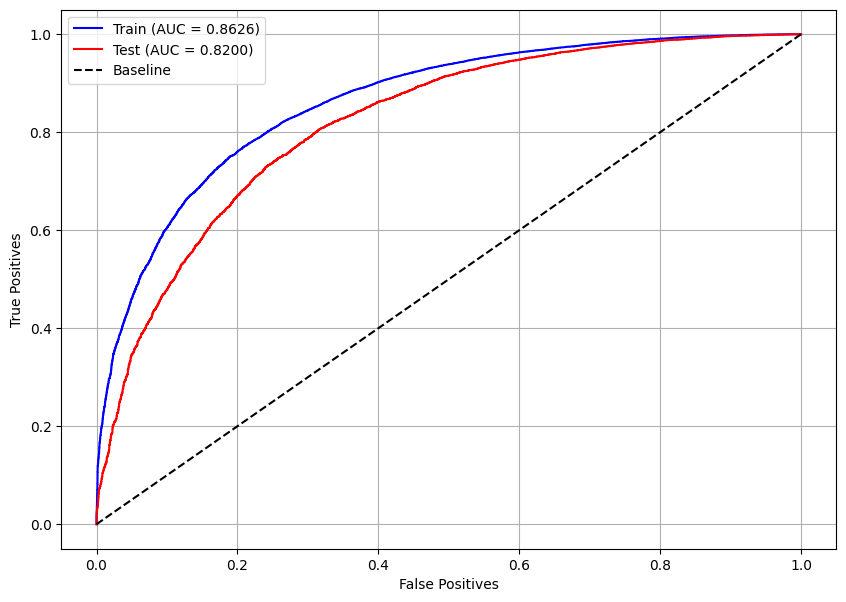

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_rand, X_train, X_test, y_train, y_test)

##### TPESampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=TPESampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 148,
 'max_depth': 6,
 'learning_rate': 0.15000000000000002,
 'gamma': 0.1,
 'min_child_weight': 6,
 'colsample_bytree': 0.4}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(0.16, 0.18, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

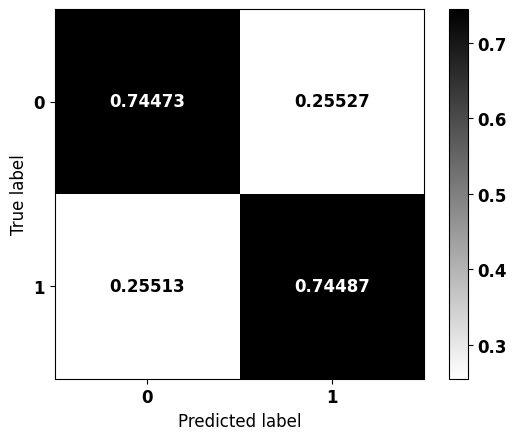


              precision    recall  f1-score   support

           0    0.35987   0.74473   0.48525      3369
           1    0.93808   0.74487   0.83039     17493

    accuracy                        0.74485     20862
   macro avg    0.64898   0.74480   0.65782     20862
weighted avg    0.84471   0.74485   0.77465     20862



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 0.1628  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_tpe = XGBClassifier()
xgb_tpe.set_params(**params)

# Training the optimized model on the training dataset
xgb_tpe.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_tpe, X_test, y_test)

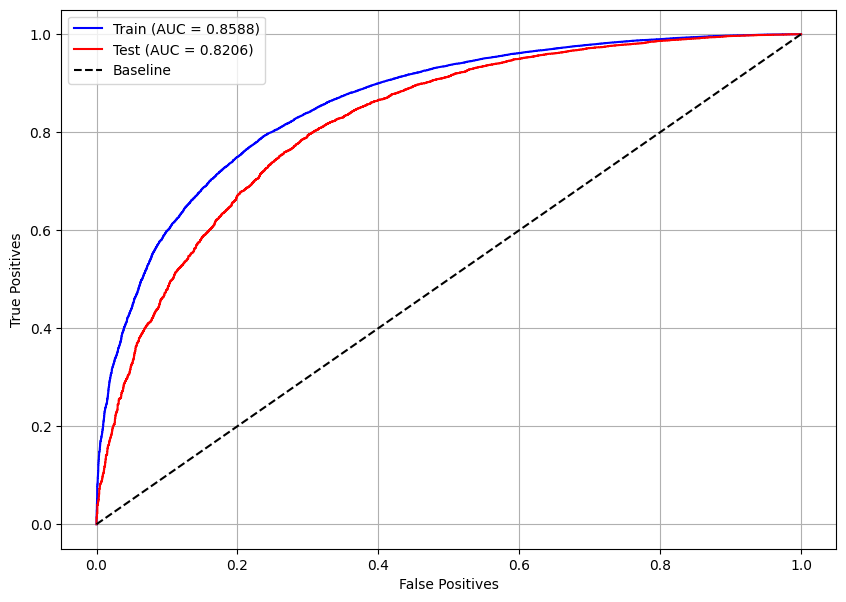

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_tpe, X_train, X_test, y_train, y_test)

##### CmaEsSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=CmaEsSampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 110,
 'max_depth': 6,
 'learning_rate': 0.1,
 'gamma': 0.1,
 'min_child_weight': 3,
 'colsample_bytree': 0.5}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(0.16, 0.18, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

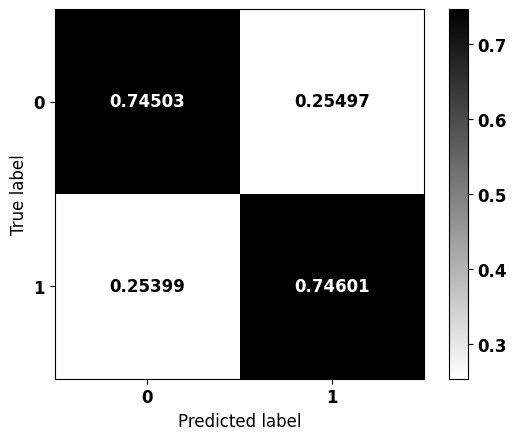


              precision    recall  f1-score   support

           0    0.36100   0.74503   0.48634      3369
           1    0.93824   0.74601   0.83116     17493

    accuracy                        0.74585     20862
   macro avg    0.64962   0.74552   0.65875     20862
weighted avg    0.84502   0.74585   0.77547     20862



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 0.1655  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_cma = XGBClassifier()
xgb_cma.set_params(**params)

# Training the optimized model on the training dataset
xgb_cma.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_cma, X_test, y_test)

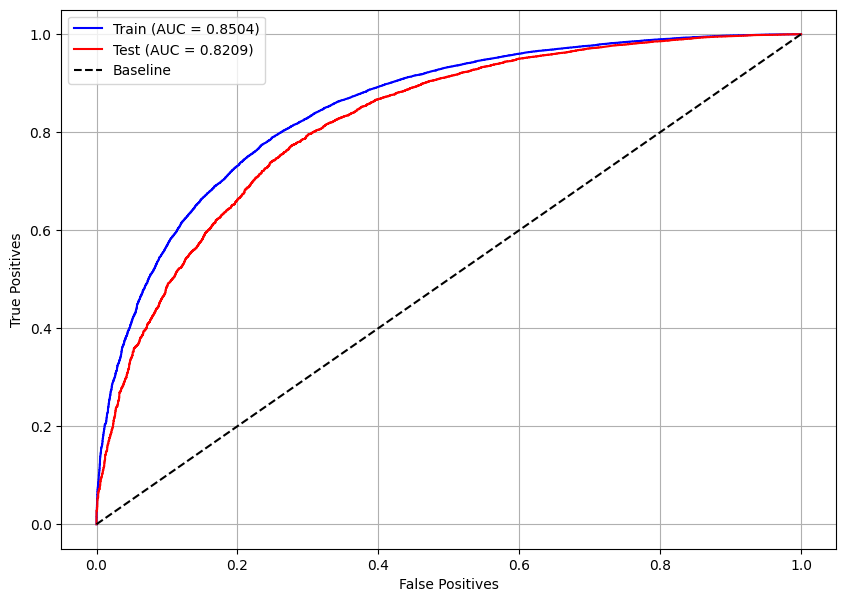

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_cma, X_train, X_test, y_train, y_test)

##### Optimized model

In [ ]:
# Selecting the best model based on performance
models = [xgb_rand, xgb_tpe, xgb_cma]  # List of trained models
best = models[0]  # Initialize the best model as the first in the list

# Iterate through the models to find the one with the highest accuracy score
for i, m in enumerate(models):
    if i == 0:
        continue  # Skip the first model since it's already assigned as 'best'

    best_score = best.score(X_test, y_test)  # Accuracy of the current best model
    score = m.score(X_test, y_test)  # Accuracy of the current model being evaluated

    if score > best_score:  # Update 'best' if the current model has a higher score
        best = m

# Print the best-performing model
print(best)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.5, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=3, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=110, n_jobs=None,
              num_parallel_tree=None, random_state=7, ...)


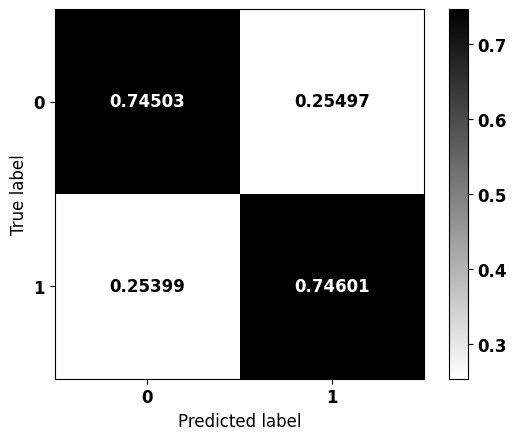


              precision    recall  f1-score   support

           0    0.36100   0.74503   0.48634      3369
           1    0.93824   0.74601   0.83116     17493

    accuracy                        0.74585     20862
   macro avg    0.64962   0.74552   0.65875     20862
weighted avg    0.84502   0.74585   0.77547     20862



In [ ]:
# Training the final XGBoost model using the best parameters
# Retrieve the best hyperparameters from the selected model
params = best.get_params()

# Initialize a new XGBoost classifier with the best parameters
xgb_optuna = XGBClassifier()
xgb_optuna.set_params(**params)

# Train the optimized model on the training data
xgb_optuna.fit(X_train, y_train)

# Plot the confusion matrix to evaluate the model's performance on the test set
plot_confusion_matrix(xgb_optuna, X_test, y_test)

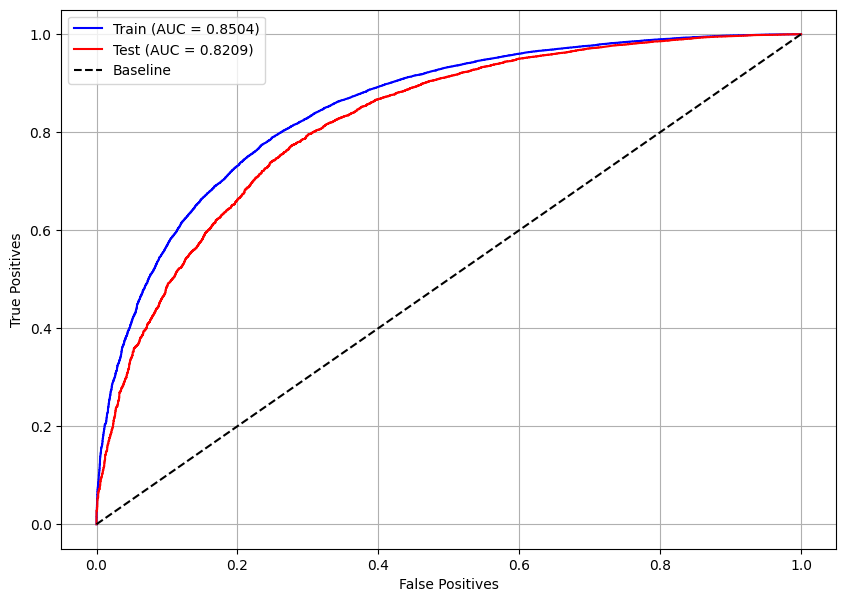

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_optuna, X_train, X_test, y_train, y_test)

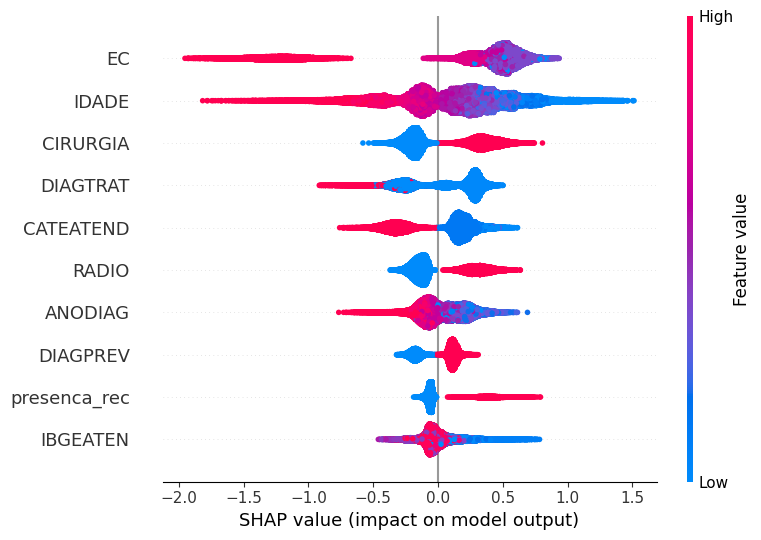

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(xgb_optuna, X_train, feat_cols)

### **LightGBM**


#### **Base model**

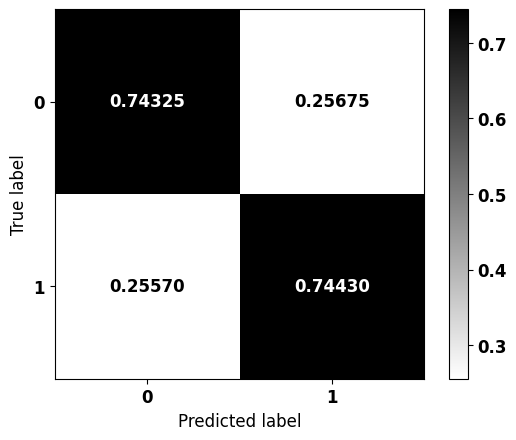


              precision    recall  f1-score   support

           0    0.35889   0.74325   0.48405      3369
           1    0.93770   0.74430   0.82988     17493

    accuracy                        0.74413     20862
   macro avg    0.64830   0.74377   0.65697     20862
weighted avg    0.84423   0.74413   0.77403     20862



In [ ]:
# Creating and training the LightGBM model
# Initialize an LightGBM classifier with specified parameters
lgbm = LGBMClassifier(max_depth=10,                 # Set maximum tree depth to 10
                      class_weight={0:6.025, 1:1},  # Adjust class imbalance using class_weight
                      random_state=seed,            # Ensure reproducibility
                      verbose=-1)

# Train the model using the training dataset
lgbm.fit(X_train, y_train)

# Confusion matrix
# Generate and display the confusion matrix for model evaluation
plot_confusion_matrix(lgbm, X_test, y_test)

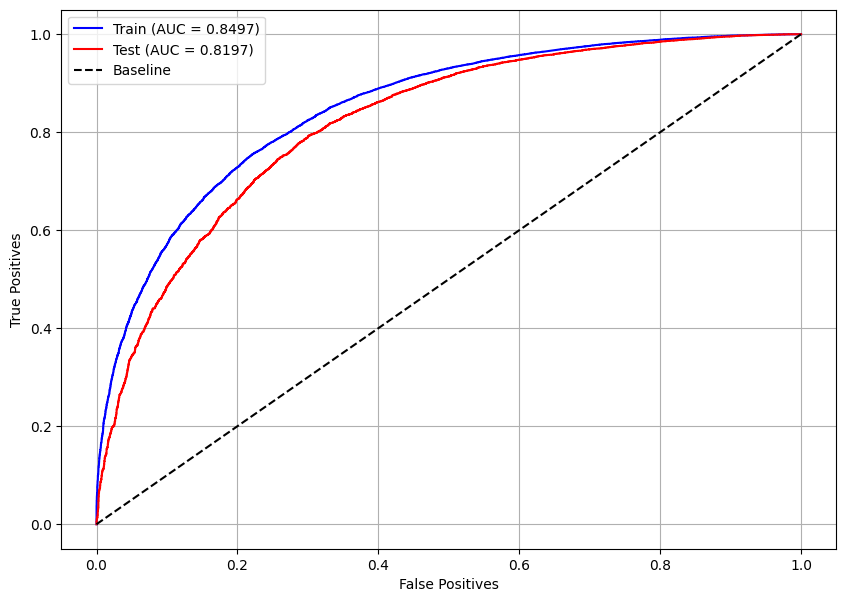

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm, X_train, X_test, y_train, y_test)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


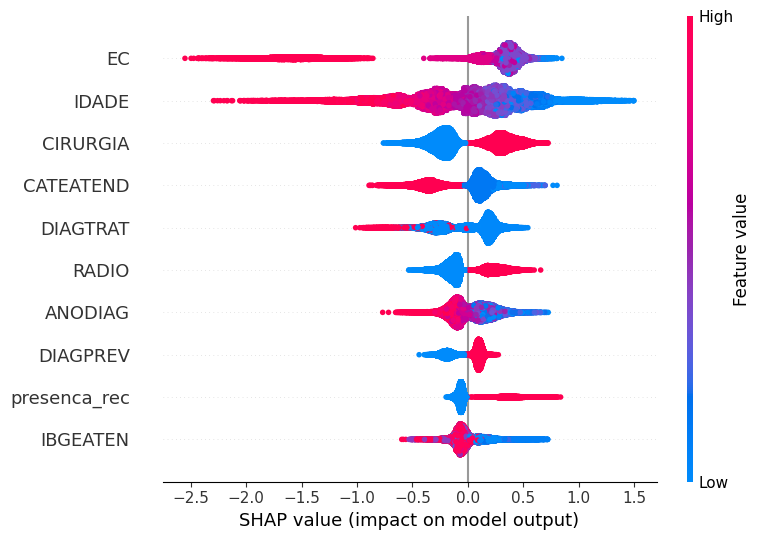

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(lgbm, X_train, feat_cols)

#### **Optuna**

In [ ]:
# Creating stratified folds with the same class proportions
skf = StratifiedKFold(10, shuffle=True, random_state=seed)

# Function defining the model and its hyperparameters, which will be optimized
# to maximize the evaluation metric
def objective(trial):

    # Hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 50, 150)  # Number of trees
    max_depth = trial.suggest_int('max_depth', 3, 8)  # Maximum tree depth
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.2, step=0.01)  # Learning rate
    min_child_weight = trial.suggest_int('min_child_weight', 1, 7)  # Minimum sum of weights in a child node
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.3, 0.7, step=0.1)  # Fraction of features sampled per tree

    # LightGBM classifier with suggested hyperparameters
    cls = LGBMClassifier(n_estimators=n_estimators,
                         max_depth=max_depth,
                         learning_rate=learning_rate,
                         min_child_weight=min_child_weight,
                         colsample_bytree=colsample_bytree,
                         random_state=seed,
                         verbose=-1,
                         n_jobs=-1)

    # Performing cross-validation and returning the mean accuracy score
    return cross_val_score(cls, X_train, y_train,
                           cv=skf, scoring='accuracy').mean()

##### RandomSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=RandomSampler(seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 117,
 'max_depth': 6,
 'learning_rate': 0.12000000000000001,
 'min_child_weight': 7,
 'colsample_bytree': 0.5}

In [ ]:
pesos = np.round(np.arange(1.41, 1.43, 0.0001), 4)

params = studyLGBM.best_params
params['random_state'] = seed

for i in pesos:
    params['class_weight'] = {0:1, 1:i}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(5.9, 6.1, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:i, 1:1}

    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    lgbm_optuna.fit(X_train, y_train)
    y_pred = lgbm_optuna.predict(X_test)

    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()
    if abs(tn - tp) <= 0.001:

        print(i)
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)
        print()

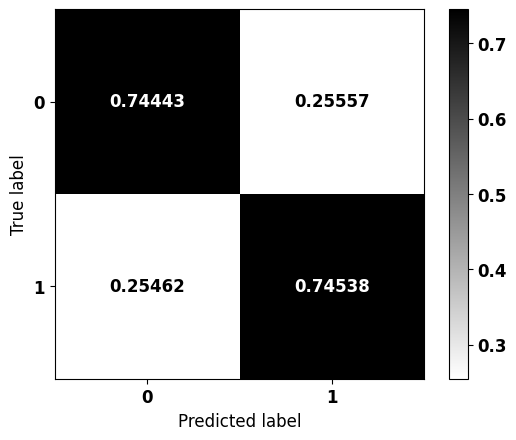


              precision    recall  f1-score   support

           0    0.36024   0.74443   0.48553      3369
           1    0.93806   0.74538   0.83069     17493

    accuracy                        0.74523     20862
   macro avg    0.64915   0.74491   0.65811     20862
weighted avg    0.84475   0.74523   0.77495     20862



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:6.041, 1:1}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_rand = LGBMClassifier(verbose=-1)
lgbm_rand.set_params(**params)

# Training the optimized model on the training dataset
lgbm_rand.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_rand, X_test, y_test)

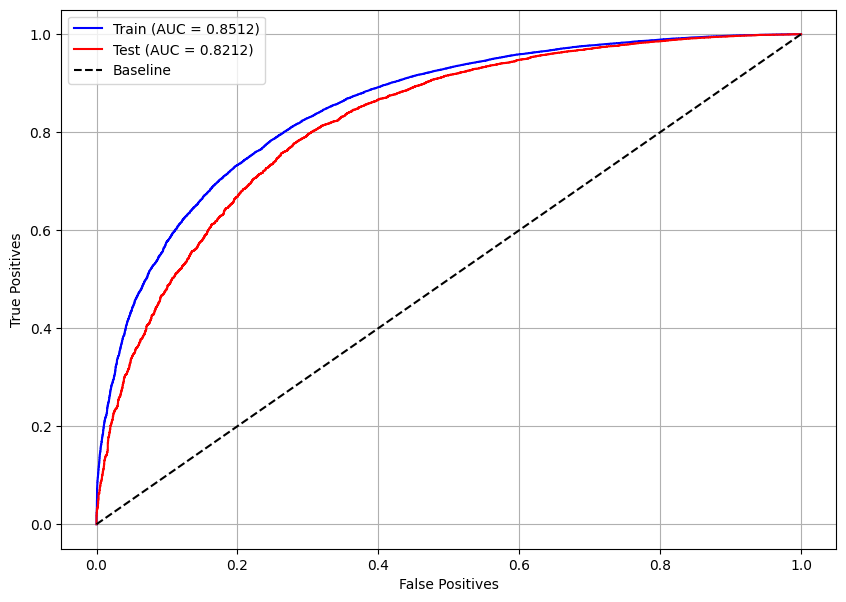

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_rand, X_train, X_test, y_train, y_test)

##### TPESampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=TPESampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 85,
 'max_depth': 7,
 'learning_rate': 0.11,
 'min_child_weight': 6,
 'colsample_bytree': 0.6000000000000001}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(5.9, 6.1, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:i, 1:1}

    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    lgbm_optuna.fit(X_train, y_train)
    y_pred = lgbm_optuna.predict(X_test)

    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()
    if abs(tn - tp) <= 0.001:

        print(i)
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)
        print()

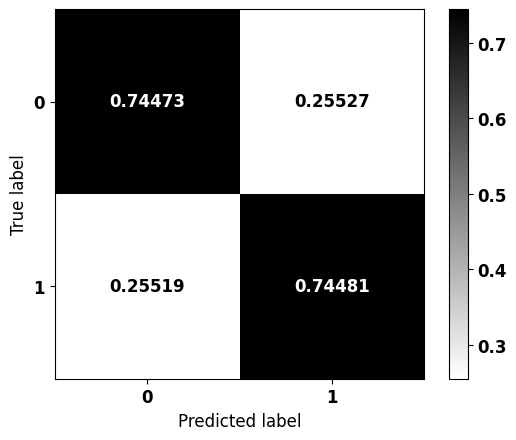


              precision    recall  f1-score   support

           0    0.35982   0.74473   0.48521      3369
           1    0.93808   0.74481   0.83035     17493

    accuracy                        0.74480     20862
   macro avg    0.64895   0.74477   0.65778     20862
weighted avg    0.84470   0.74480   0.77461     20862



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:5.939, 1:1}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_tpe = LGBMClassifier(verbose=-1)
lgbm_tpe.set_params(**params)

# Training the optimized model on the training dataset
lgbm_tpe.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_tpe, X_test, y_test)

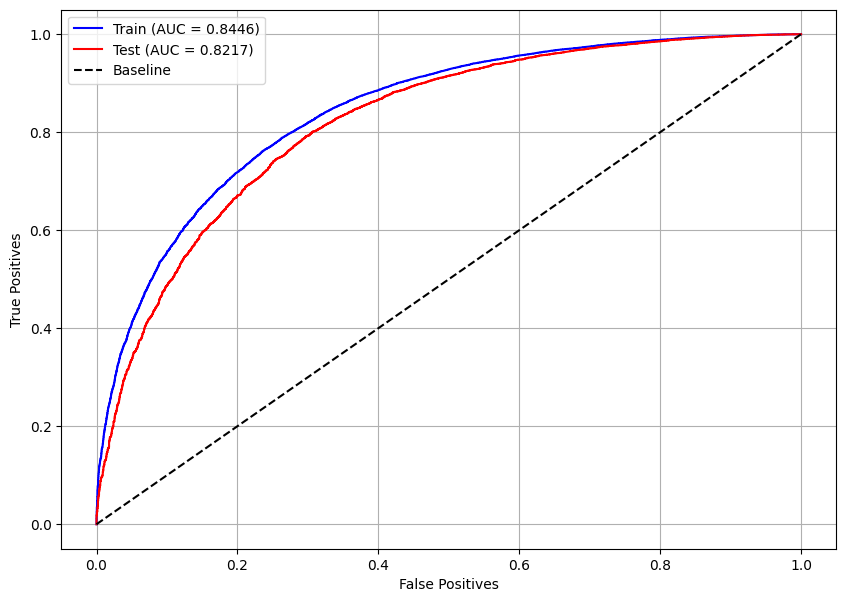

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_tpe, X_train, X_test, y_train, y_test)

##### CmaEsSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=CmaEsSampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 134,
 'max_depth': 8,
 'learning_rate': 0.1,
 'min_child_weight': 3,
 'colsample_bytree': 0.6000000000000001}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(6, 6.2, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:i, 1:1}

    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    lgbm_optuna.fit(X_train, y_train)
    y_pred = lgbm_optuna.predict(X_test)

    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()
    if abs(tn - tp) <= 0.001:

        print(i)
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)
        print()

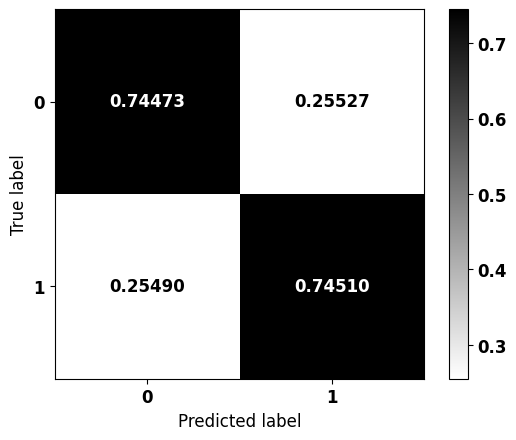


              precision    recall  f1-score   support

           0    0.36007   0.74473   0.48544      3369
           1    0.93810   0.74510   0.83053     17493

    accuracy                        0.74504     20862
   macro avg    0.64909   0.74491   0.65799     20862
weighted avg    0.84476   0.74504   0.77481     20862



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:6.06, 1:1}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_cma = LGBMClassifier(verbose=-1)
lgbm_cma.set_params(**params)

# Training the optimized model on the training dataset
lgbm_cma.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_cma, X_test, y_test)

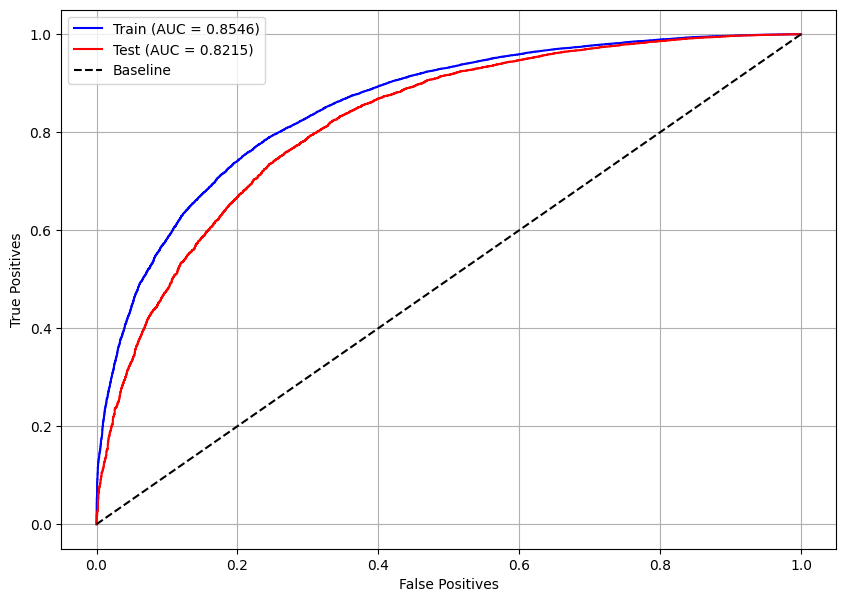

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_cma, X_train, X_test, y_train, y_test)

##### Optimized model

In [ ]:
# Selecting the best model based on performance
models = [lgbm_rand, lgbm_tpe, lgbm_cma]  # List of trained models
best = models[0]  # Initialize the best model as the first in the list

# Iterate through the models to find the one with the highest accuracy score
for i, m in enumerate(models):
    if i == 0:
        continue  # Skip the first model since it's already assigned as 'best'

    best_score = best.score(X_test, y_test)  # Accuracy of the current best model
    score = m.score(X_test, y_test)  # Accuracy of the current model being evaluated

    if score > best_score:  # Update 'best' if the current model has a higher score
        best = m

# Print the best-performing model
print(best)

LGBMClassifier(class_weight={0: 6.041, 1: 1}, colsample_bytree=0.5,
               learning_rate=0.12, max_depth=6, min_child_weight=7,
               n_estimators=117, random_state=7, verbose=-1)


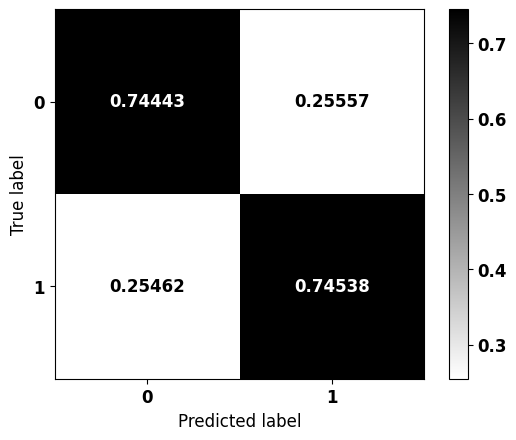


              precision    recall  f1-score   support

           0    0.36024   0.74443   0.48553      3369
           1    0.93806   0.74538   0.83069     17493

    accuracy                        0.74523     20862
   macro avg    0.64915   0.74491   0.65811     20862
weighted avg    0.84475   0.74523   0.77495     20862



In [ ]:
# Training the final XGBoost model using the best parameters
# Retrieve the best hyperparameters from the selected model
params = best.get_params()

# Initialize a new XGBoost classifier with the best parameters
lgbm_optuna = LGBMClassifier(verbose=-1)
lgbm_optuna.set_params(**params)

# Train the optimized model on the training data
lgbm_optuna.fit(X_train, y_train)

# Plot the confusion matrix to evaluate the model's performance on the test set
plot_confusion_matrix(lgbm_optuna, X_test, y_test)

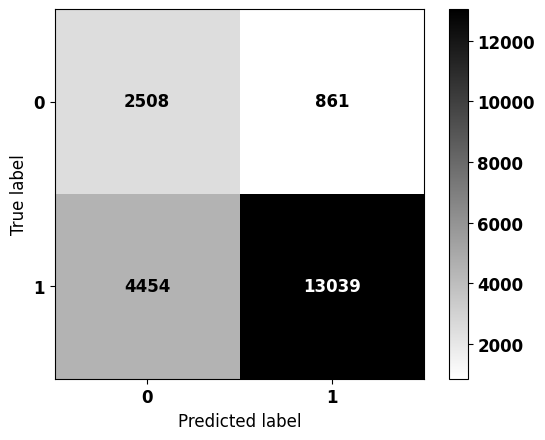


              precision    recall  f1-score   support

           0    0.36024   0.74443   0.48553      3369
           1    0.93806   0.74538   0.83069     17493

    accuracy                        0.74523     20862
   macro avg    0.64915   0.74491   0.65811     20862
weighted avg    0.84475   0.74523   0.77495     20862



In [ ]:
# Plot the confusion matrix for the optimized XGBoost model
# Set norm=False to display absolute values instead of normalized percentages
plot_confusion_matrix(lgbm_optuna, X_test, y_test, norm=False)

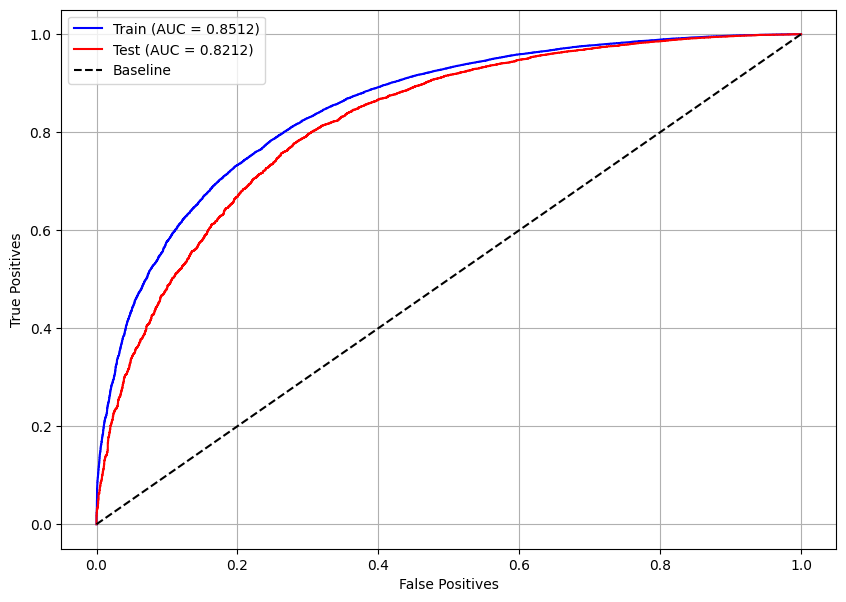

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_optuna, X_train, X_test, y_train, y_test)

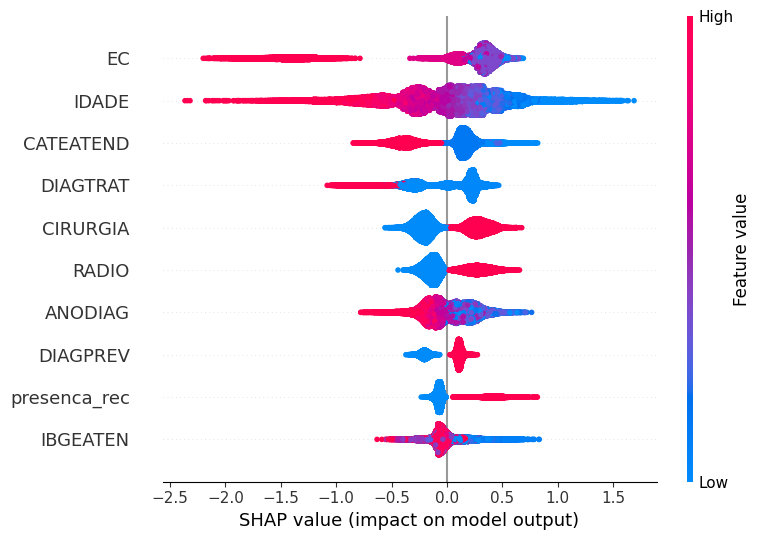

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(lgbm_optuna, X_train, feat_cols)

## **Voting Classifier**


In [ ]:
# Comparing the accuracy scores of the initial XGBoost model and the optimized Optuna model
xgb_score = xgb.score(X_test, y_test)
optuna_score = xgb_optuna.score(X_test, y_test)
print(f'Accuracy: XGB = {xgb_score:.4f}, Optuna = {optuna_score:.4f}\n')

# Determine which model performed better
if optuna_score >= xgb_score:
    params_xgb = xgb_optuna.get_params()  # Get the parameters of the optimized model
    print('Optimized model won')
else:
    params_xgb = xgb.get_params()  # Get the parameters of the initial model
    print('Initial model won')

Accuracy: XGB = 0.7400, Optuna = 0.7459

Otimizado venceu


In [ ]:
# Comparing the accuracy scores of the initial LightGBM model and the optimized Optuna model
lgbm_score = lgbm.score(X_test, y_test)
optuna_score = lgbm_optuna.score(X_test, y_test)
print(f'Accuracy: LGBM = {lgbm_score:.4f}, Optuna = {optuna_score:.4f}\n')

# Determine which model performed better
if optuna_score >= lgbm_score:
    params_lgbm = lgbm_optuna.get_params()  # Get the parameters of the optimized model
    print('Optimized model won')
else:
    params_lgbm = lgbm.get_params()  # Get the parameters of the initial model
    print('Initial model won')

Accuracy: LGBM = 0.7441, Optuna = 0.7452

Otimizado venceu


In [ ]:
# Creating the models with the best-performing hyperparameters
# XGBoost Model
best_xgb = XGBClassifier()  # Instantiate the XGBoost classifier
best_xgb.set_params(**params_xgb)  # Set the best hyperparameters for XGBoost

# LightGBM Model
best_lgbm = LGBMClassifier()  # Instantiate the LightGBM classifier
best_lgbm.set_params(**params_lgbm)  # Set the best hyperparameters for LightGBM

LGBMClassifier(class_weight={0: 6.041, 1: 1}, colsample_bytree=0.5,
               learning_rate=0.12, max_depth=6, min_child_weight=7,
               n_estimators=117, random_state=7, verbose=-1)

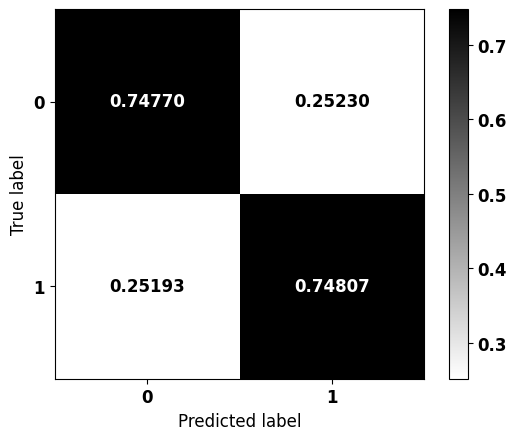


              precision    recall  f1-score   support

           0    0.36370   0.74770   0.48936      3369
           1    0.93901   0.74807   0.83273     17493

    accuracy                        0.74801     20862
   macro avg    0.65135   0.74789   0.66105     20862
weighted avg    0.84610   0.74801   0.77728     20862



In [ ]:
from sklearn.ensemble import VotingClassifier

# Creating and training the voting classifier model
clf = VotingClassifier(
    estimators=[('XGBoost', best_xgb),  # Adding the best XGBoost model
               ('LightGBM', best_lgbm)],  # Adding the best LightGBM model
    voting='soft'  # Using 'soft' voting, which predicts the class label based on predicted probabilities
)

clf.fit(X_train, y_train)  # Train the voting classifier on the training data

# Confusion Matrix
plot_confusion_matrix(clf, X_test, y_test)  # Plot the confusion matrix for the voting classifier on the test data

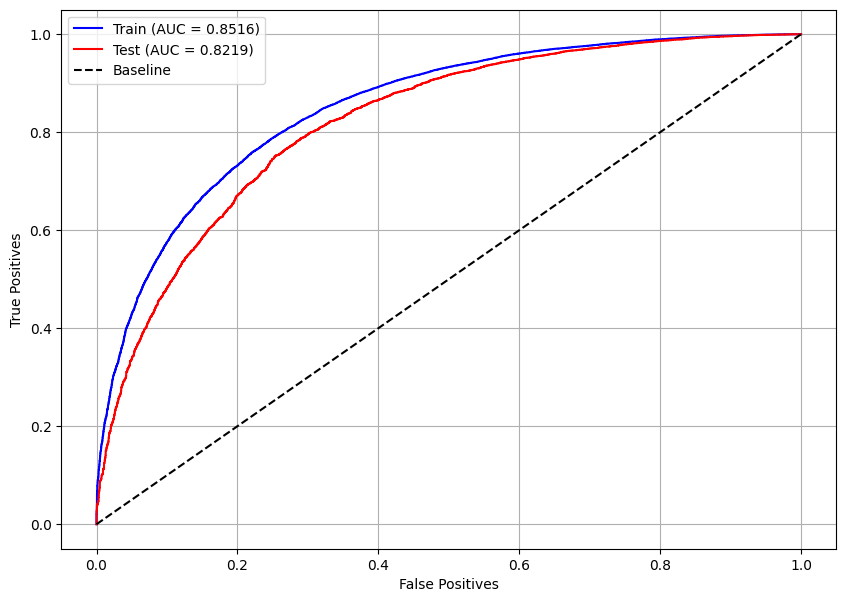

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(clf, X_train, X_test, y_train, y_test)

## **Tests with other cancer types**

In [ ]:
# Best Model Selection
models = [xgb, xgb_optuna, lgbm, lgbm_optuna]  # List of models to compare (XGBoost, optimized XGBoost, LightGBM, optimized LightGBM)

# Iterating through each model to find the best performing one
for i, m in enumerate(models):
    if i == 0:  # Initialize the best model as the first one
        best = m
    else:
        # Compare the performance of the current best model and the current model
        best_score = best.score(X_test, y_test)  # Get the accuracy of the current best model on the test set
        score = m.score(X_test, y_test)  # Get the accuracy of the current model on the test set
        if score > best_score:  # If the current model performs better, update the best model
            best = m

# Print the best performing model
print(best)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.5, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=3, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=110, n_jobs=None,
              num_parallel_tree=None, random_state=7, ...)


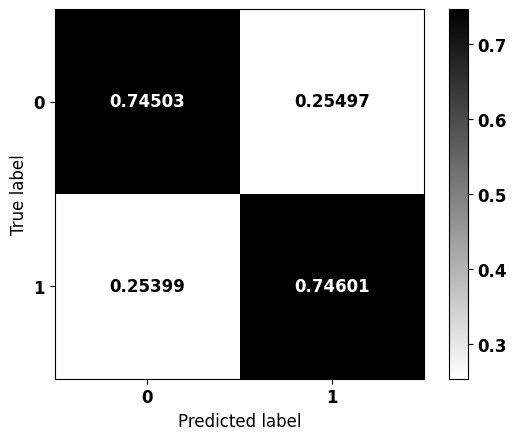


              precision    recall  f1-score   support

           0    0.36100   0.74503   0.48634      3369
           1    0.93824   0.74601   0.83116     17493

    accuracy                        0.74585     20862
   macro avg    0.64962   0.74552   0.65875     20862
weighted avg    0.84502   0.74585   0.77547     20862



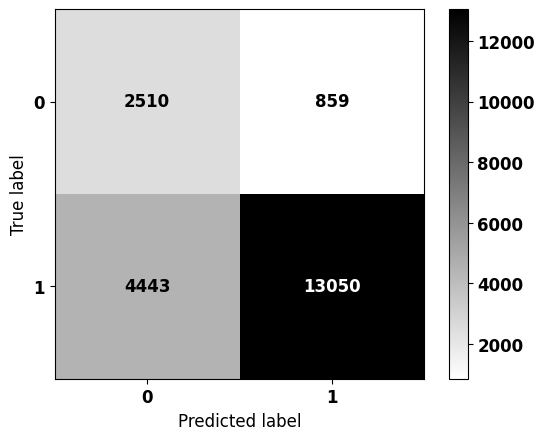


              precision    recall  f1-score   support

           0    0.36100   0.74503   0.48634      3369
           1    0.93824   0.74601   0.83116     17493

    accuracy                        0.74585     20862
   macro avg    0.64962   0.74552   0.65875     20862
weighted avg    0.84502   0.74585   0.77547     20862



In [ ]:
# Confusion Matrix for the Best Model
plot_confusion_matrix(best, X_test, y_test)  # Plot the normalized confusion matrix for the best model
plot_confusion_matrix(best, X_test, y_test, norm=False)  # Plot the unnormalized confusion matrix for the best model

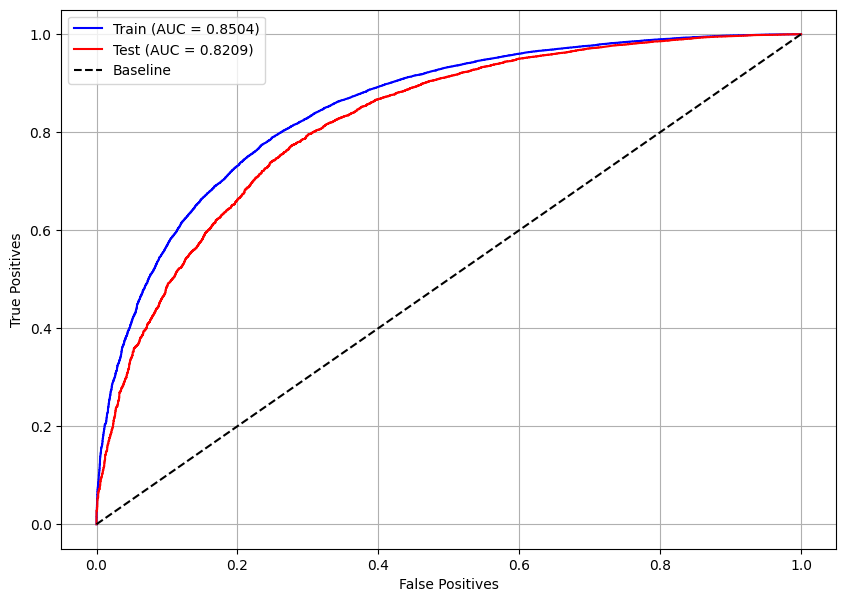

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(best, X_train, X_test, y_train, y_test)

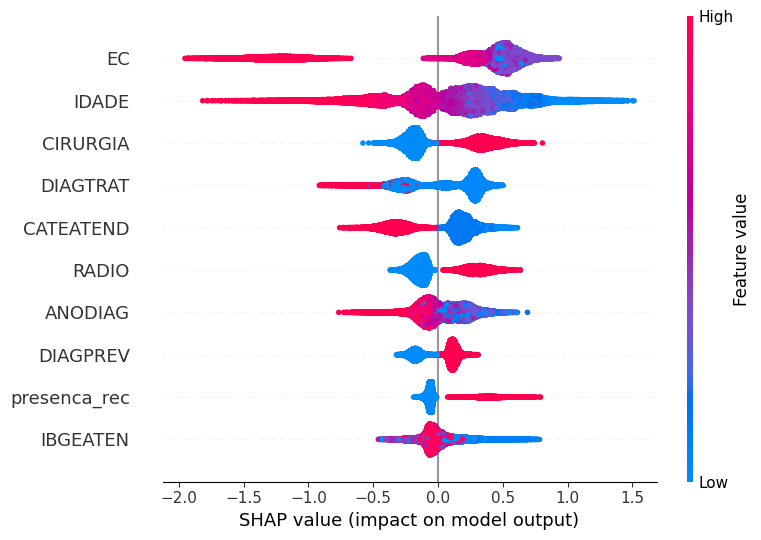

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(best, X_train, feat_cols)

In [ ]:
# Download test data
!gdown 194o9VVsCwcnt3Cp1oBbJdd0Sb_N2LOIF # Download the test dataset - More Frequent

# Load the dataset
df_teste = pd.read_csv('incid_teste.csv')

# Split the test data based on cancer types
mama_teste = df_teste[df_teste.TOPOGRUP.isin(['Mama'])]
pele_teste = df_teste[df_teste.TOPOGRUP.isin(['Pele'])]
prost_teste = df_teste[df_teste.TOPOGRUP.isin(['Próstata'])]
colo_teste = df_teste[df_teste.TOPOGRUP.isin(['Colorretal'])]
pulm_teste = df_teste[df_teste.TOPOGRUP.isin(['Pulmão'])]
colo_utero_teste = df_teste[df_teste.TOPOGRUP.isin(['Colo de Útero'])]

# Check the shapes of the resulting subsets
mama_teste.shape, pele_teste.shape, prost_teste.shape, colo_teste.shape, pulm_teste.shape, colo_utero_teste.shape

### **Breast**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'mama_teste' DataFrame
saida_mama = mama_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
mama_teste = mama_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'mama_teste' DataFrame
print(mama_teste.shape)
mama_teste.head(3)

(26133, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
2,-0.623264,0.078323,-0.758504,1.270371,-0.915765,-1.584428,0.5453,1.015205,-1.536653,0.848079,...,2.956862,-0.190274,-0.446767,-0.851058,-0.888302,0.743452,-0.803767,0.967430,-1.048322,-0.51497
10,-0.549923,0.078323,1.068808,-0.747659,-0.915765,-0.339226,0.5453,1.015205,0.650765,0.848079,...,2.956862,-0.190274,-1.367290,1.932872,-0.205138,-1.642306,-0.803767,-0.940442,-1.048322,-0.51497
11,0.110146,0.078323,0.854448,1.270371,-0.915765,-1.584428,0.5453,1.015205,0.650765,0.848079,...,1.273530,-0.190274,-1.735499,-0.851058,-0.660580,0.743452,0.599581,1.921366,0.953905,-0.51497


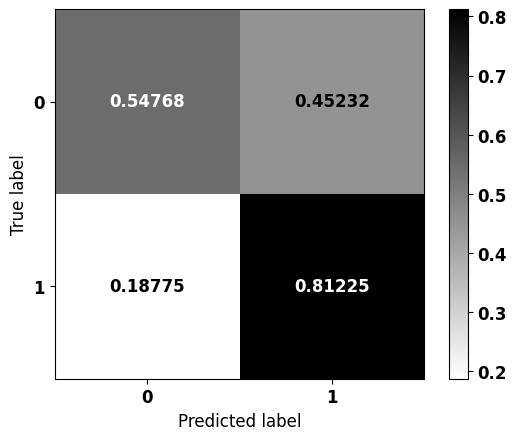


              precision    recall  f1-score   support

           0    0.41899   0.54768   0.47477      5180
           1    0.87899   0.81225   0.84430     20953

    accuracy                        0.75981     26133
   macro avg    0.64899   0.67996   0.65954     26133
weighted avg    0.78781   0.75981   0.77105     26133



In [ ]:
# Plot the confusion matrix for the best model on the 'mama_teste' dataset
plot_confusion_matrix(best, mama_teste, saida_mama)

### **Skin**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'pele_teste' DataFrame
saida_pele = pele_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
pele_teste = pele_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'pele_teste' DataFrame
print(pele_teste.shape)
pele_teste.head(3)

(25221, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
4,0.324125,-0.916019,-0.841077,1.167751,-0.344597,-0.429061,0.315561,-0.242155,-0.156064,-0.03833,...,0.591376,-0.20941,-0.716428,1.436258,0.636483,-1.212419,0.393904,-1.404163,-0.776427,-0.218179
5,0.701083,-0.916019,0.447649,1.167751,-0.344597,-0.429061,0.315561,-0.242155,-0.156064,-0.03833,...,-0.689569,-0.20941,0.240058,-0.214815,-0.234417,-1.110069,-1.165675,1.588451,-0.776427,-0.218179
7,-0.052834,-0.916019,0.069663,-0.808623,-0.344597,-0.429061,0.315561,-0.242155,-0.156064,-0.03833,...,1.872320,-0.20941,0.813950,-0.398268,0.926783,-1.212419,0.393904,-0.406625,-0.776427,-0.218179


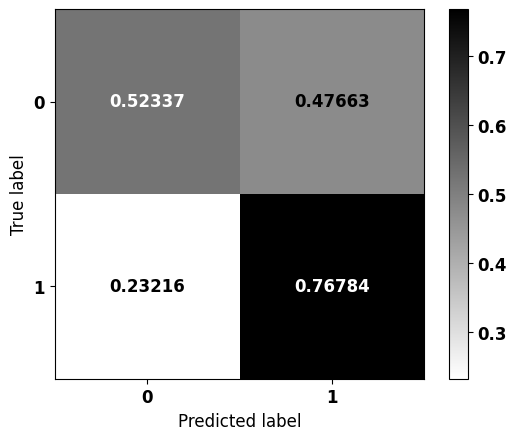


              precision    recall  f1-score   support

           0    0.40231   0.52337   0.45492      5799
           1    0.84364   0.76784   0.80396     19422

    accuracy                        0.71163     25221
   macro avg    0.62297   0.64560   0.62944     25221
weighted avg    0.74216   0.71163   0.72370     25221



In [ ]:
# Plot the confusion matrix for the best model on the 'pele_teste' dataset
plot_confusion_matrix(best, pele_teste, saida_pele)

### **Colorectal**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'colo_teste' DataFrame
saida_colo = colo_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
colo_teste = colo_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'colo_teste' DataFrame
print(colo_teste.shape)
colo_teste.head(3)

(14028, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
0,0.366829,-0.972134,1.141405,1.343451,0.958036,-0.047542,0.60093,-0.567847,0.737288,-0.07854,...,-0.325938,-0.193018,-1.734289,1.587885,0.660606,-1.716753,0.396181,1.180668,-1.03687,-0.475073
1,-0.166349,-0.972134,-0.649610,1.343451,0.958036,-0.873817,0.60093,1.761039,0.737288,-0.07854,...,-0.325938,-0.143566,-0.209650,1.767959,-0.282288,0.900562,-0.968850,0.154944,-1.03687,-0.475073
6,-0.318686,-0.972134,-1.770966,-0.714301,0.958036,1.329585,0.60093,-0.567847,0.737288,-0.07854,...,-0.325938,-0.193018,1.314989,-0.032782,-0.046564,-0.607175,0.396181,2.206391,-1.03687,-0.475073


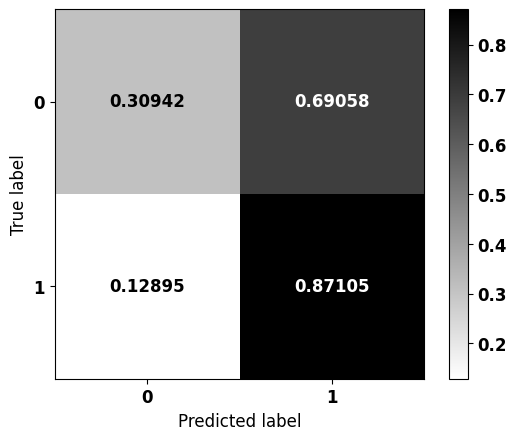


              precision    recall  f1-score   support

           0    0.65998   0.30942   0.42132      6273
           1    0.60927   0.87105   0.71702      7755

    accuracy                        0.61990     14028
   macro avg    0.63463   0.59024   0.56917     14028
weighted avg    0.63195   0.61990   0.58479     14028



In [ ]:
# Plot the confusion matrix for the best model on the 'colo_teste' dataset
plot_confusion_matrix(best, colo_teste, saida_colo)

### **Lung**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'pulm_teste' DataFrame
saida_pulm = pulm_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
pulm_teste = pulm_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'pulm_teste' DataFrame
print(pulm_teste.shape)
pulm_teste.head(3)

(9252, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
8,-0.805560,-0.778211,0.751797,-0.853227,1.364883,-0.536078,-0.468319,-0.748999,-1.335116,-0.070691,...,-0.403143,-0.432328,0.663596,-0.846783,-1.881064,0.667417,-1.225737,0.274789,0.973507,-0.407845
27,0.123762,1.284999,0.990635,-0.853227,1.364883,0.640728,-0.468319,-0.748999,0.748999,-0.070691,...,-0.403143,-0.459489,1.022562,-0.846783,-1.171009,0.755208,0.238090,0.274789,-1.027214,2.451912
33,0.960153,-0.778211,0.844979,1.133388,-0.732664,-2.889689,2.135297,-0.748999,-1.335116,-0.070691,...,1.394771,-0.459489,0.304629,-0.846783,-0.697638,0.755208,0.238090,-0.775222,0.973507,2.451912


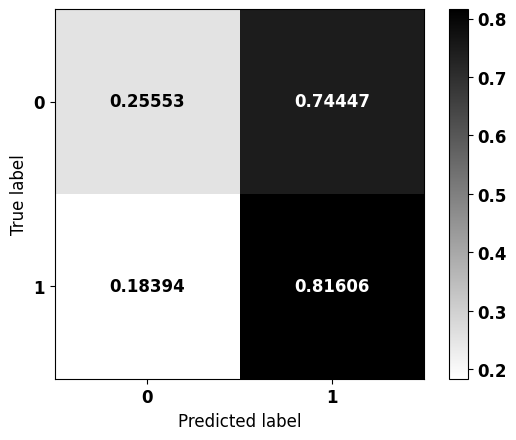


              precision    recall  f1-score   support

           0    0.89934   0.25553   0.39798      8007
           1    0.14562   0.81606   0.24714      1245

    accuracy                        0.33096      9252
   macro avg    0.52248   0.53580   0.32256      9252
weighted avg    0.79792   0.33096   0.37768      9252



In [ ]:
# Plot the confusion matrix for the best model on the 'pulm_teste' dataset
plot_confusion_matrix(best, pulm_teste, saida_pulm)

### **Cervical**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'colo_utero_teste' DataFrame
saida_colo_utero = colo_utero_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
colo_utero_teste = colo_utero_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'colo_utero_teste' DataFrame
print(colo_utero_teste.shape)
colo_utero_teste.head(3)

(5368, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
40,0.519132,0.0,0.929895,-0.892955,-1.099583,-2.175331,1.259960,-1.349244,-0.933285,-0.087376,...,4.004901,-0.269490,0.413337,-0.892417,-0.710476,0.814678,0.639879,-1.668349,1.088759,-0.459887
63,0.722950,0.0,0.009041,-0.892955,0.909436,0.794350,-0.793676,-1.349244,-0.933285,-0.087376,...,-0.292508,4.381396,0.936614,-0.892417,-0.936297,0.814678,0.639879,-0.614620,-0.918477,-0.459887
76,-0.092323,0.0,1.103217,-0.892955,0.909436,0.794350,1.259960,-1.349244,1.071484,-0.087376,...,-0.292508,-0.175532,0.936614,1.467974,1.321912,-1.416945,0.639879,-0.614620,-0.918477,2.174445


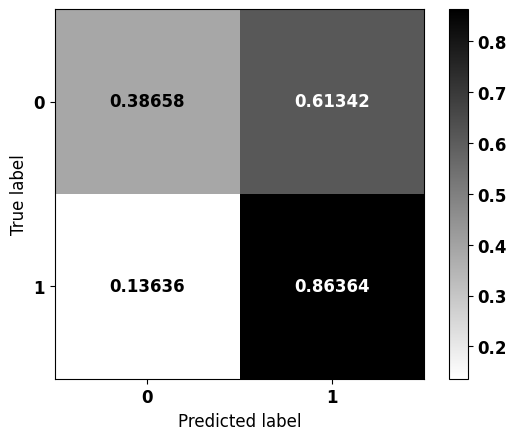


              precision    recall  f1-score   support

           0    0.68168   0.38658   0.49337      2310
           1    0.65081   0.86364   0.74227      3058

    accuracy                        0.65835      5368
   macro avg    0.66625   0.62511   0.61782      5368
weighted avg    0.66410   0.65835   0.63516      5368



In [ ]:
# Plot the confusion matrix for the best model on the 'colo_utero_teste' dataset
plot_confusion_matrix(best, colo_utero_teste, saida_colo_utero)

# **Colorectal**

In [ ]:
# Display the shape (number of rows and columns) of the colorectal cancer dataset
print(df_colo.shape)

# Show the first three rows of the dataset to inspect its structure and values
df_colo.head(3)

(56111, 32)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,TOPO,TOPOGRUP,EC,TRATHOSP,NENHUM,...,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec,obito_geral,sobrevida_ano1,sobrevida_ano3,sobrevida_ano5
0,79,1,3518701,9,1,C199,C19,IIIB,E,0,...,7,3518701,1,2.0,1,0,1,1,0,0
1,68,2,3518701,9,1,C180,C18,IIA,E,0,...,7,3518701,1,2.0,1,0,1,1,1,0
2,51,2,3518701,2,1,C180,C18,IIIA,E,0,...,7,3518701,1,3.0,1,0,1,0,0,0


In [ ]:
# Missing values
df_colo.isna().sum().sort_values(ascending=False).head(6)

IDADE             0
SEXO              0
sobrevida_ano3    0
sobrevida_ano1    0
obito_geral       0
presenca_rec      0
dtype: int64

In [ ]:
# Compute the correlation matrix for numerical features in the colorectal cancer dataset
corr_matrix = df_colo.corr(numeric_only=True)

# Get the absolute correlation values with the target variable 'sobrevida_ano3',
# sort them in descending order, and display the top 20 most correlated features
abs(corr_matrix['sobrevida_ano3']).sort_values(ascending = False).head(20)

sobrevida_ano3        1.000000
sobrevida_ano5        0.685366
obito_geral           0.672258
sobrevida_ano1        0.616970
CIRURGIA              0.272532
TRATCONS              0.189798
DIAGTRAT              0.188500
NENHUM                0.188264
IDADE                 0.106721
CATEATEND             0.092419
ESCOLARI_preench      0.073127
DIAGPREV              0.063064
OUTROS                0.060598
QUIMIO                0.055128
SEXO                  0.039709
IBGE_idem_IBGEATEN    0.030832
IBGEATEN              0.030181
HORMONIO              0.029209
RADIO                 0.024731
ANODIAG               0.021351
Name: sobrevida_ano3, dtype: float64

In [ ]:
# Count the number of patients in each class of the target variable 'sobrevida_ano3'
df_colo.sobrevida_ano3.value_counts()

sobrevida_ano3
1    31019
0    25092
Name: count, dtype: int64

## **Preprocessing**

In [ ]:
# Preprocessed data setup

# List of columns to drop from the dataset, including treatment-related, tumor location, and other survival indicators
list_drop = ['TRATHOSP', 'TOPO', 'TOPOGRUP', 'NENHUM', 'TRATCONS', 'obito_geral',
             'sobrevida_ano1', 'sobrevida_ano5']

# Target variable for classification
lb = 'sobrevida_ano3'

# Perform preprocessing, including feature selection, encoding, and normalization
# Returns training and test sets (features and labels), feature column names, encoder, and normalization method
X_train, X_test, y_train, y_test, feat_cols, enc, norm = preprocessing(df_colo,
                                                                       list_drop, lb,
                                                                       norm_name='StandardScaler',
                                                                       return_enc_norm=True,
                                                                       random_state=seed)

X_train = (42083, 23), X_test = (14028, 23)
y_train = (42083,), y_test = (14028,)


In [ ]:
# Training dataset for Colorectal Cancer

# Create a DataFrame for training data with selected features
colo_treino = pd.DataFrame(X_train, columns=feat_cols)

# Add the target variable (survival after 3 years) to the training dataset
colo_treino['TOPOGRUP'] = 'Colorretal'

# Add the target variable (survival after 3 years) to the training dataset
colo_treino['sobrevida_3anos'] = y_train.values

# Testing dataset for Colorectal Cancer

# Create a DataFrame for testing data with selected features
colo_teste = pd.DataFrame(X_test, columns=feat_cols)

# Add the 'TOPOGRUP' column to indicate the cancer type (here, 'Colorretal' for Colorectal Cancer)
colo_teste['TOPOGRUP'] = 'Colorretal'

# Add the target variable (survival after 3 years) to the testing dataset
colo_teste['sobrevida_3anos'] = y_test.values

## **Training and validation of machine learning models**

### **XGBoost**


#### **Base model**

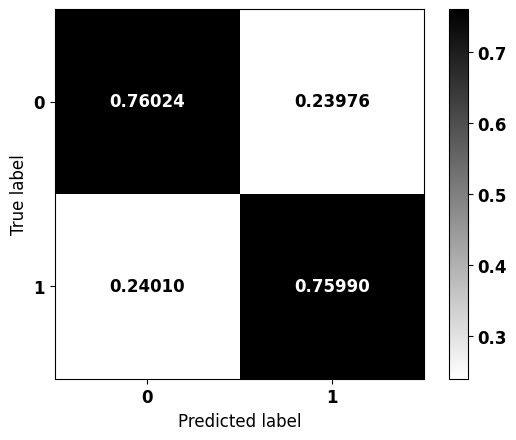


              precision    recall  f1-score   support

           0    0.71920   0.76024   0.73915      6273
           1    0.79667   0.75990   0.77785      7755

    accuracy                        0.76005     14028
   macro avg    0.75794   0.76007   0.75850     14028
weighted avg    0.76203   0.76005   0.76055     14028



In [ ]:
# Creating and training the XGBoost model
# Initialize an XGBoost classifier with specified parameters
xgb = XGBClassifier(max_depth=4,            # Set maximum tree depth to 4
                    scale_pos_weight=0.645, # Adjust class imbalance using scale_pos_weight
                    random_state=seed)      # Ensure reproducibility

# Train the model using the training dataset
xgb.fit(X_train, y_train)

# Confusion matrix
# Generate and display the confusion matrix for model evaluation
plot_confusion_matrix(xgb, X_test, y_test)

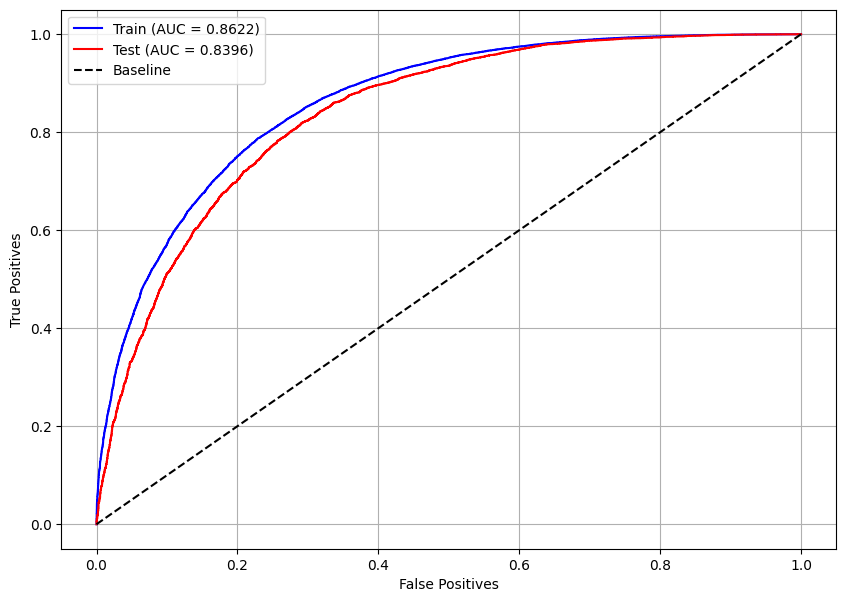

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb, X_train, X_test, y_train, y_test)

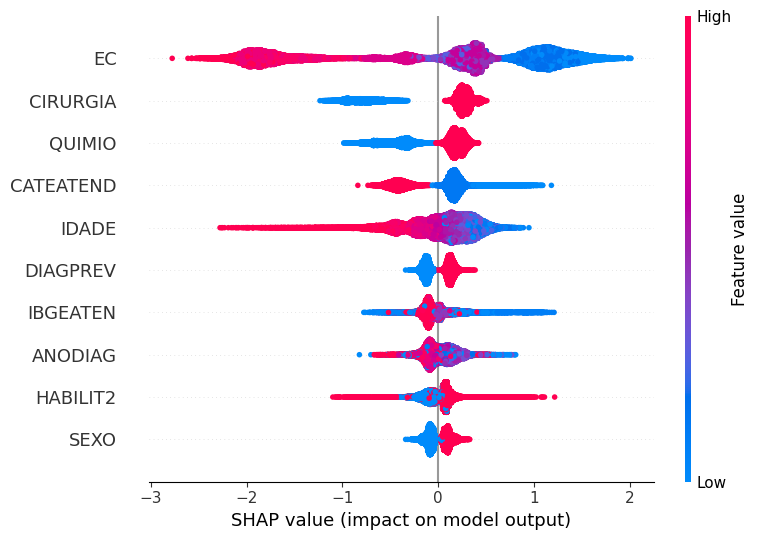

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(xgb, X_train, feat_cols)

#### **Optuna**

In [ ]:
# Creating stratified folds with the same class proportions
skf = StratifiedKFold(10, shuffle=True, random_state=seed)

# Function defining the model and its hyperparameters, which will be optimized
# to maximize the evaluation metric
def objective(trial):

    # Hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 50, 150)  # Number of trees
    max_depth = trial.suggest_int('max_depth', 3, 6)  # Maximum tree depth
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.2, step=0.05)  # Learning rate
    gamma = trial.suggest_float('gamma', 0.0, 0.3, step=0.1)  # Regularization term
    min_child_weight = trial.suggest_int('min_child_weight', 1, 7)  # Minimum sum of weights in a child node
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.3, 0.7, step=0.1)  # Fraction of features sampled per tree

    # XGBoost classifier with suggested hyperparameters
    cls = XGBClassifier(n_estimators=n_estimators,
                        max_depth=max_depth,
                        learning_rate=learning_rate,
                        gamma=gamma,
                        min_child_weight=min_child_weight,
                        colsample_bytree=colsample_bytree,
                        random_state=seed,
                        n_jobs=-1)

    # Performing cross-validation and returning the mean accuracy score
    return cross_val_score(cls, X_train, y_train,
                           cv=skf, scoring='accuracy').mean()

##### RandomSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=RandomSampler(seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 107,
 'max_depth': 6,
 'learning_rate': 0.1,
 'gamma': 0.3,
 'min_child_weight': 5,
 'colsample_bytree': 0.6000000000000001}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(0.63, 0.66, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

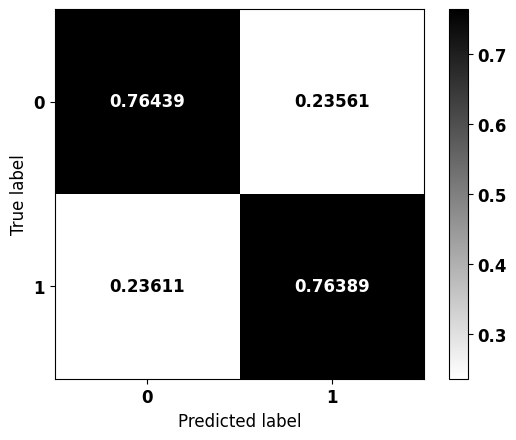


              precision    recall  f1-score   support

           0    0.72366   0.76439   0.74347      6273
           1    0.80032   0.76389   0.78169      7755

    accuracy                        0.76411     14028
   macro avg    0.76199   0.76414   0.76258     14028
weighted avg    0.76604   0.76411   0.76460     14028



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 0.6488  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_rand = XGBClassifier()
xgb_rand.set_params(**params)

# Training the optimized model on the training dataset
xgb_rand.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_rand, X_test, y_test)

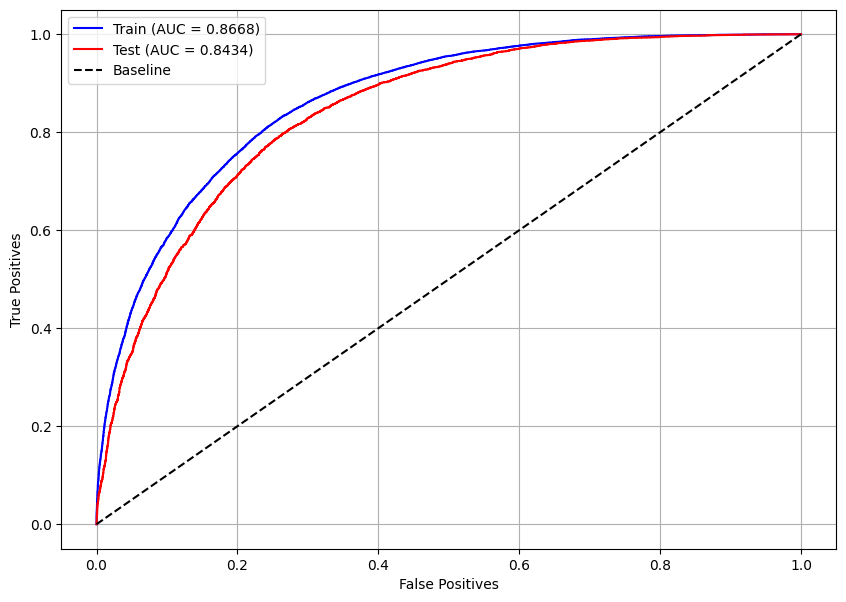

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_rand, X_train, X_test, y_train, y_test)

##### TPESampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=TPESampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 102,
 'max_depth': 6,
 'learning_rate': 0.15000000000000002,
 'gamma': 0.2,
 'min_child_weight': 6,
 'colsample_bytree': 0.6000000000000001}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(0.645, 0.67, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

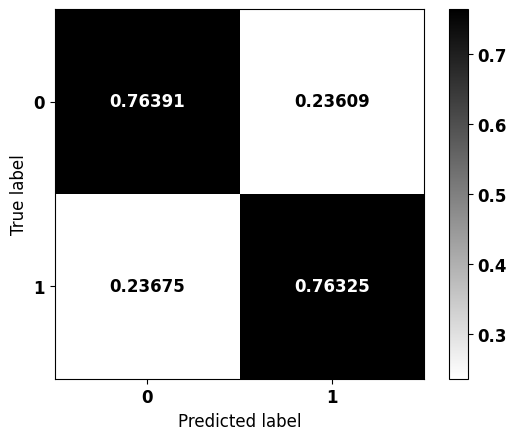


              precision    recall  f1-score   support

           0    0.72299   0.76391   0.74289      6273
           1    0.79986   0.76325   0.78113      7755

    accuracy                        0.76354     14028
   macro avg    0.76143   0.76358   0.76201     14028
weighted avg    0.76549   0.76354   0.76403     14028



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 0.6518  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_tpe = XGBClassifier()
xgb_tpe.set_params(**params)

# Training the optimized model on the training dataset
xgb_tpe.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_tpe, X_test, y_test)

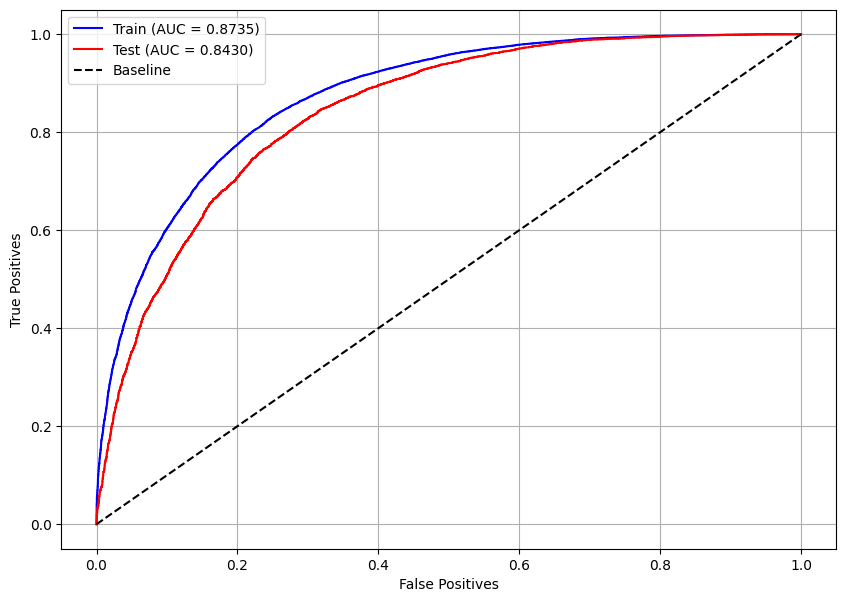

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_tpe, X_train, X_test, y_train, y_test)

##### CmaEsSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=CmaEsSampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 105,
 'max_depth': 6,
 'learning_rate': 0.15000000000000002,
 'gamma': 0.2,
 'min_child_weight': 6,
 'colsample_bytree': 0.6000000000000001}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(0.64, 0.66, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

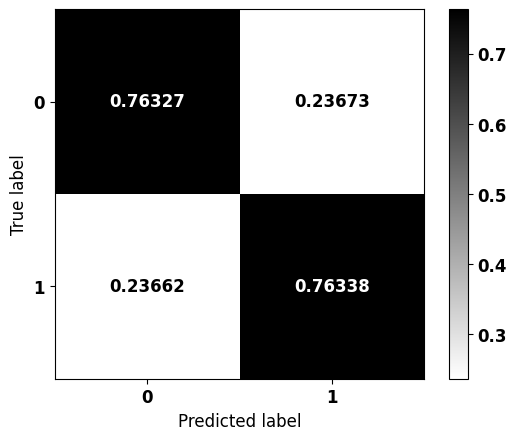


              precision    recall  f1-score   support

           0    0.72294   0.76327   0.74256      6273
           1    0.79946   0.76338   0.78100      7755

    accuracy                        0.76333     14028
   macro avg    0.76120   0.76332   0.76178     14028
weighted avg    0.76524   0.76333   0.76381     14028



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 0.6517  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_cma = XGBClassifier()
xgb_cma.set_params(**params)

# Training the optimized model on the training dataset
xgb_cma.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_cma, X_test, y_test)

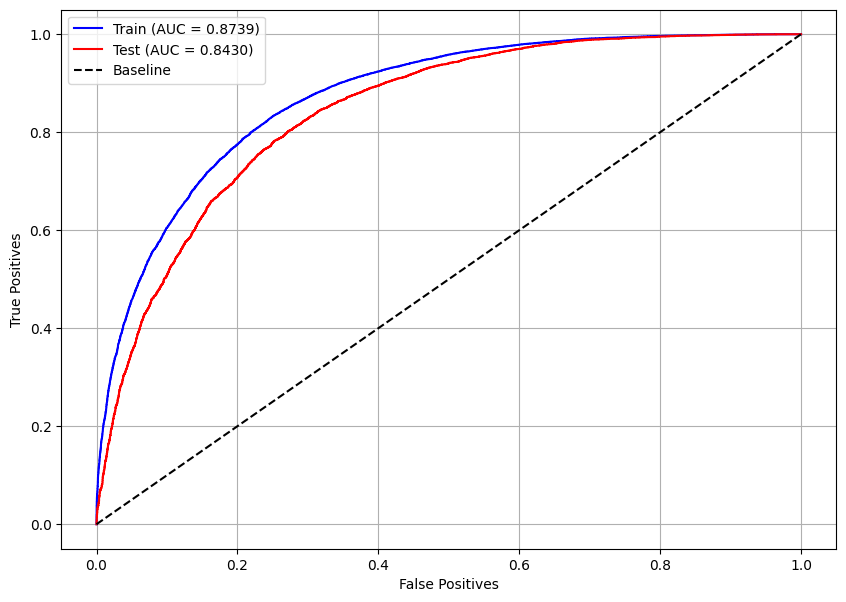

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_cma, X_train, X_test, y_train, y_test)

##### Optimized model

In [ ]:
# Selecting the best model based on performance
models = [xgb_rand, xgb_tpe, xgb_cma]  # List of trained models
best = models[0]  # Initialize the best model as the first in the list

# Iterate through the models to find the one with the highest accuracy score
for i, m in enumerate(models):
    if i == 0:
        continue  # Skip the first model since it's already assigned as 'best'

    best_score = best.score(X_test, y_test)  # Accuracy of the current best model
    score = m.score(X_test, y_test)  # Accuracy of the current model being evaluated

    if score > best_score:  # Update 'best' if the current model has a higher score
        best = m

# Print the best-performing model
print(best)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.6, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.3, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=5, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=107, n_jobs=None,
              num_parallel_tree=None, random_state=7, ...)


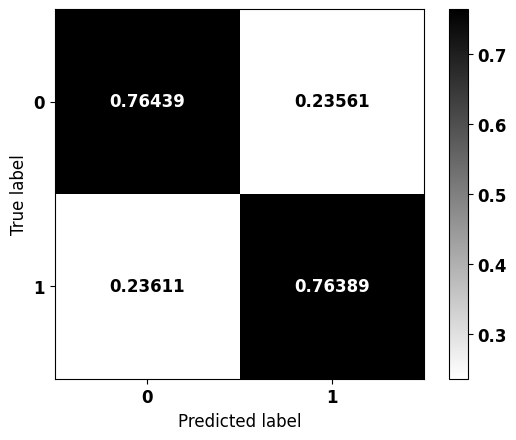


              precision    recall  f1-score   support

           0    0.72366   0.76439   0.74347      6273
           1    0.80032   0.76389   0.78169      7755

    accuracy                        0.76411     14028
   macro avg    0.76199   0.76414   0.76258     14028
weighted avg    0.76604   0.76411   0.76460     14028



In [ ]:
# Training the final XGBoost model using the best parameters
# Retrieve the best hyperparameters from the selected model
params = best.get_params()

# Initialize a new XGBoost classifier with the best parameters
xgb_optuna = XGBClassifier()
xgb_optuna.set_params(**params)

# Train the optimized model on the training data
xgb_optuna.fit(X_train, y_train)

# Plot the confusion matrix to evaluate the model's performance on the test set
plot_confusion_matrix(xgb_optuna, X_test, y_test)

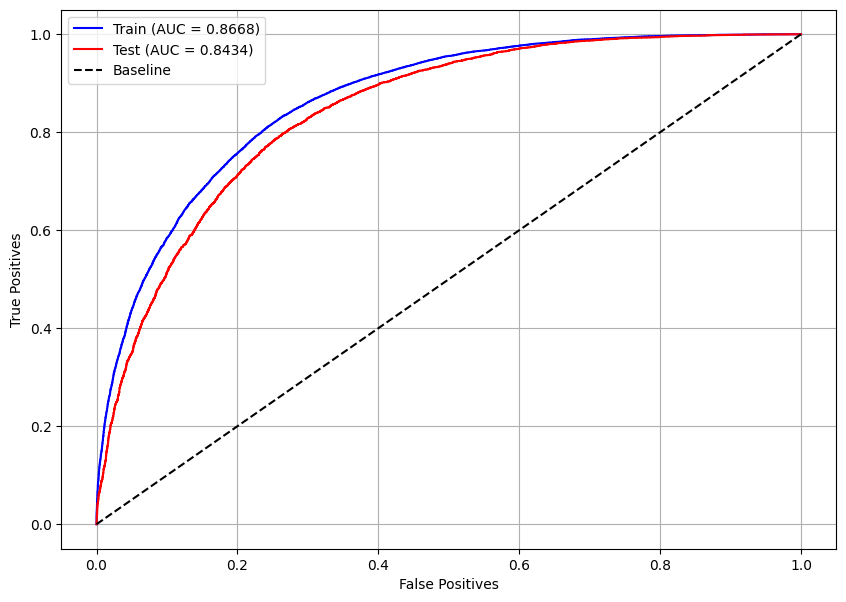

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_optuna, X_train, X_test, y_train, y_test)

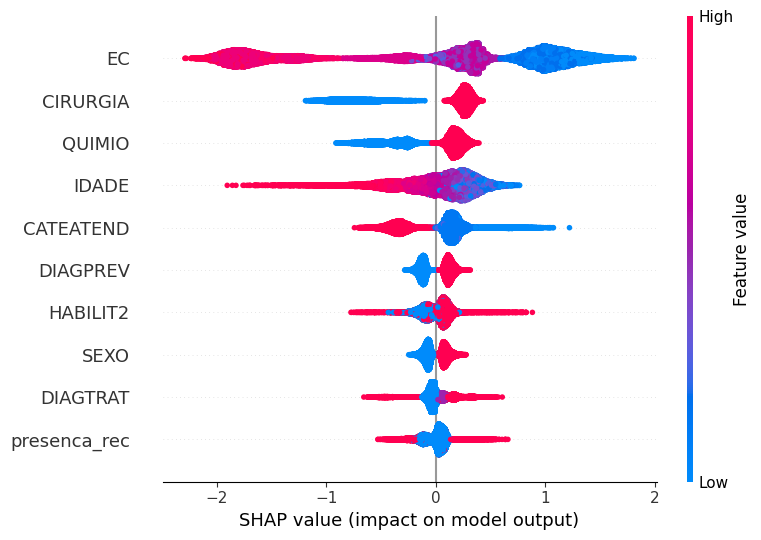

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(xgb_optuna, X_train, feat_cols)

### **LightGBM**


#### **Base model**

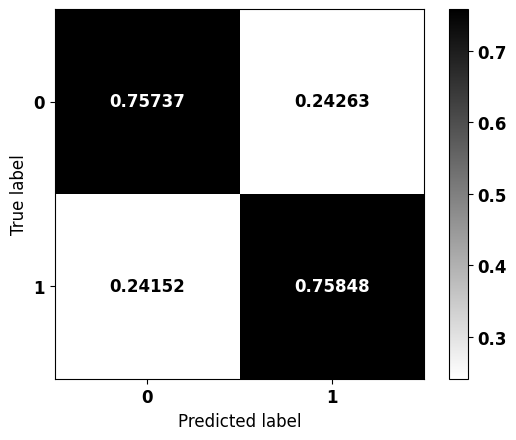


              precision    recall  f1-score   support

           0    0.71724   0.75737   0.73676      6273
           1    0.79444   0.75848   0.77604      7755

    accuracy                        0.75798     14028
   macro avg    0.75584   0.75793   0.75640     14028
weighted avg    0.75992   0.75798   0.75848     14028



In [ ]:
# Creating and training the LightGBM model
# Initialize an LightGBM classifier with specified parameters
lgbm = LGBMClassifier(max_depth=10,                     # Set maximum tree depth to 10
                      class_weight={0: 1.4662, 1: 1},   # Adjust class imbalance using class_weight
                      random_state=seed,                # Ensure reproducibility
                      verbose=-1)

# Train the model using the training dataset
lgbm.fit(X_train, y_train)

# Confusion matrix
# Generate and display the confusion matrix for model evaluation
plot_confusion_matrix(lgbm, X_test, y_test)

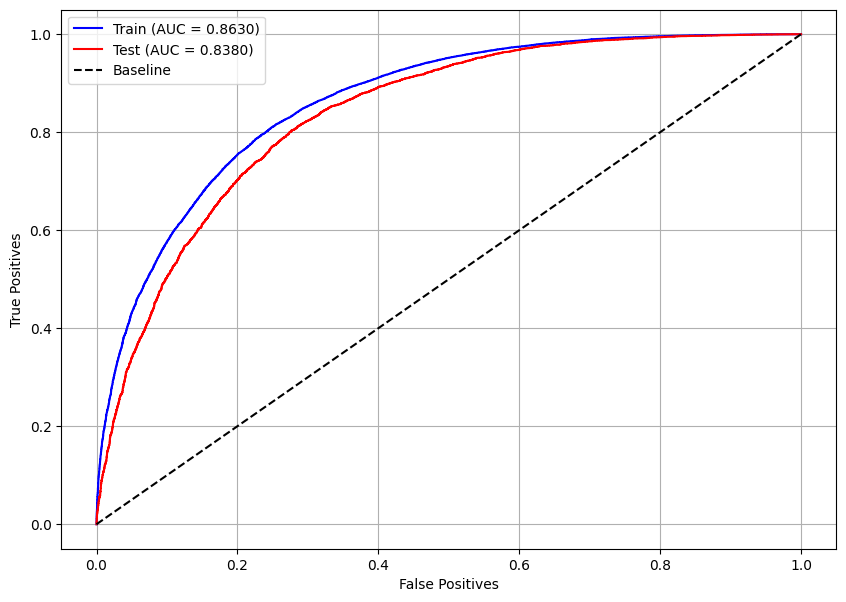

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm, X_train, X_test, y_train, y_test)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


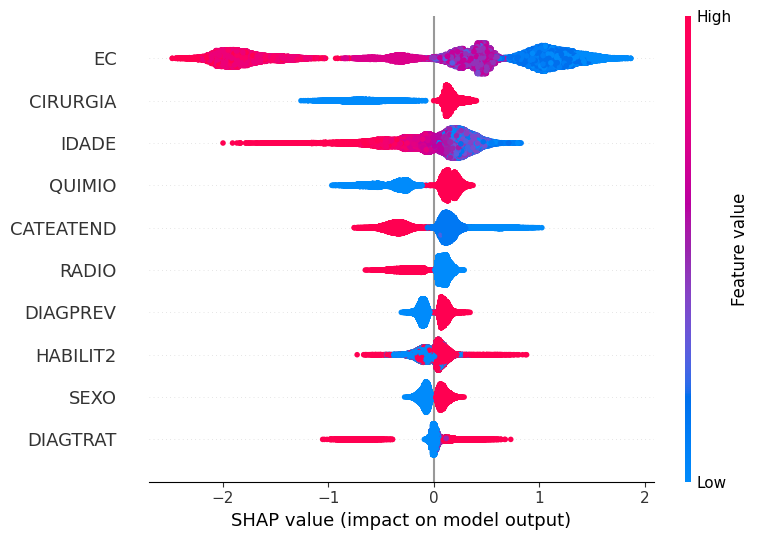

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(lgbm, X_train, feat_cols)

#### **Optuna**

In [ ]:
# Creating stratified folds with the same class proportions
skf = StratifiedKFold(10, shuffle=True, random_state=seed)

# Function defining the model and its hyperparameters, which will be optimized
# to maximize the evaluation metric
def objective(trial):

    # Hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 50, 150)  # Number of trees
    max_depth = trial.suggest_int('max_depth', 3, 10)  # Maximum tree depth
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.2, step=0.01)  # Learning rate
    min_child_weight = trial.suggest_int('min_child_weight', 1, 7)  # Minimum sum of weights in a child node
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.3, 0.7, step=0.1)  # Fraction of features sampled per tree

    # LightGBM classifier with suggested hyperparameters
    cls = LGBMClassifier(n_estimators=n_estimators,
                         max_depth=max_depth,
                         learning_rate=learning_rate,
                         min_child_weight=min_child_weight,
                         colsample_bytree=colsample_bytree,
                         random_state=seed,
                         verbose=-1,
                         n_jobs=-1)

    # Performing cross-validation and returning the mean accuracy score
    return cross_val_score(cls, X_train, y_train,
                           cv=skf, scoring='accuracy').mean()

##### RandomSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=RandomSampler(seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 88,
 'max_depth': 6,
 'learning_rate': 0.16,
 'min_child_weight': 2,
 'colsample_bytree': 0.6000000000000001}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(1.42, 1.44, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:i, 1:1}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

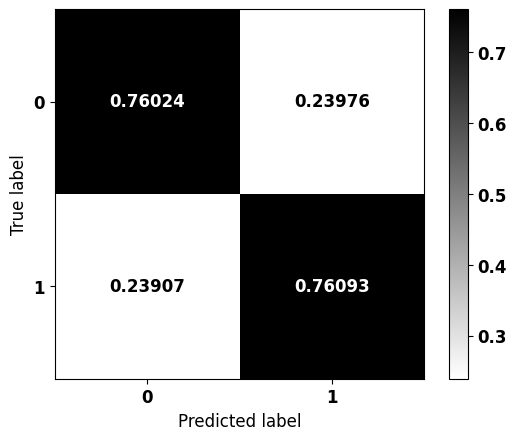


              precision    recall  f1-score   support

           0    0.72007   0.76024   0.73961      6273
           1    0.79689   0.76093   0.77850      7755

    accuracy                        0.76062     14028
   macro avg    0.75848   0.76059   0.75905     14028
weighted avg    0.76254   0.76062   0.76111     14028



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1.4211, 1:1}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_rand = LGBMClassifier(verbose=-1)
lgbm_rand.set_params(**params)

# Training the optimized model on the training dataset
lgbm_rand.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_rand, X_test, y_test)

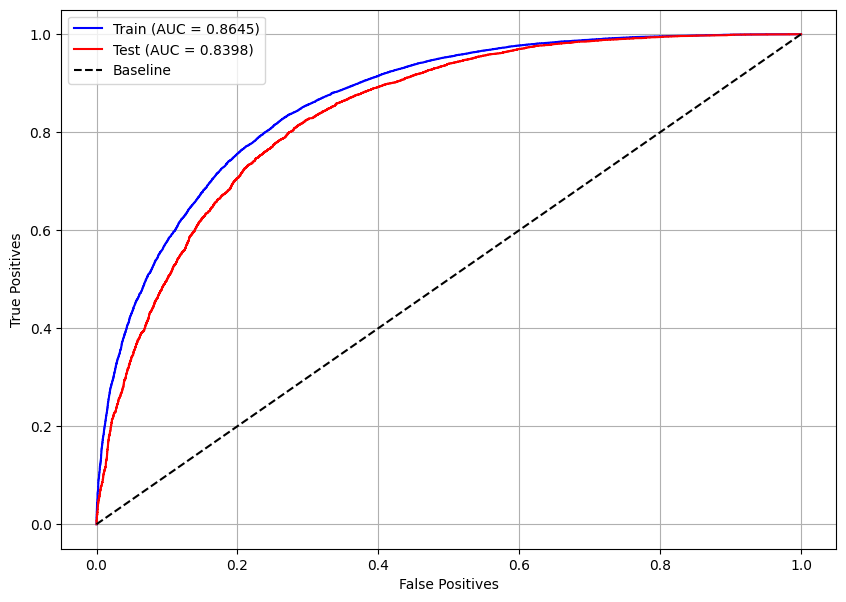

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_rand, X_train, X_test, y_train, y_test)

##### TPESampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=TPESampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 143,
 'max_depth': 10,
 'learning_rate': 0.12000000000000001,
 'min_child_weight': 1,
 'colsample_bytree': 0.5}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(1.425, 1.46, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:i, 1:1}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

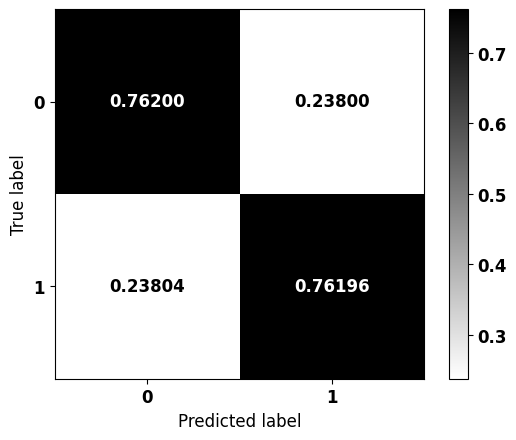


              precision    recall  f1-score   support

           0    0.72140   0.76200   0.74114      6273
           1    0.79830   0.76196   0.77971      7755

    accuracy                        0.76198     14028
   macro avg    0.75985   0.76198   0.76042     14028
weighted avg    0.76391   0.76198   0.76246     14028



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1.4445, 1:1}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_tpe = LGBMClassifier(verbose=-1)
lgbm_tpe.set_params(**params)

# Training the optimized model on the training dataset
lgbm_tpe.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_tpe, X_test, y_test)

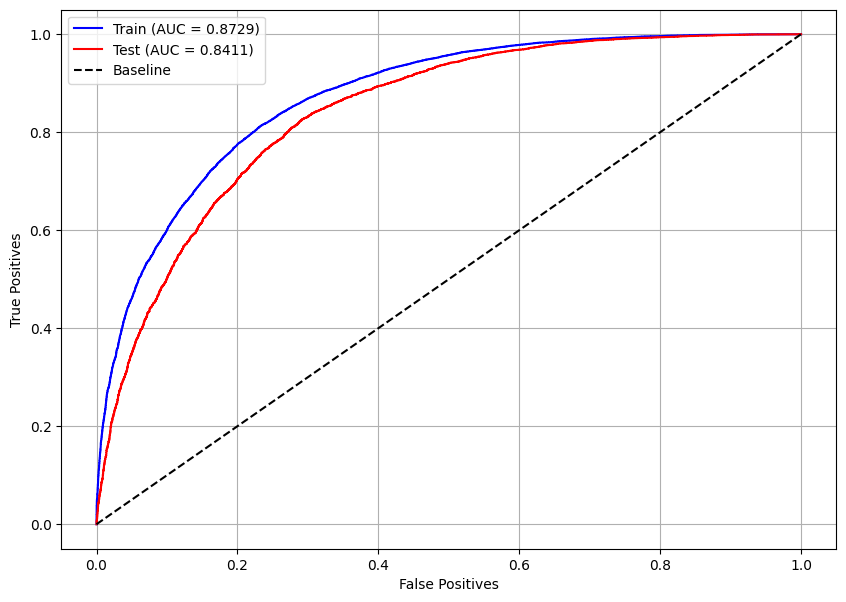

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_tpe, X_train, X_test, y_train, y_test)

##### CmaEsSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=CmaEsSampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 103,
 'max_depth': 7,
 'learning_rate': 0.11,
 'min_child_weight': 7,
 'colsample_bytree': 0.5}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(1.43, 1.45, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:i, 1:1}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

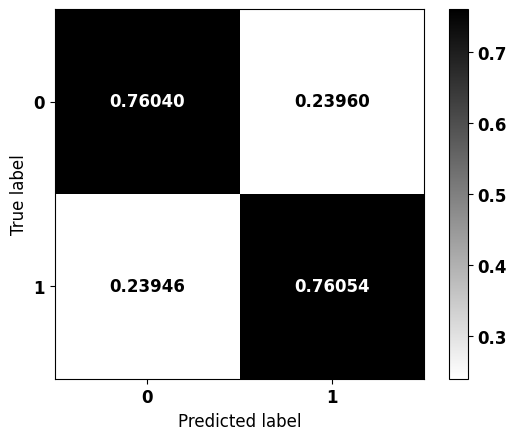


              precision    recall  f1-score   support

           0    0.71978   0.76040   0.73953      6273
           1    0.79692   0.76054   0.77831      7755

    accuracy                        0.76048     14028
   macro avg    0.75835   0.76047   0.75892     14028
weighted avg    0.76243   0.76048   0.76097     14028



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1.4357, 1:1}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_cma = LGBMClassifier(verbose=-1)
lgbm_cma.set_params(**params)

# Training the optimized model on the training dataset
lgbm_cma.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_cma, X_test, y_test)

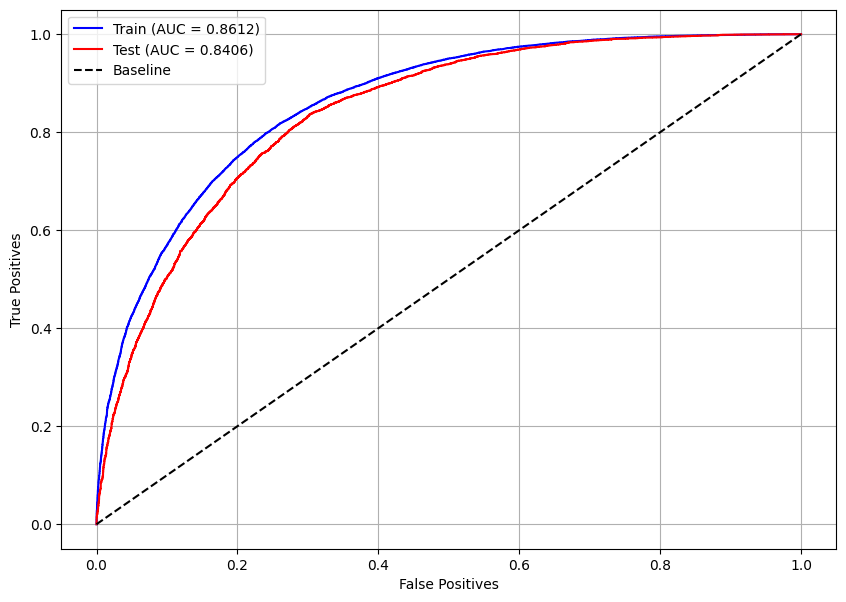

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_cma, X_train, X_test, y_train, y_test)

##### Optimized model

In [ ]:
# Selecting the best model based on performance
models = [lgbm_rand, lgbm_tpe, lgbm_cma]  # List of trained models
best = models[0]  # Initialize the best model as the first in the list

# Iterate through the models to find the one with the highest accuracy score
for i, m in enumerate(models):
    if i == 0:
        continue  # Skip the first model since it's already assigned as 'best'

    best_score = best.score(X_test, y_test)  # Accuracy of the current best model
    score = m.score(X_test, y_test)  # Accuracy of the current model being evaluated

    if score > best_score:  # Update 'best' if the current model has a higher score
        best = m

# Print the best-performing model
print(best)

LGBMClassifier(class_weight={0: 1.4445, 1: 1}, colsample_bytree=0.5,
               learning_rate=0.12, max_depth=10, min_child_weight=1,
               n_estimators=143, random_state=7, verbose=-1)


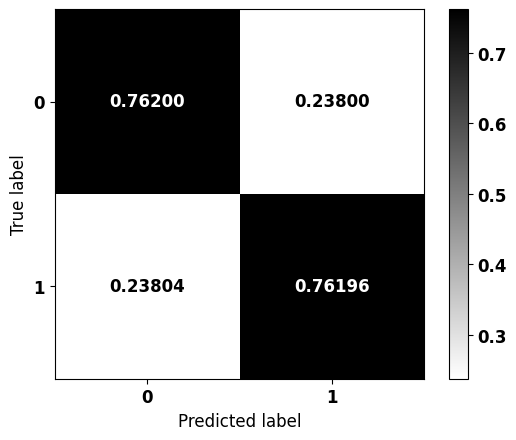


              precision    recall  f1-score   support

           0    0.72140   0.76200   0.74114      6273
           1    0.79830   0.76196   0.77971      7755

    accuracy                        0.76198     14028
   macro avg    0.75985   0.76198   0.76042     14028
weighted avg    0.76391   0.76198   0.76246     14028



In [ ]:
# Training the final XGBoost model using the best parameters
# Retrieve the best hyperparameters from the selected model
params = best.get_params()

# Initialize a new XGBoost classifier with the best parameters
lgbm_optuna = LGBMClassifier(verbose=-1)
lgbm_optuna.set_params(**params)

# Train the optimized model on the training data
lgbm_optuna.fit(X_train, y_train)

# Plot the confusion matrix to evaluate the model's performance on the test set
plot_confusion_matrix(lgbm_optuna, X_test, y_test)

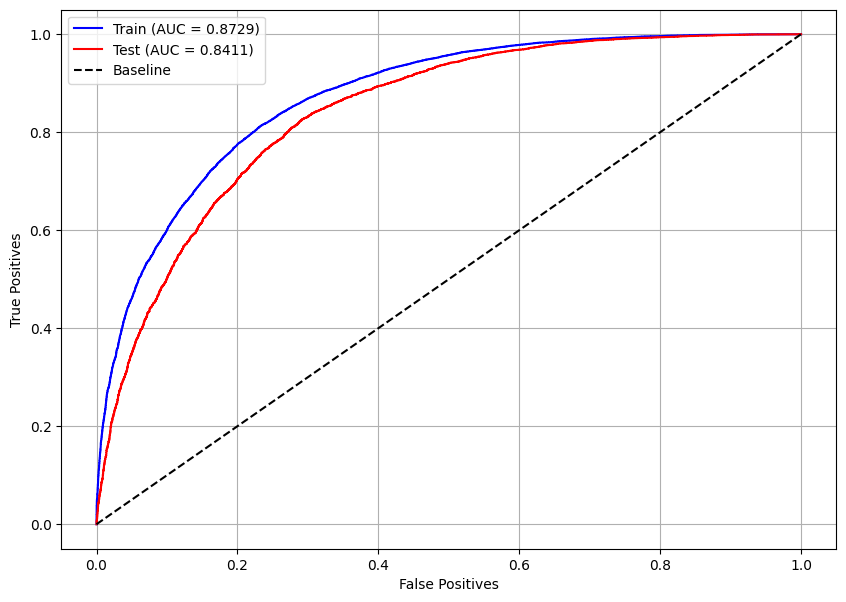

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_optuna, X_train, X_test, y_train, y_test)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


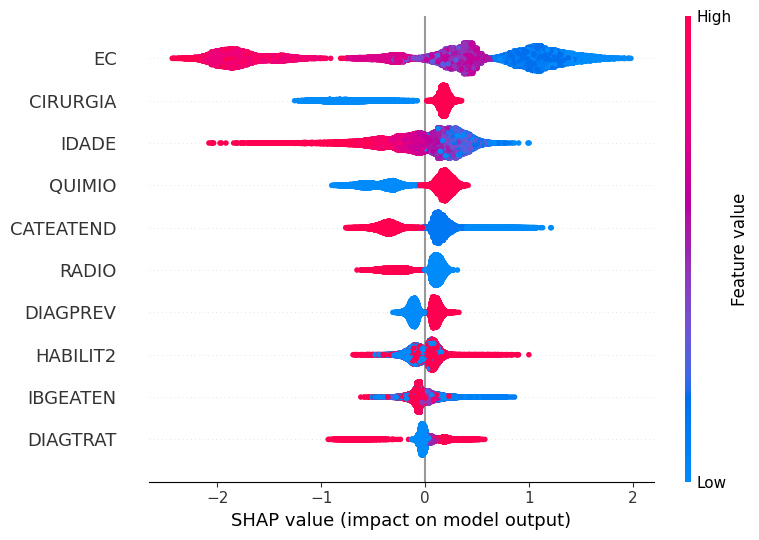

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(lgbm_optuna, X_train, feat_cols)

## **Voting Classifier**


In [ ]:
# Comparing the accuracy scores of the initial XGBoost model and the optimized Optuna model
xgb_score = xgb.score(X_test, y_test)
optuna_score = xgb_optuna.score(X_test, y_test)
print(f'Accuracy: XGB = {xgb_score:.4f}, Optuna = {optuna_score:.4f}\n')

# Determine which model performed better
if optuna_score >= xgb_score:
    params_xgb = xgb_optuna.get_params()  # Get the parameters of the optimized model
    print('Optimized model won')
else:
    params_xgb = xgb.get_params()  # Get the parameters of the initial model
    print('Initial model won')

Accuracy: XGB = 0.7601, Optuna = 0.7641

Otimizado venceu


In [ ]:
# Comparing the accuracy scores of the initial LightGBM model and the optimized Optuna model
lgbm_score = lgbm.score(X_test, y_test)
optuna_score = lgbm_optuna.score(X_test, y_test)
print(f'Accuracy: LGBM = {lgbm_score:.4f}, Optuna = {optuna_score:.4f}\n')

# Determine which model performed better
if optuna_score >= lgbm_score:
    params_lgbm = lgbm_optuna.get_params()  # Get the parameters of the optimized model
    print('Optimized model won')
else:
    params_lgbm = lgbm.get_params()  # Get the parameters of the initial model
    print('Initial model won')

Accuracy: LGBM = 0.7580, Optuna = 0.7620

Otimizado venceu


In [ ]:
# Creating the models with the best-performing hyperparameters
# XGBoost Model
best_xgb = XGBClassifier()  # Instantiate the XGBoost classifier
best_xgb.set_params(**params_xgb)  # Set the best hyperparameters for XGBoost

# LightGBM Model
best_lgbm = LGBMClassifier()  # Instantiate the LightGBM classifier
best_lgbm.set_params(**params_lgbm)  # Set the best hyperparameters for LightGBM

LGBMClassifier(class_weight={0: 1.4445, 1: 1}, colsample_bytree=0.5,
               learning_rate=0.12, max_depth=10, min_child_weight=1,
               n_estimators=143, random_state=7, verbose=-1)

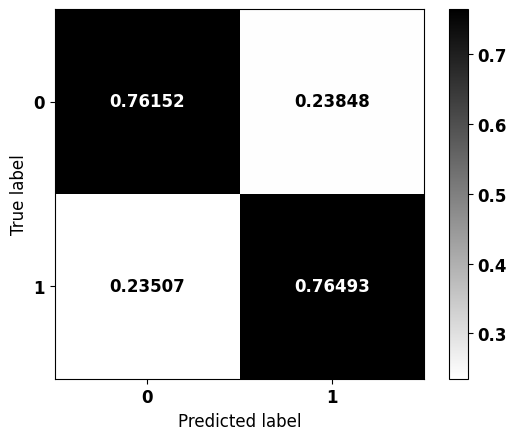


              precision    recall  f1-score   support

           0    0.72379   0.76152   0.74217      6273
           1    0.79860   0.76493   0.78140      7755

    accuracy                        0.76340     14028
   macro avg    0.76119   0.76322   0.76179     14028
weighted avg    0.76515   0.76340   0.76386     14028



In [ ]:
from sklearn.ensemble import VotingClassifier

# Creating and training the voting classifier model
clf = VotingClassifier(
    estimators=[('XGBoost', best_xgb),  # Adding the best XGBoost model
               ('LightGBM', best_lgbm)],  # Adding the best LightGBM model
    voting='soft'  # Using 'soft' voting, which predicts the class label based on predicted probabilities
)

clf.fit(X_train, y_train)  # Train the voting classifier on the training data

# Confusion Matrix
plot_confusion_matrix(clf, X_test, y_test)  # Plot the confusion matrix for the voting classifier on the test data

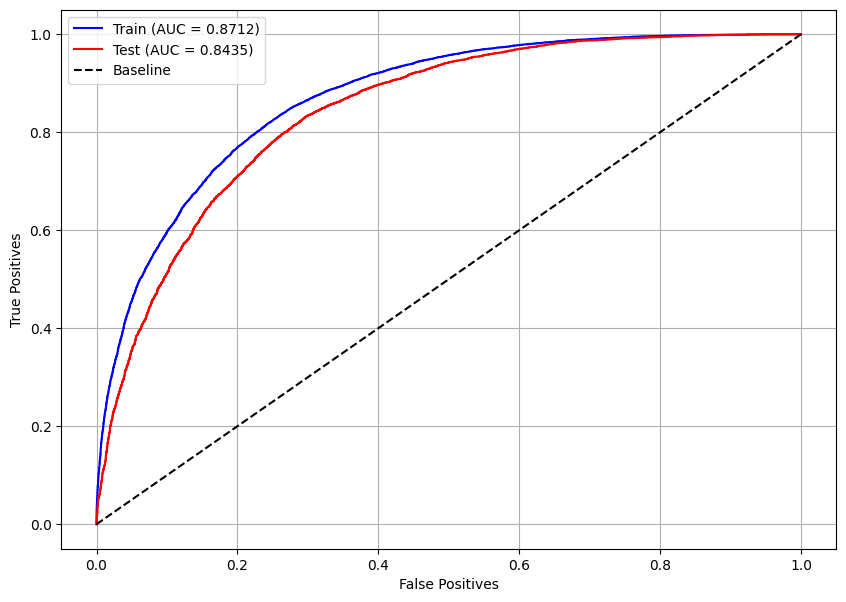

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(clf, X_train, X_test, y_train, y_test)

## **Tests with other cancer types**

In [ ]:
# Best Model Selection
models = [xgb, xgb_optuna, lgbm, lgbm_optuna]  # List of models to compare (XGBoost, optimized XGBoost, LightGBM, optimized LightGBM)

# Iterating through each model to find the best performing one
for i, m in enumerate(models):
    if i == 0:  # Initialize the best model as the first one
        best = m
    else:
        # Compare the performance of the current best model and the current model
        best_score = best.score(X_test, y_test)  # Get the accuracy of the current best model on the test set
        score = m.score(X_test, y_test)  # Get the accuracy of the current model on the test set
        if score > best_score:  # If the current model performs better, update the best model
            best = m

# Print the best performing model
print(best)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.6, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.3, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=5, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=107, n_jobs=None,
              num_parallel_tree=None, random_state=7, ...)


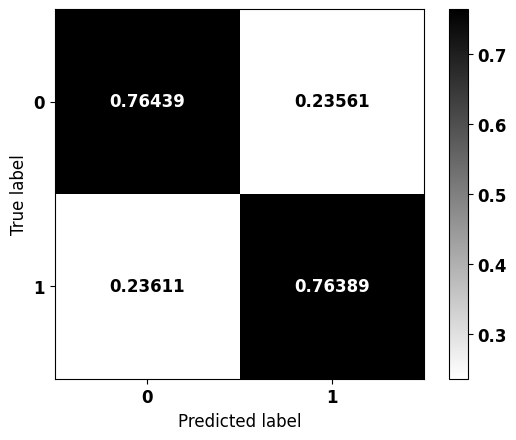


              precision    recall  f1-score   support

           0    0.72366   0.76439   0.74347      6273
           1    0.80032   0.76389   0.78169      7755

    accuracy                        0.76411     14028
   macro avg    0.76199   0.76414   0.76258     14028
weighted avg    0.76604   0.76411   0.76460     14028



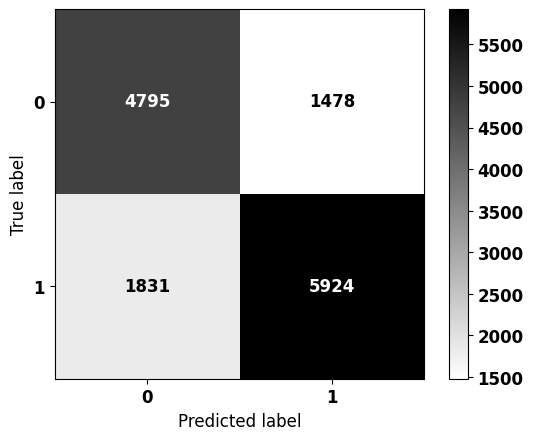


              precision    recall  f1-score   support

           0    0.72366   0.76439   0.74347      6273
           1    0.80032   0.76389   0.78169      7755

    accuracy                        0.76411     14028
   macro avg    0.76199   0.76414   0.76258     14028
weighted avg    0.76604   0.76411   0.76460     14028



In [ ]:
# Confusion Matrix for the Best Model
plot_confusion_matrix(best, X_test, y_test)  # Plot the normalized confusion matrix for the best model
plot_confusion_matrix(best, X_test, y_test, norm=False)  # Plot the unnormalized confusion matrix for the best model

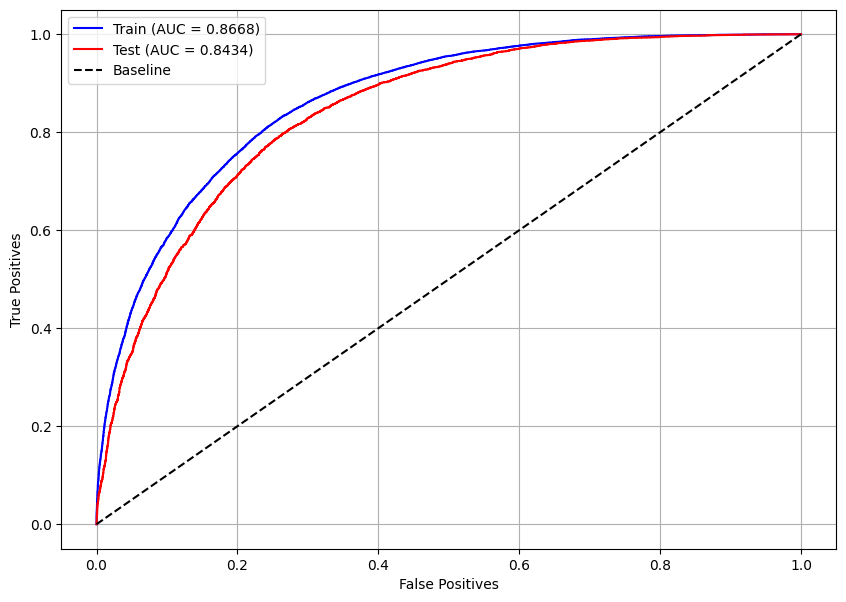

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(best, X_train, X_test, y_train, y_test)

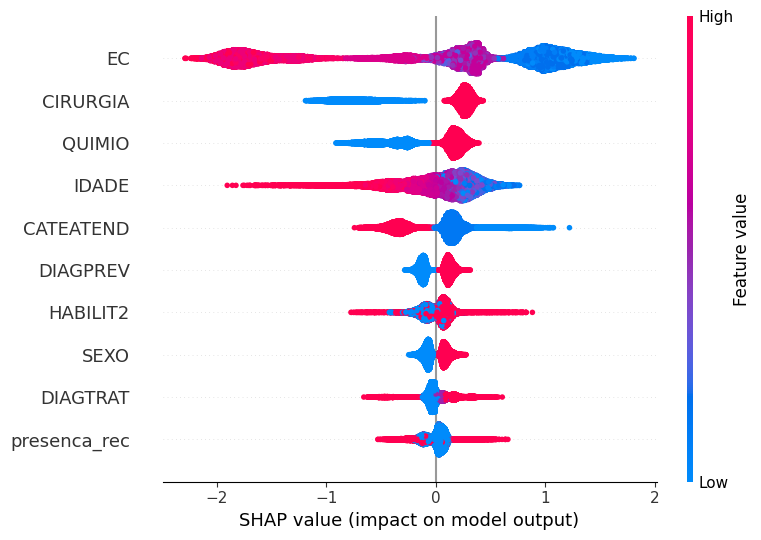

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(best, X_train, feat_cols)

In [ ]:
# Download test data
!gdown 194o9VVsCwcnt3Cp1oBbJdd0Sb_N2LOIF  # Download the test dataset - More Frequent

# Load the dataset
df_teste = pd.read_csv('incid_teste.csv')

# Split the test data based on cancer types
mama_teste = df_teste[df_teste.TOPOGRUP.isin(['Mama'])]
pele_teste = df_teste[df_teste.TOPOGRUP.isin(['Pele'])]
prost_teste = df_teste[df_teste.TOPOGRUP.isin(['Próstata'])]
colo_teste = df_teste[df_teste.TOPOGRUP.isin(['Colorretal'])]
pulm_teste = df_teste[df_teste.TOPOGRUP.isin(['Pulmão'])]
colo_utero_teste = df_teste[df_teste.TOPOGRUP.isin(['Colo de Útero'])]

# Check the shapes of the resulting subsets
mama_teste.shape, pele_teste.shape, prost_teste.shape, colo_teste.shape, pulm_teste.shape, colo_utero_teste.shape

### **Breast**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'mama_teste' DataFrame
saida_mama = mama_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
mama_teste = mama_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'mama_teste' DataFrame
print(mama_teste.shape)
mama_teste.head(3)

(26133, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
2,-0.623264,0.078323,-0.758504,1.270371,-0.915765,-1.584428,0.5453,1.015205,-1.536653,0.848079,...,2.956862,-0.190274,-0.446767,-0.851058,-0.888302,0.743452,-0.803767,0.967430,-1.048322,-0.51497
10,-0.549923,0.078323,1.068808,-0.747659,-0.915765,-0.339226,0.5453,1.015205,0.650765,0.848079,...,2.956862,-0.190274,-1.367290,1.932872,-0.205138,-1.642306,-0.803767,-0.940442,-1.048322,-0.51497
11,0.110146,0.078323,0.854448,1.270371,-0.915765,-1.584428,0.5453,1.015205,0.650765,0.848079,...,1.273530,-0.190274,-1.735499,-0.851058,-0.660580,0.743452,0.599581,1.921366,0.953905,-0.51497


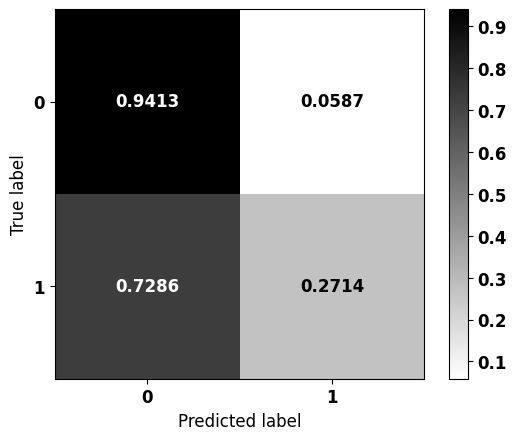


              precision    recall  f1-score   support

           0     0.2421    0.9413    0.3851      5180
           1     0.9492    0.2714    0.4221     20953

    accuracy                         0.4042     26133
   macro avg     0.5957    0.6063    0.4036     26133
weighted avg     0.8091    0.4042    0.4147     26133



In [ ]:
# Plot the confusion matrix for the best model on the 'mama_teste' dataset
plot_confusion_matrix(best, mama_teste, saida_mama)

### **Skin**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'pele_teste' DataFrame
saida_pele = pele_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
pele_teste = pele_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'pele_teste' DataFrame
print(pele_teste.shape)
pele_teste.head(3)

(25221, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
4,0.324125,-0.916019,-0.841077,1.167751,-0.344597,-0.429061,0.315561,-0.242155,-0.156064,-0.03833,...,0.591376,-0.20941,-0.716428,1.436258,0.636483,-1.212419,0.393904,-1.404163,-0.776427,-0.218179
5,0.701083,-0.916019,0.447649,1.167751,-0.344597,-0.429061,0.315561,-0.242155,-0.156064,-0.03833,...,-0.689569,-0.20941,0.240058,-0.214815,-0.234417,-1.110069,-1.165675,1.588451,-0.776427,-0.218179
7,-0.052834,-0.916019,0.069663,-0.808623,-0.344597,-0.429061,0.315561,-0.242155,-0.156064,-0.03833,...,1.872320,-0.20941,0.813950,-0.398268,0.926783,-1.212419,0.393904,-0.406625,-0.776427,-0.218179


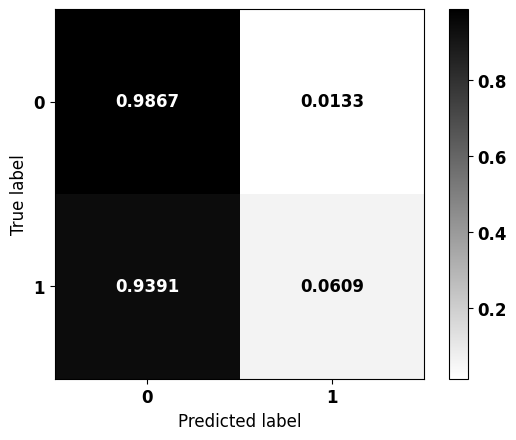


              precision    recall  f1-score   support

           0     0.2388    0.9867    0.3845      5799
           1     0.9388    0.0609    0.1143     19422

    accuracy                         0.2737     25221
   macro avg     0.5888    0.5238    0.2494     25221
weighted avg     0.7779    0.2737    0.1764     25221



In [ ]:
# Plot the confusion matrix for the best model on the 'pele_teste' dataset
plot_confusion_matrix(best, pele_teste, saida_pele)

### **Prostate**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'prost_teste' DataFrame
saida_prost = prost_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
prost_teste = prost_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'prost_teste' DataFrame
print(prost_teste.shape)
prost_teste.head(3)

(20862, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
3,0.149237,0.0,1.316000,-0.695899,0.723032,-0.63168,-0.879627,1.381841,-0.308078,1.085991,...,-0.418644,-0.208982,0.051988,0.032404,1.523967,-0.540997,-0.971798,-0.714113,-0.906043,-0.414926
12,-1.225865,0.0,0.958232,-0.695899,0.723032,0.27992,1.136845,-0.723672,-0.308078,-0.920818,...,-0.418644,-0.208982,0.841591,-1.029723,-0.860966,0.842650,0.451912,0.355595,1.103700,-0.414926
18,-0.423722,0.0,-0.370160,-0.695899,0.723032,-1.99908,-0.879627,1.381841,-0.308078,-0.920818,...,-0.418644,-0.208982,1.236393,0.032404,1.523967,-0.540997,-0.971798,1.425303,-0.906043,-0.414926


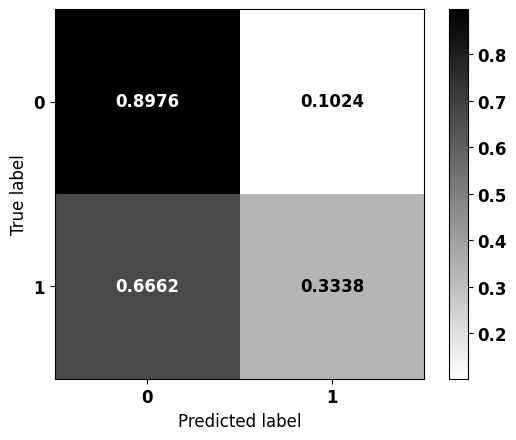


              precision    recall  f1-score   support

           0     0.2060    0.8976    0.3351      3369
           1     0.9442    0.3338    0.4933     17493

    accuracy                         0.4249     20862
   macro avg     0.5751    0.6157    0.4142     20862
weighted avg     0.8250    0.4249    0.4677     20862



In [ ]:
# Plot the confusion matrix for the best model on the 'prost_teste' dataset
plot_confusion_matrix(best, prost_teste, saida_prost)

### **Lung**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'pulm_teste' DataFrame
saida_pulm = pulm_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
pulm_teste = pulm_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'pulm_teste' DataFrame
print(pulm_teste.shape)
pulm_teste.head(3)

(9252, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
8,-0.805560,-0.778211,0.751797,-0.853227,1.364883,-0.536078,-0.468319,-0.748999,-1.335116,-0.070691,...,-0.403143,-0.432328,0.663596,-0.846783,-1.881064,0.667417,-1.225737,0.274789,0.973507,-0.407845
27,0.123762,1.284999,0.990635,-0.853227,1.364883,0.640728,-0.468319,-0.748999,0.748999,-0.070691,...,-0.403143,-0.459489,1.022562,-0.846783,-1.171009,0.755208,0.238090,0.274789,-1.027214,2.451912
33,0.960153,-0.778211,0.844979,1.133388,-0.732664,-2.889689,2.135297,-0.748999,-1.335116,-0.070691,...,1.394771,-0.459489,0.304629,-0.846783,-0.697638,0.755208,0.238090,-0.775222,0.973507,2.451912


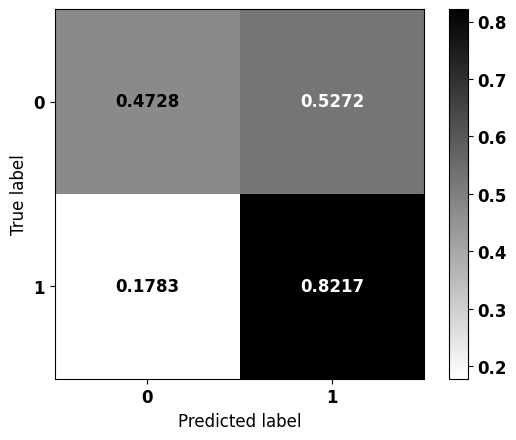


              precision    recall  f1-score   support

           0     0.9446    0.4728    0.6302      8007
           1     0.1951    0.8217    0.3153      1245

    accuracy                         0.5198      9252
   macro avg     0.5698    0.6473    0.4728      9252
weighted avg     0.8437    0.5198    0.5878      9252



In [ ]:
# Plot the confusion matrix for the best model on the 'pulm_teste' dataset
plot_confusion_matrix(best, pulm_teste, saida_pulm)

### **Cervical**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'colo_utero_teste' DataFrame
saida_colo_utero = colo_utero_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
colo_utero_teste = colo_utero_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'colo_utero_teste' DataFrame
print(colo_utero_teste.shape)
colo_utero_teste.head(3)

(5368, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
40,0.519132,0.0,0.929895,-0.892955,-1.099583,-2.175331,1.259960,-1.349244,-0.933285,-0.087376,...,4.004901,-0.269490,0.413337,-0.892417,-0.710476,0.814678,0.639879,-1.668349,1.088759,-0.459887
63,0.722950,0.0,0.009041,-0.892955,0.909436,0.794350,-0.793676,-1.349244,-0.933285,-0.087376,...,-0.292508,4.381396,0.936614,-0.892417,-0.936297,0.814678,0.639879,-0.614620,-0.918477,-0.459887
76,-0.092323,0.0,1.103217,-0.892955,0.909436,0.794350,1.259960,-1.349244,1.071484,-0.087376,...,-0.292508,-0.175532,0.936614,1.467974,1.321912,-1.416945,0.639879,-0.614620,-0.918477,2.174445


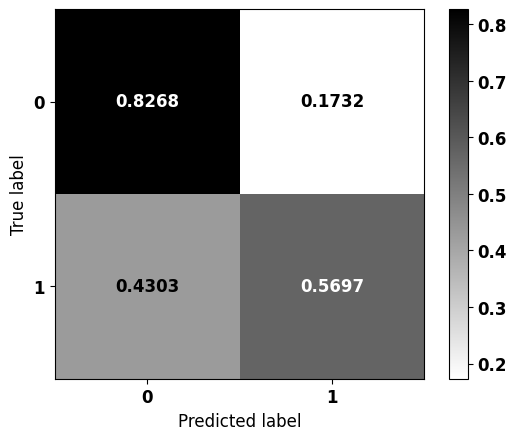


              precision    recall  f1-score   support

           0     0.5921    0.8268    0.6900      2310
           1     0.8133    0.5697    0.6700      3058

    accuracy                         0.6803      5368
   macro avg     0.7027    0.6982    0.6800      5368
weighted avg     0.7181    0.6803    0.6786      5368



In [ ]:
# Plot the confusion matrix for the best model on the 'colo_utero_teste' dataset
plot_confusion_matrix(best, colo_utero_teste, saida_colo_utero)

# **Lung**

In [ ]:
# Display the shape (number of rows and columns) of the lung cancer dataset
print(df_pulm.shape)

# Show the first three rows of the dataset to inspect its structure and values
df_pulm.head(3)

(37005, 32)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,TOPO,TOPOGRUP,EC,TRATHOSP,NENHUM,...,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec,obito_geral,sobrevida_ano1,sobrevida_ano3,sobrevida_ano5
0,57,1,3518701,9,2,C349,C34,IV,C,0,...,7,3518701,1,3.0,1,0,1,0,0,0
1,52,2,3513504,9,1,C341,C34,IV,E,0,...,7,3518701,1,3.0,0,0,1,1,0,0
2,65,1,3518701,9,1,C349,C34,IV,E,0,...,7,3518701,1,2.0,1,0,1,0,0,0


In [ ]:
# Missing values
df_pulm.isna().sum().sort_values(ascending=False).head(6)

IDADE             0
SEXO              0
sobrevida_ano3    0
sobrevida_ano1    0
obito_geral       0
presenca_rec      0
dtype: int64

In [ ]:
# Compute the correlation matrix for numerical features in the oral cavity cancer dataset
corr_matrix = df_pulm.corr(numeric_only=True)

# Get the absolute correlation values with the target variable 'sobrevida_ano3',
# sort them in descending order, and display the top 20 most correlated features
abs(corr_matrix['sobrevida_ano3']).sort_values(ascending = False).head(20)

sobrevida_ano3      1.000000
sobrevida_ano5      0.685950
obito_geral         0.630753
sobrevida_ano1      0.500594
CIRURGIA            0.344221
DIAGTRAT            0.149297
TRATCONS            0.148932
NENHUM              0.146357
presenca_rec        0.140548
CONSDIAG            0.099161
CATEATEND           0.084835
SEXO                0.081044
ESCOLARI_preench    0.079855
IDADE               0.045592
IMUNO               0.044318
OUTROS              0.041023
ANODIAG             0.038819
IBGEATEN            0.030325
DIAGPREV            0.025450
HORMONIO            0.021158
Name: sobrevida_ano3, dtype: float64

In [ ]:
# Count the number of patients in each class of the target variable 'sobrevida_ano3'
df_pulm.sobrevida_ano3.value_counts()

sobrevida_ano3
0    32025
1     4980
Name: count, dtype: int64

## **Preprocessing**

In [ ]:
# Preprocessed data setup

# List of columns to drop from the dataset, including treatment-related, tumor location, and other survival indicators
list_drop = ['TRATHOSP', 'TOPO', 'TOPOGRUP', 'NENHUM', 'TRATCONS', 'obito_geral',
             'sobrevida_ano1', 'sobrevida_ano5']

# Target variable for classification
lb = 'sobrevida_ano3'

# Perform preprocessing, including feature selection, encoding, and normalization
# Returns training and test sets (features and labels), feature column names, encoder, and normalization method
X_train, X_test, y_train, y_test, feat_cols, enc, norm = preprocessing(df_pulm,
                                                                       list_drop, lb,
                                                                       norm_name='StandardScaler',
                                                                       return_enc_norm=True,
                                                                       random_state=seed)

X_train = (27753, 23), X_test = (9252, 23)
y_train = (27753,), y_test = (9252,)


In [ ]:
# Training dataset for Lung Cancer

# Create a DataFrame for training data with selected features
pulm_treino = pd.DataFrame(X_train, columns=feat_cols)

# Add the 'TOPOGRUP' column to indicate the cancer type (here, 'Pulmão' for Lung Cancer)
pulm_treino['TOPOGRUP'] = 'Pulmão'

# Add the target variable (survival after 3 years) to the training dataset
pulm_treino['sobrevida_3anos'] = y_train.values

# Testing dataset for Lung Cancer

# Create a DataFrame for testing data with selected features
pulm_teste = pd.DataFrame(X_test, columns=feat_cols)

# Add the 'TOPOGRUP' column to indicate the cancer type (here, 'Pulmão' for Lung Cancer)
pulm_teste['TOPOGRUP'] = 'Pulmão'

# Add the target variable (survival after 3 years) to the testing dataset
pulm_teste['sobrevida_3anos'] = y_test.values

## **Training and validation of machine learning models**

### **XGBoost**


#### **Base model**

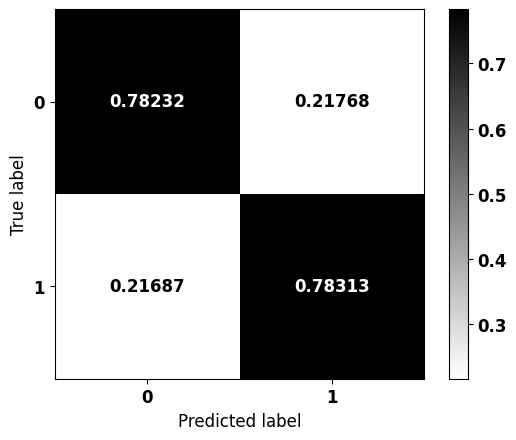


              precision    recall  f1-score   support

           0    0.95868   0.78232   0.86156      8007
           1    0.35872   0.78313   0.49205      1245

    accuracy                        0.78243      9252
   macro avg    0.65870   0.78272   0.67681      9252
weighted avg    0.87794   0.78243   0.81184      9252



In [ ]:
# Creating and training the XGBoost model
# Initialize an XGBoost classifier with specified parameters
xgb = XGBClassifier(max_depth=3,            # Set maximum tree depth to 3
                    scale_pos_weight=7.27,  # Adjust class imbalance using scale_pos_weight
                    random_state=seed)      # Ensure reproducibility

# Train the model using the training dataset
xgb.fit(X_train, y_train)

# Confusion matrix
# Generate and display the confusion matrix for model evaluation
plot_confusion_matrix(xgb, X_test, y_test)

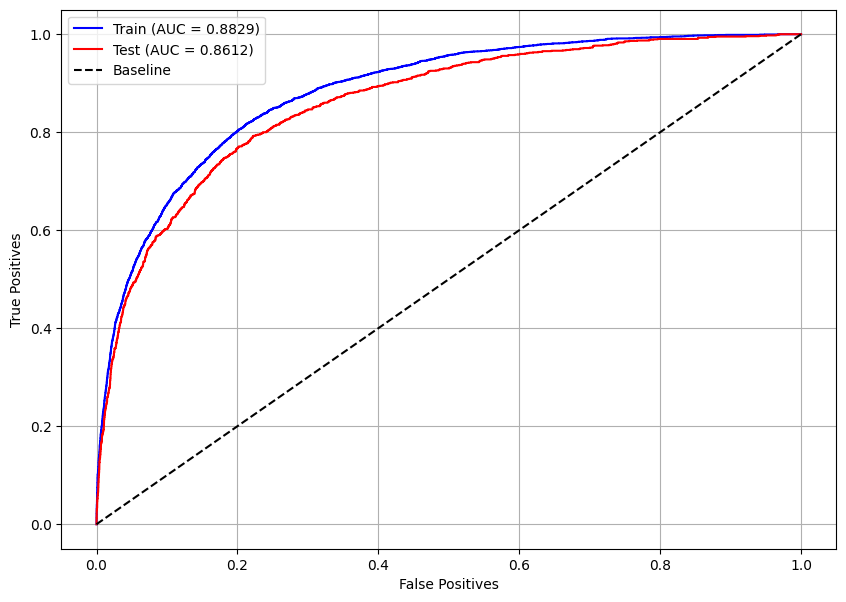

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb, X_train, X_test, y_train, y_test)

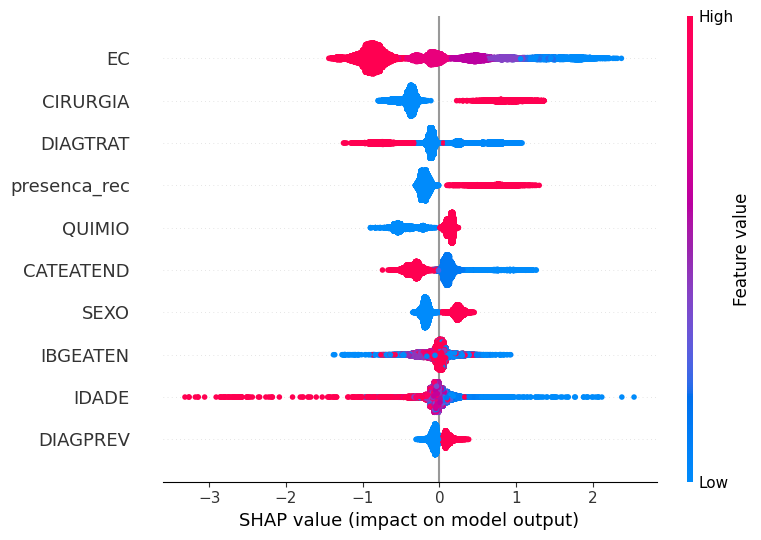

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(xgb, X_train, feat_cols)

#### **Optuna**

In [ ]:
# Creating stratified folds with the same class proportions
skf = StratifiedKFold(10, shuffle=True, random_state=seed)

# Function defining the model and its hyperparameters, which will be optimized
# to maximize the evaluation metric
def objective(trial):

    # Hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 50, 150)  # Number of trees
    max_depth = trial.suggest_int('max_depth', 3, 4)  # Maximum tree depth
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.2, step=0.05)  # Learning rate
    gamma = trial.suggest_float('gamma', 0.0, 0.3, step=0.1)  # Regularization term
    min_child_weight = trial.suggest_int('min_child_weight', 1, 7)  # Minimum sum of weights in a child node
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.3, 0.7, step=0.1)  # Fraction of features sampled per tree

    # XGBoost classifier with suggested hyperparameters
    cls = XGBClassifier(n_estimators=n_estimators,
                        max_depth=max_depth,
                        learning_rate=learning_rate,
                        gamma=gamma,
                        min_child_weight=min_child_weight,
                        colsample_bytree=colsample_bytree,
                        random_state=seed,
                        n_jobs=-1)

    # Performing cross-validation and returning the mean accuracy score
    return cross_val_score(cls, X_train, y_train,
                           cv=skf, scoring='accuracy').mean()

##### RandomSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=RandomSampler(seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 69,
 'max_depth': 4,
 'learning_rate': 0.15000000000000002,
 'gamma': 0.3,
 'min_child_weight': 5,
 'colsample_bytree': 0.7}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(7.2, 7.4, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

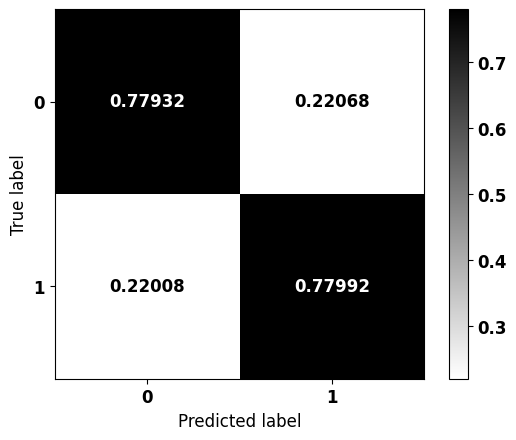


              precision    recall  f1-score   support

           0    0.95794   0.77932   0.85944      8007
           1    0.35464   0.77992   0.48757      1245

    accuracy                        0.77940      9252
   macro avg    0.65629   0.77962   0.67351      9252
weighted avg    0.87675   0.77940   0.80940      9252



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 7.255  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_rand = XGBClassifier()
xgb_rand.set_params(**params)

# Training the optimized model on the training dataset
xgb_rand.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_rand, X_test, y_test)

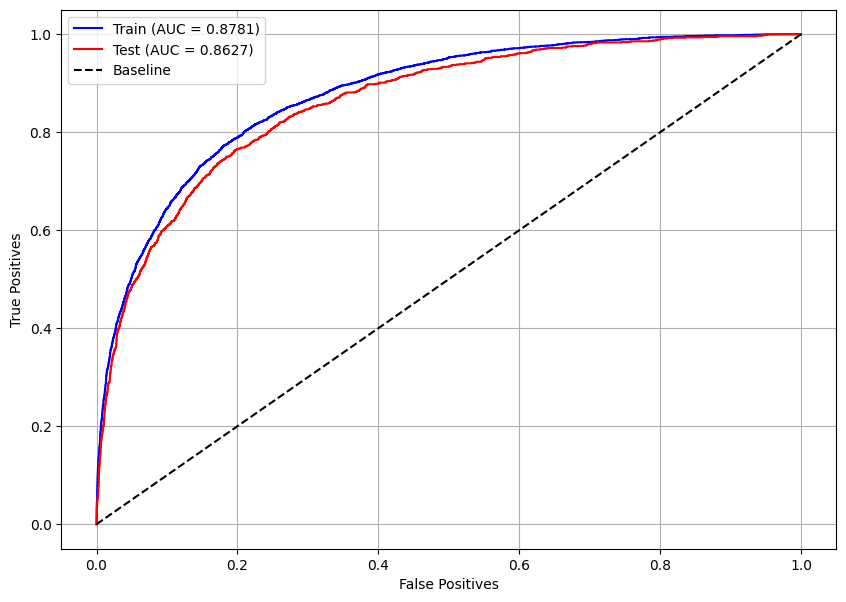

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_rand, X_train, X_test, y_train, y_test)

##### TPESampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=TPESampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 80,
 'max_depth': 4,
 'learning_rate': 0.15000000000000002,
 'gamma': 0.1,
 'min_child_weight': 7,
 'colsample_bytree': 0.7}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(7.28, 7.3, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

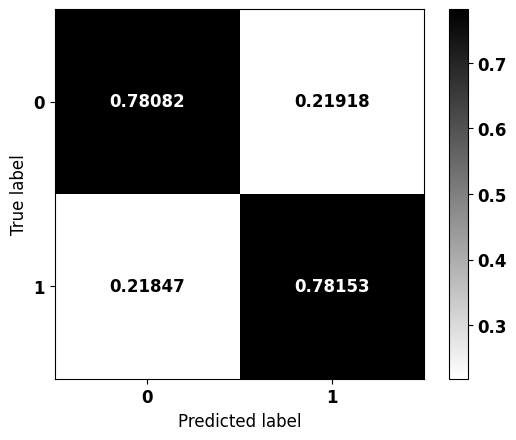


              precision    recall  f1-score   support

           0    0.95831   0.78082   0.86051      8007
           1    0.35667   0.78153   0.48981      1245

    accuracy                        0.78091      9252
   macro avg    0.65749   0.78117   0.67516      9252
weighted avg    0.87735   0.78091   0.81062      9252



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 7.292  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_tpe = XGBClassifier()
xgb_tpe.set_params(**params)

# Training the optimized model on the training dataset
xgb_tpe.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_tpe, X_test, y_test)

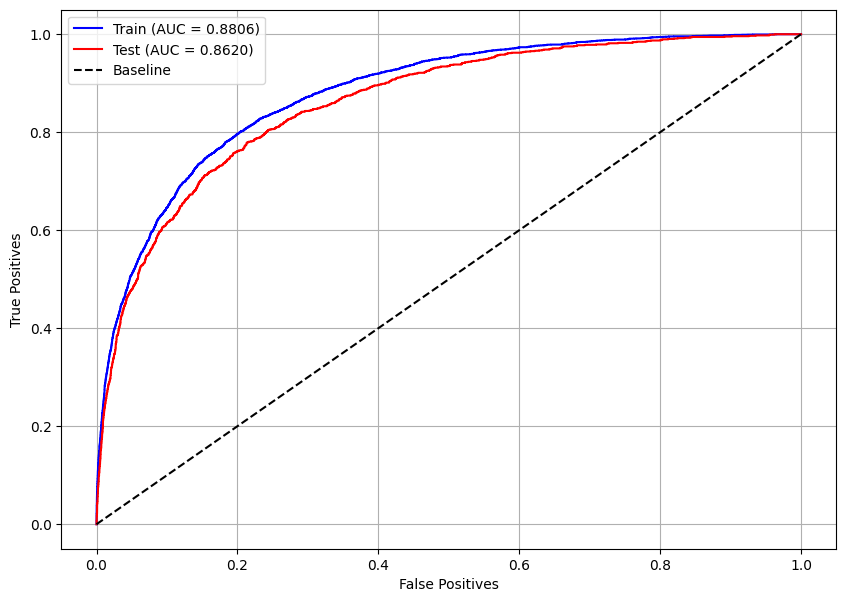

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_tpe, X_train, X_test, y_train, y_test)

##### CmaEsSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=CmaEsSampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 126,
 'max_depth': 4,
 'learning_rate': 0.15000000000000002,
 'gamma': 0.2,
 'min_child_weight': 3,
 'colsample_bytree': 0.5}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(7.2, 7.4, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

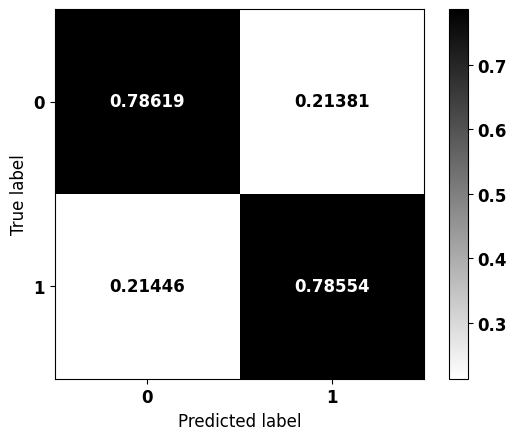


              precision    recall  f1-score   support

           0    0.95931   0.78619   0.86416      8007
           1    0.36357   0.78554   0.49708      1245

    accuracy                        0.78610      9252
   macro avg    0.66144   0.78586   0.68062      9252
weighted avg    0.87914   0.78610   0.81477      9252



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 7.256  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_cma = XGBClassifier()
xgb_cma.set_params(**params)

# Training the optimized model on the training dataset
xgb_cma.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_cma, X_test, y_test)

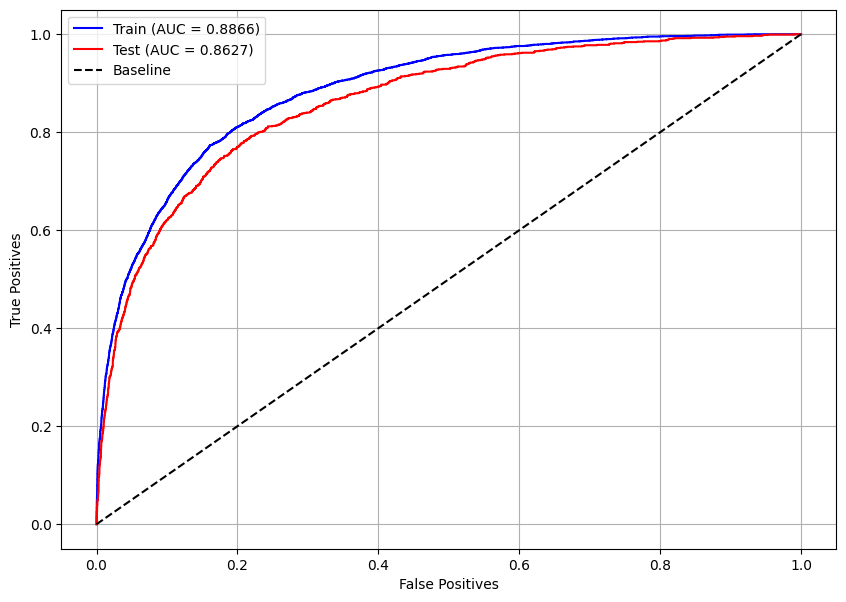

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_cma, X_train, X_test, y_train, y_test)

##### Optimized model

In [ ]:
# Selecting the best model based on performance
models = [xgb_rand, xgb_tpe, xgb_cma]  # List of trained models
best = models[0]  # Initialize the best model as the first in the list

# Iterate through the models to find the one with the highest accuracy score
for i, m in enumerate(models):
    if i == 0:
        continue  # Skip the first model since it's already assigned as 'best'

    best_score = best.score(X_test, y_test)  # Accuracy of the current best model
    score = m.score(X_test, y_test)  # Accuracy of the current model being evaluated

    if score > best_score:  # Update 'best' if the current model has a higher score
        best = m

# Print the best-performing model
print(best)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.5, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.2, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.15, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=3, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=126, n_jobs=None,
              num_parallel_tree=None, random_state=7, ...)


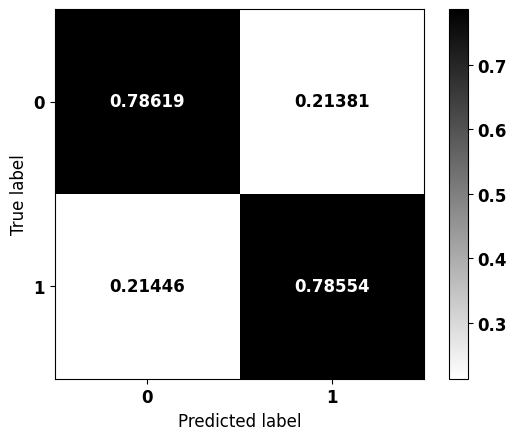


              precision    recall  f1-score   support

           0    0.95931   0.78619   0.86416      8007
           1    0.36357   0.78554   0.49708      1245

    accuracy                        0.78610      9252
   macro avg    0.66144   0.78586   0.68062      9252
weighted avg    0.87914   0.78610   0.81477      9252



In [ ]:
# Training the final XGBoost model using the best parameters
# Retrieve the best hyperparameters from the selected model
params = best.get_params()

# Initialize a new XGBoost classifier with the best parameters
xgb_optuna = XGBClassifier()
xgb_optuna.set_params(**params)

# Train the optimized model on the training data
xgb_optuna.fit(X_train, y_train)

# Plot the confusion matrix to evaluate the model's performance on the test set
plot_confusion_matrix(xgb_optuna, X_test, y_test)

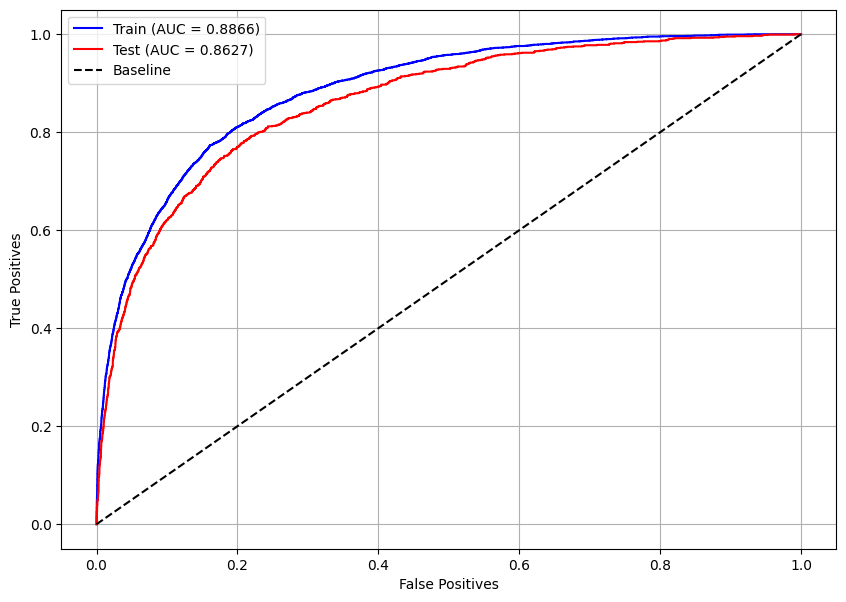

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_optuna, X_train, X_test, y_train, y_test)

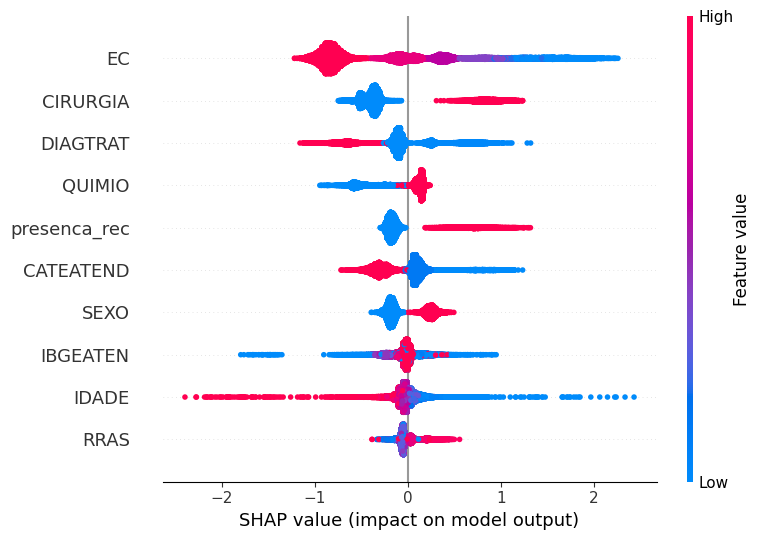

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(xgb_optuna, X_train, feat_cols)

### **LightGBM**


#### **Base model**

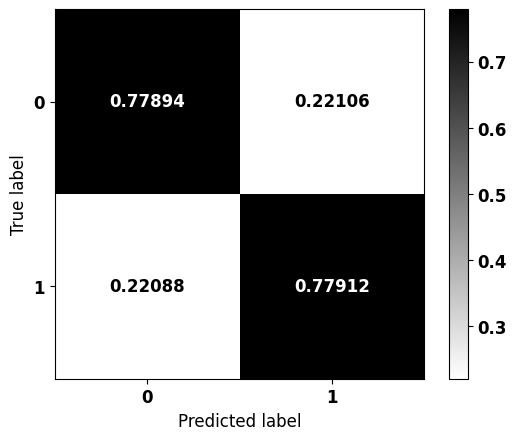


              precision    recall  f1-score   support

           0    0.95777   0.77894   0.85915      8007
           1    0.35401   0.77912   0.48683      1245

    accuracy                        0.77897      9252
   macro avg    0.65589   0.77903   0.67299      9252
weighted avg    0.87653   0.77897   0.80905      9252



In [ ]:
# Creating and training the LightGBM model
# Initialize an LightGBM classifier with specified parameters
lgbm = LGBMClassifier(max_depth=4,                  # Set maximum tree depth to 4
                      class_weight={0:1, 1:7.2},    # Adjust class imbalance using class_weight
                      random_state=seed,            # Ensure reproducibility
                      verbose=-1)

# Train the model using the training dataset
lgbm.fit(X_train, y_train)

# Confusion matrix
# Generate and display the confusion matrix for model evaluation
plot_confusion_matrix(lgbm, X_test, y_test)

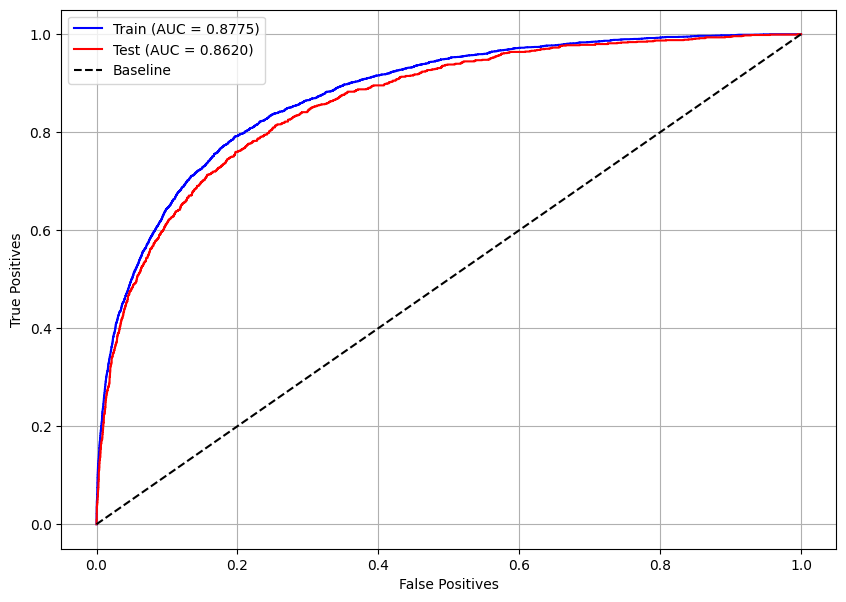

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm, X_train, X_test, y_train, y_test)

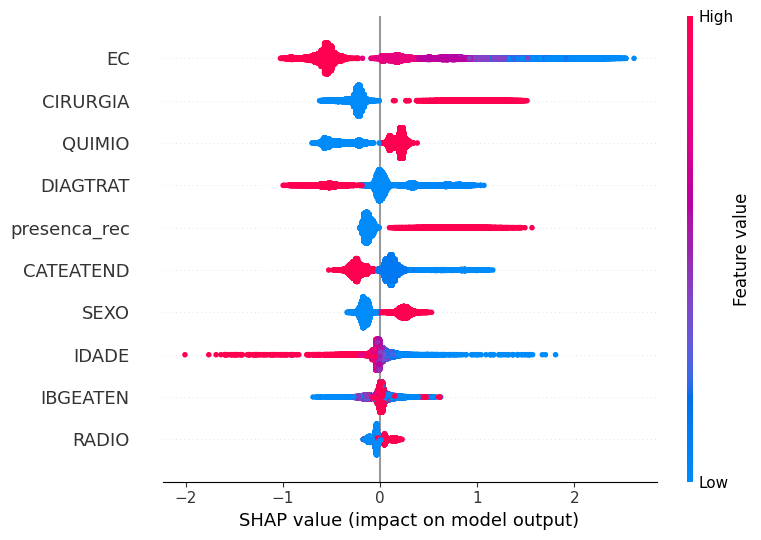

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(lgbm, X_train, feat_cols)

#### **Optuna**

In [ ]:
# Creating stratified folds with the same class proportions
skf = StratifiedKFold(10, shuffle=True, random_state=seed)

# Function defining the model and its hyperparameters, which will be optimized
# to maximize the evaluation metric
def objective(trial):

    # Hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 50, 150)  # Number of trees
    max_depth = trial.suggest_int('max_depth', 3, 6)  # Maximum tree depth
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.2, step=0.01)  # Learning rate
    min_child_weight = trial.suggest_int('min_child_weight', 1, 7)  # Minimum sum of weights in a child node
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.3, 0.7, step=0.1)  # Fraction of features sampled per tree

    # LightGBM classifier with suggested hyperparameters
    cls = LGBMClassifier(n_estimators=n_estimators,
                         max_depth=max_depth,
                         learning_rate=learning_rate,
                         min_child_weight=min_child_weight,
                         colsample_bytree=colsample_bytree,
                         random_state=seed,
                         verbose=-1,
                         n_jobs=-1)

    # Performing cross-validation and returning the mean accuracy score
    return cross_val_score(cls, X_train, y_train,
                           cv=skf, scoring='accuracy').mean()

##### RandomSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=RandomSampler(seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 68,
 'max_depth': 5,
 'learning_rate': 0.16999999999999998,
 'min_child_weight': 5,
 'colsample_bytree': 0.4}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(8.3, 8.8, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:1, 1:i}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

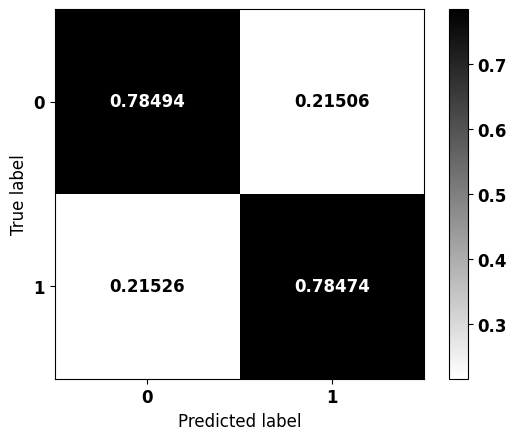


              precision    recall  f1-score   support

           0    0.95910   0.78494   0.86332      8007
           1    0.36199   0.78474   0.49544      1245

    accuracy                        0.78491      9252
   macro avg    0.66054   0.78484   0.67938      9252
weighted avg    0.87875   0.78491   0.81382      9252



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1, 1:7.32}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_rand = LGBMClassifier(verbose=-1)
lgbm_rand.set_params(**params)

# Training the optimized model on the training dataset
lgbm_rand.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_rand, X_test, y_test)

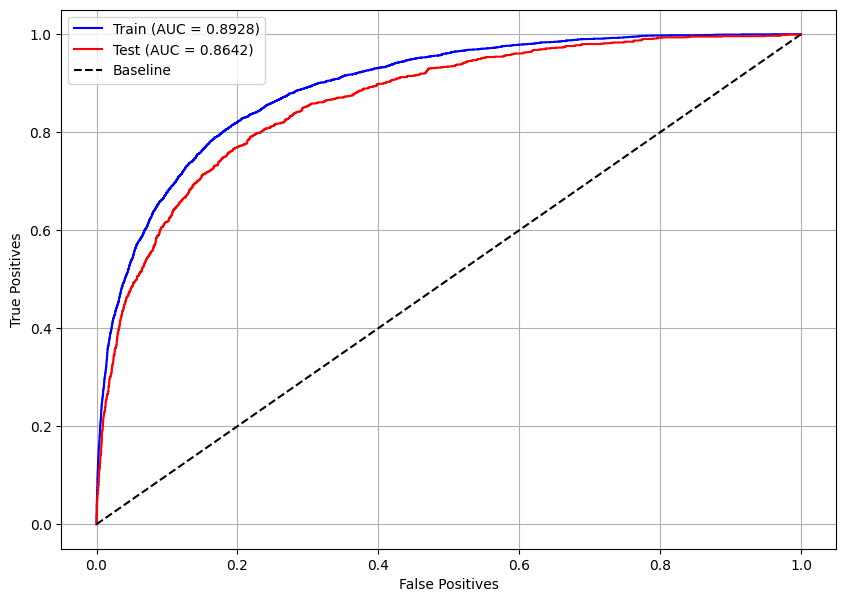

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_rand, X_train, X_test, y_train, y_test)

##### TPESampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=TPESampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 92,
 'max_depth': 5,
 'learning_rate': 0.11,
 'min_child_weight': 5,
 'colsample_bytree': 0.7}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(7.35, 7.55, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:1, 1:i}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

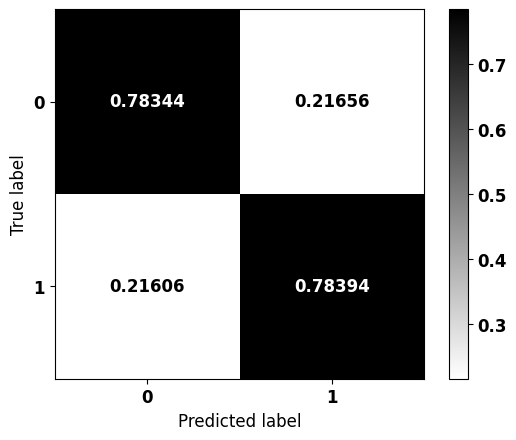


              precision    recall  f1-score   support

           0    0.95888   0.78344   0.86233      8007
           1    0.36015   0.78394   0.49355      1245

    accuracy                        0.78351      9252
   macro avg    0.65951   0.78369   0.67794      9252
weighted avg    0.87831   0.78351   0.81270      9252



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1, 1:7.469}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_tpe = LGBMClassifier(verbose=-1)
lgbm_tpe.set_params(**params)

# Training the optimized model on the training dataset
lgbm_tpe.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_tpe, X_test, y_test)

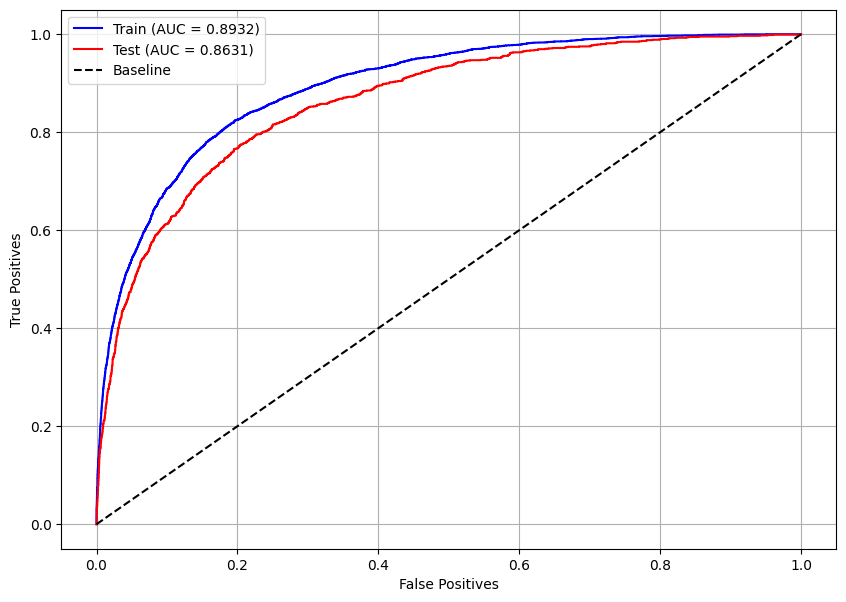

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_tpe, X_train, X_test, y_train, y_test)

##### CmaEsSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=CmaEsSampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 112,
 'max_depth': 5,
 'learning_rate': 0.08,
 'min_child_weight': 6,
 'colsample_bytree': 0.5}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(7.2, 7.45, 0.001), 3)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:1, 1:i}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

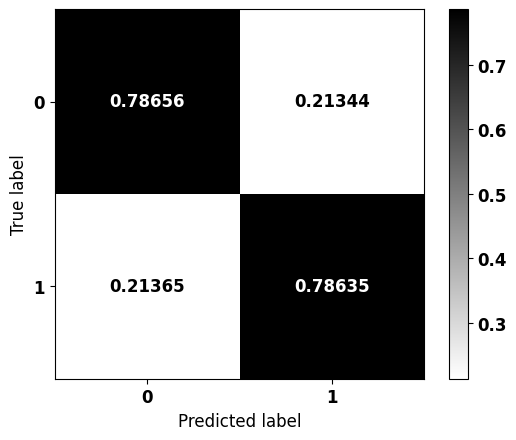


              precision    recall  f1-score   support

           0    0.95948   0.78656   0.86446      8007
           1    0.36421   0.78635   0.49784      1245

    accuracy                        0.78653      9252
   macro avg    0.66184   0.78645   0.68115      9252
weighted avg    0.87937   0.78653   0.81512      9252



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1, 1:7.25}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_cma = LGBMClassifier(verbose=-1)
lgbm_cma.set_params(**params)

# Training the optimized model on the training dataset
lgbm_cma.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_cma, X_test, y_test)

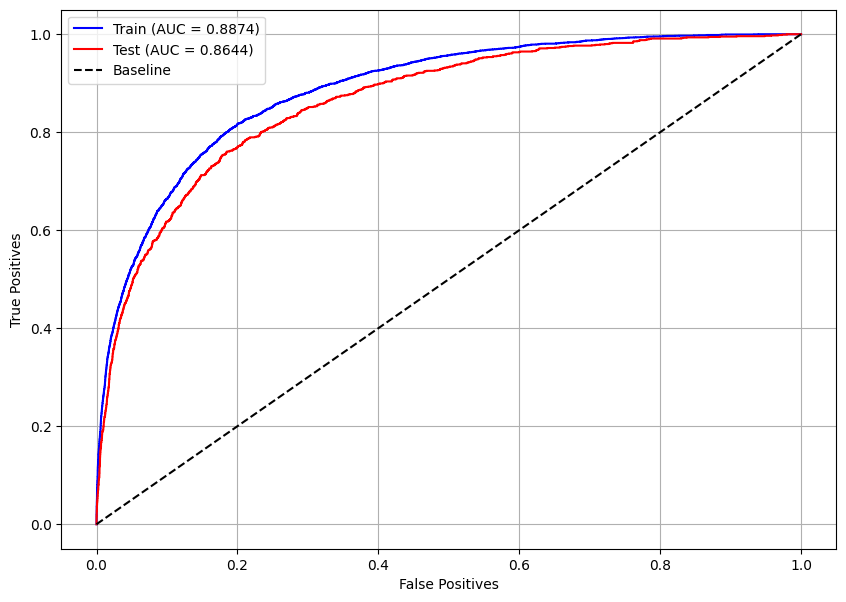

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_cma, X_train, X_test, y_train, y_test)

##### Optimized model

In [ ]:
# Selecting the best model based on performance
models = [lgbm_rand, lgbm_tpe, lgbm_cma]  # List of trained models
best = models[0]  # Initialize the best model as the first in the list

# Iterate through the models to find the one with the highest accuracy score
for i, m in enumerate(models):
    if i == 0:
        continue  # Skip the first model since it's already assigned as 'best'

    best_score = best.score(X_test, y_test)  # Accuracy of the current best model
    score = m.score(X_test, y_test)  # Accuracy of the current model being evaluated

    if score > best_score:  # Update 'best' if the current model has a higher score
        best = m

# Print the best-performing model
print(best)

LGBMClassifier(class_weight={0: 1, 1: 7.25}, colsample_bytree=0.5,
               learning_rate=0.08, max_depth=5, min_child_weight=6,
               n_estimators=112, random_state=7, verbose=-1)


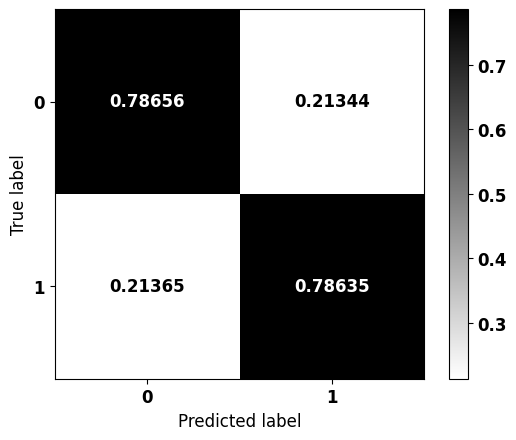


              precision    recall  f1-score   support

           0    0.95948   0.78656   0.86446      8007
           1    0.36421   0.78635   0.49784      1245

    accuracy                        0.78653      9252
   macro avg    0.66184   0.78645   0.68115      9252
weighted avg    0.87937   0.78653   0.81512      9252



In [ ]:
# Training the final XGBoost model using the best parameters
# Retrieve the best hyperparameters from the selected model
params = best.get_params()

# Initialize a new XGBoost classifier with the best parameters
lgbm_optuna = LGBMClassifier(verbose=-1)
lgbm_optuna.set_params(**params)

# Train the optimized model on the training data
lgbm_optuna.fit(X_train, y_train)

# Plot the confusion matrix to evaluate the model's performance on the test set
plot_confusion_matrix(lgbm_optuna, X_test, y_test)

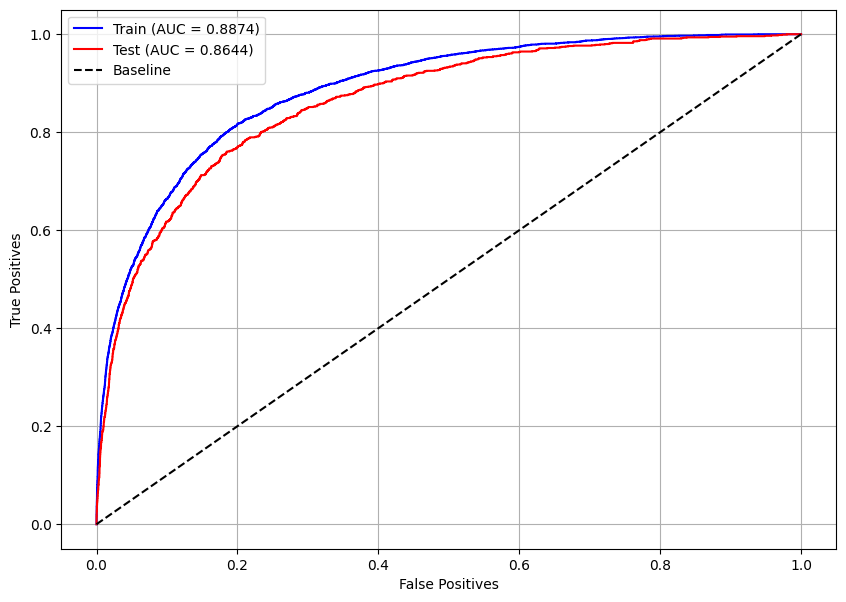

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_optuna, X_train, X_test, y_train, y_test)

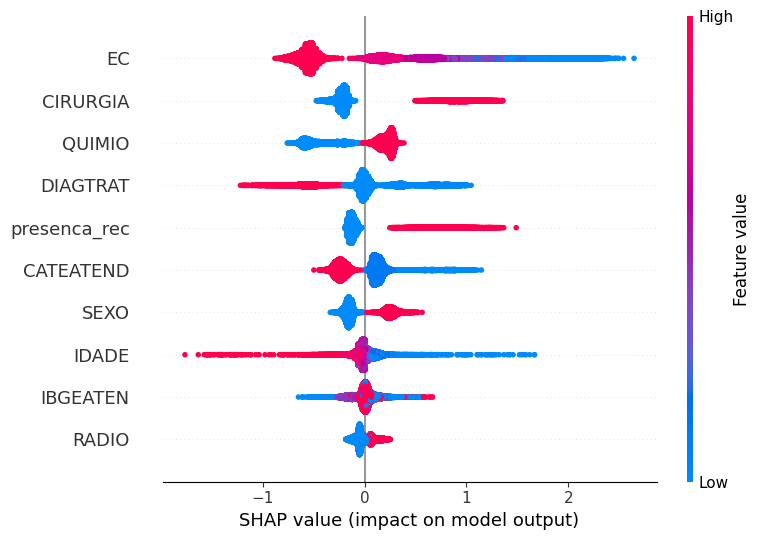

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(lgbm_optuna, X_train, feat_cols)

## **Voting Classifier**


In [ ]:
# Comparing the accuracy scores of the initial XGBoost model and the optimized Optuna model
xgb_score = xgb.score(X_test, y_test)
optuna_score = xgb_optuna.score(X_test, y_test)
print(f'Accuracy: XGB = {xgb_score:.4f}, Optuna = {optuna_score:.4f}\n')

# Determine which model performed better
if optuna_score >= xgb_score:
    params_xgb = xgb_optuna.get_params()  # Get the parameters of the optimized model
    print('Optimized model won')
else:
    params_xgb = xgb.get_params()  # Get the parameters of the initial model
    print('Initial model won')

Accuracy: XGB = 0.7824, Optuna = 0.7861

Otimizado venceu


In [ ]:
# Comparing the accuracy scores of the initial LightGBM model and the optimized Optuna model
lgbm_score = lgbm.score(X_test, y_test)
optuna_score = lgbm_optuna.score(X_test, y_test)
print(f'Accuracy: LGBM = {lgbm_score:.4f}, Optuna = {optuna_score:.4f}\n')

# Determine which model performed better
if optuna_score >= lgbm_score:
    params_lgbm = lgbm_optuna.get_params()  # Get the parameters of the optimized model
    print('Optimized model won')
else:
    params_lgbm = lgbm.get_params()  # Get the parameters of the initial model
    print('Initial model won')

Accuracy: LGBM = 0.7790, Optuna = 0.7865

Otimizado venceu


In [ ]:
# Creating the models with the best-performing hyperparameters
# XGBoost Model
best_xgb = XGBClassifier()  # Instantiate the XGBoost classifier
best_xgb.set_params(**params_xgb)  # Set the best hyperparameters for XGBoost

# LightGBM Model
best_lgbm = LGBMClassifier()  # Instantiate the LightGBM classifier
best_lgbm.set_params(**params_lgbm)  # Set the best hyperparameters for LightGBM

LGBMClassifier(class_weight={0: 1, 1: 7.25}, colsample_bytree=0.5,
               learning_rate=0.08, max_depth=5, min_child_weight=6,
               n_estimators=112, random_state=7, verbose=-1)

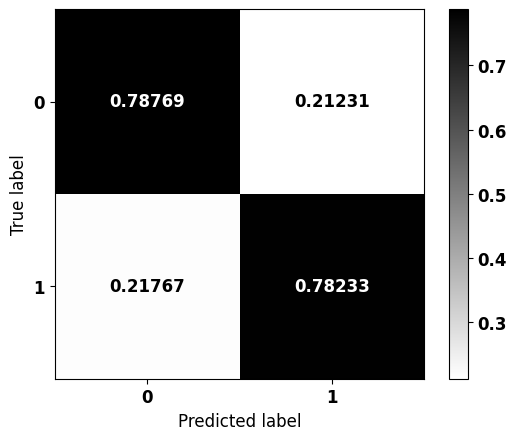


              precision    recall  f1-score   support

           0    0.95880   0.78769   0.86486      8007
           1    0.36425   0.78233   0.49707      1245

    accuracy                        0.78696      9252
   macro avg    0.66153   0.78501   0.68096      9252
weighted avg    0.87880   0.78696   0.81537      9252



In [ ]:
from sklearn.ensemble import VotingClassifier

# Creating and training the voting classifier model
clf = VotingClassifier(
    estimators=[('XGBoost', best_xgb),  # Adding the best XGBoost model
               ('LightGBM', best_lgbm)],  # Adding the best LightGBM model
    voting='soft'  # Using 'soft' voting, which predicts the class label based on predicted probabilities
)

clf.fit(X_train, y_train)  # Train the voting classifier on the training data

# Confusion Matrix
plot_confusion_matrix(clf, X_test, y_test)  # Plot the confusion matrix for the voting classifier on the test data

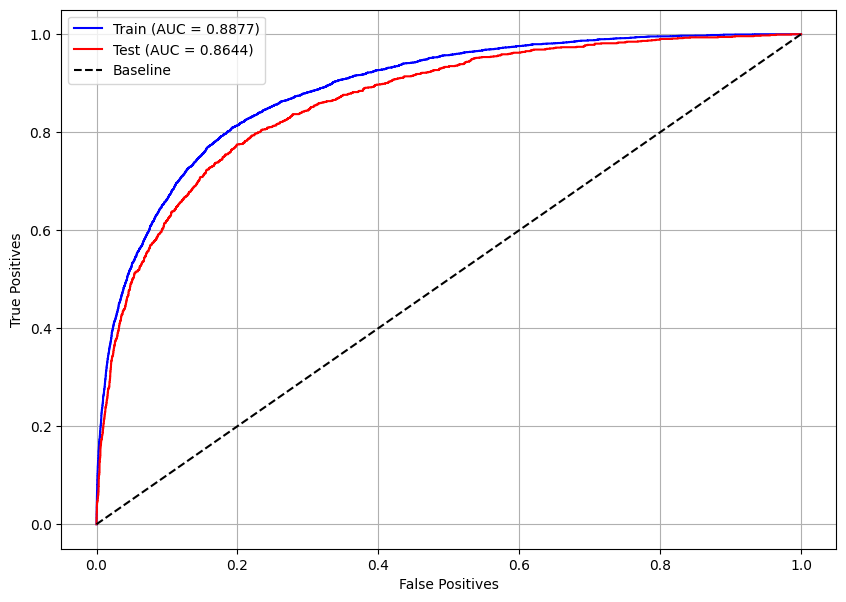

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(clf, X_train, X_test, y_train, y_test)

## **Tests with other cancer types**

In [ ]:
# Best Model Selection
models = [xgb, xgb_optuna, lgbm, lgbm_optuna]  # List of models to compare (XGBoost, optimized XGBoost, LightGBM, optimized LightGBM)

# Iterating through each model to find the best performing one
for i, m in enumerate(models):
    if i == 0:  # Initialize the best model as the first one
        best = m
    else:
        # Compare the performance of the current best model and the current model
        best_score = best.score(X_test, y_test)  # Get the accuracy of the current best model on the test set
        score = m.score(X_test, y_test)  # Get the accuracy of the current model on the test set
        if score > best_score:  # If the current model performs better, update the best model
            best = m

# Print the best performing model
print(best)

LGBMClassifier(class_weight={0: 1, 1: 7.25}, colsample_bytree=0.5,
               learning_rate=0.08, max_depth=5, min_child_weight=6,
               n_estimators=112, random_state=7, verbose=-1)


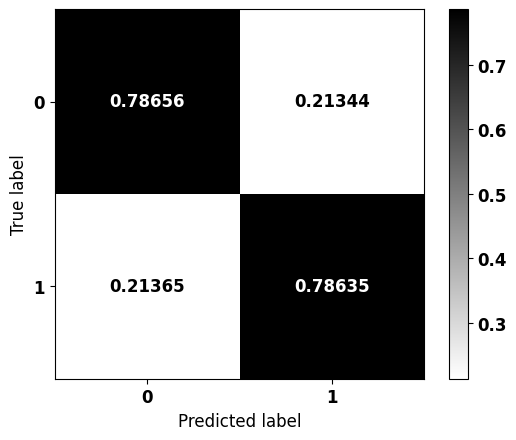


              precision    recall  f1-score   support

           0    0.95948   0.78656   0.86446      8007
           1    0.36421   0.78635   0.49784      1245

    accuracy                        0.78653      9252
   macro avg    0.66184   0.78645   0.68115      9252
weighted avg    0.87937   0.78653   0.81512      9252



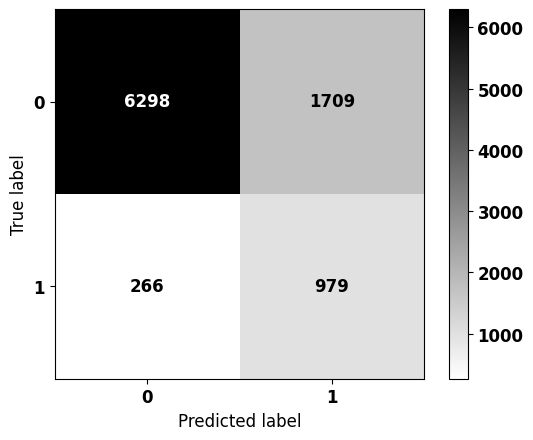


              precision    recall  f1-score   support

           0    0.95948   0.78656   0.86446      8007
           1    0.36421   0.78635   0.49784      1245

    accuracy                        0.78653      9252
   macro avg    0.66184   0.78645   0.68115      9252
weighted avg    0.87937   0.78653   0.81512      9252



In [ ]:
# Confusion Matrix for the Best Model
plot_confusion_matrix(best, X_test, y_test)  # Plot the normalized confusion matrix for the best model
plot_confusion_matrix(best, X_test, y_test, norm=False)  # Plot the unnormalized confusion matrix for the best model

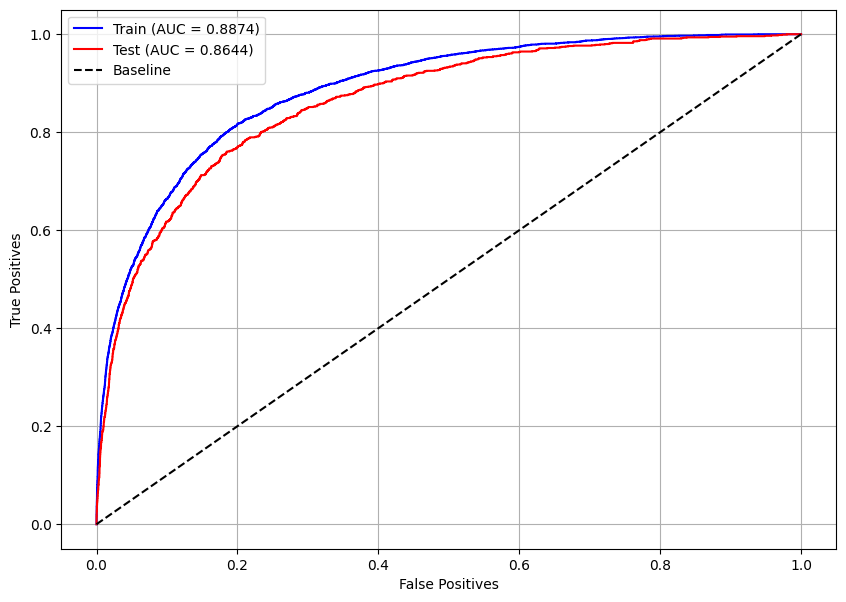

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(best, X_train, X_test, y_train, y_test)

/usr/local/lib/python3.10/dist-packages/shap/explainers/_tree.py:448: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn('LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray')


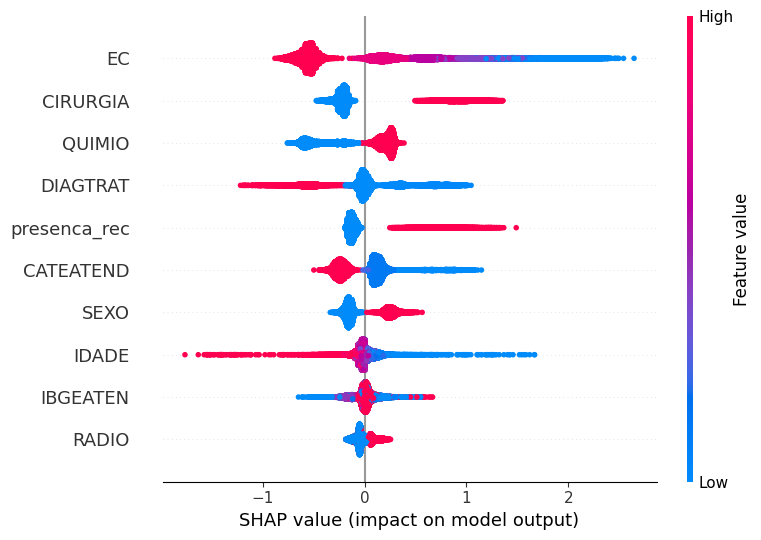

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(best, X_train, feat_cols)

In [ ]:
# Download test data
!gdown 194o9VVsCwcnt3Cp1oBbJdd0Sb_N2LOIF  # Download the test dataset - More Frequent

# Load the dataset
df_teste = pd.read_csv('incid_teste.csv')

# Split the test data based on cancer types
mama_teste = df_teste[df_teste.TOPOGRUP.isin(['Mama'])]
pele_teste = df_teste[df_teste.TOPOGRUP.isin(['Pele'])]
prost_teste = df_teste[df_teste.TOPOGRUP.isin(['Próstata'])]
colo_teste = df_teste[df_teste.TOPOGRUP.isin(['Colorretal'])]
pulm_teste = df_teste[df_teste.TOPOGRUP.isin(['Pulmão'])]
colo_utero_teste = df_teste[df_teste.TOPOGRUP.isin(['Colo de Útero'])]

# Check the shapes of the resulting subsets
mama_teste.shape, pele_teste.shape, prost_teste.shape, colo_teste.shape, pulm_teste.shape, colo_utero_teste.shape

### **Breast**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'mama_teste' DataFrame
saida_mama = mama_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
mama_teste = mama_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'mama_teste' DataFrame
print(mama_teste.shape)
mama_teste.head(3)

(26133, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
2,-0.623264,0.078323,-0.758504,1.270371,-0.915765,-1.584428,0.5453,1.015205,-1.536653,0.848079,...,2.956862,-0.190274,-0.446767,-0.851058,-0.888302,0.743452,-0.803767,0.967430,-1.048322,-0.51497
10,-0.549923,0.078323,1.068808,-0.747659,-0.915765,-0.339226,0.5453,1.015205,0.650765,0.848079,...,2.956862,-0.190274,-1.367290,1.932872,-0.205138,-1.642306,-0.803767,-0.940442,-1.048322,-0.51497
11,0.110146,0.078323,0.854448,1.270371,-0.915765,-1.584428,0.5453,1.015205,0.650765,0.848079,...,1.273530,-0.190274,-1.735499,-0.851058,-0.660580,0.743452,0.599581,1.921366,0.953905,-0.51497


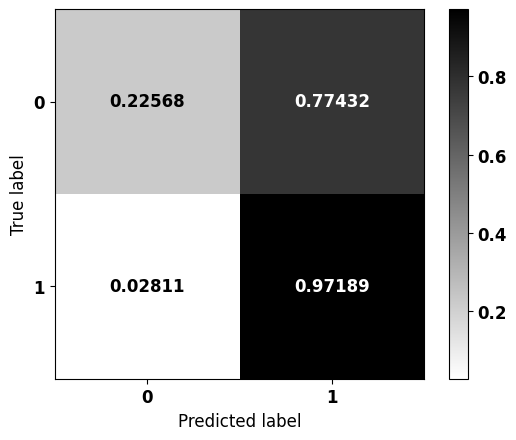


              precision    recall  f1-score   support

           0    0.66496   0.22568   0.33698      5180
           1    0.83545   0.97189   0.89852     20953

    accuracy                        0.82398     26133
   macro avg    0.75020   0.59878   0.61775     26133
weighted avg    0.80165   0.82398   0.78721     26133



In [ ]:
# Plot the confusion matrix for the best model on the 'mama_teste' dataset
plot_confusion_matrix(best, mama_teste, saida_mama)

### **Skin**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'pele_teste' DataFrame
saida_pele = pele_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
pele_teste = pele_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'pele_teste' DataFrame
print(pele_teste.shape)
pele_teste.head(3)

(25221, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
4,0.324125,-0.916019,-0.841077,1.167751,-0.344597,-0.429061,0.315561,-0.242155,-0.156064,-0.03833,...,0.591376,-0.20941,-0.716428,1.436258,0.636483,-1.212419,0.393904,-1.404163,-0.776427,-0.218179
5,0.701083,-0.916019,0.447649,1.167751,-0.344597,-0.429061,0.315561,-0.242155,-0.156064,-0.03833,...,-0.689569,-0.20941,0.240058,-0.214815,-0.234417,-1.110069,-1.165675,1.588451,-0.776427,-0.218179
7,-0.052834,-0.916019,0.069663,-0.808623,-0.344597,-0.429061,0.315561,-0.242155,-0.156064,-0.03833,...,1.872320,-0.20941,0.813950,-0.398268,0.926783,-1.212419,0.393904,-0.406625,-0.776427,-0.218179


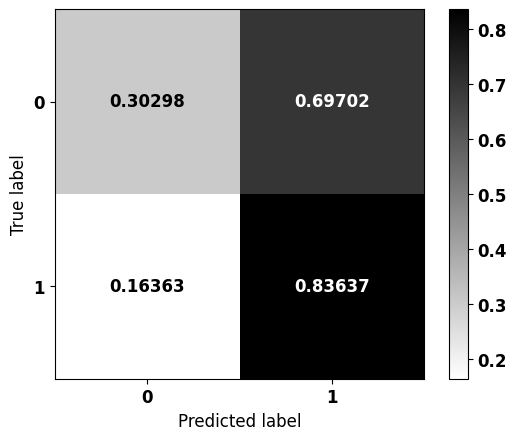


              precision    recall  f1-score   support

           0    0.35603   0.30298   0.32737      5799
           1    0.80075   0.83637   0.81817     19422

    accuracy                        0.71373     25221
   macro avg    0.57839   0.56968   0.57277     25221
weighted avg    0.69850   0.71373   0.70532     25221



In [ ]:
# Plot the confusion matrix for the best model on the 'pele_teste' dataset
plot_confusion_matrix(best, pele_teste, saida_pele)

### **Prostate**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'prost_teste' DataFrame
saida_prost = prost_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
prost_teste = prost_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'prost_teste' DataFrame
print(prost_teste.shape)
prost_teste.head(3)

(20862, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
3,0.149237,0.0,1.316000,-0.695899,0.723032,-0.63168,-0.879627,1.381841,-0.308078,1.085991,...,-0.418644,-0.208982,0.051988,0.032404,1.523967,-0.540997,-0.971798,-0.714113,-0.906043,-0.414926
12,-1.225865,0.0,0.958232,-0.695899,0.723032,0.27992,1.136845,-0.723672,-0.308078,-0.920818,...,-0.418644,-0.208982,0.841591,-1.029723,-0.860966,0.842650,0.451912,0.355595,1.103700,-0.414926
18,-0.423722,0.0,-0.370160,-0.695899,0.723032,-1.99908,-0.879627,1.381841,-0.308078,-0.920818,...,-0.418644,-0.208982,1.236393,0.032404,1.523967,-0.540997,-0.971798,1.425303,-0.906043,-0.414926


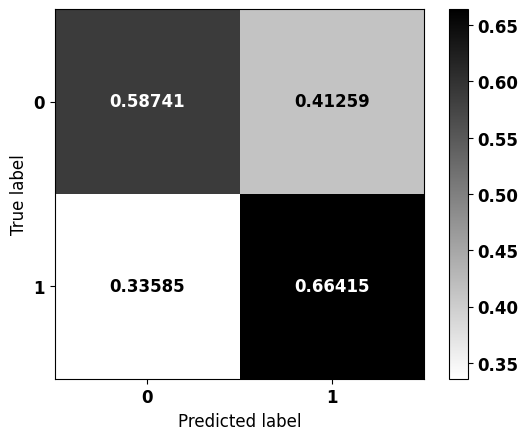


              precision    recall  f1-score   support

           0    0.25197   0.58741   0.35267      3369
           1    0.89314   0.66415   0.76181     17493

    accuracy                        0.65176     20862
   macro avg    0.57256   0.62578   0.55724     20862
weighted avg    0.78960   0.65176   0.69574     20862



In [ ]:
# Plot the confusion matrix for the best model on the 'prost_teste' dataset
plot_confusion_matrix(best, prost_teste, saida_prost)

### **Colorectal**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'colo_teste' DataFrame
saida_colo = colo_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
colo_teste = colo_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'colo_teste' DataFrame
print(colo_teste.shape)
colo_teste.head(3)

(14028, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
0,0.366829,-0.972134,1.141405,1.343451,0.958036,-0.047542,0.60093,-0.567847,0.737288,-0.07854,...,-0.325938,-0.193018,-1.734289,1.587885,0.660606,-1.716753,0.396181,1.180668,-1.03687,-0.475073
1,-0.166349,-0.972134,-0.649610,1.343451,0.958036,-0.873817,0.60093,1.761039,0.737288,-0.07854,...,-0.325938,-0.143566,-0.209650,1.767959,-0.282288,0.900562,-0.968850,0.154944,-1.03687,-0.475073
6,-0.318686,-0.972134,-1.770966,-0.714301,0.958036,1.329585,0.60093,-0.567847,0.737288,-0.07854,...,-0.325938,-0.193018,1.314989,-0.032782,-0.046564,-0.607175,0.396181,2.206391,-1.03687,-0.475073


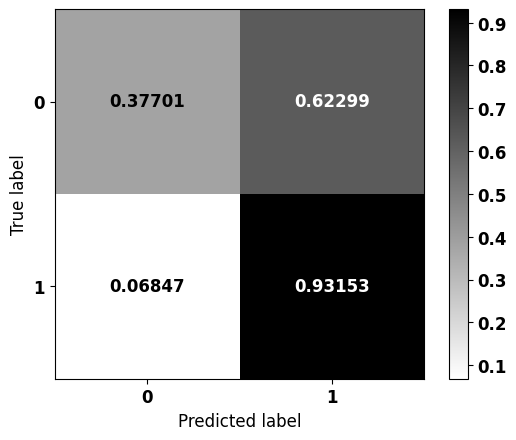


              precision    recall  f1-score   support

           0    0.81664   0.37701   0.51587      6273
           1    0.64894   0.93153   0.76497      7755

    accuracy                        0.68356     14028
   macro avg    0.73279   0.65427   0.64042     14028
weighted avg    0.72393   0.68356   0.65358     14028



In [ ]:
# Plot the confusion matrix for the best model on the 'colo_teste' dataset
plot_confusion_matrix(best, colo_teste, saida_colo)

### **Cervical**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'colo_utero_teste' DataFrame
saida_colo_utero = colo_utero_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
colo_utero_teste = colo_utero_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'colo_utero_teste' DataFrame
print(colo_utero_teste.shape)
colo_utero_teste.head(3)

(5368, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
40,0.519132,0.0,0.929895,-0.892955,-1.099583,-2.175331,1.259960,-1.349244,-0.933285,-0.087376,...,4.004901,-0.269490,0.413337,-0.892417,-0.710476,0.814678,0.639879,-1.668349,1.088759,-0.459887
63,0.722950,0.0,0.009041,-0.892955,0.909436,0.794350,-0.793676,-1.349244,-0.933285,-0.087376,...,-0.292508,4.381396,0.936614,-0.892417,-0.936297,0.814678,0.639879,-0.614620,-0.918477,-0.459887
76,-0.092323,0.0,1.103217,-0.892955,0.909436,0.794350,1.259960,-1.349244,1.071484,-0.087376,...,-0.292508,-0.175532,0.936614,1.467974,1.321912,-1.416945,0.639879,-0.614620,-0.918477,2.174445


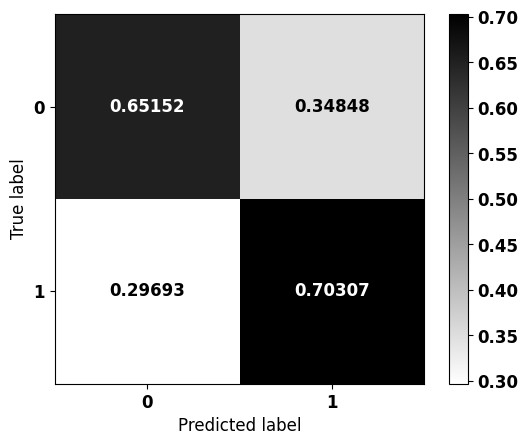


              precision    recall  f1-score   support

           0    0.62370   0.65152   0.63731      2310
           1    0.72758   0.70307   0.71512      3058

    accuracy                        0.68089      5368
   macro avg    0.67564   0.67729   0.67621      5368
weighted avg    0.68288   0.68089   0.68163      5368



In [ ]:
# Plot the confusion matrix for the best model on the 'colo_utero_teste' dataset
plot_confusion_matrix(best, colo_utero_teste, saida_colo_utero)

# **Cervical**

In [ ]:
# Display the shape (number of rows and columns) of the lung cancer dataset
print(df_colo_utero.shape)

# Show the first three rows of the dataset to inspect its structure and values
df_colo_utero.head(3)

(21470, 32)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,TOPO,TOPOGRUP,EC,TRATHOSP,NENHUM,...,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec,obito_geral,sobrevida_ano1,sobrevida_ano3,sobrevida_ano5
0,56,2,3518701,9,2,C530,C53,IB1,G,0,...,7,3518701,1,1.0,1,0,1,1,0,0
1,72,2,3518701,9,1,C539,C53,IIIB,C,0,...,7,3518701,1,2.0,1,0,1,0,0,0
2,63,2,3518701,9,1,C539,C53,IB1,E,0,...,7,3518701,1,3.0,1,0,1,1,0,0


In [ ]:
# Missing values
df_colo_utero.isna().sum().sort_values(ascending=False).head(6)

IDADE             0
SEXO              0
sobrevida_ano3    0
sobrevida_ano1    0
obito_geral       0
presenca_rec      0
dtype: int64

In [ ]:
# Compute the correlation matrix for numerical features in the oral cavity cancer dataset
corr_matrix = df_colo_utero.corr(numeric_only=True)

# Get the absolute correlation values with the target variable 'sobrevida_ano3',
# sort them in descending order, and display the top 20 most correlated features
abs(corr_matrix['sobrevida_ano3']).sort_values(ascending=False).head(20)

sobrevida_ano3        1.000000
sobrevida_ano5        0.728169
obito_geral           0.705855
sobrevida_ano1        0.579727
CIRURGIA              0.329928
NENHUM                0.205218
DIAGTRAT              0.204454
TRATCONS              0.204275
IDADE                 0.132466
presenca_rec          0.107527
ESCOLARI_preench      0.077086
CONSDIAG              0.076845
QUIMIO                0.068720
RADIO                 0.055565
CATEATEND             0.051442
OUTROS                0.045452
IBGEATEN              0.044755
RRAS                  0.033182
DIAGPREV              0.030029
IBGE_idem_IBGEATEN    0.029533
Name: sobrevida_ano3, dtype: float64

In [ ]:
# Count the number of patients in each class of the target variable 'sobrevida_ano3'
df_colo_utero.sobrevida_ano3.value_counts()

sobrevida_ano3
1    12231
0     9239
Name: count, dtype: int64

## **Preprocessing**

In [ ]:
# Preprocessed data setup

# List of columns to drop from the dataset, including treatment-related, tumor location, and other survival indicators
list_drop = ['TRATHOSP', 'TOPO', 'TOPOGRUP', 'NENHUM', 'TRATCONS', 'obito_geral',
             'sobrevida_ano1', 'sobrevida_ano5']

# Target variable for classification
lb = 'sobrevida_ano3'

# Perform preprocessing, including feature selection, encoding, and normalization
# Returns training and test sets (features and labels), feature column names, encoder, and normalization method
X_train, X_test, y_train, y_test, feat_cols, enc, norm = preprocessing(df_colo_utero,
                                                                       list_drop, lb,
                                                                       norm_name='StandardScaler',
                                                                       return_enc_norm=True,
                                                                       random_state=seed)

X_train = (16102, 23), X_test = (5368, 23)
y_train = (16102,), y_test = (5368,)


In [ ]:
# Training dataset for Cervical Cancer

# Create a DataFrame for training data with selected features
colo_utero_treino = pd.DataFrame(X_train, columns=feat_cols)

# Add the 'TOPOGRUP' column to indicate the cancer type (here, 'Colo de Útero' for Cervical Cancer)
colo_utero_treino['TOPOGRUP'] = 'Colo de Útero'

# Add the target variable (survival after 3 years) to the training dataset
colo_utero_treino['sobrevida_3anos'] = y_train.values

# Testing dataset for Cervical Cancer

# Create a DataFrame for testing data with selected features
colo_utero_teste = pd.DataFrame(X_test, columns=feat_cols)

# Add the 'TOPOGRUP' column to indicate the cancer type (here, 'Colo de Útero' for Cervical Cancer)
colo_utero_teste['TOPOGRUP'] = 'Colo de Útero'

# Add the target variable (survival after 3 years) to the testing dataset
colo_utero_teste['sobrevida_3anos'] = y_test.values

## **Training and validation of machine learning models**

### **XGBoost**


#### **Base model**

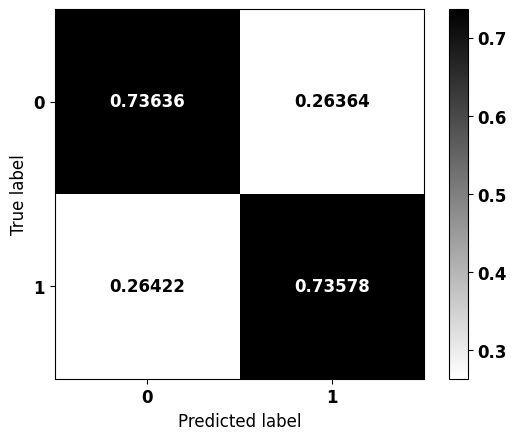


              precision    recall  f1-score   support

           0    0.67796   0.73636   0.70596      2310
           1    0.78699   0.73578   0.76052      3058

    accuracy                        0.73603      5368
   macro avg    0.73247   0.73607   0.73324      5368
weighted avg    0.74007   0.73603   0.73704      5368



In [ ]:
# Creating and training the XGBoost model
# Initialize an XGBoost classifier with specified parameters
xgb = XGBClassifier(max_depth=3,            # Set maximum tree depth to 3
                    scale_pos_weight=0.851, # Adjust class imbalance using scale_pos_weight
                    random_state=seed)      # Ensure reproducibility

# Train the model using the training dataset
xgb.fit(X_train, y_train)

# Confusion matrix
# Generate and display the confusion matrix for model evaluation
plot_confusion_matrix(xgb, X_test, y_test)

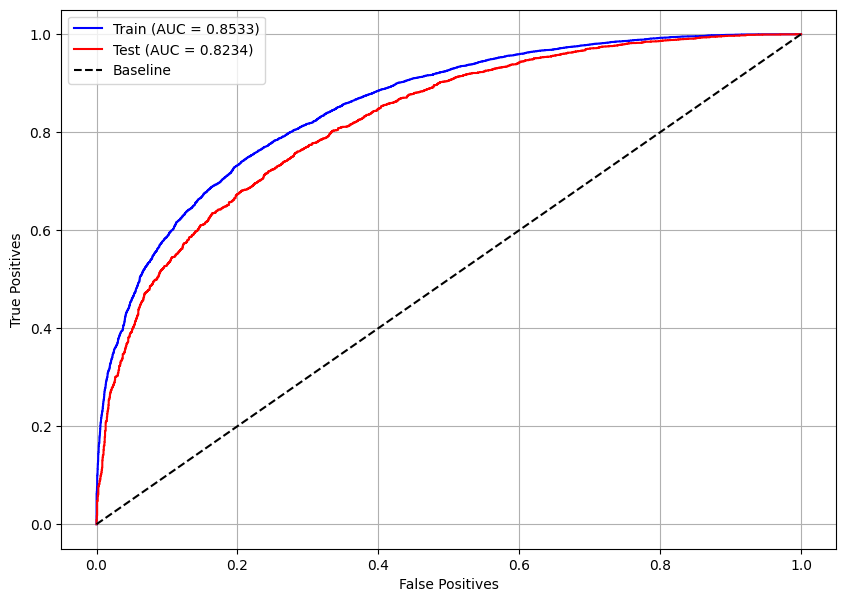

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb, X_train, X_test, y_train, y_test)

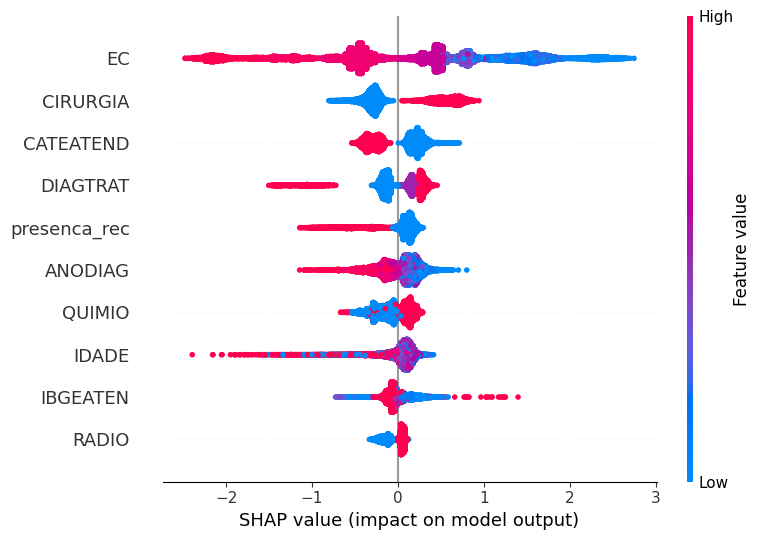

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(xgb, X_train, feat_cols)

#### **Optuna**

In [ ]:
# Creating stratified folds with the same class proportions
skf = StratifiedKFold(10, shuffle=True, random_state=seed)

# Function defining the model and its hyperparameters, which will be optimized
# to maximize the evaluation metric
def objective(trial):

    # Hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 50, 150)  # Number of trees
    max_depth = trial.suggest_int('max_depth', 3, 4)  # Maximum tree depth
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.2, step=0.05)  # Learning rate
    gamma = trial.suggest_float('gamma', 0.0, 0.3, step=0.1)  # Regularization term
    min_child_weight = trial.suggest_int('min_child_weight', 1, 7)  # Minimum sum of weights in a child node
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.3, 0.7, step=0.1)  # Fraction of features sampled per tree

    # XGBoost classifier with suggested hyperparameters
    cls = XGBClassifier(n_estimators=n_estimators,
                        max_depth=max_depth,
                        learning_rate=learning_rate,
                        gamma=gamma,
                        min_child_weight=min_child_weight,
                        colsample_bytree=colsample_bytree,
                        random_state=seed,
                        n_jobs=-1)

    # Performing cross-validation and returning the mean accuracy score
    return cross_val_score(cls, X_train, y_train,
                           cv=skf, scoring='accuracy').mean()

##### RandomSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=RandomSampler(seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 144,
 'max_depth': 4,
 'learning_rate': 0.2,
 'gamma': 0.2,
 'min_child_weight': 1,
 'colsample_bytree': 0.3}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(0.84, 0.875, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

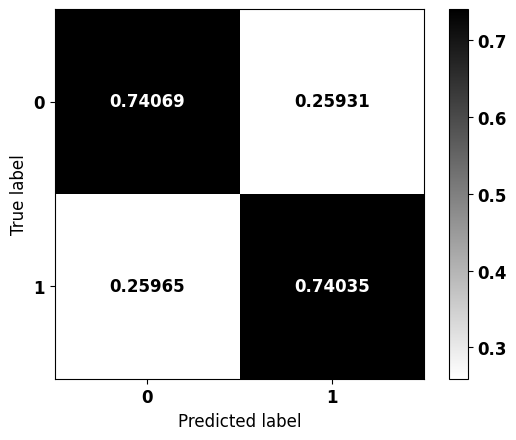


              precision    recall  f1-score   support

           0    0.68303   0.74069   0.71070      2310
           1    0.79078   0.74035   0.76474      3058

    accuracy                        0.74050      5368
   macro avg    0.73691   0.74052   0.73772      5368
weighted avg    0.74441   0.74050   0.74148      5368



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 0.8483  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_rand = XGBClassifier()
xgb_rand.set_params(**params)

# Training the optimized model on the training dataset
xgb_rand.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_rand, X_test, y_test)

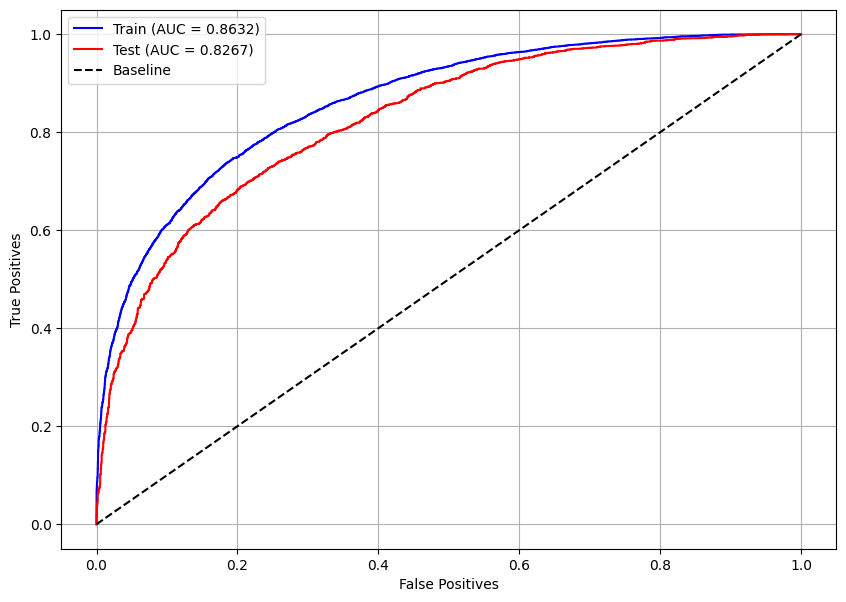

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_rand, X_train, X_test, y_train, y_test)

##### TPESampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the XGBoost model
studyXGB = optuna.create_study(direction='maximize', sampler=TPESampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 120,
 'max_depth': 4,
 'learning_rate': 0.2,
 'gamma': 0.2,
 'min_child_weight': 7,
 'colsample_bytree': 0.6000000000000001}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(0.84, 0.87, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

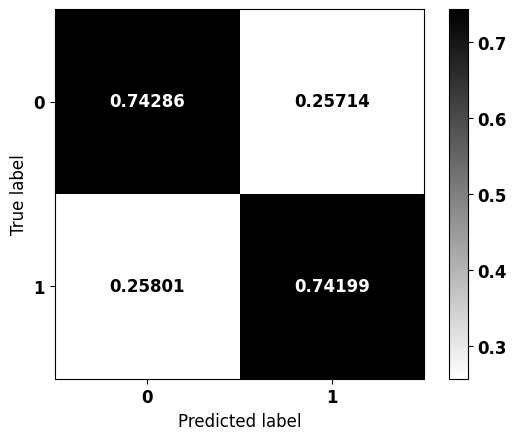


              precision    recall  f1-score   support

           0    0.68503   0.74286   0.71277      2310
           1    0.79253   0.74199   0.76642      3058

    accuracy                        0.74236      5368
   macro avg    0.73878   0.74242   0.73960      5368
weighted avg    0.74627   0.74236   0.74334      5368



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 0.8551  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_tpe = XGBClassifier()
xgb_tpe.set_params(**params)

# Training the optimized model on the training dataset
xgb_tpe.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_tpe, X_test, y_test)

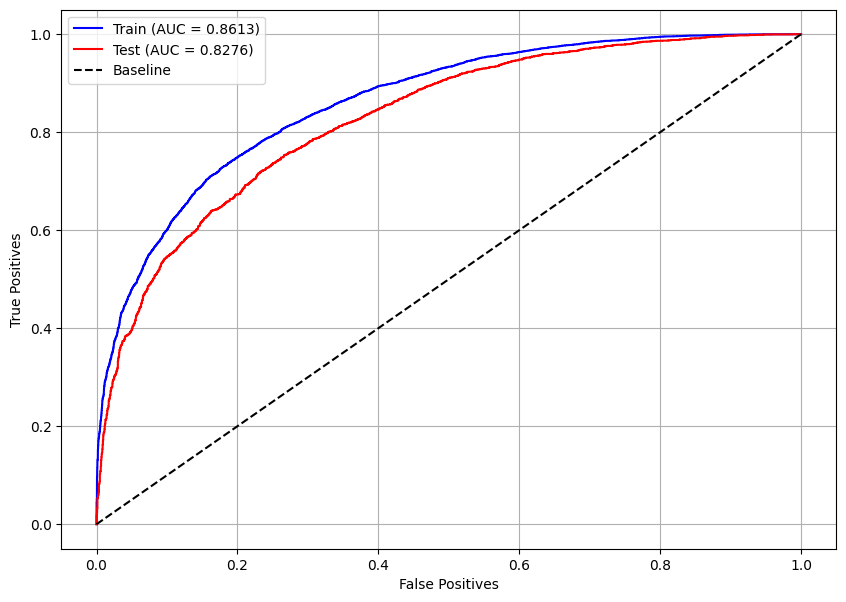

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_tpe, X_train, X_test, y_train, y_test)

##### CmaEsSampler

In [ ]:
# Criação do estudo e procura pelos hiperparâmetros
studyXGB = optuna.create_study(direction='maximize', sampler=CmaEsSampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyXGB.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyXGB.best_params

{'n_estimators': 107,
 'max_depth': 4,
 'learning_rate': 0.2,
 'gamma': 0.1,
 'min_child_weight': 2,
 'colsample_bytree': 0.6000000000000001}

In [ ]:
# Generating a range of scale_pos_weight values to fine-tune the model
pesos = np.round(np.arange(0.84, 0.865, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyXGB.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['scale_pos_weight'] = i  # Updating the weight parameter

    # Creating and configuring the XGBoost classifier with the updated parameters
    xgb_optuna = XGBClassifier()
    xgb_optuna.set_params(**params)

    # Training the model on the training dataset
    xgb_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = xgb_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(xgb_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

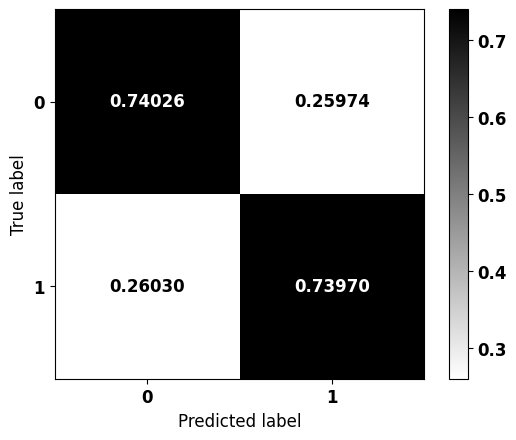


              precision    recall  f1-score   support

           0    0.68236   0.74026   0.71013      2310
           1    0.79036   0.73970   0.76419      3058

    accuracy                        0.73994      5368
   macro avg    0.73636   0.73998   0.73716      5368
weighted avg    0.74388   0.73994   0.74093      5368



In [ ]:
# Defining the final model with the best hyperparameters
params = studyXGB.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['scale_pos_weight'] = 0.8518  # Assigning the best-found scale_pos_weight value

# Initializing the XGBoost classifier with optimized parameters
xgb_cma = XGBClassifier()
xgb_cma.set_params(**params)

# Training the optimized model on the training dataset
xgb_cma.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(xgb_cma, X_test, y_test)

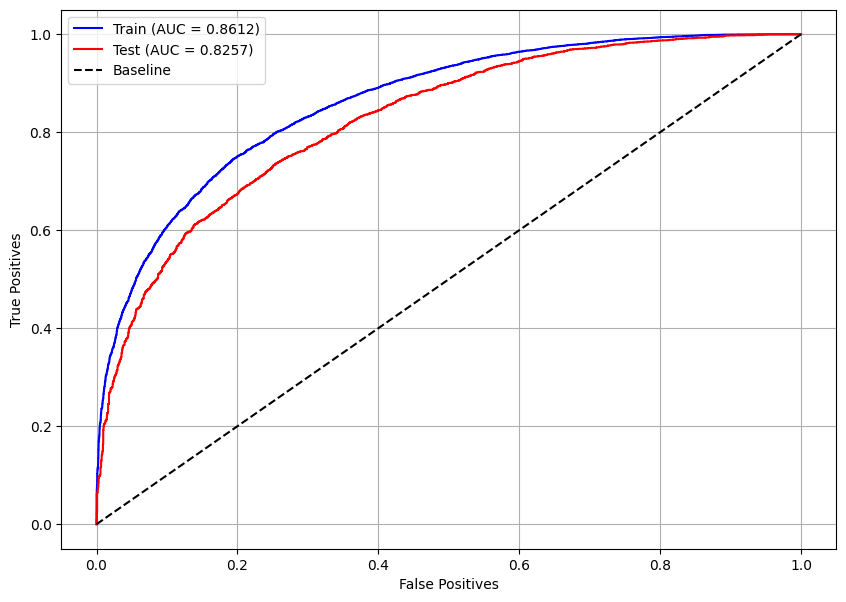

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_cma, X_train, X_test, y_train, y_test)

##### Optimized model

In [ ]:
# Selecting the best model based on performance
models = [xgb_rand, xgb_tpe, xgb_cma]  # List of trained models
best = models[0]  # Initialize the best model as the first in the list

# Iterate through the models to find the one with the highest accuracy score
for i, m in enumerate(models):
    if i == 0:
        continue  # Skip the first model since it's already assigned as 'best'

    best_score = best.score(X_test, y_test)  # Accuracy of the current best model
    score = m.score(X_test, y_test)  # Accuracy of the current model being evaluated

    if score > best_score:  # Update 'best' if the current model has a higher score
        best = m

# Print the best-performing model
print(best)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.6, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.2, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=7, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=120, n_jobs=None,
              num_parallel_tree=None, random_state=7, ...)


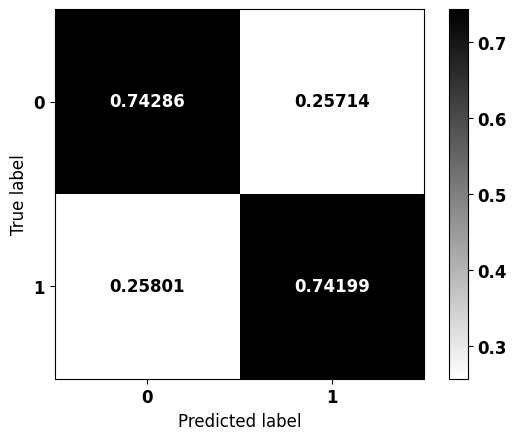


              precision    recall  f1-score   support

           0    0.68503   0.74286   0.71277      2310
           1    0.79253   0.74199   0.76642      3058

    accuracy                        0.74236      5368
   macro avg    0.73878   0.74242   0.73960      5368
weighted avg    0.74627   0.74236   0.74334      5368



In [ ]:
# Training the final XGBoost model using the best parameters
# Retrieve the best hyperparameters from the selected model
params = best.get_params()

# Initialize a new XGBoost classifier with the best parameters
xgb_optuna = XGBClassifier()
xgb_optuna.set_params(**params)

# Train the optimized model on the training data
xgb_optuna.fit(X_train, y_train)

# Plot the confusion matrix to evaluate the model's performance on the test set
plot_confusion_matrix(xgb_optuna, X_test, y_test)

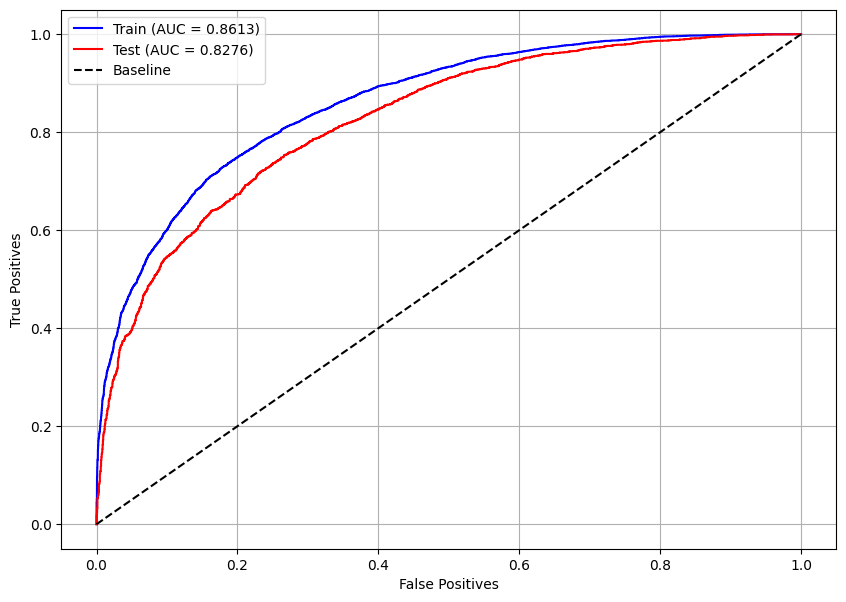

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(xgb_optuna, X_train, X_test, y_train, y_test)

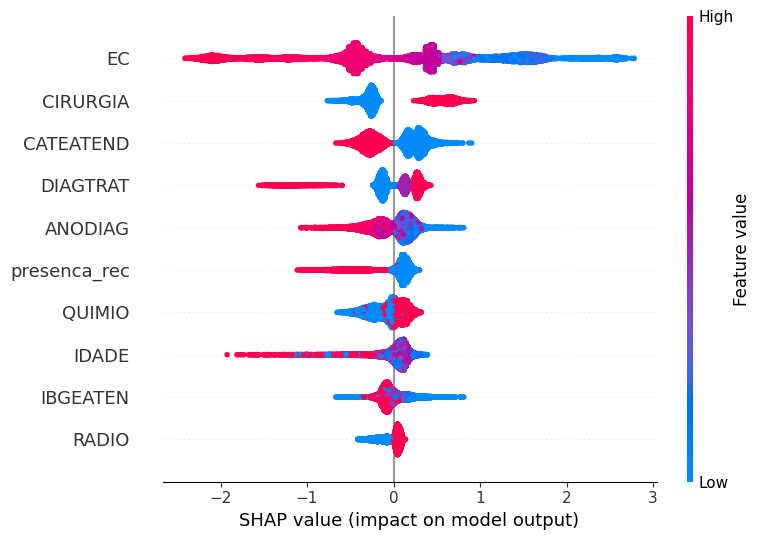

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(xgb_optuna, X_train, feat_cols)

### **LightGBM**


#### **Base model**

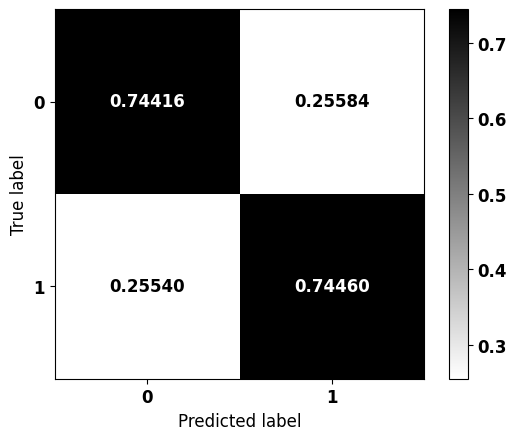


              precision    recall  f1-score   support

           0    0.68760   0.74416   0.71476      2310
           1    0.79393   0.74460   0.76848      3058

    accuracy                        0.74441      5368
   macro avg    0.74077   0.74438   0.74162      5368
weighted avg    0.74817   0.74441   0.74536      5368



In [ ]:
# Creating and training the LightGBM model
# Initialize an LightGBM classifier with specified parameters
lgbm = LGBMClassifier(max_depth=4,                  # Set maximum tree depth to 4
                      class_weight={0:1.154, 1:1},  # Adjust class imbalance using class_weight
                      random_state=seed,            # Ensure reproducibility
                      importance_type='gain',
                      verbose=-1)

# Train the model using the training dataset
lgbm.fit(X_train, y_train)

# Confusion matrix
# Generate and display the confusion matrix for model evaluation
plot_confusion_matrix(lgbm, X_test, y_test)

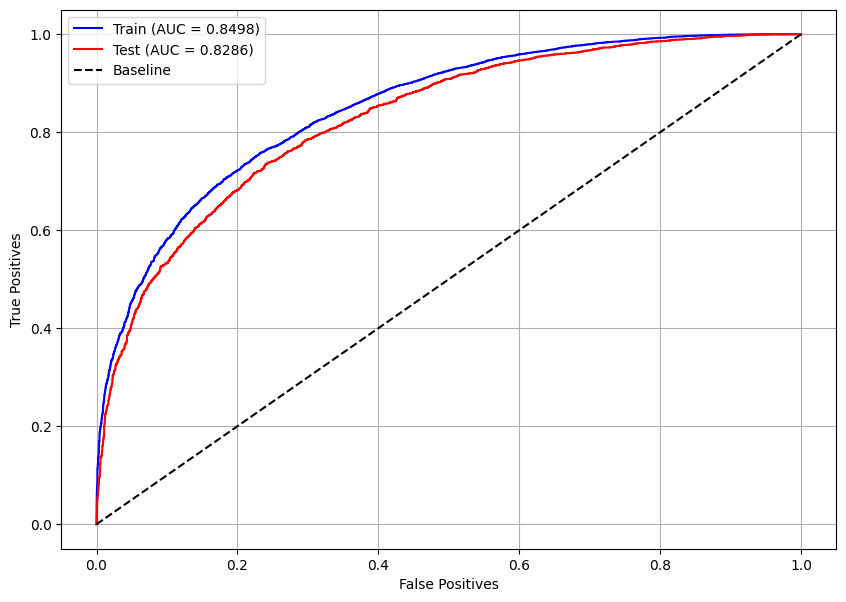

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm, X_train, X_test, y_train, y_test)

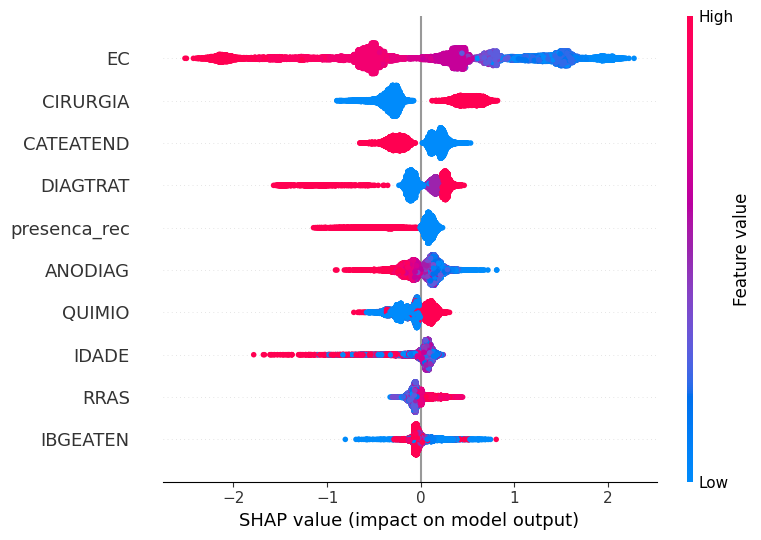

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(lgbm, X_train, feat_cols)

#### **Optuna**

In [ ]:
# Creating stratified folds with the same class proportions
skf = StratifiedKFold(10, shuffle=True, random_state=seed)

# Function defining the model and its hyperparameters, which will be optimized
# to maximize the evaluation metric
def objective(trial):

    # Hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 50, 150)  # Number of trees
    max_depth = trial.suggest_int('max_depth', 3, 4)  # Maximum tree depth
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.2, step=0.01)  # Learning rate
    min_child_weight = trial.suggest_int('min_child_weight', 1, 7)  # Minimum sum of weights in a child node
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.3, 0.7, step=0.1)  # Fraction of features sampled per tree

    # LightGBM classifier with suggested hyperparameters
    cls = LGBMClassifier(n_estimators=n_estimators,
                         max_depth=max_depth,
                         learning_rate=learning_rate,
                         min_child_weight=min_child_weight,
                         colsample_bytree=colsample_bytree,
                         random_state=seed,
                         verbose=-1,
                         n_jobs=-1)

    # Performing cross-validation and returning the mean accuracy score
    return cross_val_score(cls, X_train, y_train,
                           cv=skf, scoring='accuracy').mean()

##### RandomSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=RandomSampler(seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 129,
 'max_depth': 4,
 'learning_rate': 0.13,
 'min_child_weight': 7,
 'colsample_bytree': 0.4}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(1.16, 1.18, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:1, 1:i}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

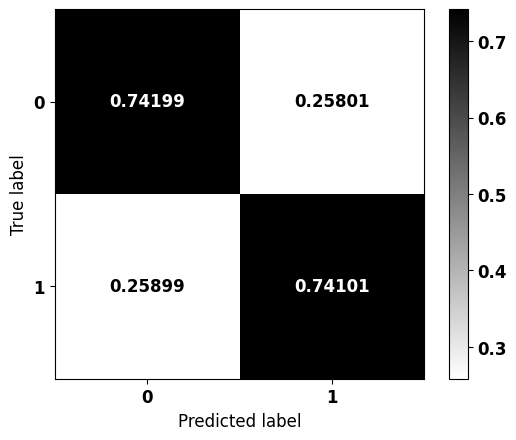


              precision    recall  f1-score   support

           0    0.68396   0.74199   0.71179      2310
           1    0.79175   0.74101   0.76554      3058

    accuracy                        0.74143      5368
   macro avg    0.73786   0.74150   0.73867      5368
weighted avg    0.74537   0.74143   0.74241      5368



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1.173, 1:1}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_rand = LGBMClassifier(verbose=-1)
lgbm_rand.set_params(**params)

# Training the optimized model on the training dataset
lgbm_rand.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_rand, X_test, y_test)

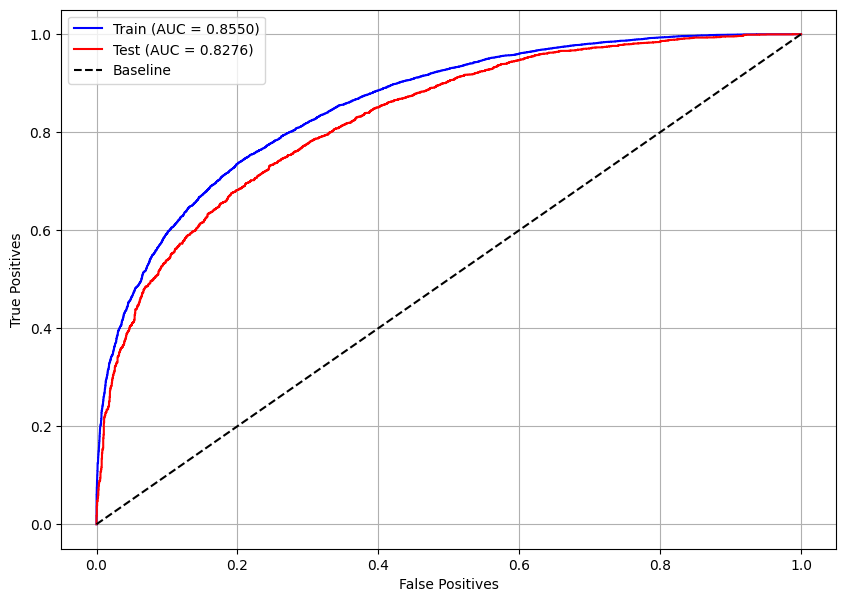

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_rand, X_train, X_test, y_train, y_test)

##### TPESampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=TPESampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 125,
 'max_depth': 4,
 'learning_rate': 0.18,
 'min_child_weight': 1,
 'colsample_bytree': 0.3}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(1.17, 1.19, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:1, 1:i}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

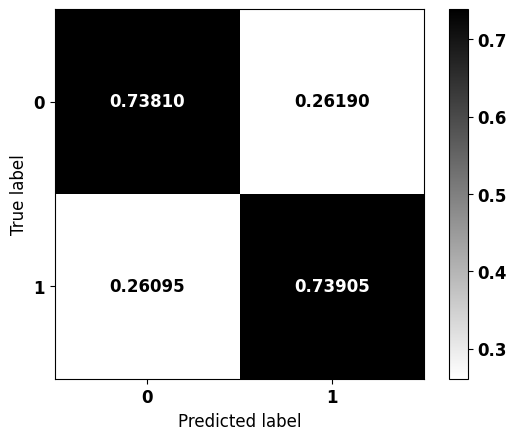


              precision    recall  f1-score   support

           0    0.68118   0.73810   0.70850      2310
           1    0.78883   0.73905   0.76313      3058

    accuracy                        0.73864      5368
   macro avg    0.73501   0.73857   0.73581      5368
weighted avg    0.74251   0.73864   0.73962      5368



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1.1715, 1:1}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_tpe = LGBMClassifier(verbose=-1)
lgbm_tpe.set_params(**params)

# Training the optimized model on the training dataset
lgbm_tpe.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_tpe, X_test, y_test)

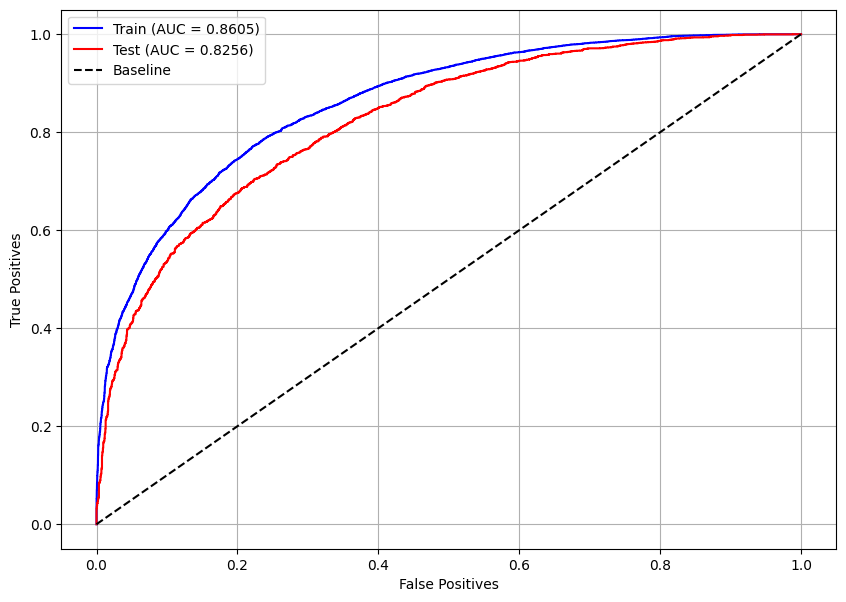

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_tpe, X_train, X_test, y_train, y_test)

##### CmaEsSampler

In [ ]:
# Creating an Optuna study to optimize hyperparameters for the LightGBM model
studyLGBM = optuna.create_study(direction='maximize', sampler=CmaEsSampler(seed=seed))

# Running the optimization process with 100 trials using parallel computation
studyLGBM.optimize(objective, n_trials=100, n_jobs=-1)

In [ ]:
# Best parameters
studyLGBM.best_params

{'n_estimators': 125,
 'max_depth': 4,
 'learning_rate': 0.14,
 'min_child_weight': 7,
 'colsample_bytree': 0.4}

In [ ]:
# Generating a range of class_weight values to fine-tune the model
pesos = np.round(np.arange(1.17, 1.19, 0.0001), 4)

# Extracting the best parameters from the Optuna study
params = studyLGBM.best_params
params['random_state'] = seed

# Iterating over the defined scale_pos_weight values to find the optimal balance
for i in pesos:
    params['class_weight'] = {0:1, 1:i}  # Updating the weight parameter

    # Creating and configuring the LightGBM classifier with the updated parameters
    lgbm_optuna = LGBMClassifier(verbose=-1)
    lgbm_optuna.set_params(**params)

    # Training the model on the training dataset
    lgbm_optuna.fit(X_train, y_train)

    # Making predictions on the test dataset
    y_pred = lgbm_optuna.predict(X_test)

    # Computing the confusion matrix and extracting true negative (tn) and true positive (tp) rates
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, normalize='true').ravel()

    # Checking if the absolute difference between tn and tp is within an acceptable threshold
    if abs(tn - tp) <= 0.001:

        print(i)  # Print the selected scale_pos_weight value
        plot_confusion_matrix(lgbm_optuna, X_test, y_test)  # Plot the confusion matrix
        print()

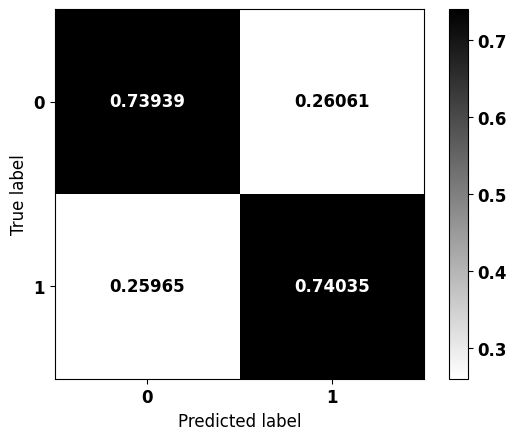


              precision    recall  f1-score   support

           0    0.68265   0.73939   0.70989      2310
           1    0.78995   0.74035   0.76435      3058

    accuracy                        0.73994      5368
   macro avg    0.73630   0.73987   0.73712      5368
weighted avg    0.74378   0.73994   0.74091      5368



In [ ]:
# Defining the final model with the best hyperparameters
params = studyLGBM.best_params  # Extracting the best parameters from the Optuna study
params['random_state'] = seed  # Setting a fixed random state for reproducibility
params['class_weight'] = {0:1.1713, 1:1}  # Assigning the best-found class_weight value

# Initializing the LightGBM classifier with optimized parameters
lgbm_cma = LGBMClassifier(verbose=-1)
lgbm_cma.set_params(**params)

# Training the optimized model on the training dataset
lgbm_cma.fit(X_train, y_train)

# Plotting the confusion matrix to evaluate the model's performance on the test dataset
plot_confusion_matrix(lgbm_cma, X_test, y_test)

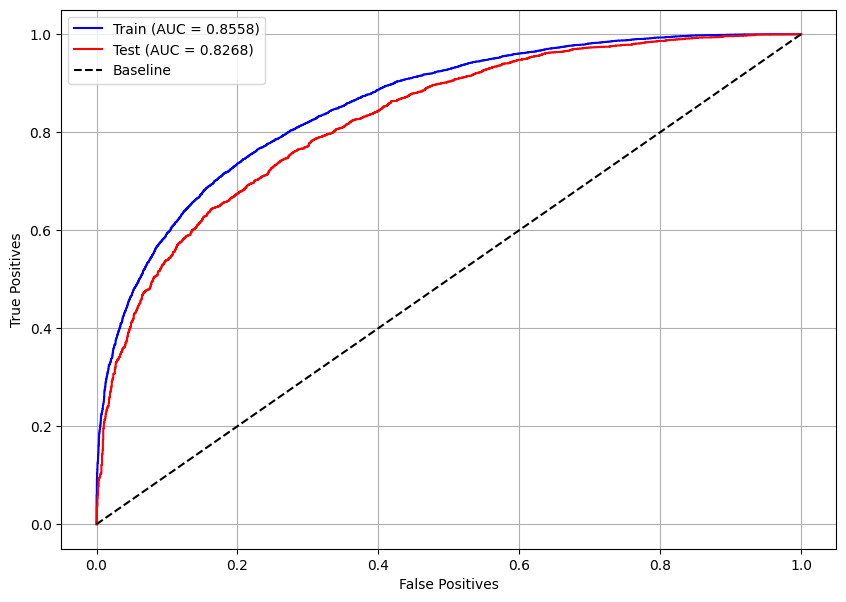

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_cma, X_train, X_test, y_train, y_test)

##### Optimized model

In [ ]:
# Selecting the best model based on performance
models = [lgbm_rand, lgbm_tpe, lgbm_cma]  # List of trained models
best = models[0]  # Initialize the best model as the first in the list

# Iterate through the models to find the one with the highest accuracy score
for i, m in enumerate(models):
    if i == 0:
        continue  # Skip the first model since it's already assigned as 'best'

    best_score = best.score(X_test, y_test)  # Accuracy of the current best model
    score = m.score(X_test, y_test)  # Accuracy of the current model being evaluated

    if score > best_score:  # Update 'best' if the current model has a higher score
        best = m

# Print the best-performing model
print(best)

LGBMClassifier(class_weight={0: 1.173, 1: 1}, colsample_bytree=0.4,
               learning_rate=0.13, max_depth=4, min_child_weight=7,
               n_estimators=129, random_state=7, verbose=-1)


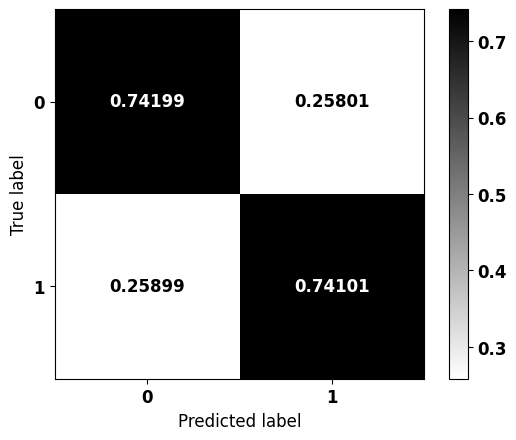


              precision    recall  f1-score   support

           0    0.68396   0.74199   0.71179      2310
           1    0.79175   0.74101   0.76554      3058

    accuracy                        0.74143      5368
   macro avg    0.73786   0.74150   0.73867      5368
weighted avg    0.74537   0.74143   0.74241      5368



In [ ]:
# Training the final XGBoost model using the best parameters
# Retrieve the best hyperparameters from the selected model
params = best.get_params()

# Initialize a new XGBoost classifier with the best parameters
lgbm_optuna = LGBMClassifier(verbose=-1)
lgbm_optuna.set_params(**params)

# Train the optimized model on the training data
lgbm_optuna.fit(X_train, y_train)

# Plot the confusion matrix to evaluate the model's performance on the test set
plot_confusion_matrix(lgbm_optuna, X_test, y_test)

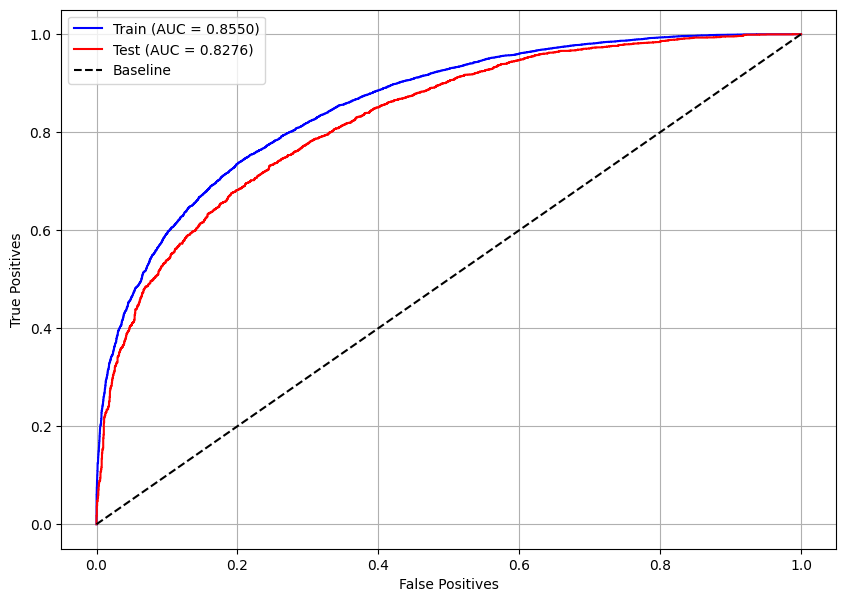

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(lgbm_optuna, X_train, X_test, y_train, y_test)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


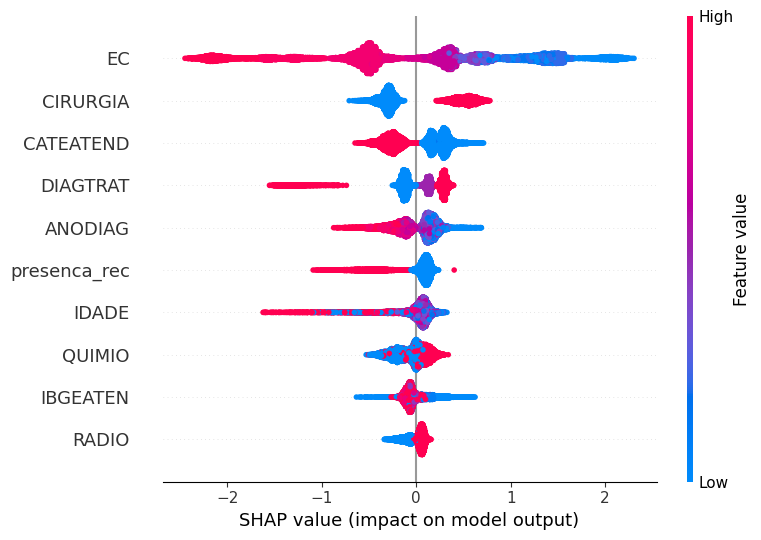

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(lgbm_optuna, X_train, feat_cols)

## **Voting Classifier**


In [ ]:
# Comparing the accuracy scores of the initial XGBoost model and the optimized Optuna model
xgb_score = xgb.score(X_test, y_test)
optuna_score = xgb_optuna.score(X_test, y_test)
print(f'Accuracy: XGB = {xgb_score:.4f}, Optuna = {optuna_score:.4f}\n')

# Determine which model performed better
if optuna_score >= xgb_score:
    params_xgb = xgb_optuna.get_params()  # Get the parameters of the optimized model
    print('Optimized model won')
else:
    params_xgb = xgb.get_params()  # Get the parameters of the initial model
    print('Initial model won')

Accuracy: XGB = 0.7360, Optuna = 0.7424

Otimizado venceu


In [ ]:
# Comparing the accuracy scores of the initial LightGBM model and the optimized Optuna model
lgbm_score = lgbm.score(X_test, y_test)
optuna_score = lgbm_optuna.score(X_test, y_test)
print(f'Accuracy: LGBM = {lgbm_score:.4f}, Optuna = {optuna_score:.4f}\n')

# Determine which model performed better
if optuna_score >= lgbm_score:
    params_lgbm = lgbm_optuna.get_params()  # Get the parameters of the optimized model
    print('Optimized model won')
else:
    params_lgbm = lgbm.get_params()  # Get the parameters of the initial model
    print('Initial model won')

Accuracy: LGBM = 0.7444, Optuna = 0.7414

Modelo inicial venceu


In [ ]:
# Creating the models with the best-performing hyperparameters
# XGBoost Model
best_xgb = XGBClassifier()  # Instantiate the XGBoost classifier
best_xgb.set_params(**params_xgb)  # Set the best hyperparameters for XGBoost

# LightGBM Model
best_lgbm = LGBMClassifier()  # Instantiate the LightGBM classifier
best_lgbm.set_params(**params_lgbm)  # Set the best hyperparameters for LightGBM

LGBMClassifier(class_weight={0: 1.154, 1: 1}, importance_type='gain',
               max_depth=4, random_state=7, verbose=-1)

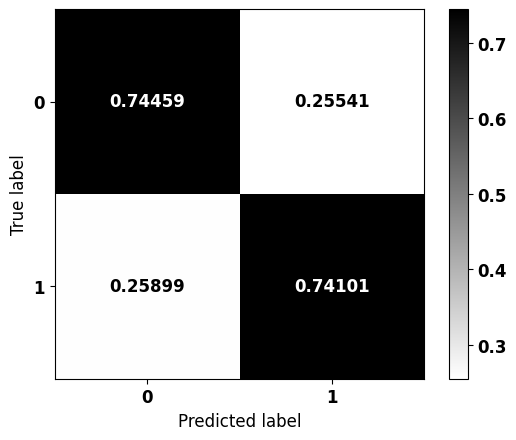


              precision    recall  f1-score   support

           0    0.68471   0.74459   0.71340      2310
           1    0.79342   0.74101   0.76632      3058

    accuracy                        0.74255      5368
   macro avg    0.73907   0.74280   0.73986      5368
weighted avg    0.74664   0.74255   0.74354      5368



In [ ]:
from sklearn.ensemble import VotingClassifier

# Creating and training the voting classifier model
clf = VotingClassifier(
    estimators=[('XGBoost', best_xgb),  # Adding the best XGBoost model
               ('LightGBM', best_lgbm)],  # Adding the best LightGBM model
    voting='soft'  # Using 'soft' voting, which predicts the class label based on predicted probabilities
)

clf.fit(X_train, y_train)  # Train the voting classifier on the training data

# Confusion Matrix
plot_confusion_matrix(clf, X_test, y_test)  # Plot the confusion matrix for the voting classifier on the test data

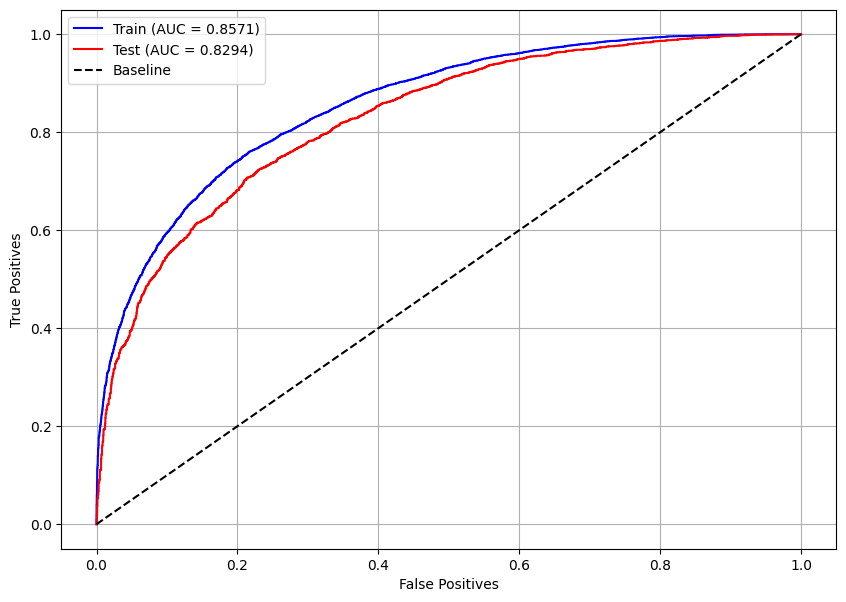

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(clf, X_train, X_test, y_train, y_test)

## **Tests with other cancer types**

In [ ]:
# Best Model Selection
models = [xgb, xgb_optuna, lgbm, lgbm_optuna]  # List of models to compare (XGBoost, optimized XGBoost, LightGBM, optimized LightGBM)

# Iterating through each model to find the best performing one
for i, m in enumerate(models):
    if i == 0:  # Initialize the best model as the first one
        best = m
    else:
        # Compare the performance of the current best model and the current model
        best_score = best.score(X_test, y_test)  # Get the accuracy of the current best model on the test set
        score = m.score(X_test, y_test)  # Get the accuracy of the current model on the test set
        if score > best_score:  # If the current model performs better, update the best model
            best = m

# Print the best performing model
print(best)

LGBMClassifier(class_weight={0: 1.154, 1: 1}, importance_type='gain',
               max_depth=4, random_state=7, verbose=-1)


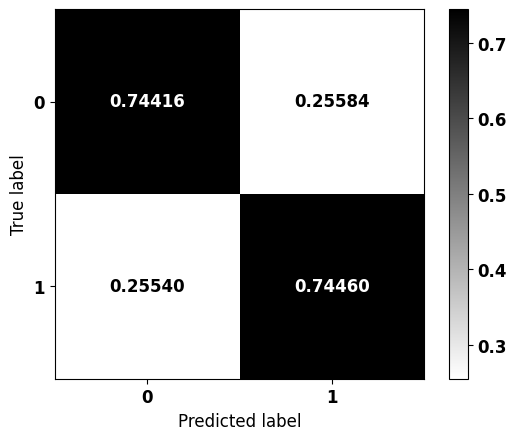


              precision    recall  f1-score   support

           0    0.68760   0.74416   0.71476      2310
           1    0.79393   0.74460   0.76848      3058

    accuracy                        0.74441      5368
   macro avg    0.74077   0.74438   0.74162      5368
weighted avg    0.74817   0.74441   0.74536      5368



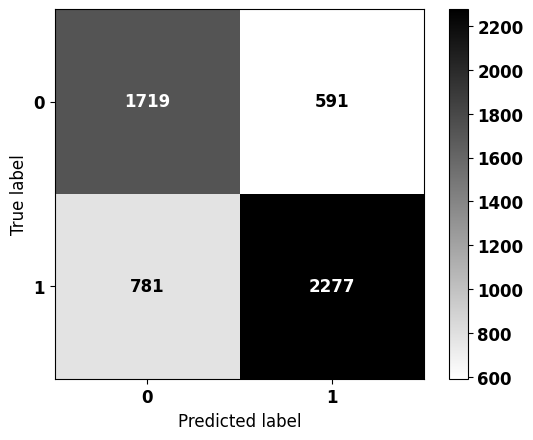


              precision    recall  f1-score   support

           0    0.68760   0.74416   0.71476      2310
           1    0.79393   0.74460   0.76848      3058

    accuracy                        0.74441      5368
   macro avg    0.74077   0.74438   0.74162      5368
weighted avg    0.74817   0.74441   0.74536      5368



In [ ]:
# Confusion Matrix for the Best Model
plot_confusion_matrix(best, X_test, y_test)  # Plot the normalized confusion matrix for the best model
plot_confusion_matrix(best, X_test, y_test, norm=False)  # Plot the unnormalized confusion matrix for the best model

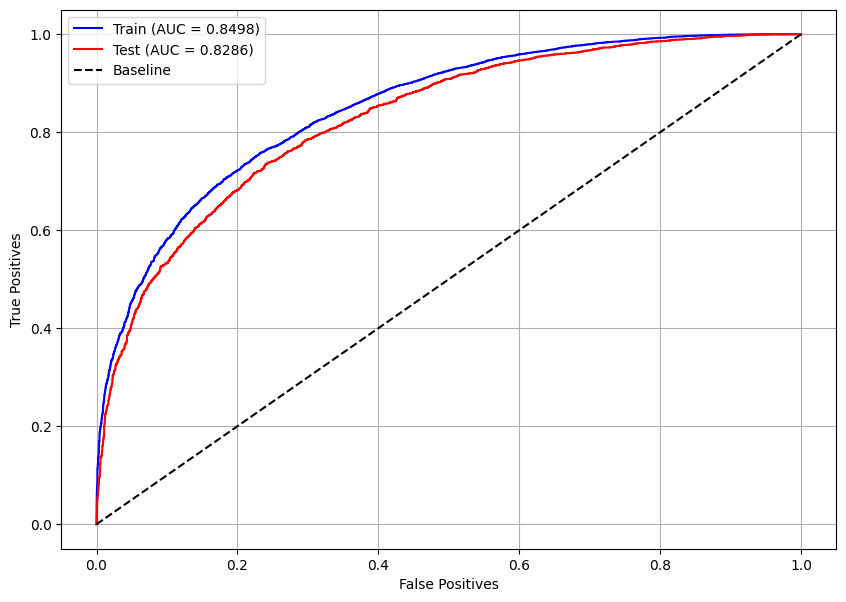

In [ ]:
# ROC Curve
# Plot the Receiver Operating Characteristic (ROC) curve
# to evaluate the model's performance in distinguishing between classes
plot_roc_curve(best, X_train, X_test, y_train, y_test)

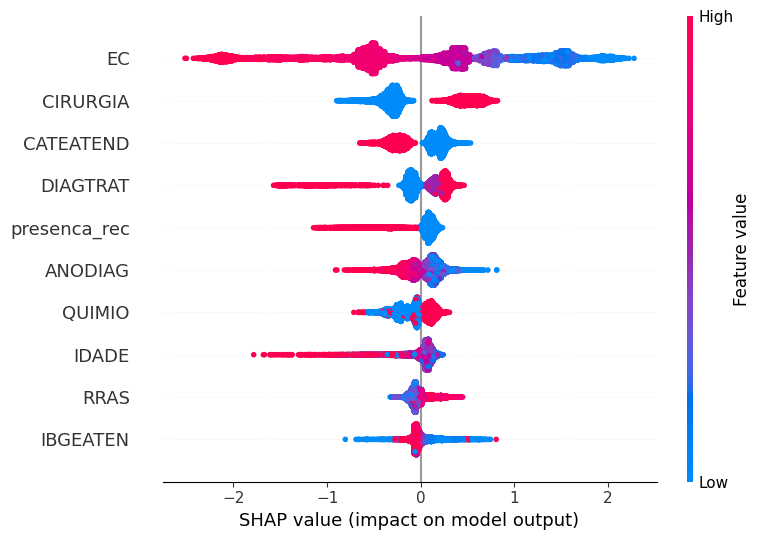

In [ ]:
# Feature Importance using SHAP values
# Plot the SHAP (SHapley Additive exPlanations) values
# to analyze the contribution of each feature to the model's predictions
plot_shap_values(best, X_train, feat_cols)

In [ ]:
# Download test data
!gdown 194o9VVsCwcnt3Cp1oBbJdd0Sb_N2LOIF  # Download the test dataset - More Frequent

# Load the dataset
df_teste = pd.read_csv('incid_teste.csv')

# Split the test data based on cancer types
mama_teste = df_teste[df_teste.TOPOGRUP.isin(['Mama'])]
pele_teste = df_teste[df_teste.TOPOGRUP.isin(['Pele'])]
prost_teste = df_teste[df_teste.TOPOGRUP.isin(['Próstata'])]
colo_teste = df_teste[df_teste.TOPOGRUP.isin(['Colorretal'])]
pulm_teste = df_teste[df_teste.TOPOGRUP.isin(['Pulmão'])]
colo_utero_teste = df_teste[df_teste.TOPOGRUP.isin(['Colo de Útero'])]

# Check the shapes of the resulting subsets
mama_teste.shape, pele_teste.shape, prost_teste.shape, colo_teste.shape, pulm_teste.shape, colo_utero_teste.shape

### **Breast**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'mama_teste' DataFrame
saida_mama = mama_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
mama_teste = mama_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'mama_teste' DataFrame
print(mama_teste.shape)
mama_teste.head(3)

(26133, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
2,-0.623264,0.078323,-0.758504,1.270371,-0.915765,-1.584428,0.5453,1.015205,-1.536653,0.848079,...,2.956862,-0.190274,-0.446767,-0.851058,-0.888302,0.743452,-0.803767,0.967430,-1.048322,-0.51497
10,-0.549923,0.078323,1.068808,-0.747659,-0.915765,-0.339226,0.5453,1.015205,0.650765,0.848079,...,2.956862,-0.190274,-1.367290,1.932872,-0.205138,-1.642306,-0.803767,-0.940442,-1.048322,-0.51497
11,0.110146,0.078323,0.854448,1.270371,-0.915765,-1.584428,0.5453,1.015205,0.650765,0.848079,...,1.273530,-0.190274,-1.735499,-0.851058,-0.660580,0.743452,0.599581,1.921366,0.953905,-0.51497


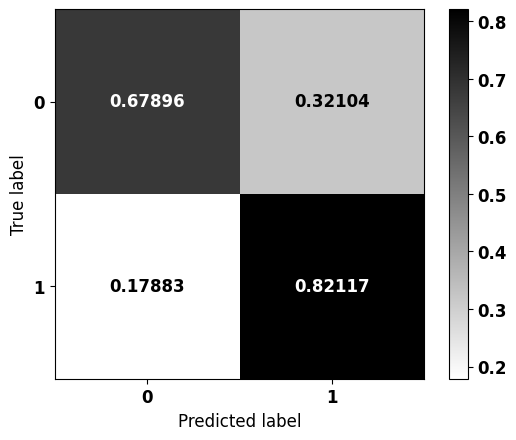


              precision    recall  f1-score   support

           0    0.48417   0.67896   0.56525      5180
           1    0.91187   0.82117   0.86415     20953

    accuracy                        0.79298     26133
   macro avg    0.69802   0.75006   0.71470     26133
weighted avg    0.82709   0.79298   0.80490     26133



In [ ]:
# Plot the confusion matrix for the best model on the 'mama_teste' dataset
plot_confusion_matrix(best, mama_teste, saida_mama)

### **Skin**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'pele_teste' DataFrame
saida_pele = pele_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
pele_teste = pele_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'pele_teste' DataFrame
print(pele_teste.shape)
pele_teste.head(3)

(25221, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
4,0.324125,-0.916019,-0.841077,1.167751,-0.344597,-0.429061,0.315561,-0.242155,-0.156064,-0.03833,...,0.591376,-0.20941,-0.716428,1.436258,0.636483,-1.212419,0.393904,-1.404163,-0.776427,-0.218179
5,0.701083,-0.916019,0.447649,1.167751,-0.344597,-0.429061,0.315561,-0.242155,-0.156064,-0.03833,...,-0.689569,-0.20941,0.240058,-0.214815,-0.234417,-1.110069,-1.165675,1.588451,-0.776427,-0.218179
7,-0.052834,-0.916019,0.069663,-0.808623,-0.344597,-0.429061,0.315561,-0.242155,-0.156064,-0.03833,...,1.872320,-0.20941,0.813950,-0.398268,0.926783,-1.212419,0.393904,-0.406625,-0.776427,-0.218179


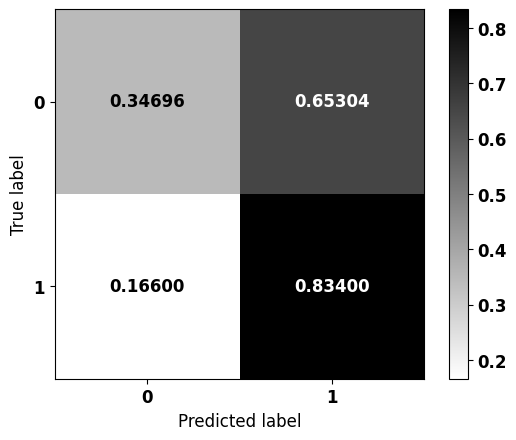


              precision    recall  f1-score   support

           0    0.38426   0.34696   0.36466      5799
           1    0.81051   0.83400   0.82209     19422

    accuracy                        0.72202     25221
   macro avg    0.59739   0.59048   0.59337     25221
weighted avg    0.71250   0.72202   0.71691     25221



In [ ]:
# Plot the confusion matrix for the best model on the 'pele_teste' dataset
plot_confusion_matrix(best, pele_teste, saida_pele)

### **Prostate**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'prost_teste' DataFrame
saida_prost = prost_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
prost_teste = prost_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'prost_teste' DataFrame
print(prost_teste.shape)
prost_teste.head(3)

(20862, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
3,0.149237,0.0,1.316000,-0.695899,0.723032,-0.63168,-0.879627,1.381841,-0.308078,1.085991,...,-0.418644,-0.208982,0.051988,0.032404,1.523967,-0.540997,-0.971798,-0.714113,-0.906043,-0.414926
12,-1.225865,0.0,0.958232,-0.695899,0.723032,0.27992,1.136845,-0.723672,-0.308078,-0.920818,...,-0.418644,-0.208982,0.841591,-1.029723,-0.860966,0.842650,0.451912,0.355595,1.103700,-0.414926
18,-0.423722,0.0,-0.370160,-0.695899,0.723032,-1.99908,-0.879627,1.381841,-0.308078,-0.920818,...,-0.418644,-0.208982,1.236393,0.032404,1.523967,-0.540997,-0.971798,1.425303,-0.906043,-0.414926


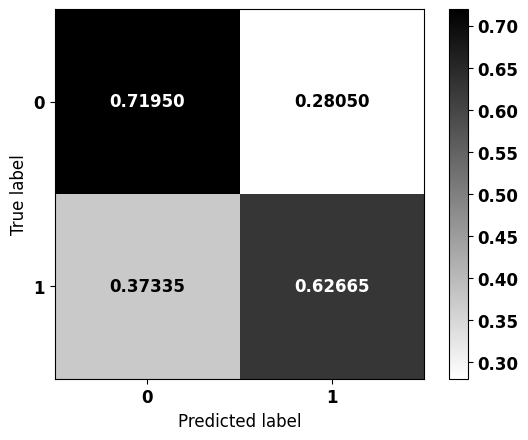


              precision    recall  f1-score   support

           0    0.27069   0.71950   0.39338      3369
           1    0.92063   0.62665   0.74571     17493

    accuracy                        0.64165     20862
   macro avg    0.59566   0.67308   0.56955     20862
weighted avg    0.81567   0.64165   0.68882     20862



In [ ]:
# Plot the confusion matrix for the best model on the 'prost_teste' dataset
plot_confusion_matrix(best, prost_teste, saida_prost)

### **Colorectal**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'colo_teste' DataFrame
saida_colo = colo_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
colo_teste = colo_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'colo_teste' DataFrame
print(colo_teste.shape)
colo_teste.head(3)

(14028, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
0,0.366829,-0.972134,1.141405,1.343451,0.958036,-0.047542,0.60093,-0.567847,0.737288,-0.07854,...,-0.325938,-0.193018,-1.734289,1.587885,0.660606,-1.716753,0.396181,1.180668,-1.03687,-0.475073
1,-0.166349,-0.972134,-0.649610,1.343451,0.958036,-0.873817,0.60093,1.761039,0.737288,-0.07854,...,-0.325938,-0.143566,-0.209650,1.767959,-0.282288,0.900562,-0.968850,0.154944,-1.03687,-0.475073
6,-0.318686,-0.972134,-1.770966,-0.714301,0.958036,1.329585,0.60093,-0.567847,0.737288,-0.07854,...,-0.325938,-0.193018,1.314989,-0.032782,-0.046564,-0.607175,0.396181,2.206391,-1.03687,-0.475073


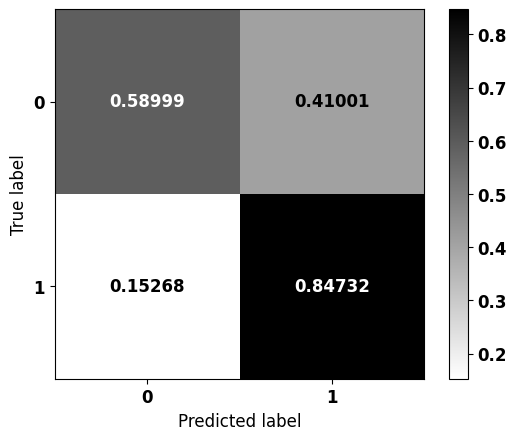


              precision    recall  f1-score   support

           0    0.75763   0.58999   0.66338      6273
           1    0.71869   0.84732   0.77773      7755

    accuracy                        0.73225     14028
   macro avg    0.73816   0.71866   0.72055     14028
weighted avg    0.73610   0.73225   0.72659     14028



In [ ]:
# Plot the confusion matrix for the best model on the 'colo_teste' dataset
plot_confusion_matrix(best, colo_teste, saida_colo)

### **Lung**

In [ ]:
# Separate the target variable 'sobrevida_3anos' from the 'pulm_teste' DataFrame
saida_pulm = pulm_teste.sobrevida_3anos

# Drop columns that are not needed for prediction
pulm_teste = pulm_teste.drop(columns=['TOPOGRUP', 'sobrevida_3anos'])

# Check the new shape and display the first few rows of the updated 'pulm_teste' DataFrame
print(pulm_teste.shape)
pulm_teste.head(3)

(9252, 23)


,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,CONSDIAG,DIAGTRAT,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec
8,-0.805560,-0.778211,0.751797,-0.853227,1.364883,-0.536078,-0.468319,-0.748999,-1.335116,-0.070691,...,-0.403143,-0.432328,0.663596,-0.846783,-1.881064,0.667417,-1.225737,0.274789,0.973507,-0.407845
27,0.123762,1.284999,0.990635,-0.853227,1.364883,0.640728,-0.468319,-0.748999,0.748999,-0.070691,...,-0.403143,-0.459489,1.022562,-0.846783,-1.171009,0.755208,0.238090,0.274789,-1.027214,2.451912
33,0.960153,-0.778211,0.844979,1.133388,-0.732664,-2.889689,2.135297,-0.748999,-1.335116,-0.070691,...,1.394771,-0.459489,0.304629,-0.846783,-0.697638,0.755208,0.238090,-0.775222,0.973507,2.451912


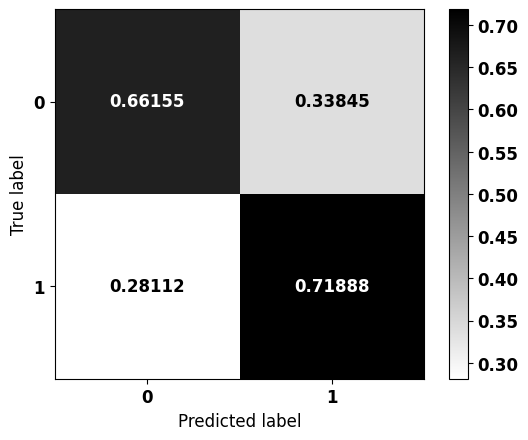


              precision    recall  f1-score   support

           0    0.93802   0.66155   0.77589      8007
           1    0.24827   0.71888   0.36907      1245

    accuracy                        0.66926      9252
   macro avg    0.59314   0.69021   0.57248      9252
weighted avg    0.84520   0.66926   0.72115      9252



In [ ]:
# Plot the confusion matrix for the best model on the 'pulm_teste' dataset
plot_confusion_matrix(best, pulm_teste, saida_pulm)

# **Train and Test DataFrame**

**Train**

In [ ]:
from sklearn.utils import shuffle

# Combine training datasets for different more frequent cancers into a single DataFrame
df_incid_treino = pd.concat([pulm_treino, prost_treino, pele_treino, mama_treino,
                             colo_utero_treino, colo_treino],
                            ignore_index=True)

# Shuffle the combined dataset to randomize the order of samples
df_incid_treino = shuffle(df_incid_treino, random_state=seed)

# Display the first three rows of the shuffled dataset
df_incid_treino.head(3)

,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec,TOPOGRUP,sobrevida_3anos
263928,0.900006,1.028664,-1.095067,-0.714301,0.958036,1.605010,-1.664088,-0.567847,0.737288,-0.078540,...,0.933829,0.327366,0.896330,-1.117133,0.396181,0.154944,0.964441,-0.475073,Colorretal,0
224467,2.017011,0.078323,0.709472,1.270371,-0.915765,-1.584428,0.545300,1.015205,-1.536653,0.848079,...,-1.183185,-0.851058,-1.799187,0.743452,0.599581,-0.940442,-1.048322,-0.514970,Mama,1
92288,0.474908,1.091681,-0.572151,1.167751,-0.344597,1.142798,0.315561,-0.242155,-0.156064,-0.038330,...,-1.672914,-0.765173,0.926783,-0.202185,0.393904,-0.406625,-0.776427,-0.218179,Pele,1


In [ ]:
# Display the shape (number of rows and columns) of the training dataset for more frequent cancers
df_incid_treino.shape

(302582, 25)

In [ ]:
# Retrieve the unique values of the 'TOPOGRUP' column to verify the cancer types present in the dataset
df_incid_treino.TOPOGRUP.unique()

array(['Colorretal', 'Mama', 'Pele', 'Próstata', 'Colo de Útero',
       'Pulmão'], dtype=object)

In [ ]:
# Save the processed training dataset to a CSV file with UTF-8 encoding, excluding the index column
df_incid_treino.to_csv('incid_treino.csv', index=False, encoding='UTF-8')

**Test**

In [ ]:
# Combine test datasets for different more frequent cancers into a single DataFrame
df_incid_teste = pd.concat([pulm_teste, prost_teste, pele_teste, mama_teste,
                            colo_utero_teste, colo_teste],
                           ignore_index=True)

# Shuffle the combined dataset to randomize the order of samples
df_incid_teste = shuffle(df_incid_teste, random_state=seed)

# Display the first three rows of the shuffled dataset
df_incid_teste.head(3)

,IDADE,SEXO,IBGE,CATEATEND,DIAGPREV,EC,CIRURGIA,RADIO,QUIMIO,HORMONIO,...,ANODIAG,DRS,RRAS,IBGEATEN,HABILIT2,ESCOLARI_preench,IBGE_idem_IBGEATEN,presenca_rec,TOPOGRUP,sobrevida_3anos
90021,0.366829,-0.972134,1.141405,1.343451,0.958036,-0.047542,0.60093,-0.567847,0.737288,-0.078540,...,-1.734289,1.587885,0.660606,-1.716753,0.396181,1.180668,-1.036870,-0.475073,Colorretal,1
87293,-0.166349,-0.972134,-0.649610,1.343451,0.958036,-0.873817,0.60093,1.761039,0.737288,-0.078540,...,-0.209650,1.767959,-0.282288,0.900562,-0.968850,0.154944,-1.036870,-0.475073,Colorretal,1
77594,-0.623264,0.078323,-0.758504,1.270371,-0.915765,-1.584428,0.54530,1.015205,-1.536653,0.848079,...,-0.446767,-0.851058,-0.888302,0.743452,-0.803767,0.967430,-1.048322,-0.514970,Mama,1


In [ ]:
# Display the shape (number of rows and columns) of the test dataset for more frequent cancers
df_incid_teste.shape

(100864, 25)

In [ ]:
# Retrieve the unique values of the 'TOPOGRUP' column to verify the cancer types present in the dataset
df_incid_teste.TOPOGRUP.unique()

array(['Colorretal', 'Mama', 'Próstata', 'Pele', 'Pulmão',
       'Colo de Útero'], dtype=object)

In [ ]:
# Save the processed test dataset to a CSV file with UTF-8 encoding, excluding the index column
df_incid_teste.to_csv('incid_teste.csv', index=False, encoding='UTF-8')